# Hospitalizations by State

- comments: false
- author: Ryan Gomez
- toc: true
- categories: [growth, compare, hospitalizations]
- image: images/covid-compare-country-death-hos.png
- permalink: /futureproof-COVID19-us-hosp/

In [446]:
#collapse-hide
# Imports
import os
import pandas as pd
import csv
import kaggle

# other imports
import numpy as np 
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, mean_absolute_error, classification_report
from sklearn.utils.testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning
from copy import copy
import seaborn as sns
from scipy.stats import norm
import matplotlib.dates as mdates
# import matplotlib.colors as mcolors
# import random
# import math
# import time
# from sklearn.linear_model import LinearRegression, BayesianRidge
# from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeRegressor
# from sklearn.svm import SVR
from datetime import date, datetime
from dateutil.parser import parse
import us
# import operator 
# plt.style.use('fivethirtyeight')
import plotly.graph_objects as go
from plotly.subplots import make_subplots
%matplotlib inline 

# Covid Tracking Dataset (w/ hospitalised data)

Source: https://covidtracking.com/

## Load and Clean the Data

In [447]:
#collapse-hide
all_cases = pd.read_csv('https://covidtracking.com/api/v1/states/daily.csv')

# Delete unecessary rows
for row in ['negative', 'pending', 'hash', 'negativeIncrease', 'totalTestResults', 'totalTestResultsIncrease', 'dateChecked', 'fips', 'inIcuCumulative', 'onVentilatorCumulative', 'total', 'posNeg', 'deathIncrease', 'hospitalizedIncrease', 'positiveIncrease']:
    del all_cases[row]

# TODO missing values
#      Do we get avg or missing values, or predict them?
#      See https://developerzen.com/data-mining-handling-missing-values-the-database-bd2241882e72

for i, row in all_cases.iterrows():
    # Set Dates
    s = str(row['date'])
    all_cases.at[i, 'date'] = date(year=int(s[0:4]), month=int(s[4:6]), day=int(s[6:8]))

# Missing death figures means no death reports yet
# These are set to 0
for i, row in all_cases.iterrows():
    if np.isnan(row['death']):
        all_cases.at[i, 'death'] = 0

## Missing values: Retrieving from other datasets or through merging columns (or both)

The following will be done:
- **Active Cases**: Retrieved from JHU dataset and calculating $active = pos-dead-recovered$
- **Beds per State**: Retrieved from External Datasets

In [448]:
#collapse-hide
# TODO Replace active cases with JHU and/or regression model (Selma)
all_cases['active'] = all_cases['positive'] - all_cases['recovered'] - all_cases['death']
# change location of 'active' column
cols = list(all_cases)
cols.insert(3, cols.pop(cols.index('active')))
all_cases = all_cases.loc[:, cols]

In [449]:
#collapse-hide
# Load datasets for US population and Hospital beds per 1000
us_population = pd.read_csv('data/us_population.csv')
hosp_beds = pd.read_csv('data/hospital_beds.csv')
state_abbrev = pd.read_csv('data/us_state_names.csv')

# add state abbreviations to us_population and hospital beds dataframe
for state in state_abbrev['State'].tolist():
    # store state abbreviation in variable
    abbrev = state_abbrev.loc[state_abbrev['State'] == state, 'Abbreviation'].tolist()[0]
    # add abbrev to new column 'Abbreviation' in us_population df
    us_population.loc[us_population['State'] == state, 'Abbreviation'] = abbrev
    # add abbrev to new column in hosp_beds df
    hosp_beds.loc[hosp_beds['Location'] == state, 'Abbreviation'] = abbrev
    
# change order of columns of us_population
cols = list(us_population)
cols.insert(2, cols.pop(cols.index('Abbreviation')))
us_population = us_population.loc[:, cols]

# drop unnecessary columns of us_population
us_population = us_population.drop(columns=['rank', 'Growth', 'Pop2018', 'Pop2010', 'growthSince2010', 'Percent', 'density'])

# drop unnecessary columns of hosp_beds
hosp_beds = hosp_beds.drop(columns=['Location', 'State/Local Government', 'Non-Profit', 'For-Profit'])

# change order of columns of hosp_beds
cols = list(hosp_beds)
cols.insert(0, cols.pop(cols.index('Abbreviation')))
hosp_beds = hosp_beds.loc[:, cols]

In [450]:
us_population.head()

,State,Abbreviation,Pop
0,Alabama,AL,4908621
1,Alaska,AK,734002
2,Arizona,AZ,7378494
3,Arkansas,AR,3038999
4,California,CA,39937489


In [451]:
hosp_beds.head()

,Abbreviation,Total
0,NaN,2.400
1,AL,3.100
2,AK,2.200
3,AZ,1.900
4,AR,3.200


In [452]:
#collapse-hide
# filter out non-existing states like 'AS'
all_cases = all_cases[all_cases['state'].isin(state_abbrev['Abbreviation'].tolist())]

In [453]:

# see what filtered dataframe looks like
all_cases.head()

,date,state,positive,active,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,onVentilatorCurrently,recovered,dataQualityGrade,...,totalTestsViral,positiveTestsViral,negativeTestsViral,positiveCasesViral,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade
0,2020-07-03,AK,1063.000,509.000,25.000,nan,nan,3.000,539.000,A,...,120208.000,nan,nan,nan,0,0,0,0,0,nan
1,2020-07-03,AL,41865.000,18777.000,812.000,2883.000,nan,nan,22082.000,B,...,nan,nan,nan,41362.000,0,0,0,0,0,nan
2,2020-07-03,AR,22622.000,6177.000,285.000,1517.000,nan,70.000,16164.000,A,...,nan,nan,nan,22622.000,0,0,0,0,0,nan
4,2020-07-03,AZ,91858.000,79592.000,3013.000,5018.000,741.000,489.000,10478.000,A+,...,577919.000,nan,nan,91396.000,0,0,0,0,0,nan
5,2020-07-03,CA,248235.000,nan,7024.000,nan,1871.000,nan,nan,B,...,4448176.000,nan,nan,248235.000,0,0,0,0,0,nan


In [454]:
#collapse-hide
# Split dataframes by date
df_split_by_date = dict(tuple(all_cases.groupby('date')))

# Split dataframes by state
df_split_by_state = dict(tuple(all_cases.groupby('state')))

# merge dataframes us_population and all_cases
df_merge_uspop = all_cases.merge(us_population, how='left', left_on='state', right_on='Abbreviation')
df_merge_uspop = df_merge_uspop.drop(columns=['Abbreviation'])
df_merge_uspop = df_merge_uspop.rename(columns={'Pop': 'population'})

# change location of 'population' column
cols = list(df_merge_uspop)
cols.insert(2, cols.pop(cols.index('population')))
df_merge_uspop = df_merge_uspop.loc[:, cols]

# merge dataframes hosp_beds and df_merge_uspop
df_merge_hosp = df_merge_uspop.merge(hosp_beds, how='left', left_on='state', right_on='Abbreviation')
df_merge_hosp = df_merge_hosp.drop(columns=['Abbreviation'])
all_cases = df_merge_hosp.rename(columns={'Total': 'bedsPerThousand'})

In [455]:
all_cases.head()

,date,state,population,positive,active,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,onVentilatorCurrently,recovered,...,negativeTestsViral,positiveCasesViral,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade,State,bedsPerThousand
0,2020-07-03,AK,734002,1063.000,509.000,25.000,nan,nan,3.000,539.000,...,nan,nan,0,0,0,0,0,nan,Alaska,2.200
1,2020-07-03,AL,4908621,41865.000,18777.000,812.000,2883.000,nan,nan,22082.000,...,nan,41362.000,0,0,0,0,0,nan,Alabama,3.100
2,2020-07-03,AR,3038999,22622.000,6177.000,285.000,1517.000,nan,70.000,16164.000,...,nan,22622.000,0,0,0,0,0,nan,Arkansas,3.200
3,2020-07-03,AZ,7378494,91858.000,79592.000,3013.000,5018.000,741.000,489.000,10478.000,...,nan,91396.000,0,0,0,0,0,nan,Arizona,1.900
4,2020-07-03,CA,39937489,248235.000,nan,7024.000,nan,1871.000,nan,nan,...,nan,248235.000,0,0,0,0,0,nan,California,1.800


In [456]:
#collapse-hide
# Calculate the total beds, and add the column
all_cases['total_beds'] = all_cases['population'] / 1000 * all_cases['bedsPerThousand']
# change abbreviations to state names
all_cases = all_cases.rename(columns={'state': 'abbrev'})
all_cases = all_cases.rename(columns={'State': 'state'})                             
# change location of 'state' column
cols = list(all_cases)
cols.insert(1, cols.pop(cols.index('state')))
all_cases = all_cases.loc[:, cols]

In [457]:
all_cases.head()

,date,state,abbrev,population,positive,active,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,onVentilatorCurrently,...,negativeTestsViral,positiveCasesViral,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade,bedsPerThousand,total_beds
0,2020-07-03,Alaska,AK,734002,1063.000,509.000,25.000,nan,nan,3.000,...,nan,nan,0,0,0,0,0,nan,2.200,1614.804
1,2020-07-03,Alabama,AL,4908621,41865.000,18777.000,812.000,2883.000,nan,nan,...,nan,41362.000,0,0,0,0,0,nan,3.100,15216.725
2,2020-07-03,Arkansas,AR,3038999,22622.000,6177.000,285.000,1517.000,nan,70.000,...,nan,22622.000,0,0,0,0,0,nan,3.200,9724.797
3,2020-07-03,Arizona,AZ,7378494,91858.000,79592.000,3013.000,5018.000,741.000,489.000,...,nan,91396.000,0,0,0,0,0,nan,1.900,14019.139
4,2020-07-03,California,CA,39937489,248235.000,nan,7024.000,nan,1871.000,nan,...,nan,248235.000,0,0,0,0,0,nan,1.800,71887.480


- Load and clean JHU data
- Merge JHU dataset with main dataset

In [458]:
#collapse-hide
# This cell takes some time, as it needs to connect to Kaggle Servers to retrieve data
kaggle.api.authenticate()
kaggle.api.dataset_download_files('benhamner/jhucovid19', path='./kaggle/input/jhucovid19/', unzip=True)

In [459]:
#collapse-hide
# Get Time-Series Data of cases as Pandas DataFrame
dir_jhu = './kaggle/input/jhucovid19/csse_covid_19_data/csse_covid_19_daily_reports'

df_list = []
for dirname, _, files in os.walk(dir_jhu):
    for file in files:
        if 'gitignore' not in file and 'README' not in file:
            full_dir = os.path.join(dirname, file)
            df_list.append(pd.read_csv(full_dir))
            
jhu_df = pd.concat(df_list, axis=0, ignore_index=True, sort=True)

# convert Last Update columns to datetime format
jhu_df.loc[:, 'Last Update'] = pd.to_datetime(jhu_df['Last Update']).apply(lambda x: x.date())
jhu_df.loc[:, 'Last_Update'] = pd.to_datetime(jhu_df['Last_Update']).apply(lambda x: x.date())

# Combine Last Update with Last_Update
jhu_df['LastUpdate'] = jhu_df['Last_Update'].combine_first(jhu_df['Last Update'])

# Combine Country/Region with Country_Region
jhu_df['CountryRegion'] = jhu_df['Country/Region'].combine_first(jhu_df['Country_Region'])

# Retrieve only US data
jhu_df = jhu_df[jhu_df['CountryRegion']=='US']

# Combine Province/State with Province_State
jhu_df['ProvinceState'] = jhu_df['Province/State'].combine_first(jhu_df['Province_State'])

# Drop unnecessary columns
jhu_df = jhu_df.drop(['Admin2', 'Lat', 'Latitude', 'Long_', 'Longitude', 'Combined_Key', 'Country/Region',
                      'Country_Region', 'Province/State', 'Province_State',
                      'Last Update', 'Last_Update', 'FIPS'], axis=1)

# Change column order
cols = list(jhu_df)
cols.insert(0, cols.pop(cols.index('CountryRegion')))
cols.insert(1, cols.pop(cols.index('ProvinceState')))
cols.insert(2, cols.pop(cols.index('LastUpdate')))
jhu_df = jhu_df.loc[:, cols]

# Change region to known US states
state_abbrs_dict = {}
for state in us.states.STATES:
    state_abbrs_dict[state.abbr] = state.name

def toState(input_state, mapping):
    abbreviation = input_state.rstrip()[-2:]
    try:
        return_value = mapping[abbreviation]
    except KeyError:
        return_value = input_state
    return return_value

jhu_df['ProvinceState'] = jhu_df['ProvinceState'].apply(lambda x: toState(x, state_abbrs_dict) if x != 'Washington, D.C.' else 'District of Columbia')

# Filter out unknown states
jhu_df = jhu_df[jhu_df['ProvinceState'].isin(all_cases.state.unique().tolist())]

# Merge-sum rows with same date and State
jhu_df = jhu_df.groupby(['LastUpdate', 'ProvinceState']).agg(
    {
        'Active': sum,
        'Confirmed': sum,
        'Deaths': sum,
        'Recovered': sum
    }
).reset_index()

jhu_df.tail()

,LastUpdate,ProvinceState,Active,Confirmed,Deaths,Recovered
5802,2020-07-01,Virginia,61024.000,62787.000,1763.000,0.000
5803,2020-07-01,Washington,31492.000,32824.000,1332.000,0.000
5804,2020-07-01,West Virginia,2812.000,2905.000,93.000,0.000
5805,2020-07-01,Wisconsin,27875.000,28659.000,784.000,0.000
5806,2020-07-01,Wyoming,1467.000,1487.000,20.000,0.000


In [460]:
#collapse-hide
# Now that we have the JHU dataset relatively cleaned
# we can go ahead and merge its data with our main dataset

for i, row in all_cases.iterrows():
    last_update = all_cases.at[i, 'date']
    state = all_cases.at[i, 'state']
    matching_row = jhu_df[jhu_df['ProvinceState'] == state]
    matching_row = matching_row[matching_row['LastUpdate'] == last_update].reset_index()

    if len(matching_row.values) > 0:
        #all_cases.at[i, 'positive'] = matching_row['Confirmed'].values[0]
        all_cases.at[i, 'active'] = matching_row['Active'].values[0]
        #all_cases.at[i, 'recovered'] = matching_row['Recovered'].values[0]   --- JHU was inconsistent, therefore removed
        #all_cases.at[i, 'death'] = matching_row['Deaths'].values[0]

    # Replace unknown recovery numbers with 0
    if np.isnan(row['recovered']):
        all_cases.at[i, 'recovered'] = 0

    if all_cases.at[i, 'active'] == 0 or np.isnan(row['active']):
        positive = all_cases.at[i, 'positive']
        recovered = all_cases.at[i, 'recovered']
        dead = all_cases.at[i, 'death']
        all_cases.at[i, 'active'] = positive - recovered - dead

all_cases.tail()

,date,state,abbrev,population,positive,active,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,onVentilatorCurrently,...,negativeTestsViral,positiveCasesViral,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade,bedsPerThousand,total_beds
6182,2020-01-26,Washington,WA,7797095,2.000,2.000,nan,nan,nan,nan,...,nan,nan,0,0,0,0,0,nan,1.700,13255.061
6183,2020-01-25,Washington,WA,7797095,2.000,2.000,nan,nan,nan,nan,...,nan,nan,0,0,0,0,0,nan,1.700,13255.061
6184,2020-01-24,Washington,WA,7797095,2.000,2.000,nan,nan,nan,nan,...,nan,nan,0,0,0,0,0,nan,1.700,13255.061
6185,2020-01-23,Washington,WA,7797095,2.000,2.000,nan,nan,nan,nan,...,nan,nan,0,0,0,0,0,nan,1.700,13255.061
6186,2020-01-22,Washington,WA,7797095,2.000,2.000,nan,nan,nan,nan,...,nan,nan,0,0,0,0,0,nan,1.700,13255.061


In [461]:
#collapse-hide
# Save formatted dataset offline in case of disaster
dataset_file = 'results/all_cases.csv'
all_cases.to_csv(dataset_file)

In [462]:
#collapse-hide
# convert date to datetime format
all_cases['date'] = pd.to_datetime(all_cases['date'])

# An Exploratory data analysis of the US dataset
# Basic triad of the dataset: validating data types and data integrity of each row


In [463]:
#collapse-hide
dataset_file = 'results/all_cases.csv'
covid_df = pd.read_csv(dataset_file, index_col=0) 
# convert date to datetime format
covid_df['date'] = pd.to_datetime(covid_df['date'])
covid_df.info()
# set float format to 3 decimals
pd.set_option('display.float_format', lambda x: '%.3f' % x)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6187 entries, 0 to 6186
Data columns (total 29 columns):
date                      6187 non-null datetime64[ns]
state                     6187 non-null object
abbrev                    6187 non-null object
population                6187 non-null int64
positive                  6187 non-null float64
active                    6187 non-null float64
hospitalizedCurrently     4057 non-null float64
hospitalizedCumulative    3414 non-null float64
inIcuCurrently            2052 non-null float64
onVentilatorCurrently     1789 non-null float64
recovered                 6187 non-null float64
dataQualityGrade          5253 non-null object
lastUpdateEt              5832 non-null object
dateModified              5832 non-null object
checkTimeEt               5832 non-null object
death                     6187 non-null float64
hospitalized              3414 non-null float64
totalTestsViral           1712 non-null float64
positiveTestsViral        585 

In [464]:
covid_df.head()

,date,state,abbrev,population,positive,active,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,onVentilatorCurrently,...,negativeTestsViral,positiveCasesViral,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade,bedsPerThousand,total_beds
0,2020-07-03,Alaska,AK,734002,1063.000,509.000,25.000,nan,nan,3.000,...,nan,nan,0,0,0,0,0,nan,2.200,1614.804
1,2020-07-03,Alabama,AL,4908621,41865.000,18777.000,812.000,2883.000,nan,nan,...,nan,41362.000,0,0,0,0,0,nan,3.100,15216.725
2,2020-07-03,Arkansas,AR,3038999,22622.000,6177.000,285.000,1517.000,nan,70.000,...,nan,22622.000,0,0,0,0,0,nan,3.200,9724.797
3,2020-07-03,Arizona,AZ,7378494,91858.000,79592.000,3013.000,5018.000,741.000,489.000,...,nan,91396.000,0,0,0,0,0,nan,1.900,14019.139
4,2020-07-03,California,CA,39937489,248235.000,241972.000,7024.000,nan,1871.000,nan,...,nan,248235.000,0,0,0,0,0,nan,1.800,71887.480


The NaN values may indicate that there were no to few Covid-19 patients at these date points.
We further analyse the statistical values of the dataset columns to ensure data integrity and accuracy. 

In [465]:
covid_df.describe()
# TODO rounding up the numbers

,population,positive,active,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,onVentilatorCurrently,recovered,death,hospitalized,...,negativeTestsViral,positiveCasesViral,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade,bedsPerThousand,total_beds
count,6187.000,6187.000,6187.000,4057.000,3414.000,2052.000,1789.000,6187.000,6187.000,3414.000,...,590.000,3347.000,6187.000,6187.000,6187.000,6187.000,6187.000,0.000,6187.000,6187.000
mean,6541047.150,22448.958,20684.635,976.125,4496.786,434.262,216.229,4891.973,1152.022,4496.786,...,319529.515,33575.520,0.000,0.000,0.000,0.000,0.000,nan,2.626,15803.983
std,7386652.501,48404.581,44568.693,1864.136,13066.426,700.329,320.857,11736.161,2995.990,13066.426,...,420218.699,57939.209,0.000,0.000,0.000,0.000,0.000,nan,0.744,16159.025
min,567025.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,...,17.000,0.000,0.000,0.000,0.000,0.000,0.000,nan,1.600,1318.928
25%,1778070.000,698.000,637.000,104.000,238.000,77.000,35.000,0.000,15.000,238.000,...,52213.750,5235.500,0.000,0.000,0.000,0.000,0.000,nan,2.100,3773.952
50%,4499692.000,5544.000,5214.000,394.000,1032.000,168.000,91.000,323.000,163.000,1032.000,...,154207.000,14539.000,0.000,0.000,0.000,0.000,0.000,nan,2.500,11557.920
75%,7797095.000,22753.000,20815.500,938.000,3445.750,453.250,238.000,3413.000,840.000,3445.750,...,399926.000,37408.000,0.000,0.000,0.000,0.000,0.000,nan,3.100,19124.737
max,39937489.000,395872.000,553611.000,18825.000,89995.000,5225.000,2425.000,93572.000,24885.000,89995.000,...,2279841.000,395872.000,0.000,0.000,0.000,0.000,0.000,nan,4.800,71887.480


In [466]:
#collapse-hide
# drop unnecessary columns
covid_cleaned = covid_df.drop(['hospitalized', 'bedsPerThousand'], axis=1)
covid_100k = covid_cleaned.copy()
# list of columns to transform to per 100k
columns_list = ['positive', 'active', 'recovered', 'death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'inIcuCurrently', 'onVentilatorCurrently', 'total_beds']
# add columns per 100k
for column in columns_list:
    if column == 'total_beds':
        covid_100k['BedsPer100k'.format(column)] = (covid_cleaned.loc[:, column] / covid_cleaned.loc[:, 'population']) * 100000
    else:
        covid_100k['{}_100k'.format(column)] = (covid_cleaned.loc[:, column] / covid_cleaned.loc[:, 'population']) * 100000

covid_100k = covid_100k.drop(columns_list, axis=1)

In [467]:
#collapse-hide
covid_100k['date'] = pd.to_datetime(covid_100k['date'])
start_date = '2020-04-18'
end_date = '2020-05-19'
mask = (covid_100k['date'] > start_date) & (covid_100k['date'] <= end_date)
covid_100k_last_month = covid_100k.loc[mask]

In [468]:
#collapse-hide
covid_100k_last_month_part1 =  covid_100k_last_month.groupby('date').sum().loc[:, ['positive_100k','active_100k','recovered_100k','death_100k','hospitalizedCumulative_100k']].diff(periods=1, axis=0)

covid_100k_last_month_part2 = covid_100k_last_month.groupby('date').sum().loc[:, ['inIcuCurrently_100k','onVentilatorCurrently_100k','BedsPer100k']]

final_100k_last_month = covid_100k_last_month_part1.merge(covid_100k_last_month_part2, left_index=True, right_index=True)

In [469]:
final_100k_last_month.head()

,positive_100k,active_100k,recovered_100k,death_100k,hospitalizedCumulative_100k,inIcuCurrently_100k,onVentilatorCurrently_100k,BedsPer100k
date,,,,,,,,
2020-04-19,nan,nan,nan,nan,nan,152.818,80.717,13440.000
2020-04-20,413.759,391.692,35.481,25.728,22.652,155.542,79.710,13440.000
2020-04-21,387.394,360.446,65.218,30.520,31.446,164.605,78.603,13440.000
2020-04-22,428.601,989.954,412.625,28.780,36.181,165.884,78.032,13440.000
2020-04-23,452.031,-2213.482,72.921,26.282,28.842,164.122,94.521,13440.000


In [470]:
final_100k_last_month.describe()

,positive_100k,active_100k,recovered_100k,death_100k,hospitalizedCumulative_100k,inIcuCurrently_100k,onVentilatorCurrently_100k,BedsPer100k
count,30.000,30.000,30.000,30.000,30.000,31.000,31.000,31.000
mean,399.188,364.943,147.172,23.063,39.160,139.595,73.503,13440.000
std,58.939,634.169,81.341,6.102,43.524,17.123,8.141,0.000
min,287.019,-2213.482,35.481,13.053,9.507,109.602,61.622,13440.000
25%,348.980,314.204,80.563,17.951,22.991,126.370,66.261,13440.000
50%,405.026,366.234,127.774,24.119,28.295,140.327,74.706,13440.000
75%,432.647,419.664,212.491,26.243,32.754,151.795,79.157,13440.000
max,544.349,2291.210,412.625,33.917,246.371,165.884,94.521,13440.000


In [471]:
#collapse-hide
# save description cleaned dataset to csv
describe_file = 'results/final_100k_last_month.csv'
final_100k_last_month.describe().to_csv(describe_file)

## Graphical Exploratory Analysis

Plotting histograms, scatterplots and boxplots to assess the distribution of the entire US dataset. 

In [472]:
#collapse-hide

# Omitting the categorical (states/abbreviations) and time columns 
# There must be an easier way for you, but this was the easiest way I could think of
covid_cleaned['date'] = pd.to_datetime(covid_cleaned['date'])
# mask data for last month
start_date = '2020-04-18'
end_date = '2020-05-19'
mask = (covid_cleaned['date'] > start_date) & (covid_cleaned['date'] <= end_date)
covid_cleaned_last_month = covid_cleaned.loc[mask]
plot_df = covid_cleaned_last_month[['population', 'active', 'recovered', 'death', 'hospitalizedCurrently', 'inIcuCurrently', 'onVentilatorCurrently', 'total_beds']]
plot_df_last_month = covid_100k_last_month[['population', 'active_100k', 'recovered_100k', 'death_100k', 'hospitalizedCurrently_100k', 'inIcuCurrently_100k', 'onVentilatorCurrently_100k', 'BedsPer100k']]

In [473]:
#collapse-hide

timeseries_usa_df = covid_100k.loc[:, ['date', 'positive_100k', 'active_100k', 'recovered_100k', 'death_100k', 'hospitalizedCurrently_100k', 'inIcuCurrently_100k', 'onVentilatorCurrently_100k', 'BedsPer100k']].groupby('date').sum().reset_index()
# timeseries_usa_df['log_positive'] = np.log(timeseries_usa_df['positive_100k'])
# timeseries_usa_df['log_active'] = np.log(timeseries_usa_df['active_100k'])
# timeseries_usa_df['log_recovered'] = np.log(timeseries_usa_df['recovered_100k'])
# timeseries_usa_df['log_death'] = np.log(timeseries_usa_df['death_100k'])

In [32]:
timeseries_usa_df.tail()

,date,positive_100k,active_100k,recovered_100k,death_100k,hospitalizedCurrently_100k,inIcuCurrently_100k,onVentilatorCurrently_100k,BedsPer100k
159,2020-06-29,35834.140,34810.986,13269.151,1605.037,416.665,67.216,32.901,13440.000
160,2020-06-30,36369.224,33327.208,13616.885,1612.910,430.910,66.869,33.482,13440.000
161,2020-07-01,36972.209,34868.331,13814.722,1622.259,443.622,67.228,34.721,13440.000
162,2020-07-02,37608.249,21593.275,14384.117,1630.857,452.273,69.727,35.282,13440.000
163,2020-07-03,38289.967,22177.125,14473.039,1639.803,451.256,71.286,34.451,13440.000


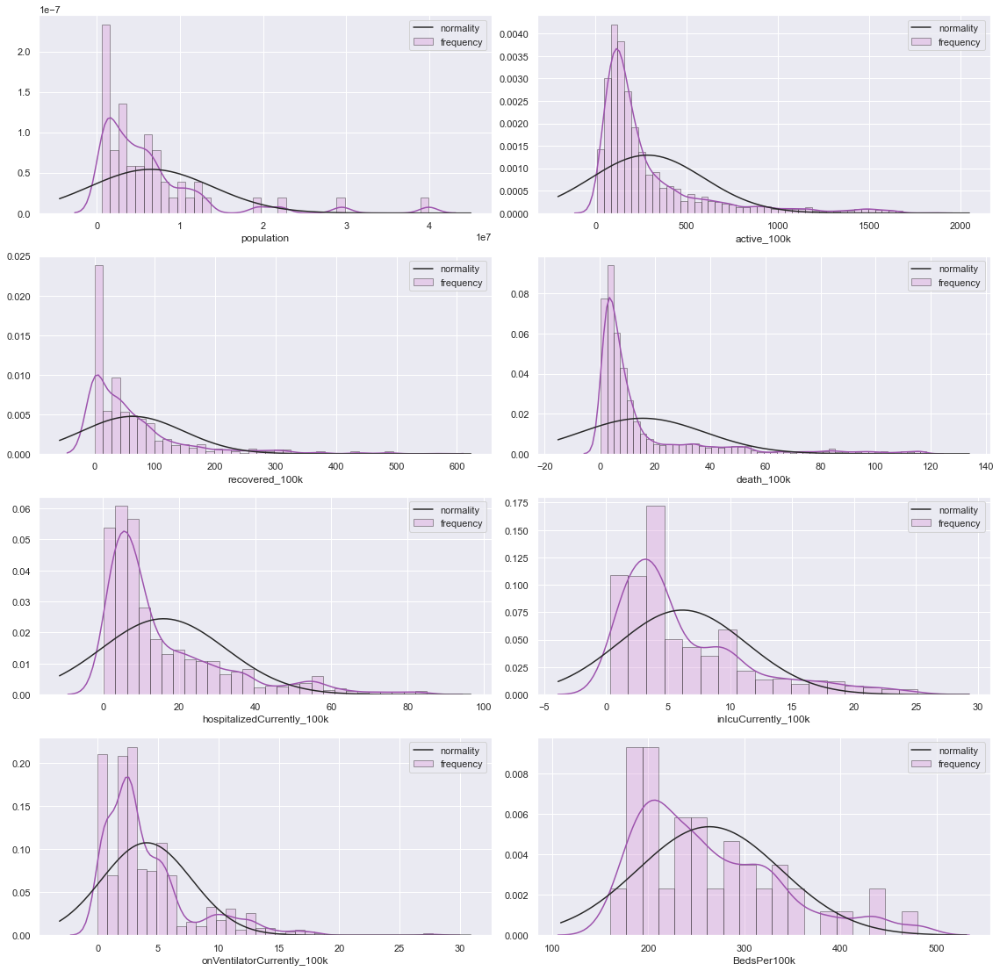

In [474]:
#collapse-hide

# get data from last day
# plot_df_last_date = plot_df.loc[covid_df['date'] == '2020-05-18'] 

# Plotting histograms to gain insight of the distribution shape, skewness and scale
fig, axs = plt.subplots(4,2,figsize = (16, 16))
sns.set()
for i, column in enumerate(plot_df_last_month.columns):
    if (i + 1) % 2 == 0:
        ax = axs[(i//2), 1]
    else:
        ax = axs[(i//2), 0]
    sns.distplot(plot_df_last_month[column], fit=norm, fit_kws=dict(label='normality'), hist_kws=dict(color='plum', edgecolor='k', linewidth=1, label='frequency'), ax=ax, color='#9d53ad')
    ax.legend(loc='upper right')
plt.tight_layout()
fig.subplots_adjust(top=0.95)

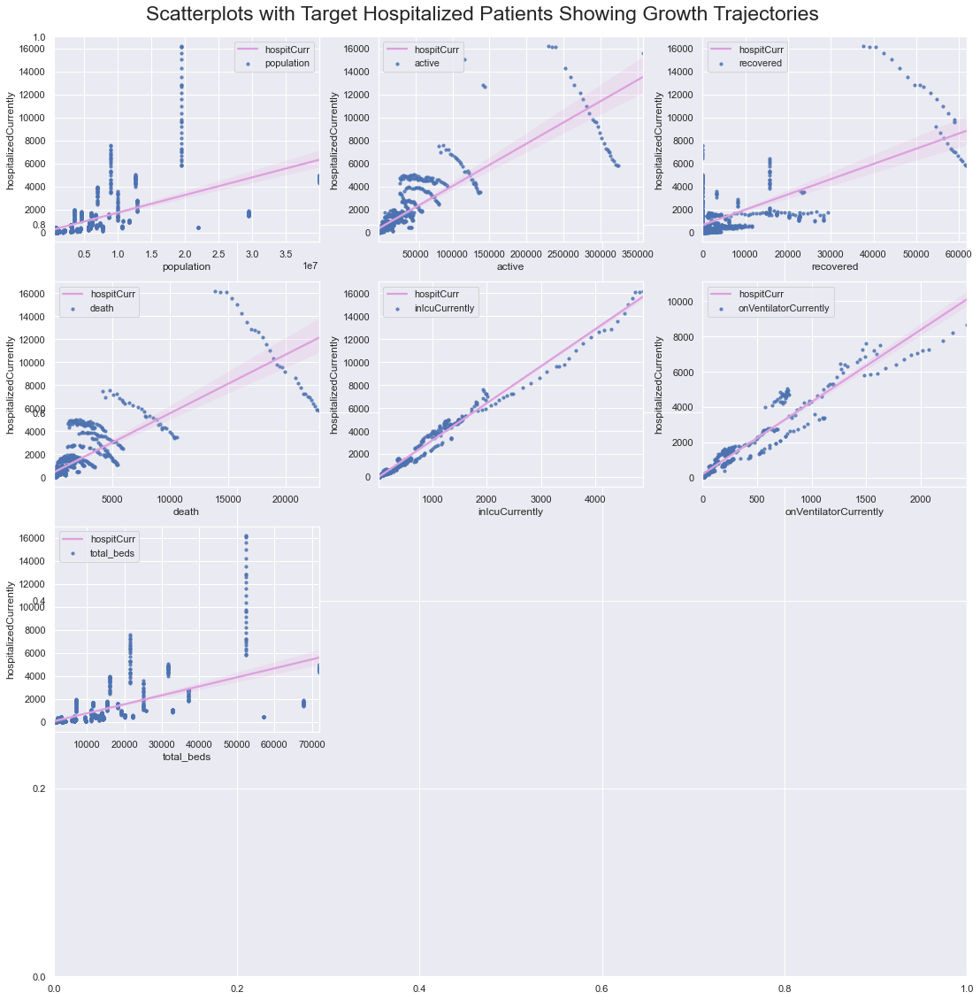

In [475]:
#collapse-hide

# Looking at linearity and variance with scatterplots
# Removing the target variable and saving it in another df
target = plot_df.hospitalizedCurrently
indep_var = plot_df.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var.columns):
    ax=fig.add_subplot(4, 3, i+1) 
    sns.regplot(x=indep_var[col], y=target, data=indep_var, label=col, scatter_kws={'s':10}, line_kws={"color": "plum", 'label': 'hospitCurr'})
    plt.suptitle('Scatterplots with Target Hospitalized Patients Showing Growth Trajectories', fontsize=23)
    plt.legend()
plt.tight_layout()
fig.subplots_adjust(top=0.95)

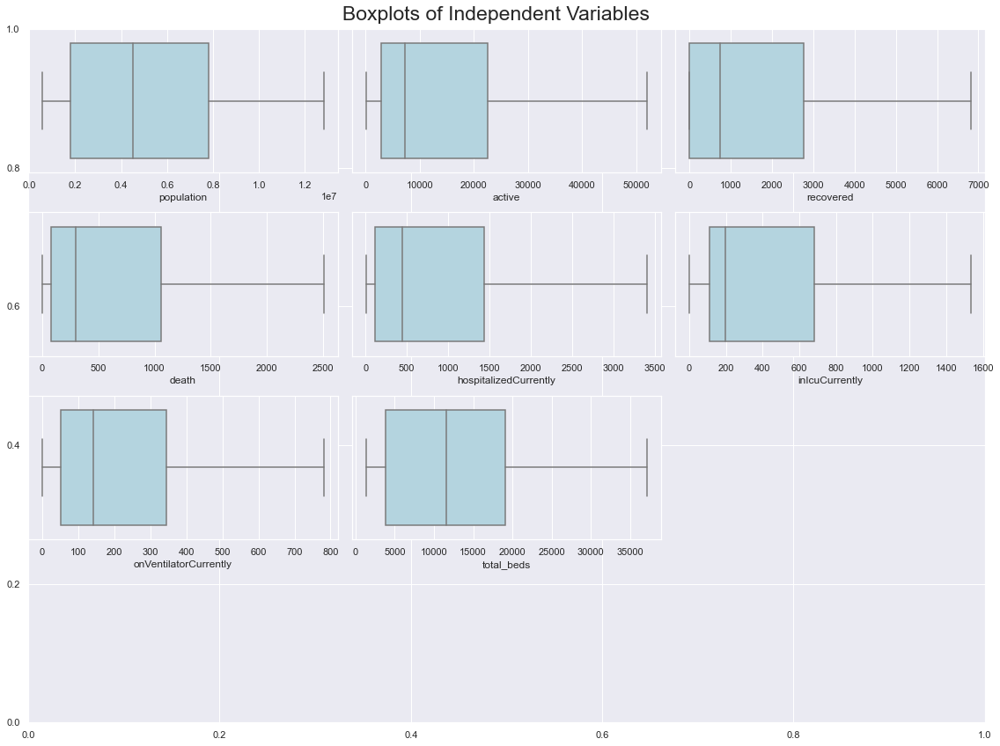

In [476]:
#collapse-hide

# Assessing the normality of the distribution with a boxplot
# Boxplot with removed outliers
fig, ax = plt.subplots(figsize = (16, 12))
for i, col in enumerate(plot_df.columns):
    ax=fig.add_subplot(4, 3, i+1) 
    sns.boxplot(x=plot_df[col], data=plot_df, color='lightblue', showfliers=False)
    plt.suptitle('Boxplots of Independent Variables', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

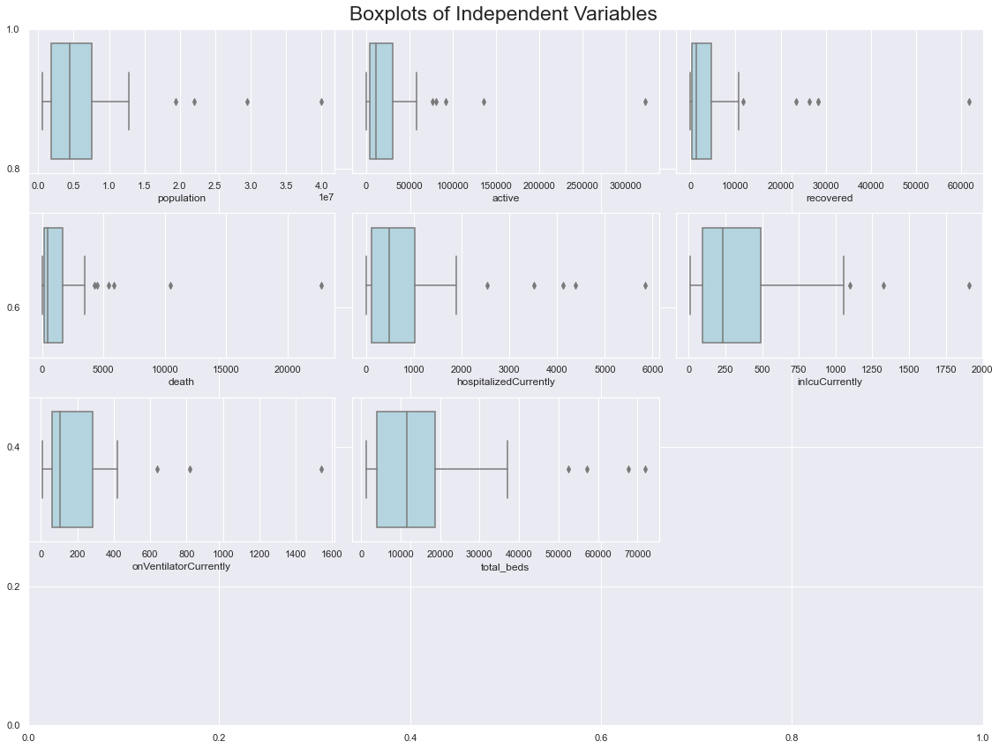

In [477]:
#collapse-hide

# get data from last day
plot_df_last_date = plot_df.loc[covid_df['date'] == '2020-05-18'] 

fig, ax = plt.subplots(figsize = (16, 12))
for i, col in enumerate(plot_df_last_date.columns):
    ax=fig.add_subplot(4, 3, i+1) 
    sns.boxplot(x=plot_df_last_date[col], data=plot_df, color='lightblue', showfliers=True)
    plt.suptitle('Boxplots of Independent Variables', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

## Analysis of Hospitalizations by State
### Since the normality of the independent variables is highly variable do to temporal and precision differences from each state, we further assess each state's data by viewing trends on the independent variables in both scatter and box-and-whisker plots.  


### Alabama

In [478]:
#hide_input
bama = covid_df.loc[(covid_df['abbrev'] == 'AL') & (covid_df['state']== 'Alabama')] 


Text(0, 0.5, 'No. Patients')

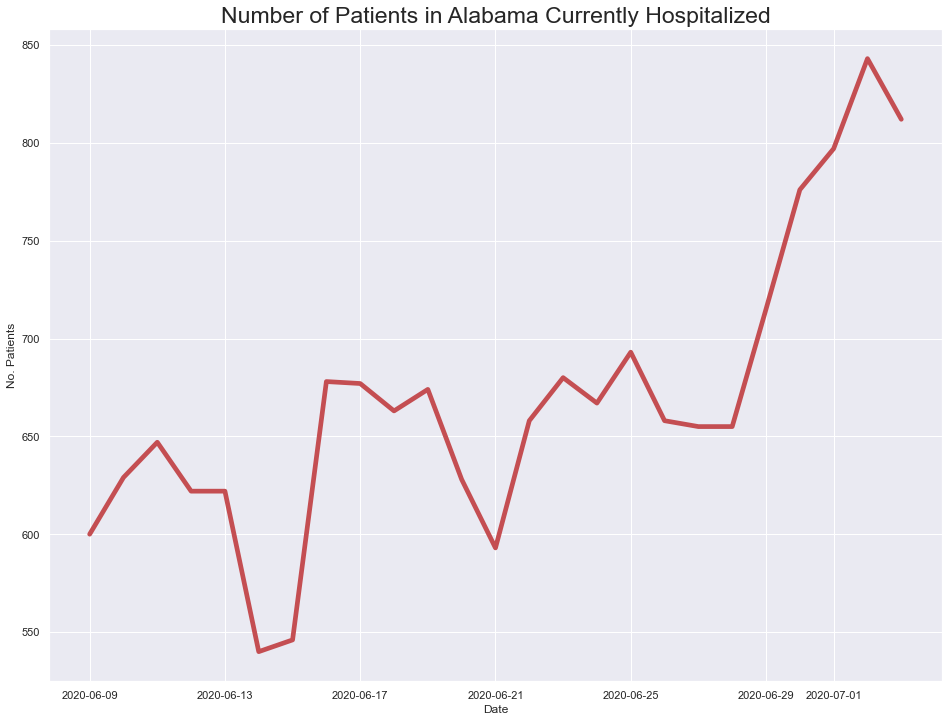

In [479]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(bama.date, bama.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Alabama Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

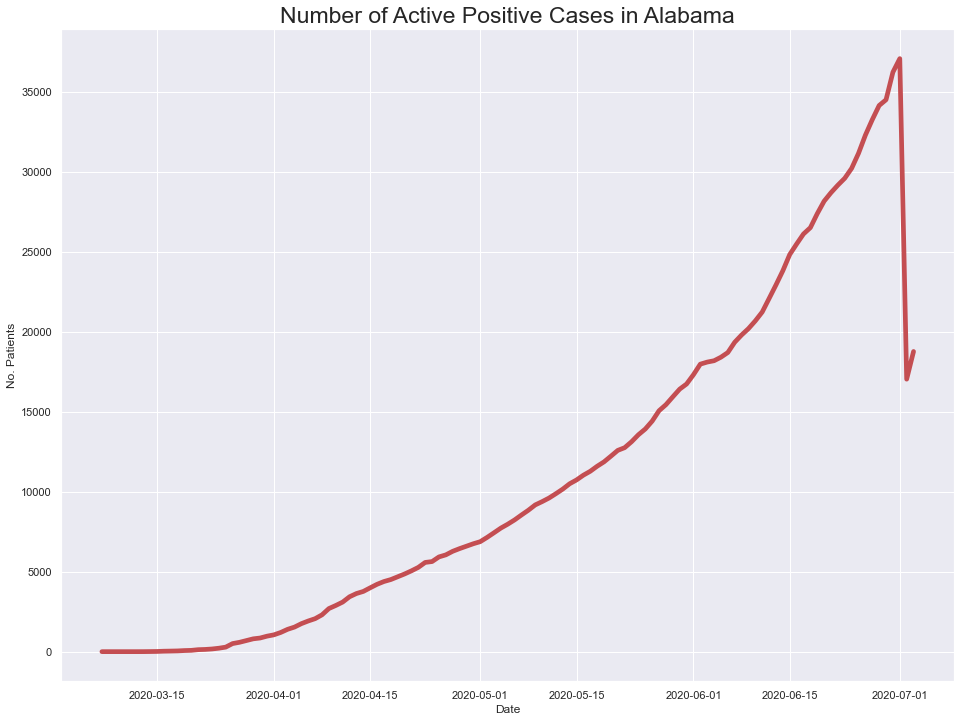

In [480]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(bama.date, bama.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Alabama', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

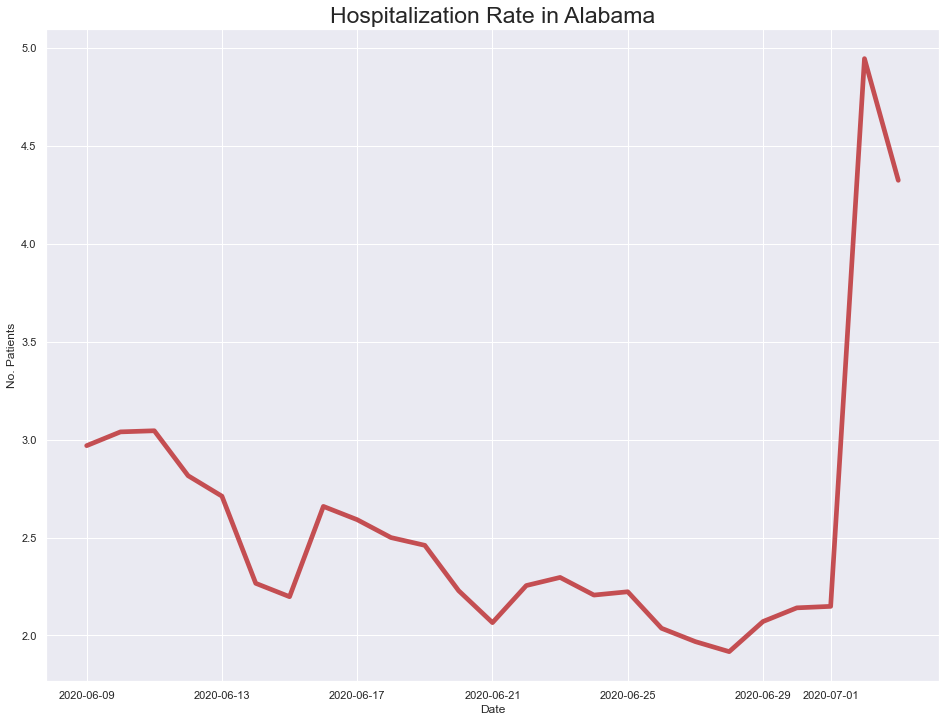

In [481]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(bama.date, bama.hospitalizedCurrently/bama.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Alabama', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

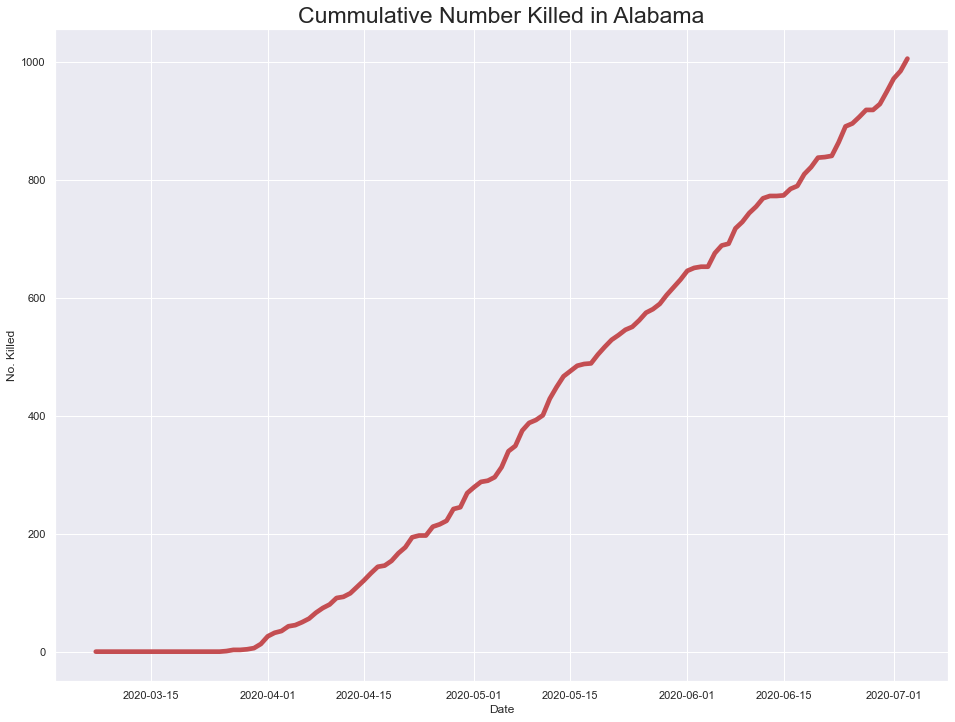

In [482]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(bama.date, bama.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Alabama', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [483]:
#hide_input
# Checking which cols have NaN values
bama[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
bama.head()

# Omit the NaN cols
bama = bama[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

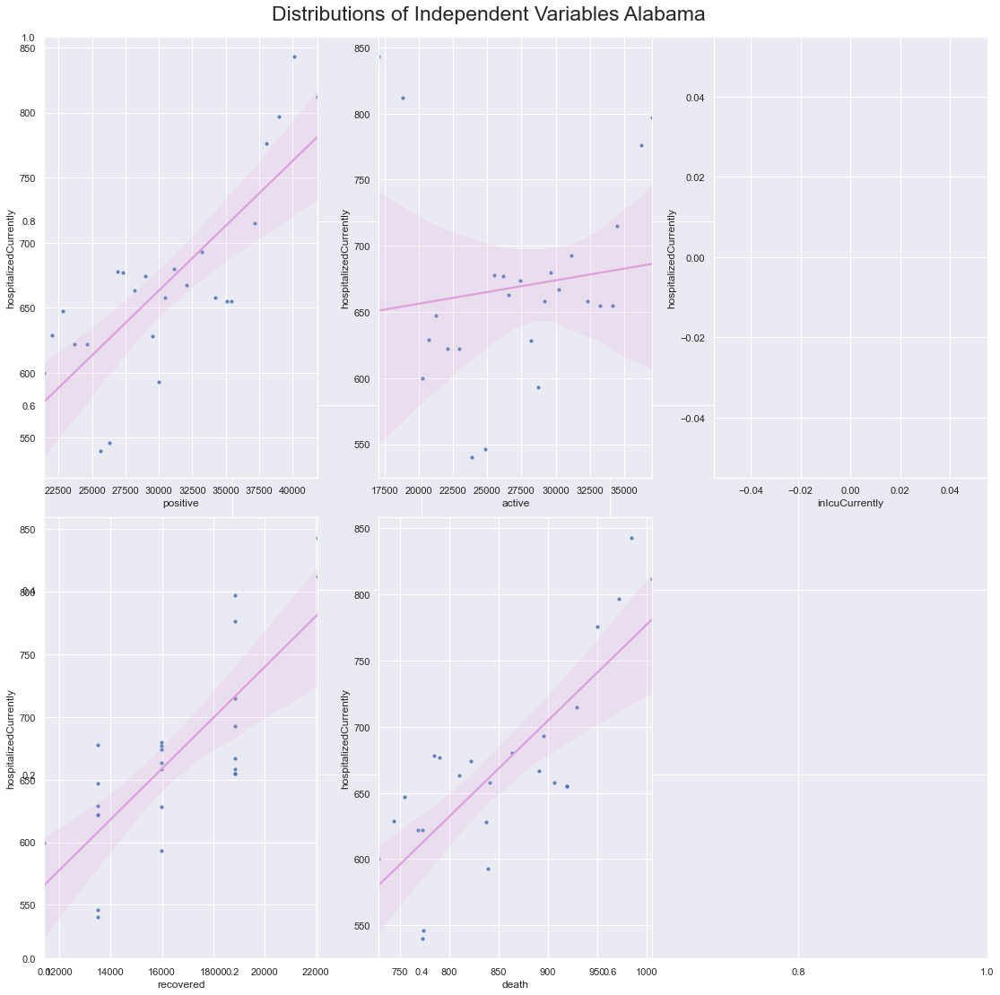

In [484]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_al = bama.hospitalizedCurrently
indep_var_al = bama.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_al.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_al[col], y=target_al, data=indep_var_al, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Alabama', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [485]:
#hide_input
###endalabama

### Arizona

In [486]:
#hide_input
arizona = covid_df.loc[(covid_df['abbrev'] == 'AZ') & (covid_df['state']== 'Arizona')] 


Text(0, 0.5, 'No. Patients')

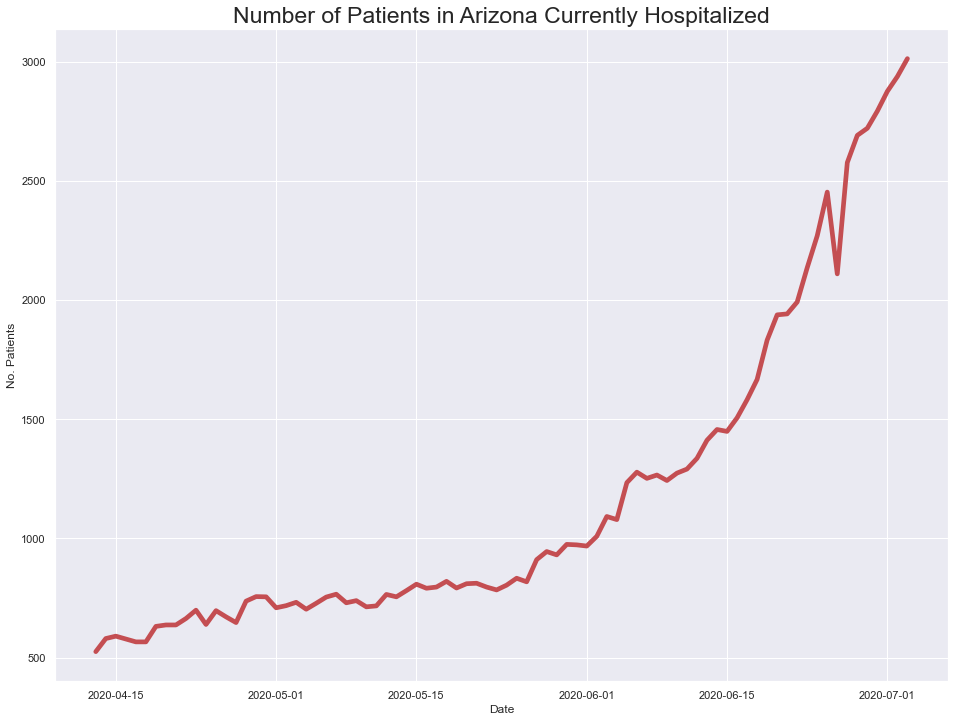

In [487]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arizona.date, arizona.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Arizona Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

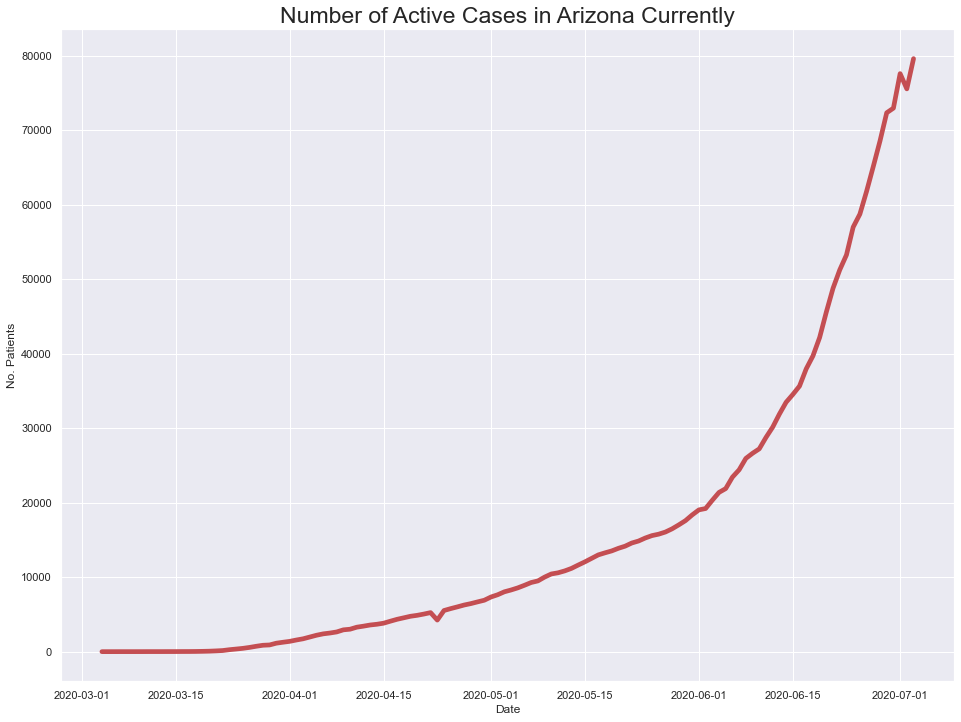

In [488]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arizona.date, arizona.active, linewidth=4.7, color='r')
plt.title('Number of Active Cases in Arizona Currently', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

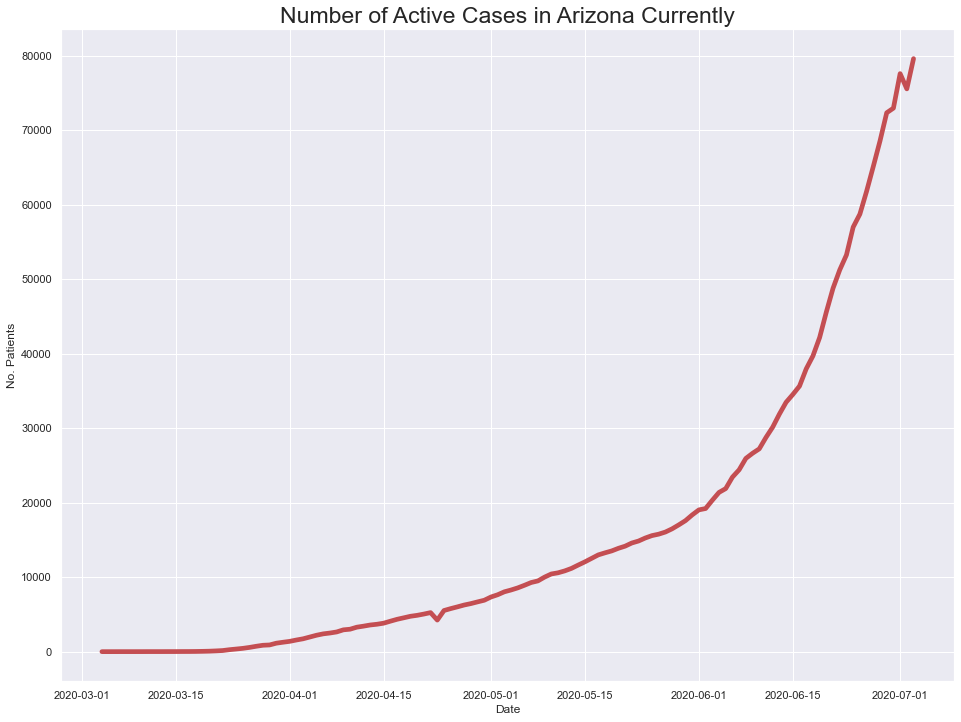

In [489]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arizona.date, arizona.active, linewidth=4.7, color='r')
plt.title('Number of Active Cases in Arizona Currently', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, '% Positive Cases in Hospital')

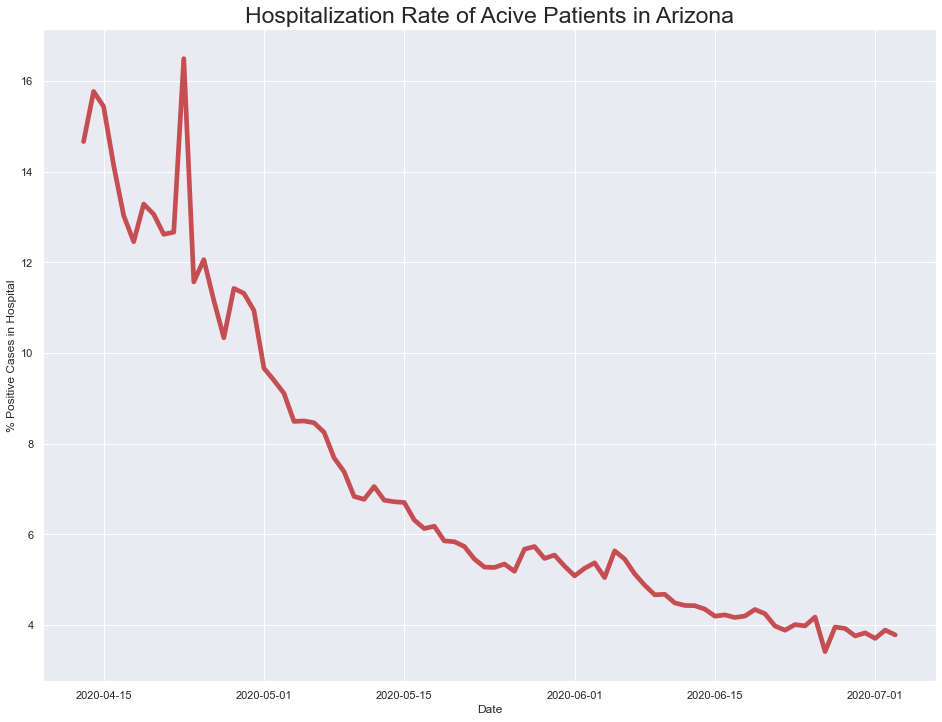

In [490]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arizona.date, arizona.hospitalizedCurrently/arizona.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate of Acive Patients in Arizona', fontsize=23)
plt.xlabel('Date')
plt.ylabel('% Positive Cases in Hospital')

Text(0, 0.5, 'No. Patients')

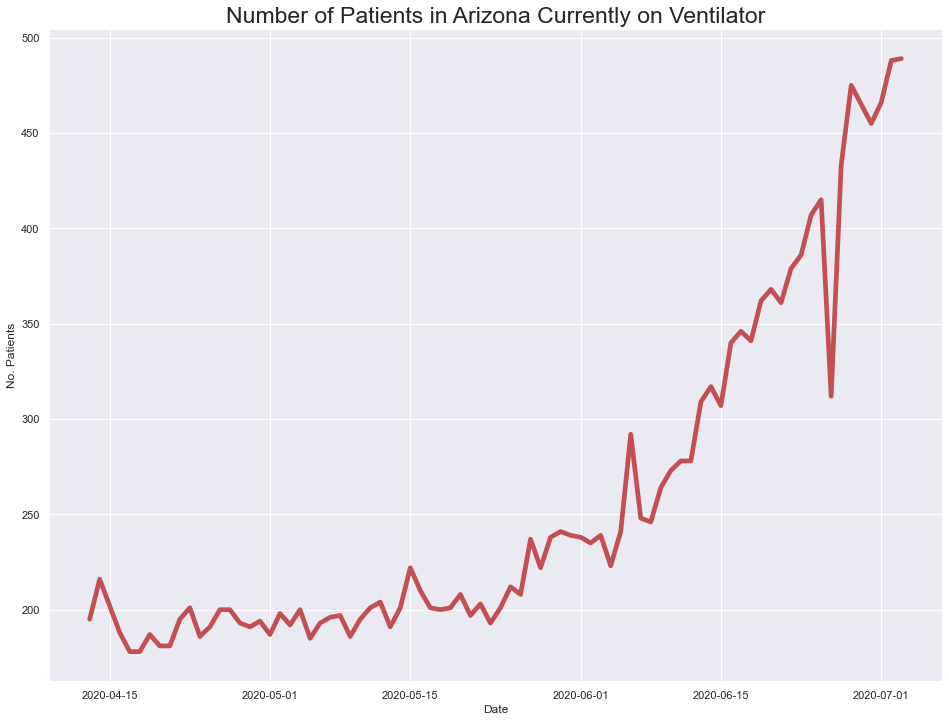

In [491]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arizona.date, arizona.onVentilatorCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Arizona Currently on Ventilator', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [492]:
#hide_input
# Checking which cols have NaN values
arizona[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
arizona.head()

# Omit the NaN cols
arizona = arizona[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

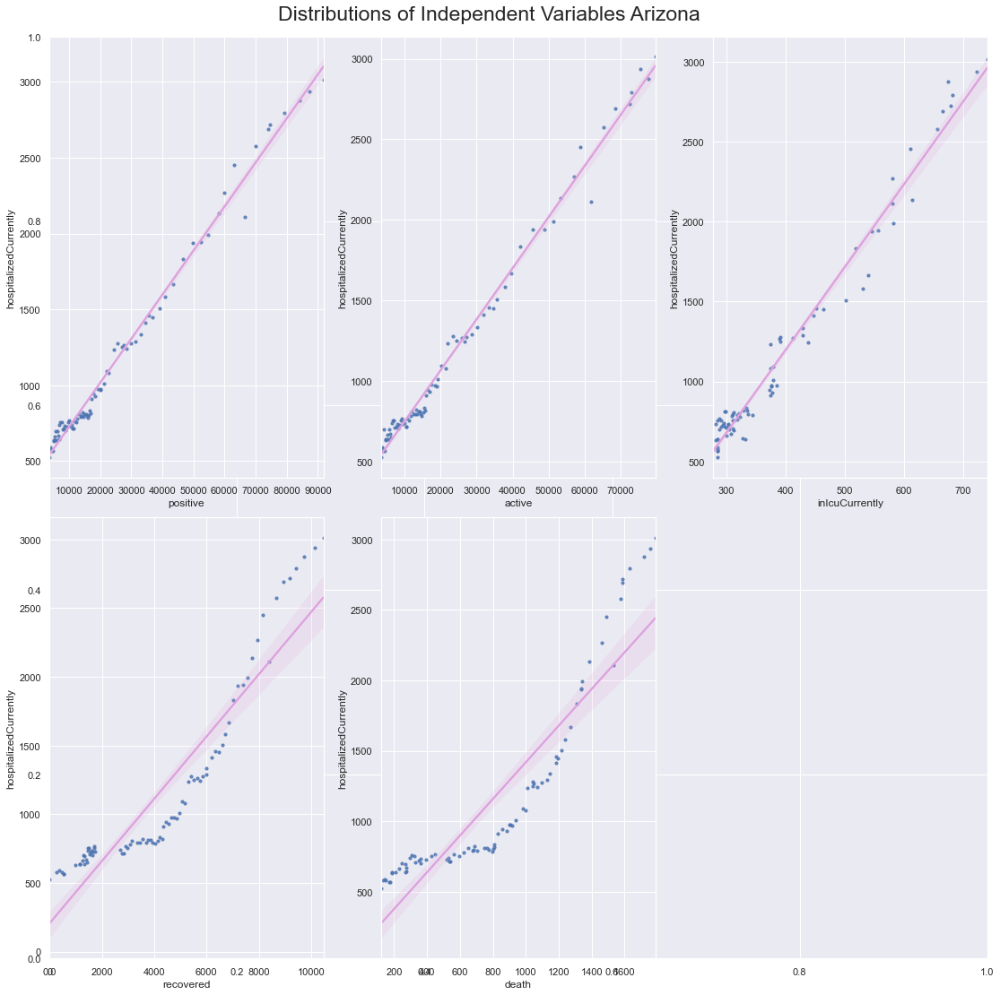

In [493]:
#hide_input
# Scatter plots AZ
# Split dependent var from independent variables
target_az = arizona.hospitalizedCurrently
indep_var_az = arizona.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_az.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_az[col], y=target_az, data=indep_var_az, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Arizona', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [494]:
#hide_input
###endarizona

### Arkansas

In [495]:
#hide_input
arkansas = covid_df.loc[(covid_df['abbrev'] == 'AR') & (covid_df['state']== 'Arkansas')] 


Text(0, 0.5, 'No. Patients')

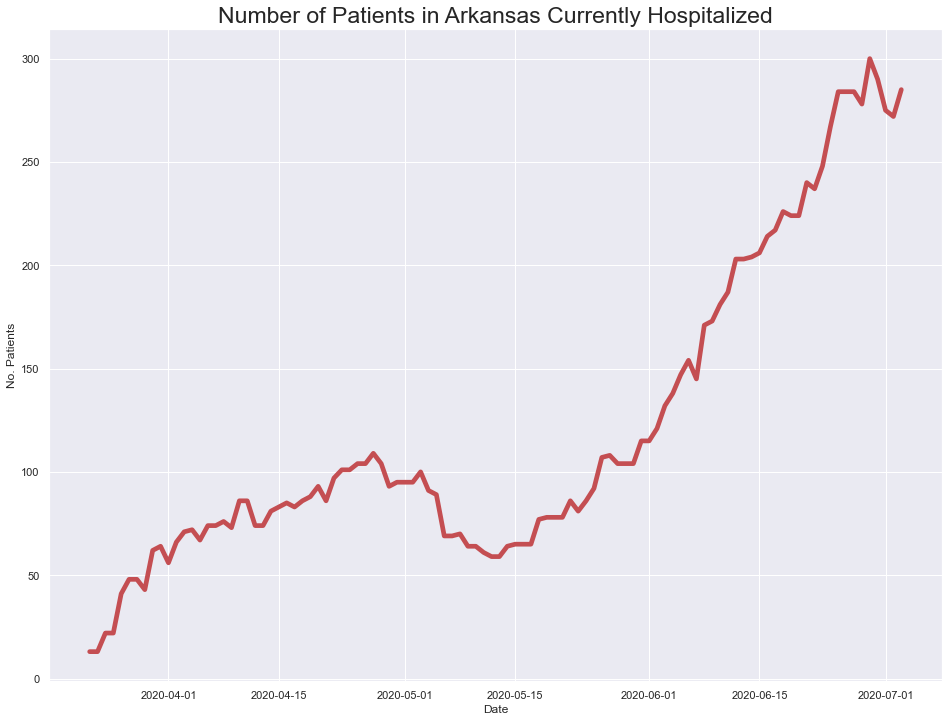

In [496]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arkansas.date, arkansas.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Arkansas Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

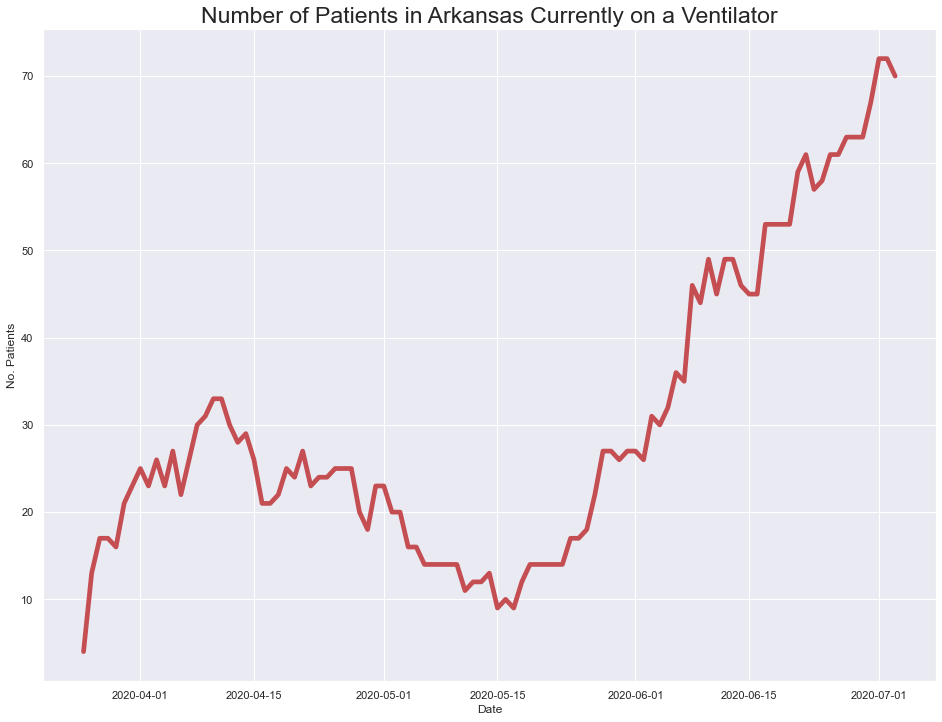

In [497]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arkansas.date, arkansas.onVentilatorCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Arkansas Currently on a Ventilator', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

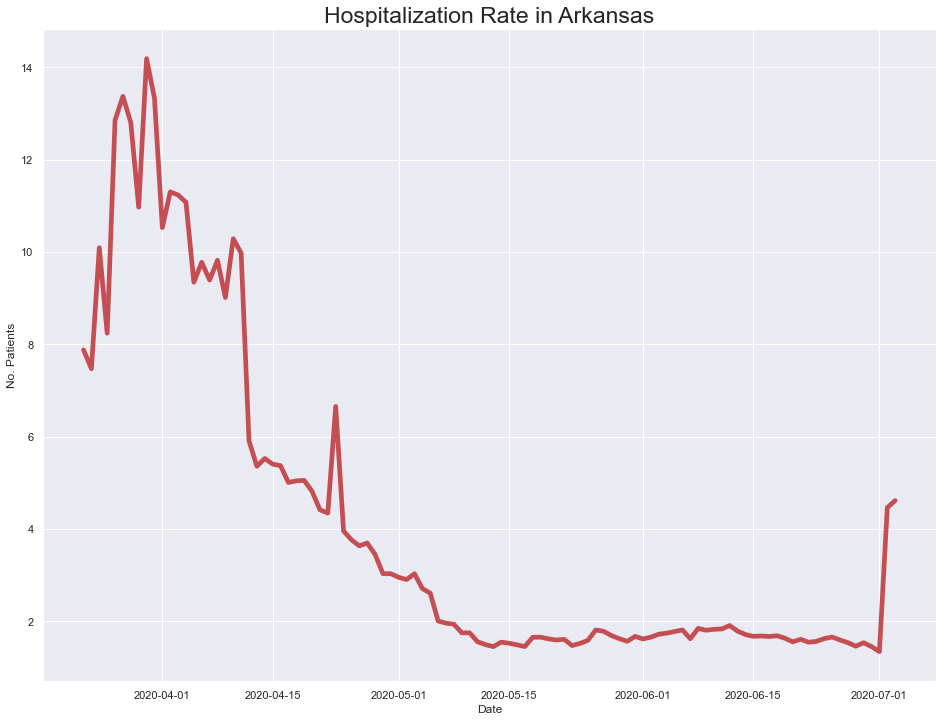

In [498]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(arkansas.date, arkansas.hospitalizedCurrently/arkansas.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Arkansas', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [499]:
#hide_input
# Checking which cols have NaN values
arkansas[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
arkansas.head()

# Omit the NaN cols
arkansas = arkansas[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

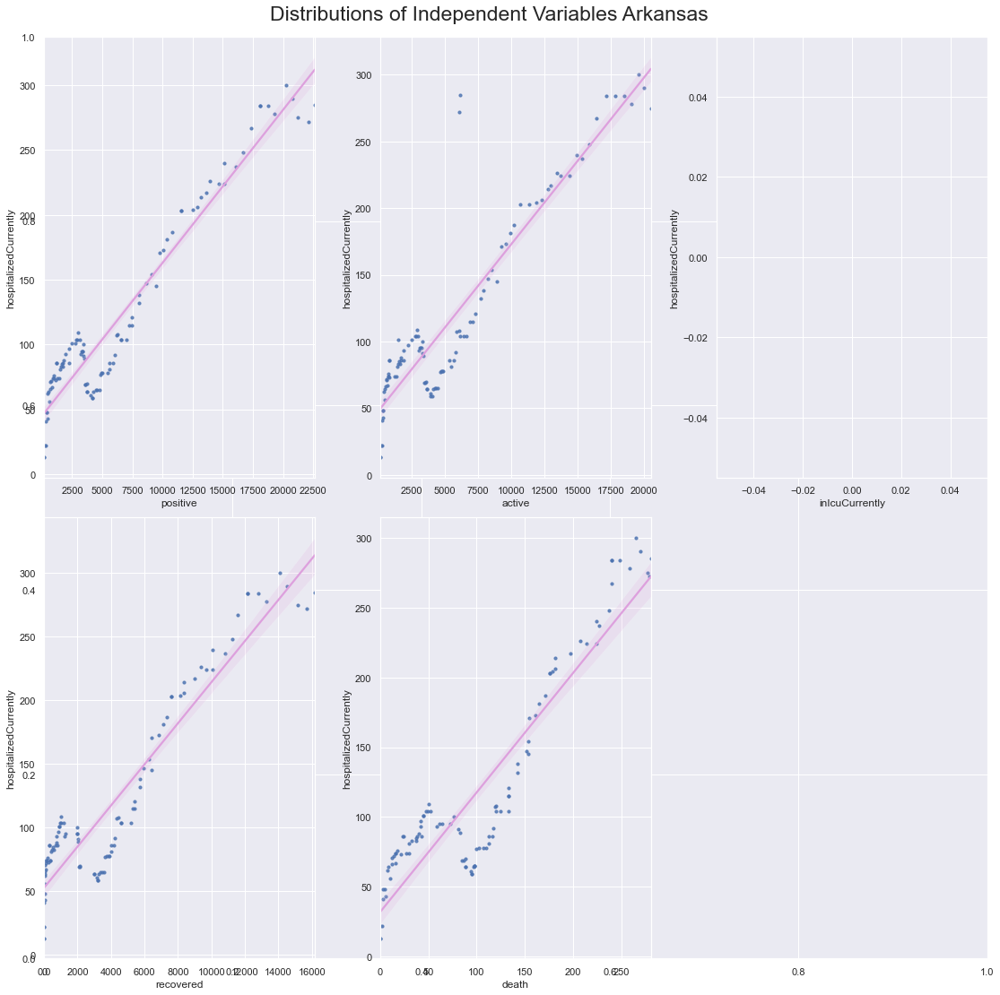

In [500]:
#hide_input
# Scatter plots AK
# Split dependent var from independent variables
target_ak = arkansas.hospitalizedCurrently
indep_var_ak = arkansas.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ak.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ak[col], y=target_ak, data=indep_var_ak, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Arkansas', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [501]:
#hide_input
###endarkansas

### California

In [502]:
#hide_input
cali = covid_df.loc[(covid_df['abbrev'] == 'CA') & (covid_df['state']== 'California')] 


Text(0, 0.5, 'No. Patients')

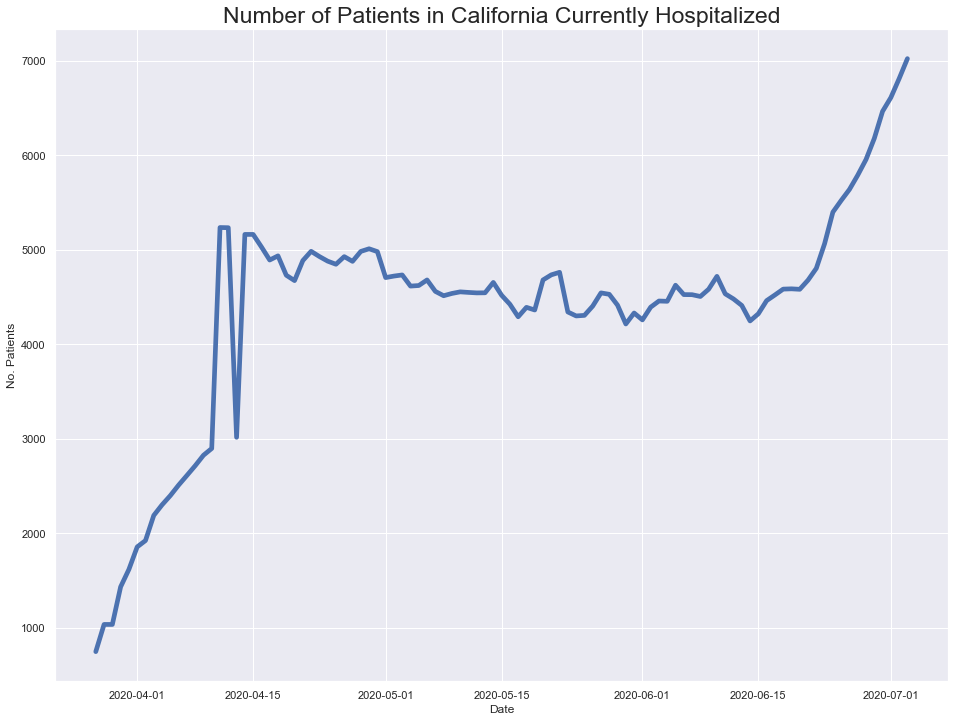

In [503]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(cali.date, cali.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in California Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

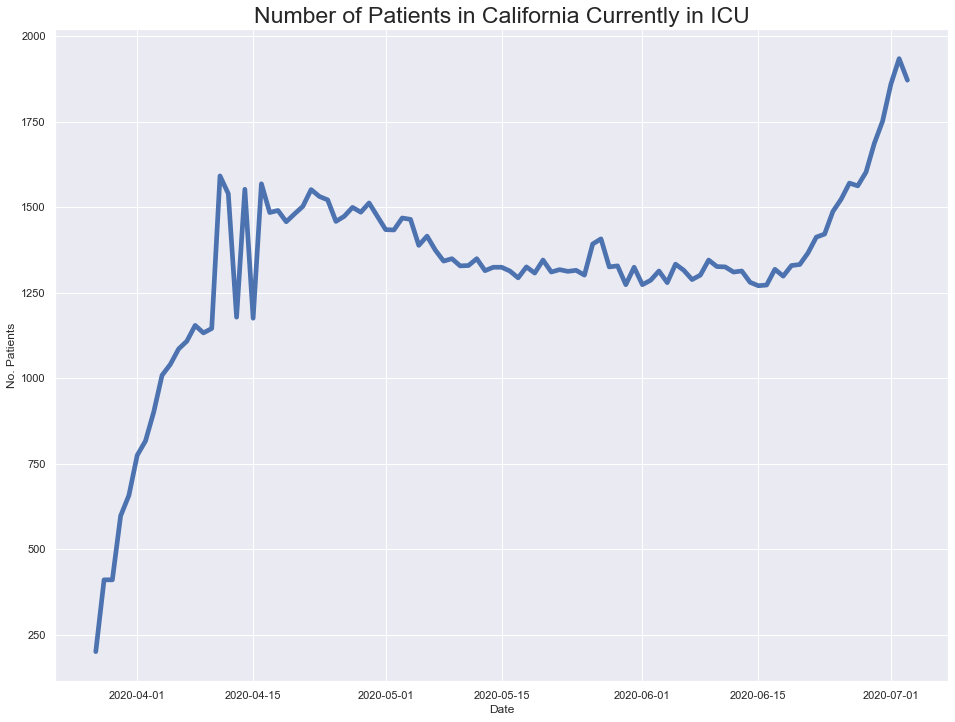

In [504]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(cali.date, cali.inIcuCurrently, linewidth=4.7)
plt.title('Number of Patients in California Currently in ICU', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

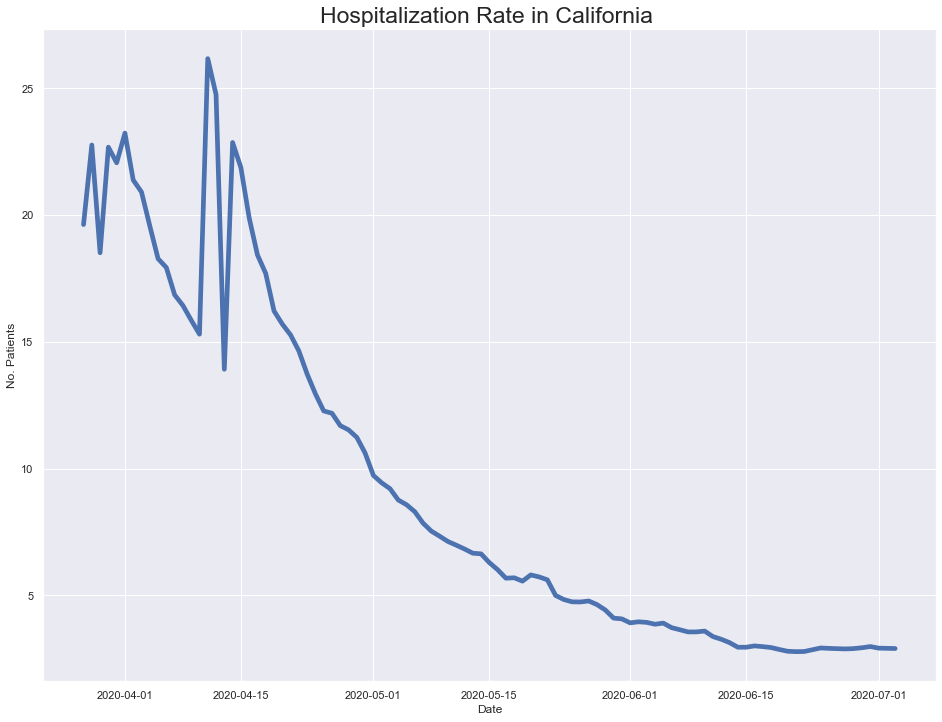

In [505]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(cali.date, cali.hospitalizedCurrently/cali.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in California ', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

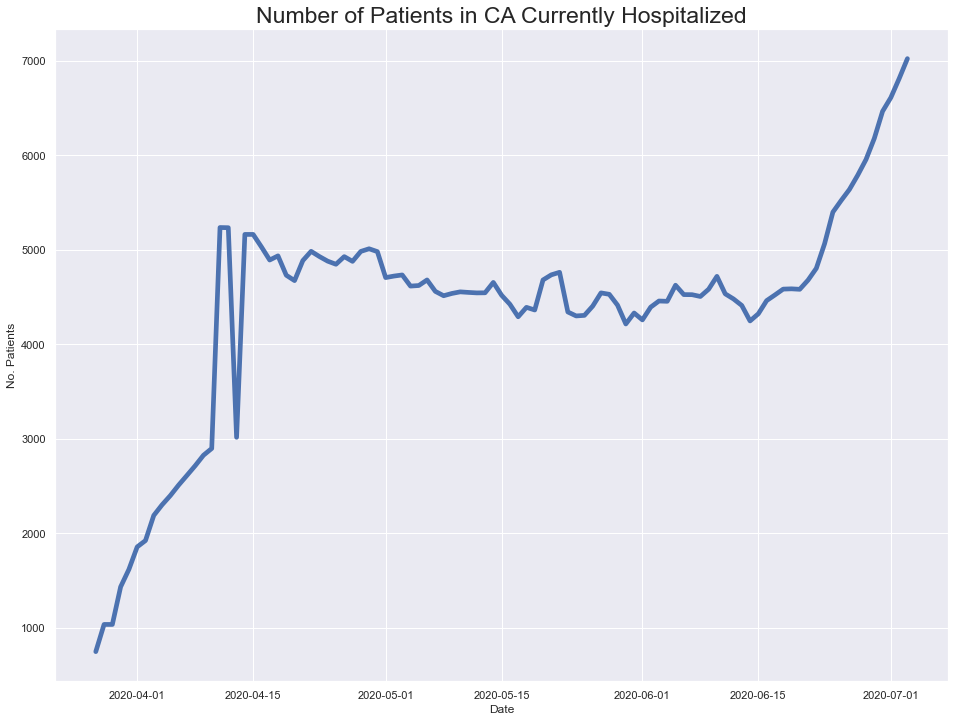

In [506]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(cali.date, cali.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in CA Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [507]:
#hide_input
# Checking which cols have NaN values
cali[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
cali.head()

# Omit the NaN cols
cali = cali[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

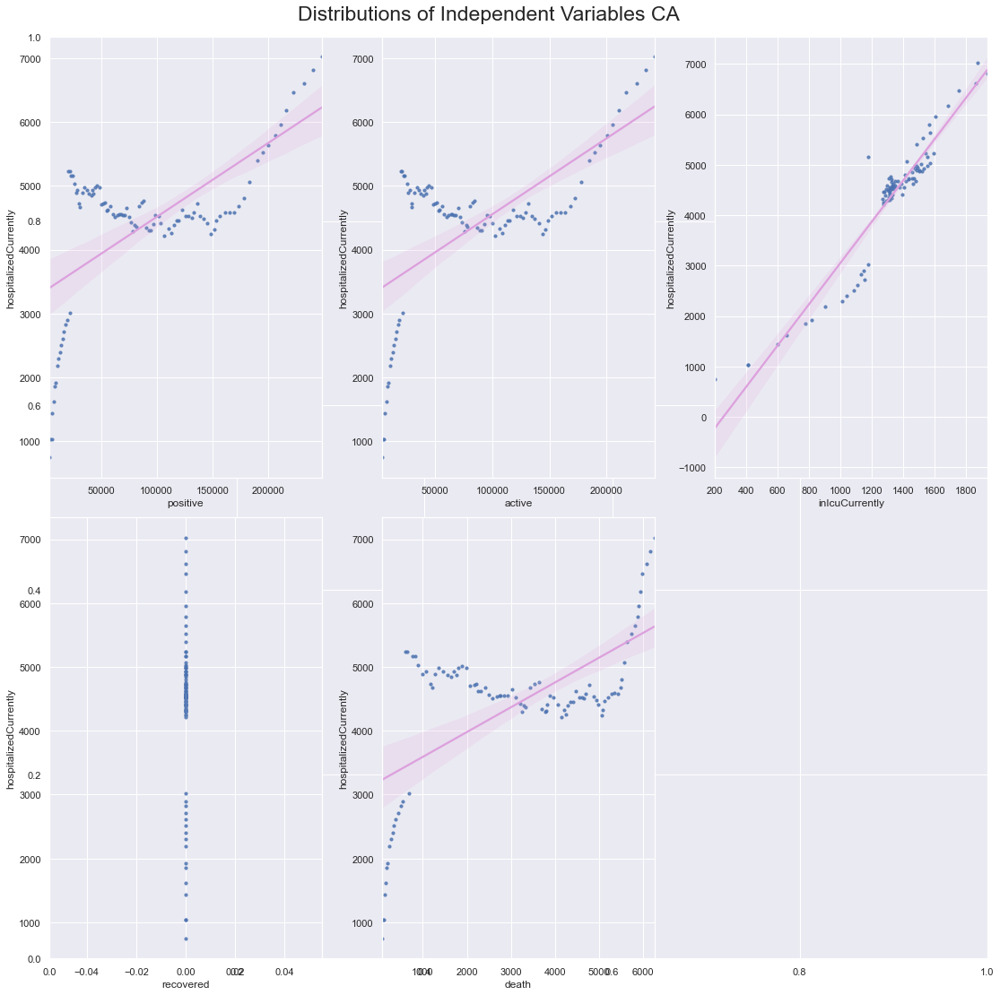

In [508]:
#hide_input
# Scatter plots CA
# Split dependent var from independent variables
target_ca = cali.hospitalizedCurrently
indep_var_ca = cali.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ca.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ca[col], y=target_ca, data=indep_var_ca, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables CA', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [509]:
#hide_input
###endcali

### Colorado

In [510]:
#hide_input
colorado = covid_df.loc[(covid_df['abbrev'] == 'CO') & (covid_df['state']== 'Colorado')] 


Text(0, 0.5, 'No. Patients')

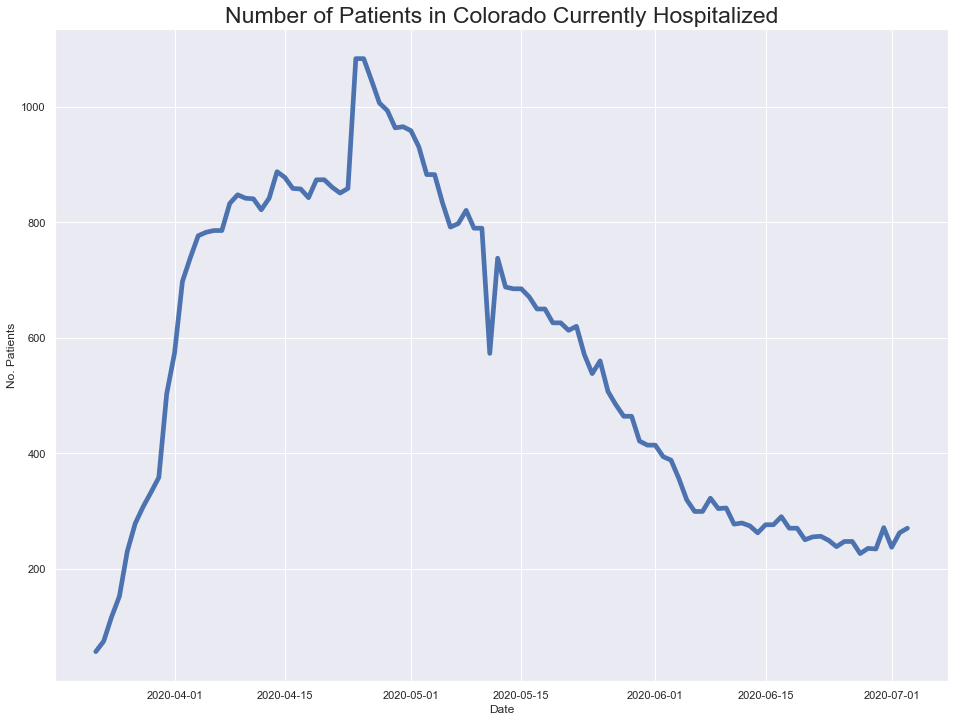

In [511]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(colorado.date, colorado.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Colorado Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

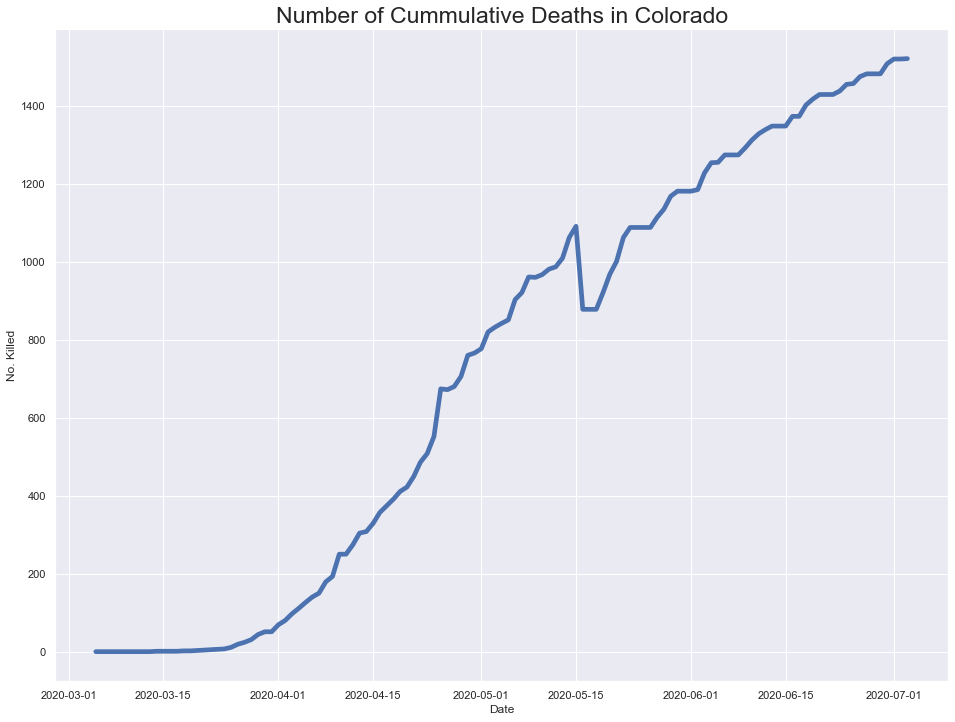

In [512]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(colorado.date, colorado.death, linewidth=4.7)
plt.title('Number of Cummulative Deaths in Colorado', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

Text(0, 0.5, 'No. Killed')

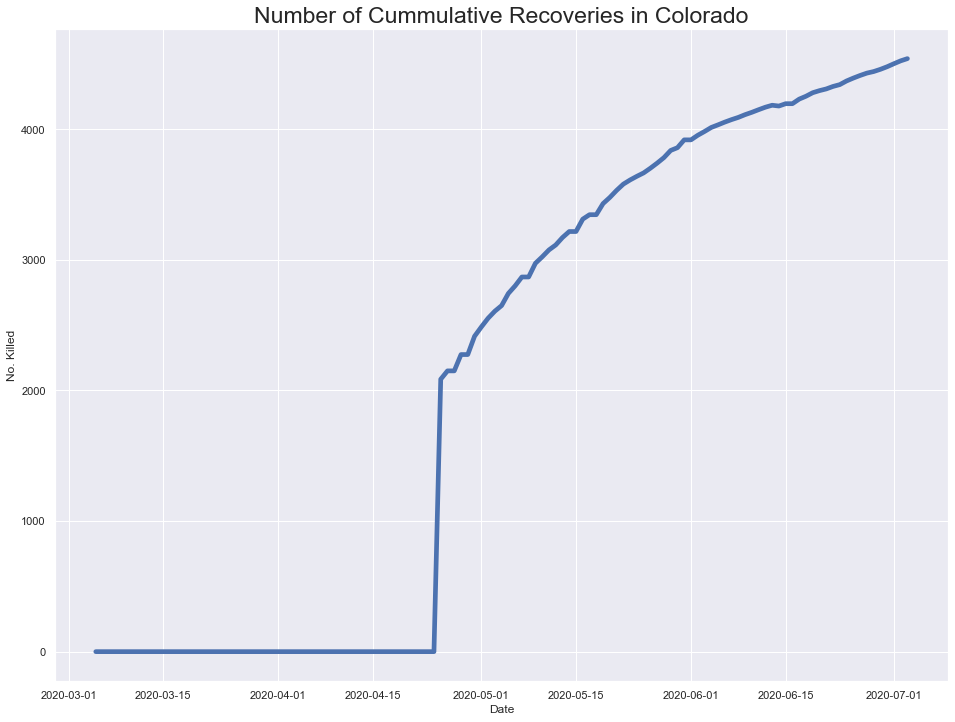

In [513]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(colorado.date, colorado.recovered, linewidth=4.7)
plt.title('Number of Cummulative Recoveries in Colorado', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [514]:
#hide_input
# Checking which cols have NaN values
colorado[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
colorado.head()

# Omit the NaN cols
colorado = colorado[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

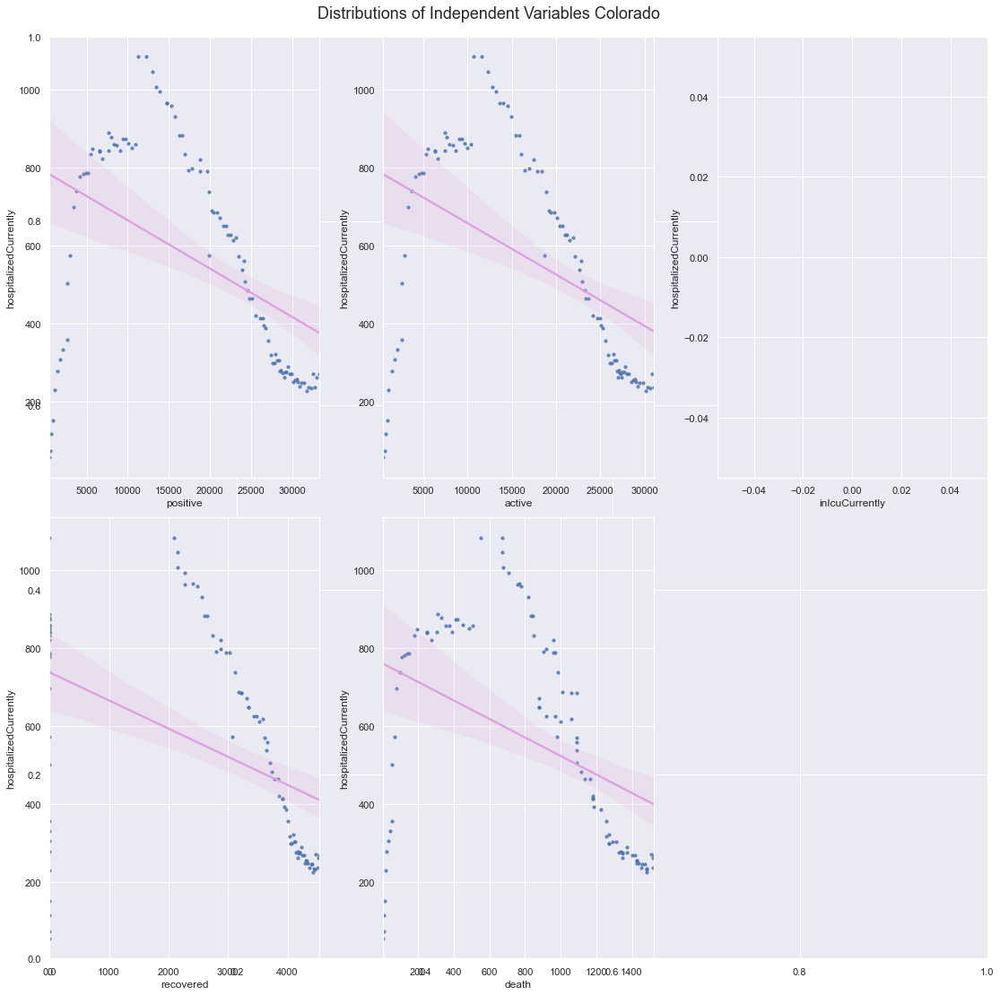

In [515]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_co = colorado.hospitalizedCurrently
indep_var_co = colorado.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_co.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_co[col], y=target_co, data=indep_var_co, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Colorado', fontsize=18)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [516]:
#hide_input
###endcolorado

### Connecticut

In [517]:
#hide_input
conn = covid_df.loc[(covid_df['abbrev'] == 'CT') & (covid_df['state']== 'Connecticut')] 


Text(0, 0.5, 'No. Patients')

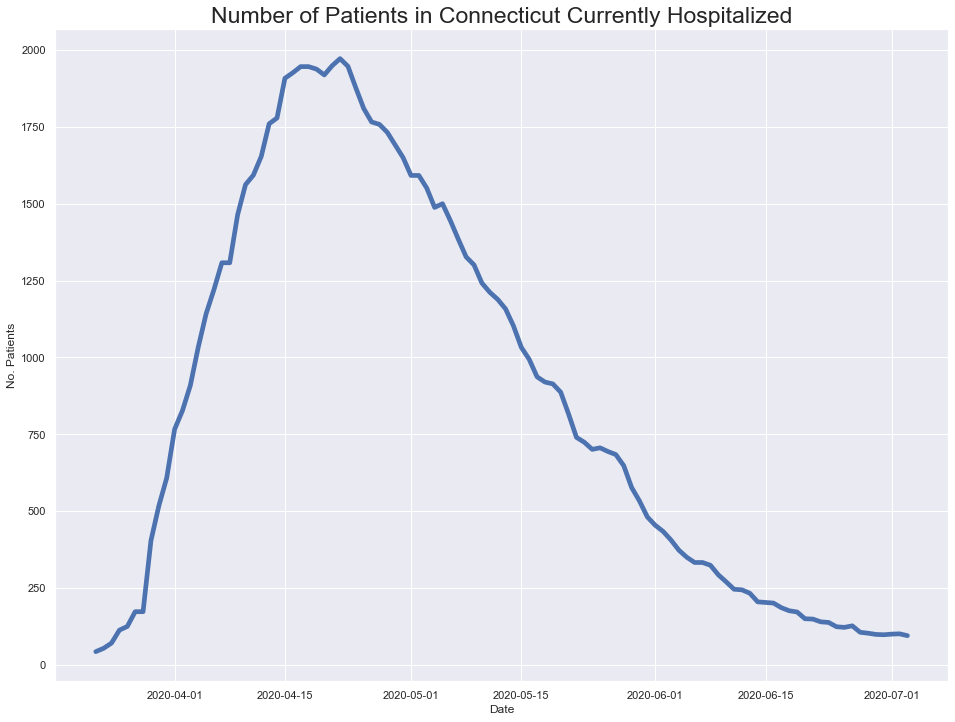

In [518]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(conn.date, conn.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Connecticut Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

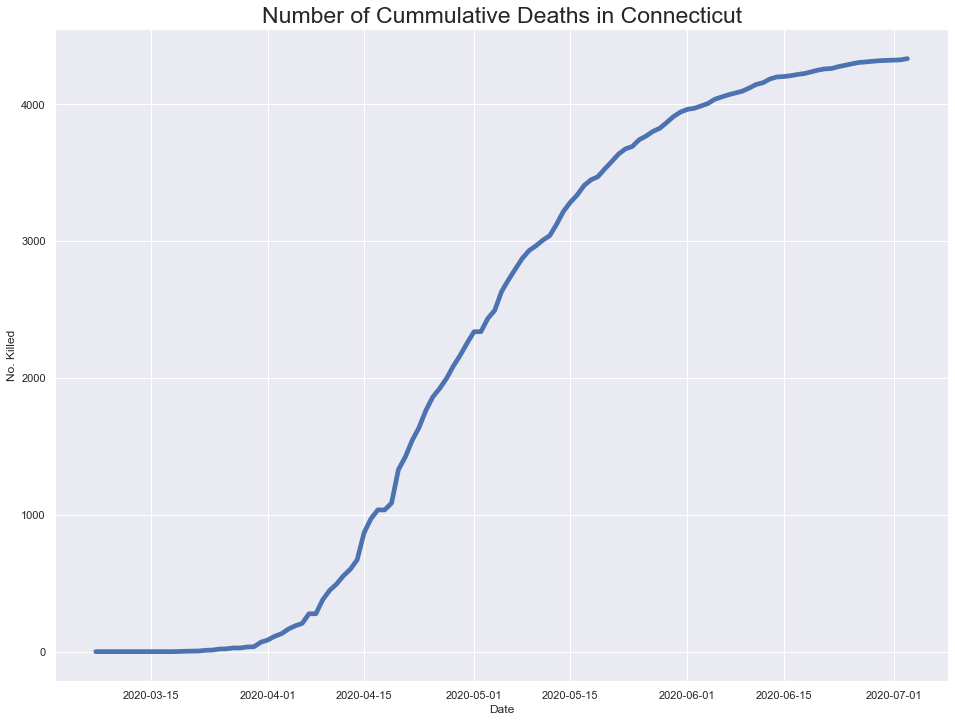

In [519]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(conn.date, conn.death, linewidth=4.7)
plt.title('Number of Cummulative Deaths in Connecticut', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

Text(0, 0.5, 'No. Killed')

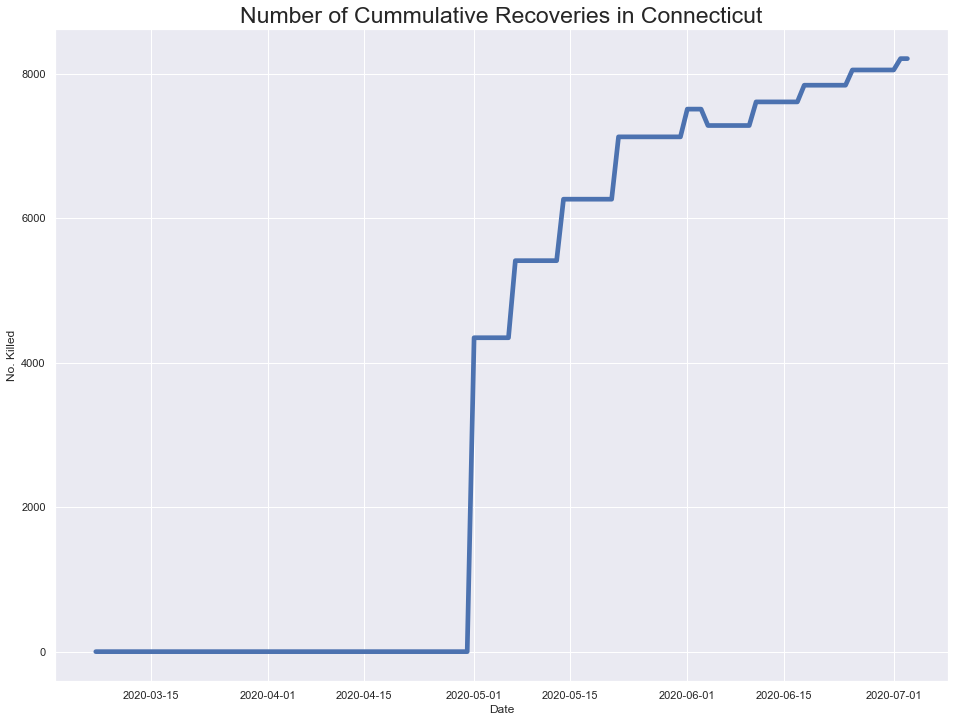

In [520]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(conn.date, conn.recovered, linewidth=4.7)
plt.title('Number of Cummulative Recoveries in Connecticut', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [521]:
#hide_input
# Checking which cols have NaN values
conn[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
conn.head()

# Omit the NaN cols
conn = conn[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

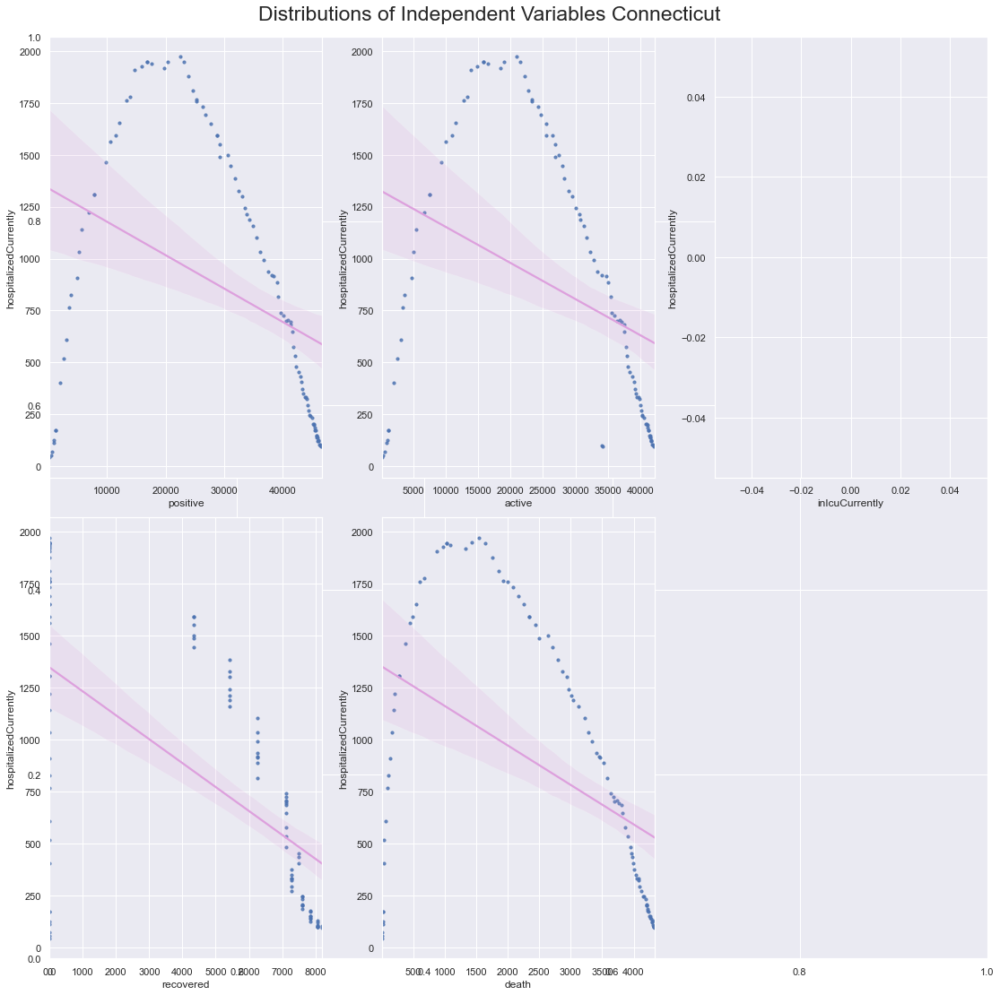

In [522]:
#hide_input
# Scatter plots CT
# Split dependent var from independent variables
target_ct = conn.hospitalizedCurrently
indep_var_ct = conn.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_al.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ct[col], y=target_ct, data=indep_var_ct, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Connecticut', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [523]:
#hide_input
###endconnecticut

### Delaware

In [524]:
#hide_input
delaware = covid_df.loc[(covid_df['abbrev'] == 'DE') & (covid_df['state']== 'Delaware')] 


Text(0, 0.5, 'No. Patients')

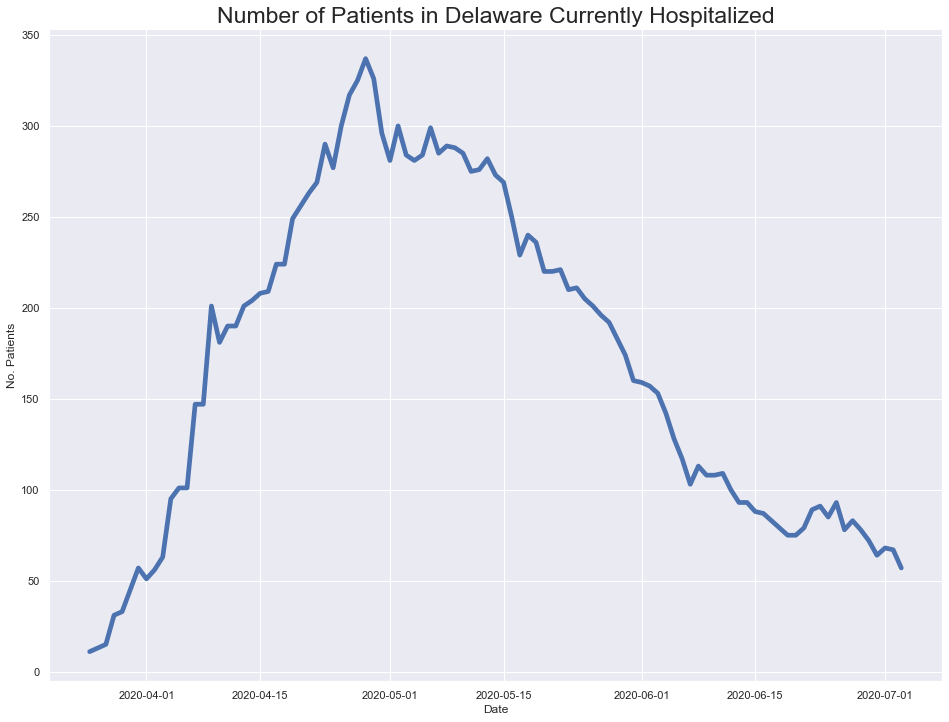

In [525]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(delaware.date, delaware.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Delaware Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

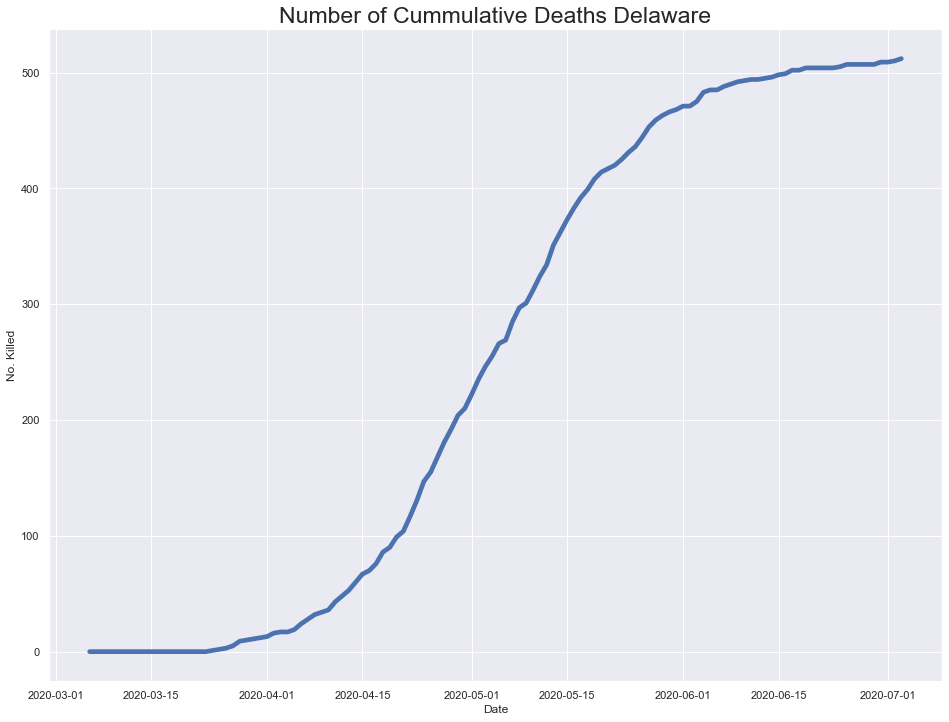

In [526]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(delaware.date, delaware.death, linewidth=4.7)
plt.title('Number of Cummulative Deaths Delaware', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [527]:
#hide_input
# Checking which cols have NaN values
delaware[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
delaware.head()

# Omit the NaN cols
delaware = delaware[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

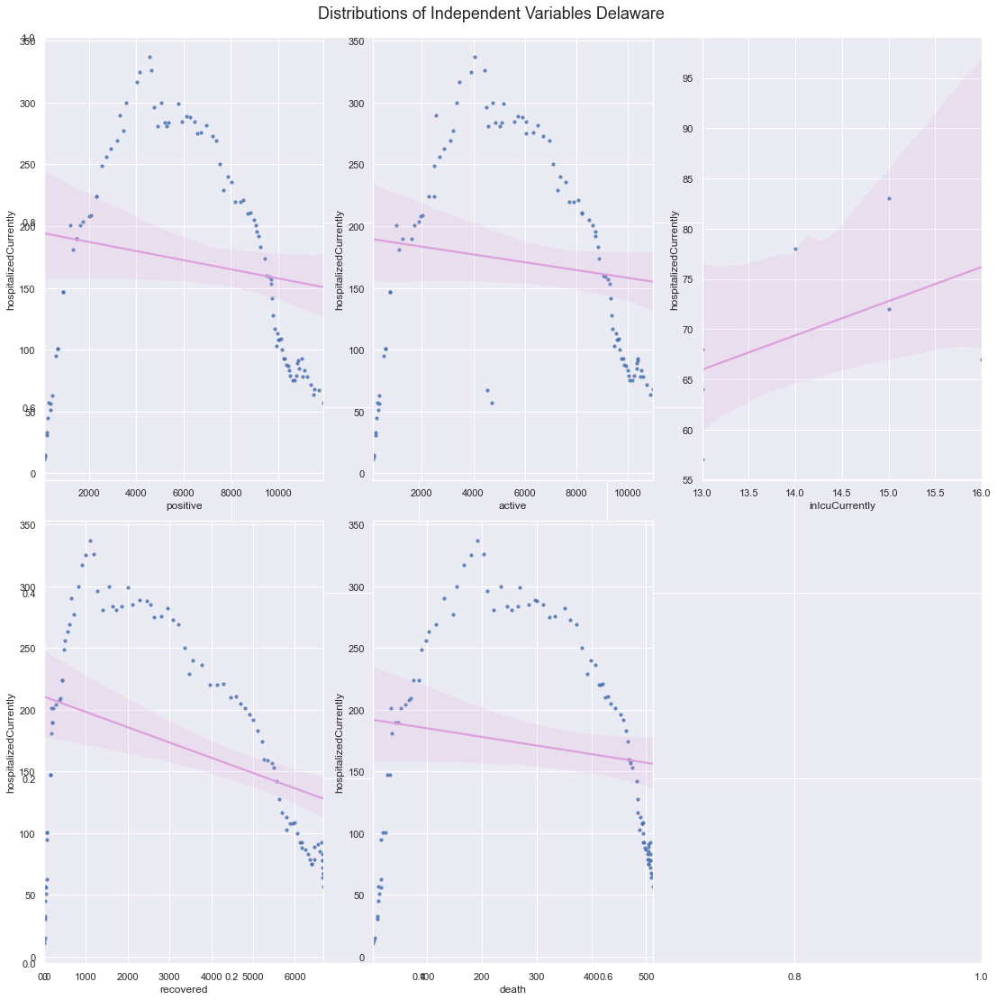

In [528]:
#hide_input
# Scatter plots DE
# Split dependent var from independent variables
target_de = delaware.hospitalizedCurrently
indep_var_de = delaware.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_al.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_de[col], y=target_de, data=indep_var_de, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Delaware', fontsize=18)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [529]:
#hide_input
###enddelaware

### Florida

In [530]:
#hide_input
#hide_input
fl = covid_df.loc[(covid_df['abbrev'] == 'FL') & (covid_df['state']== 'Florida')] 


Text(0, 0.5, 'No. Patients')

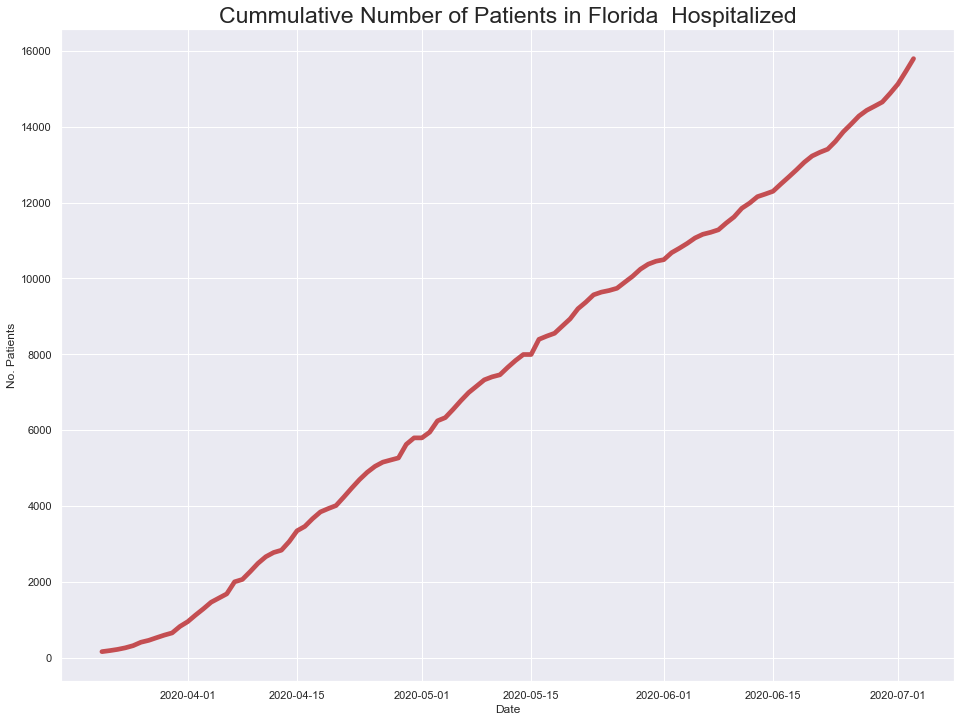

In [531]:
#hide_input
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(fl.date, fl.hospitalizedCumulative, linewidth=4.7, color='r')
plt.title('Cummulative Number of Patients in Florida  Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

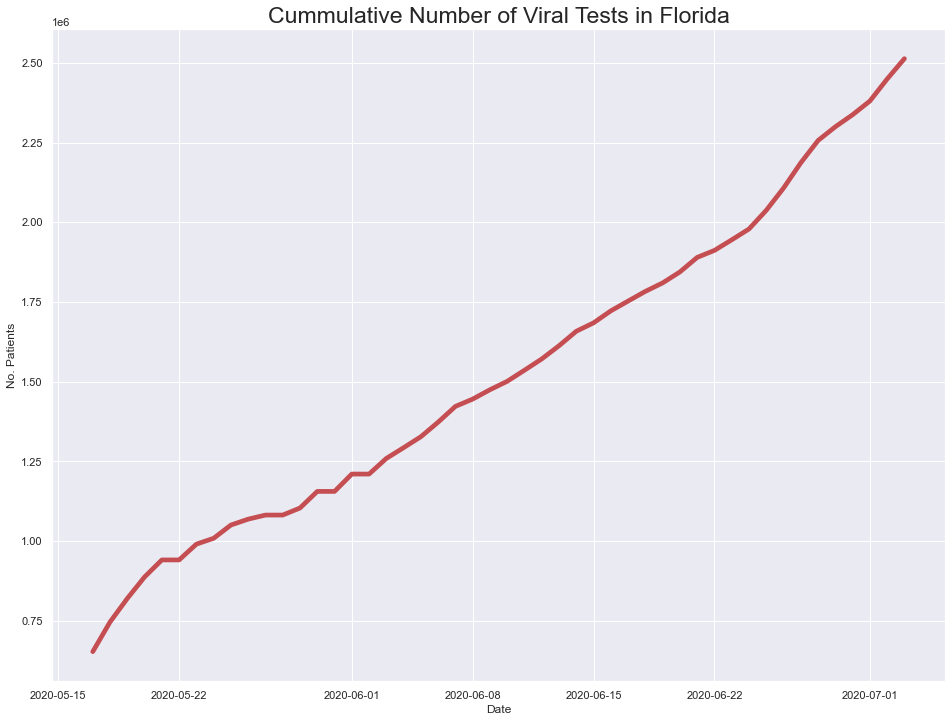

In [532]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(fl.date, fl.totalTestsViral, linewidth=4.7, color='r')
plt.title('Cummulative Number of Viral Tests in Florida', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

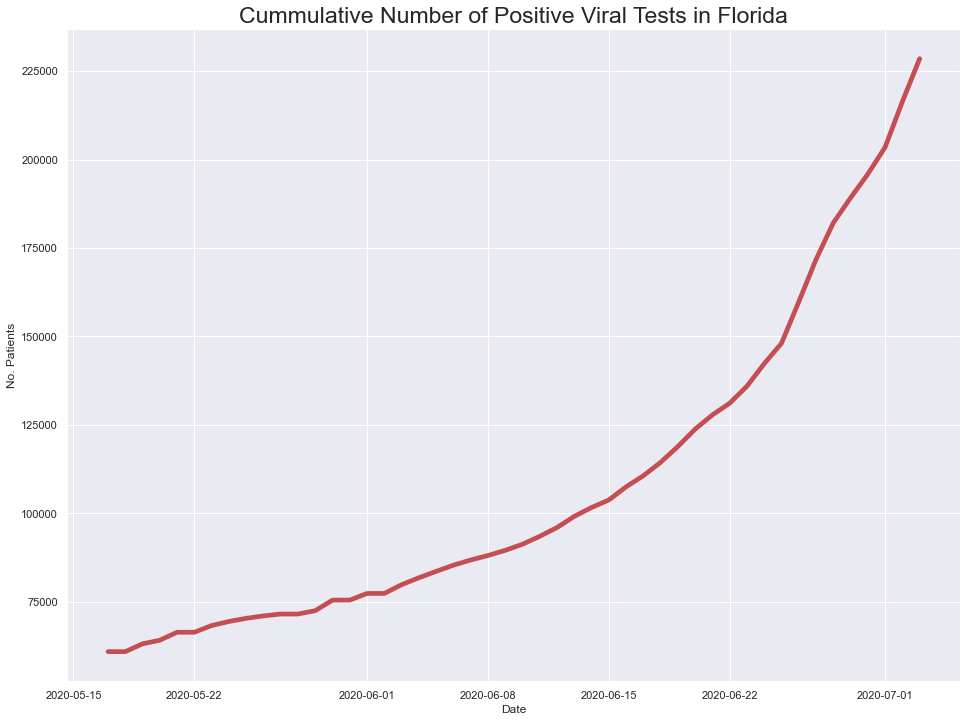

In [533]:
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(fl.date, fl.positiveTestsViral, linewidth=4.7, color='r')
plt.title('Cummulative Number of Positive Viral Tests in Florida', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, '% Infected')

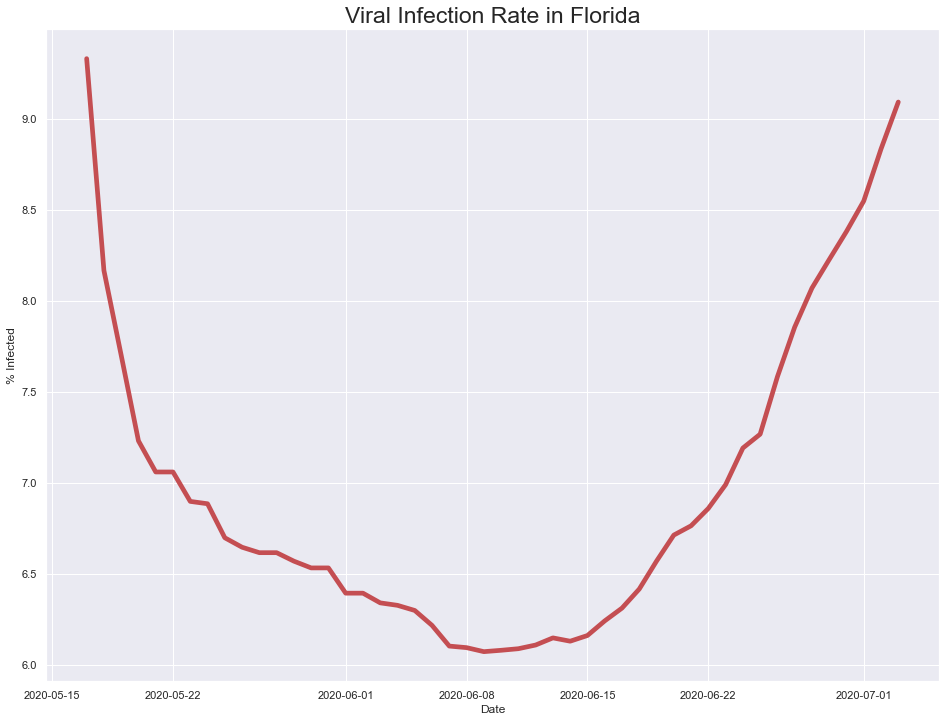

In [534]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(fl.date, fl.positiveTestsViral/fl.totalTestsViral*100, linewidth=4.7, color='r')
plt.title('Viral Infection Rate in Florida', fontsize=23)
plt.xlabel('Date')
plt.ylabel('% Infected')

In [535]:
#hide_input
###endflorida

### Georgia

In [536]:
#hide_input
georgia = covid_df.loc[(covid_df['abbrev'] == 'GA') & (covid_df['state']== 'Georgia')] 


Text(0, 0.5, 'No. Patients')

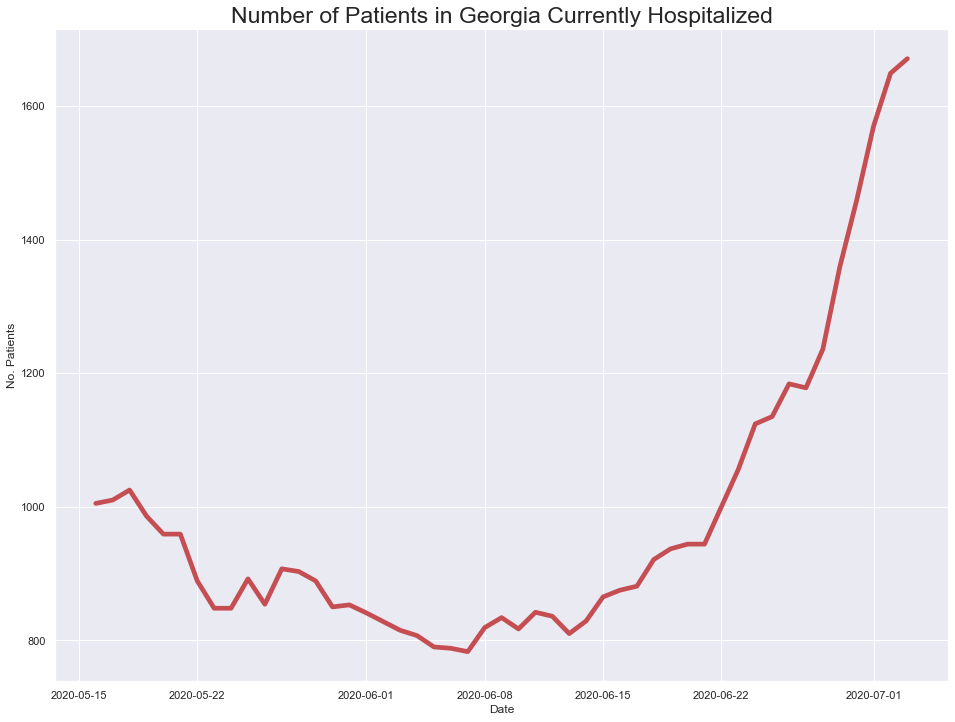

In [537]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(georgia.date, georgia.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Georgia Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

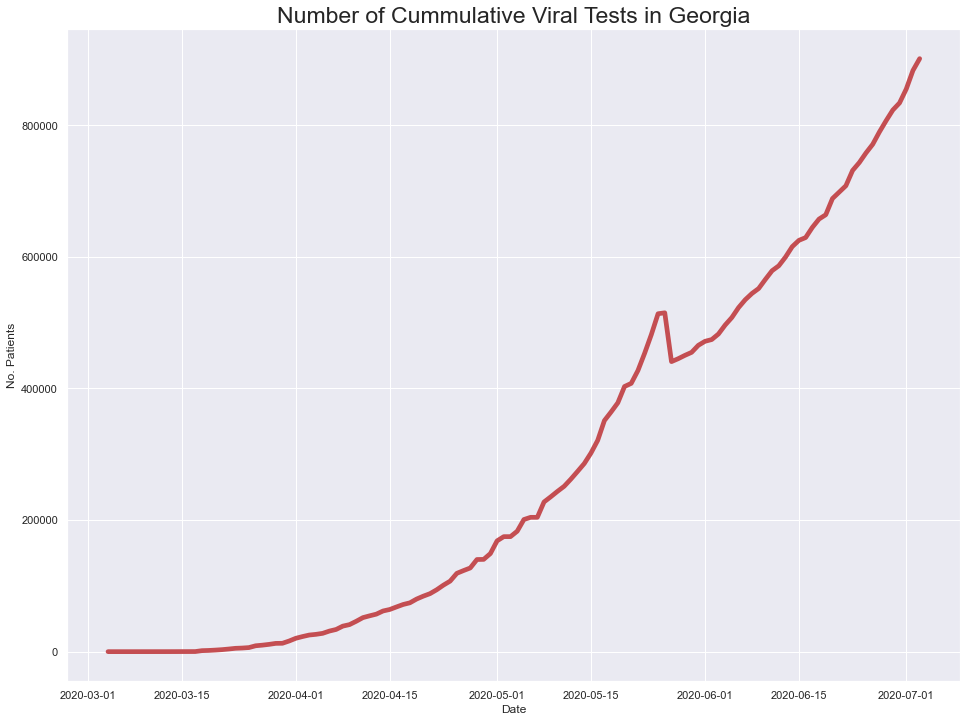

In [538]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(georgia.date, georgia.totalTestsViral, linewidth=4.7, color='r')
plt.title('Number of Cummulative Viral Tests in Georgia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

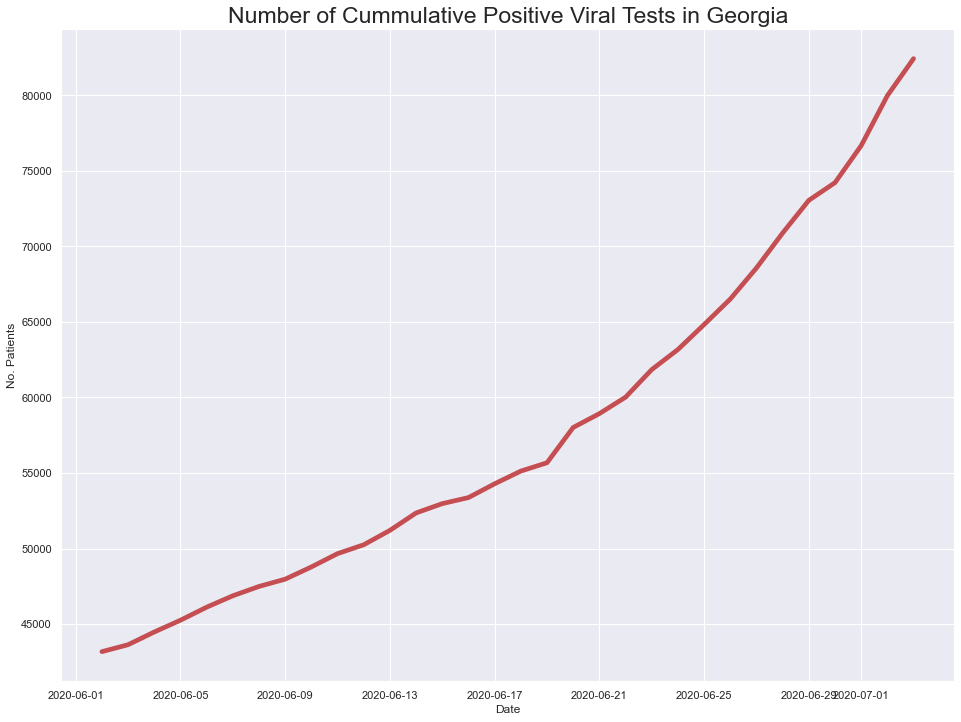

In [539]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(georgia.date, georgia.positiveTestsViral, linewidth=4.7, color='r')
plt.title('Number of Cummulative Positive Viral Tests in Georgia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, '% Infection Rate')

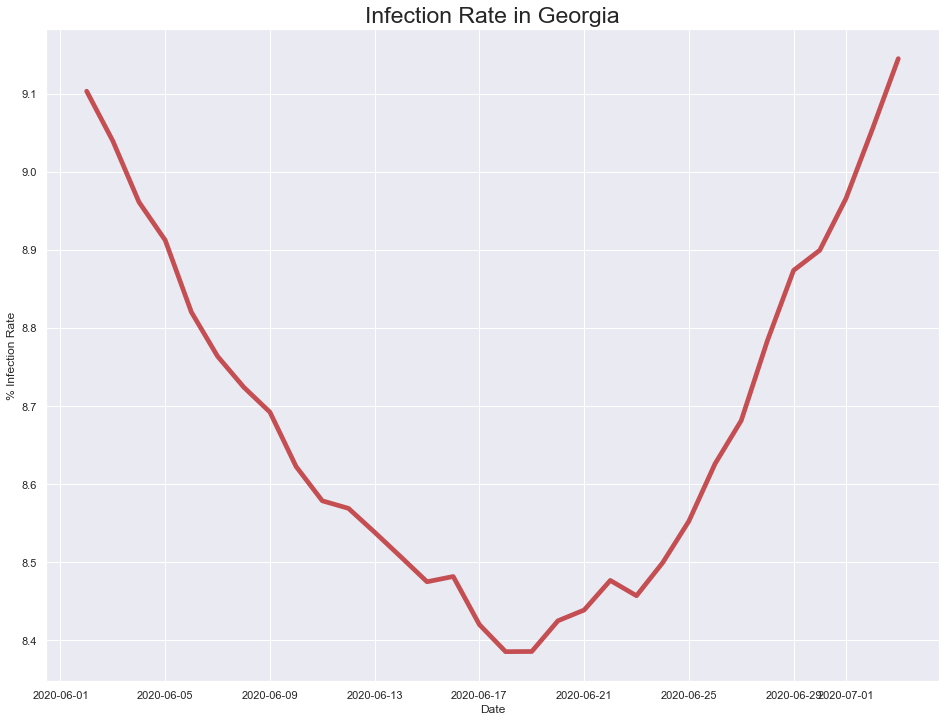

In [540]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(georgia.date, georgia.positiveTestsViral/georgia.totalTestsViral*100, linewidth=4.7, color='r')
plt.title('Infection Rate in Georgia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('% Infection Rate')

In [541]:
#hide_input
# Checking which cols have NaN values
georgia[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
georgia.head()

# Omit the NaN cols
georgia = georgia[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

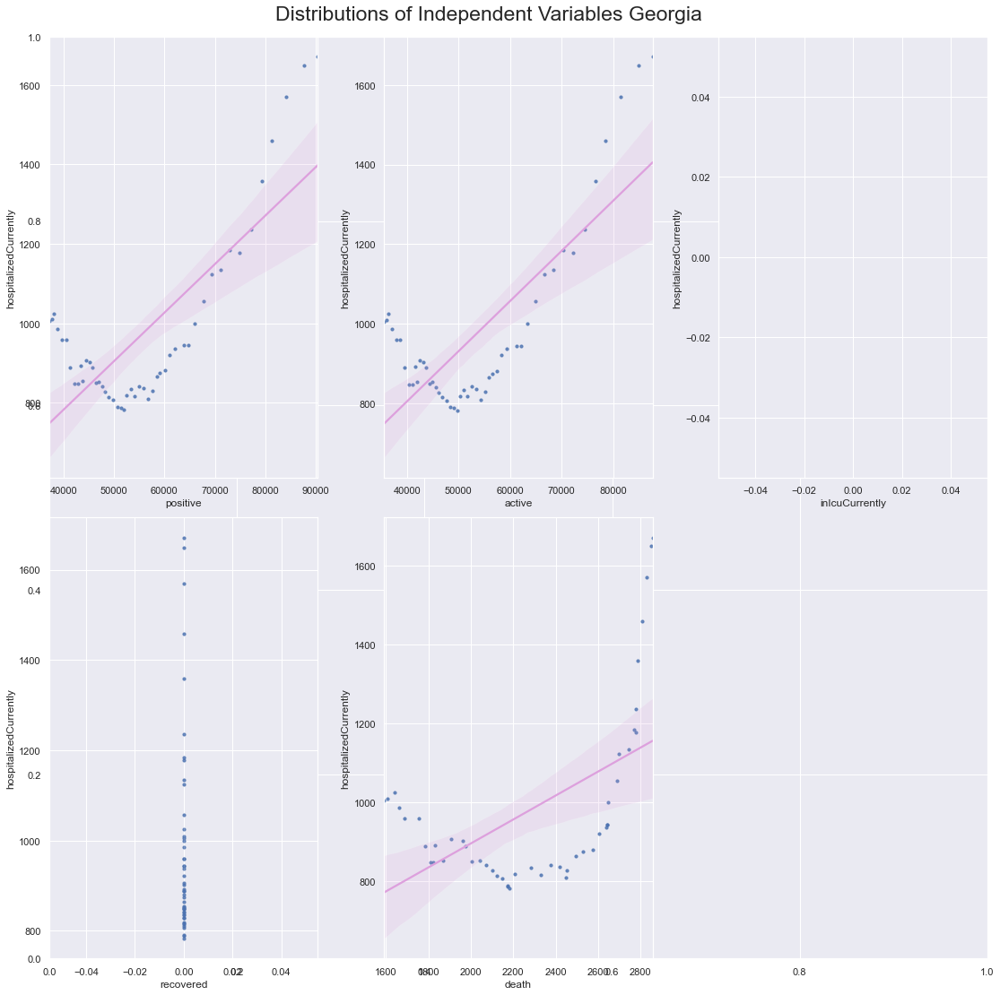

In [542]:
#hide_input
# Scatter plots GA
# Split dependent var from independent variables
target_ga = georgia.hospitalizedCurrently
indep_var_ga = georgia.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ga.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ga[col], y=target_ga, data=indep_var_ga, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Georgia', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [543]:
#hide_input
###endgeorgia

### Hawaii

In [544]:
#hide_input
hawaii = covid_df.loc[(covid_df['abbrev'] == 'HI') & (covid_df['state']== 'Hawaii')] 


Text(0, 0.5, 'No. Patients')

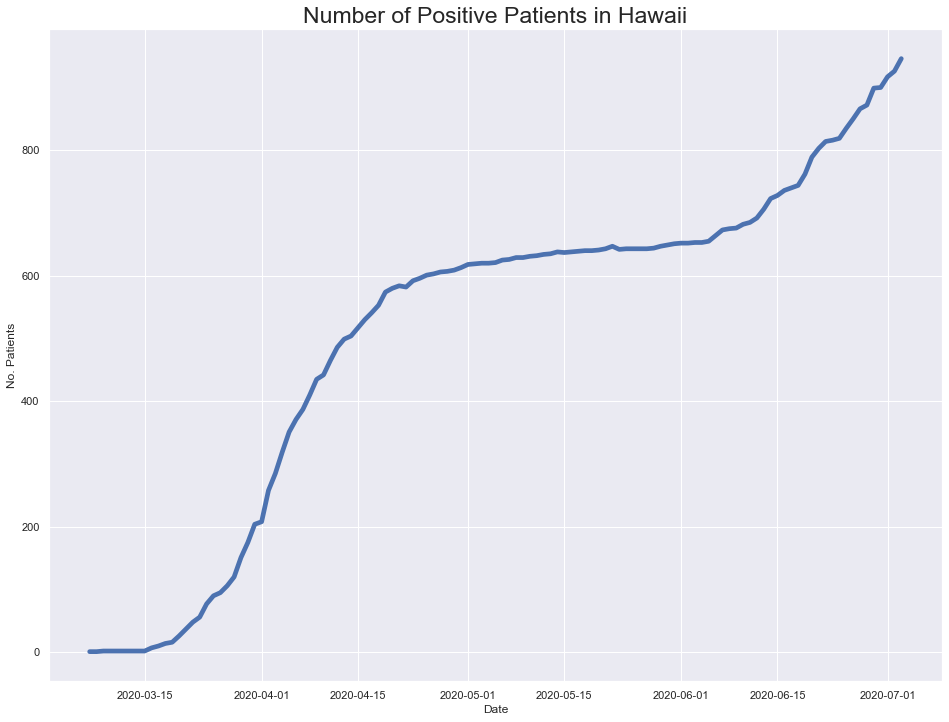

In [545]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(hawaii.date, hawaii.positive, linewidth=4.7)
plt.title('Number of Positive Patients in Hawaii', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

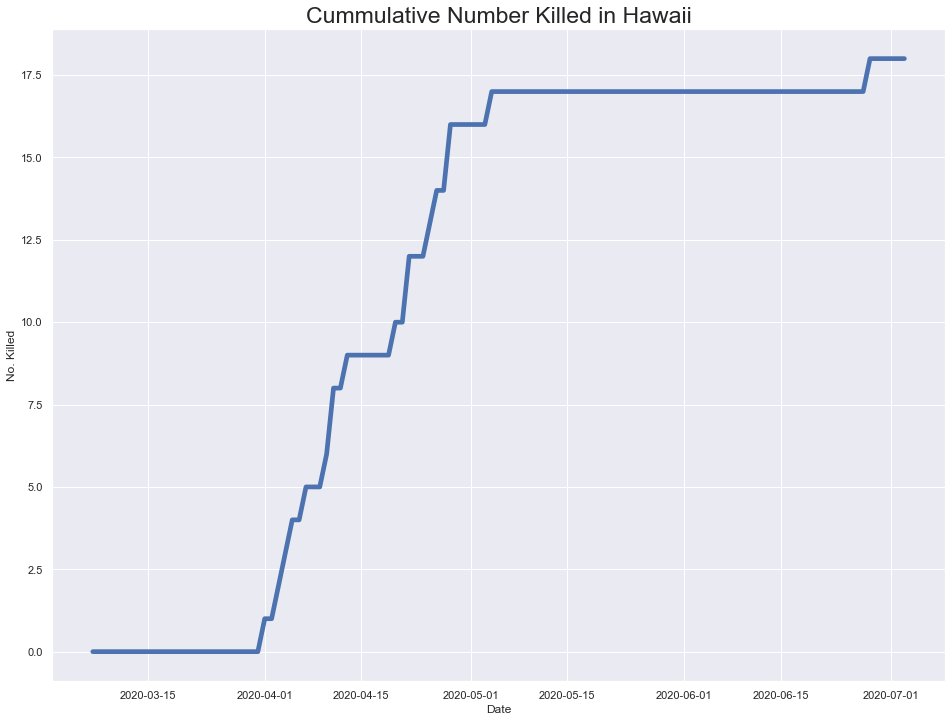

In [546]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(hawaii.date, hawaii.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Hawaii', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

Text(0, 0.5, 'No. Killed')

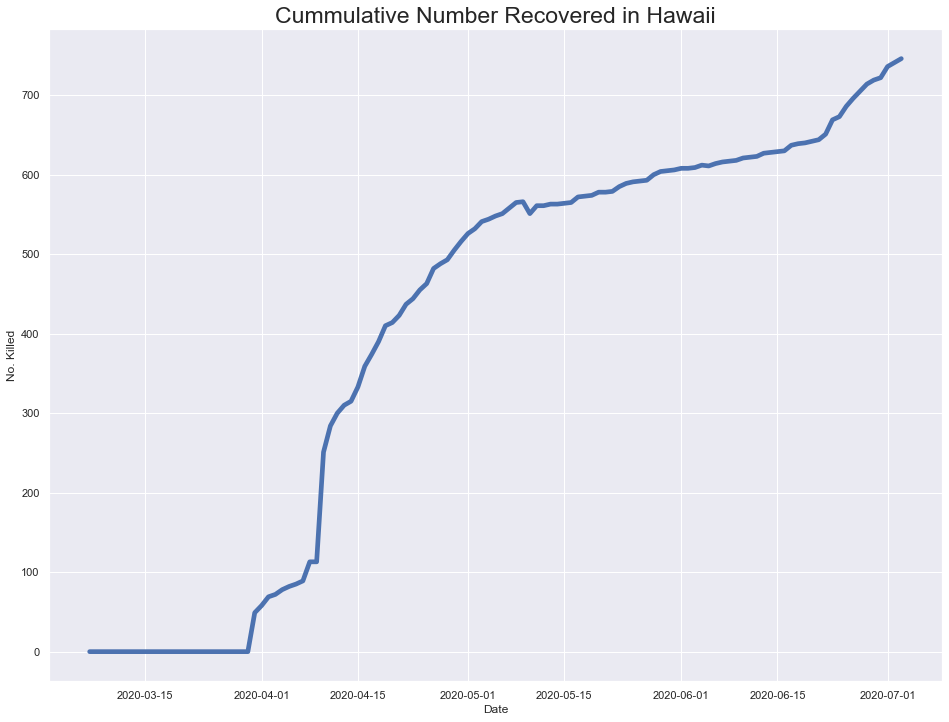

In [547]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(hawaii.date, hawaii.recovered, linewidth=4.7)
plt.title('Cummulative Number Recovered in Hawaii', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

Text(0, 0.5, 'No. Killed')

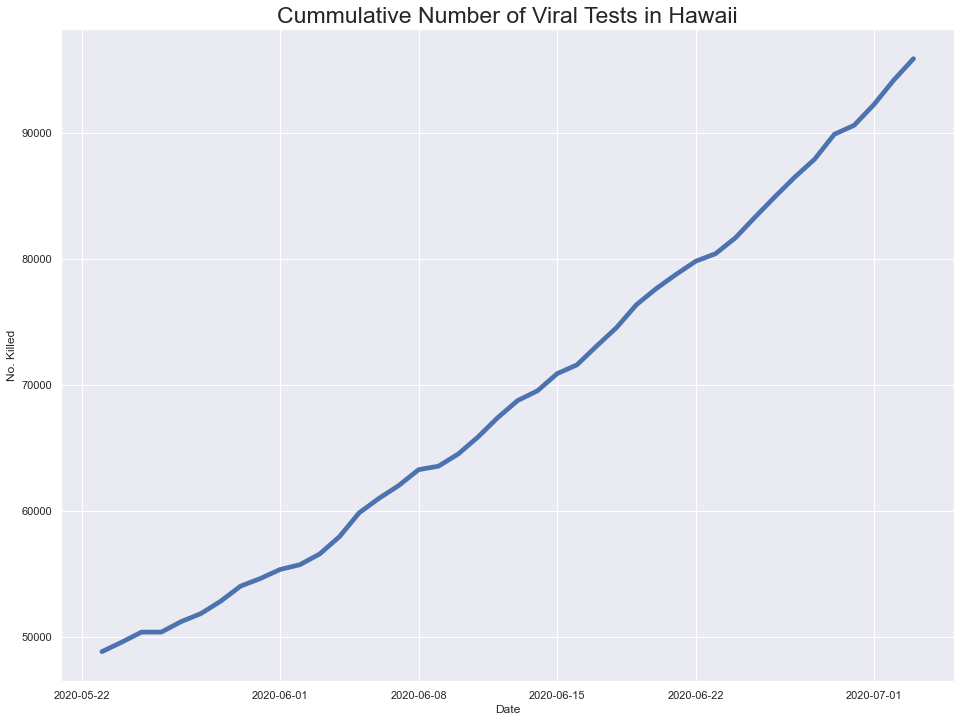

In [548]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(hawaii.date, hawaii.totalTestsViral, linewidth=4.7)
plt.title('Cummulative Number of Viral Tests in Hawaii', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

Text(0, 0.5, 'No. Killed')

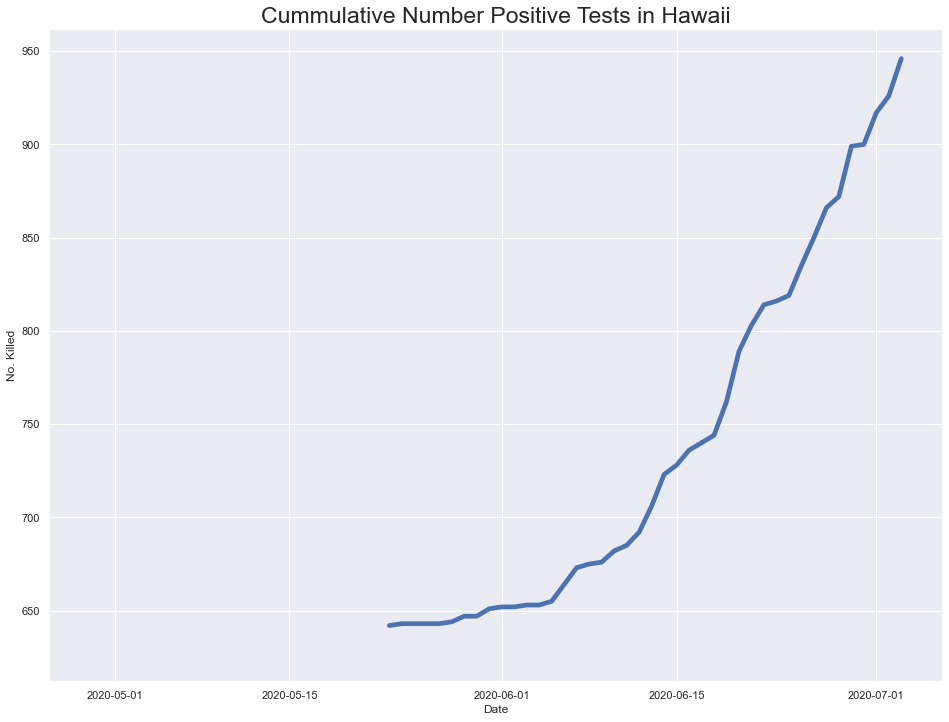

In [549]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(hawaii.date, hawaii.positiveTestsViral, linewidth=4.7)
plt.title('Cummulative Number Positive Tests in Hawaii', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

Text(0, 0.5, '% Infected')

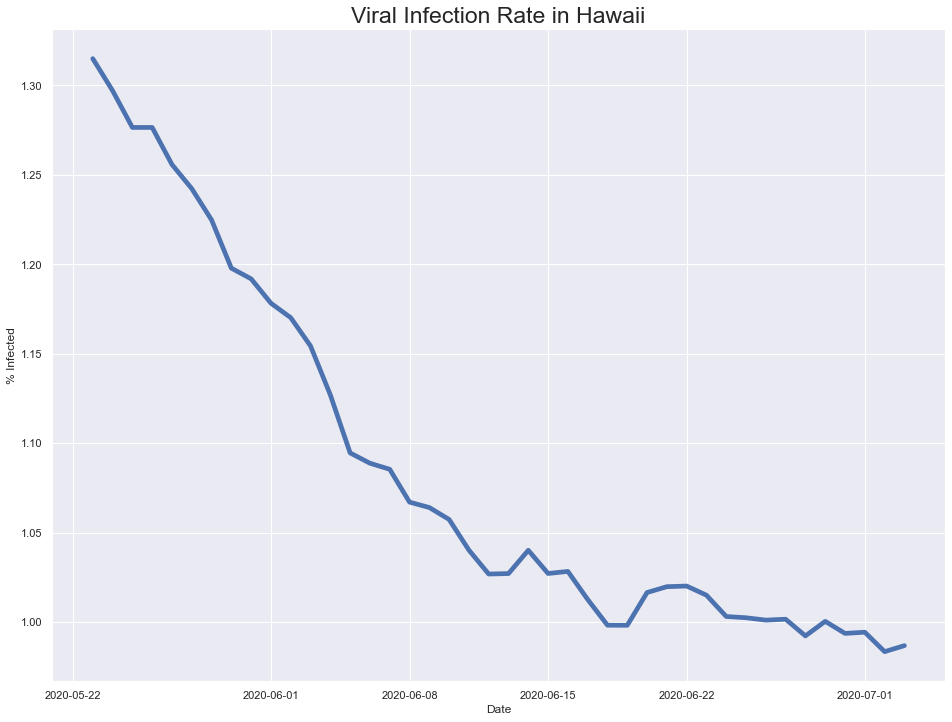

In [550]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(hawaii.date, hawaii.positiveTestsViral/hawaii.totalTestsViral*100, linewidth=4.7)
plt.title('Viral Infection Rate in Hawaii', fontsize=23)
plt.xlabel('Date')
plt.ylabel('% Infected')

In [551]:
#hide_input
###endalabama

### Idaho

In [552]:
#hide_input
idaho = covid_df.loc[(covid_df['abbrev'] == 'ID') & (covid_df['state']== 'Idaho')] 


Text(0, 0.5, 'No. Patients')

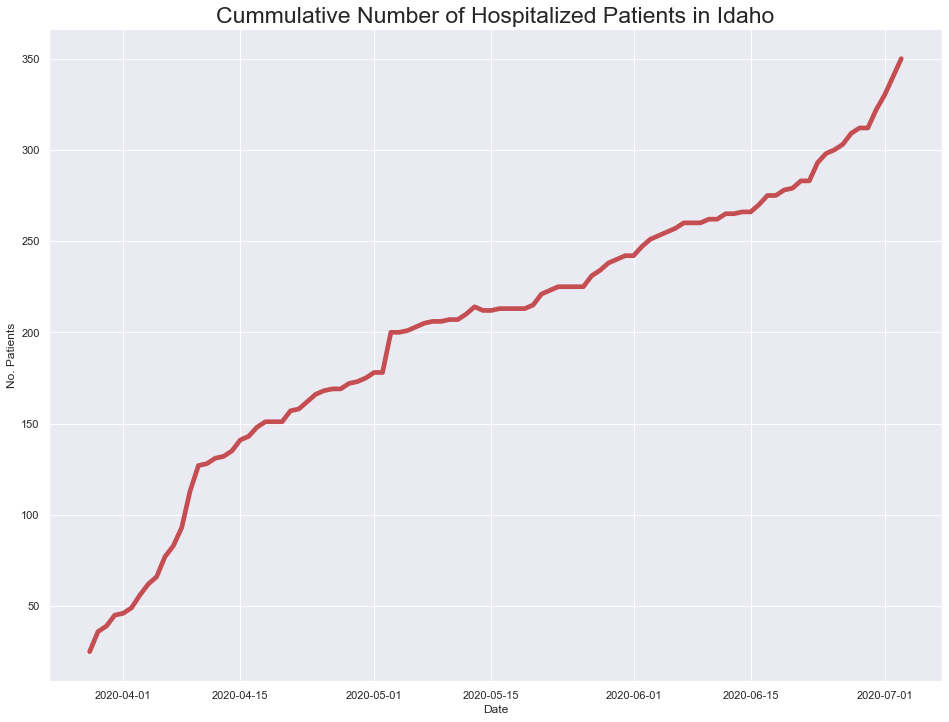

In [553]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(idaho.date, idaho.hospitalized, linewidth=4.7, color='r')
plt.title('Cummulative Number of Hospitalized Patients in Idaho', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

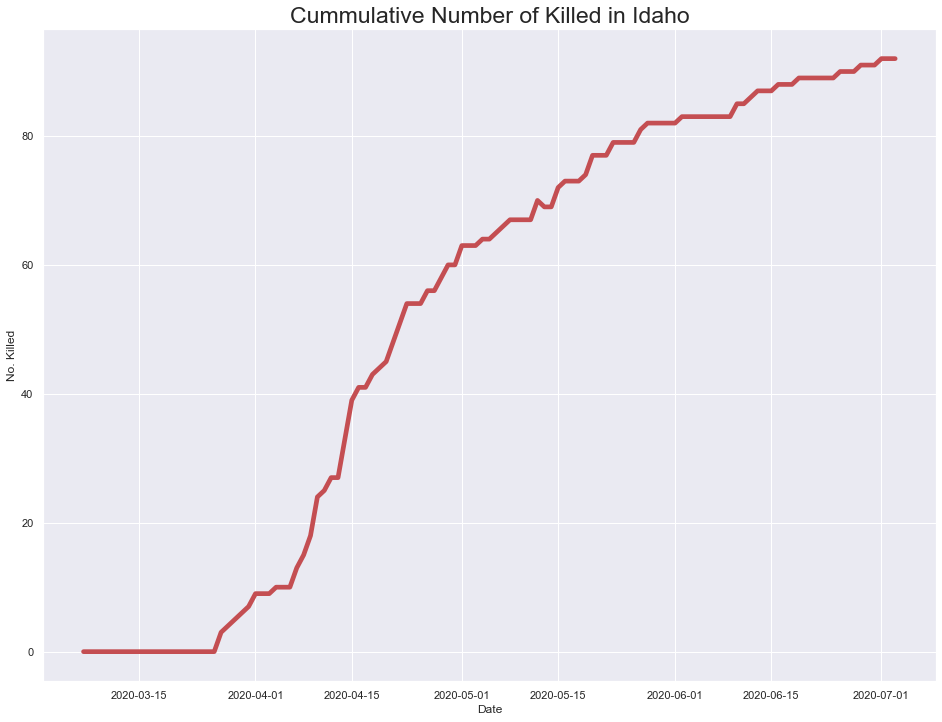

In [554]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(idaho.date, idaho.death, linewidth=4.7, color='r')
plt.title('Cummulative Number of Killed in Idaho', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

Text(0, 0.5, 'No. Patients')

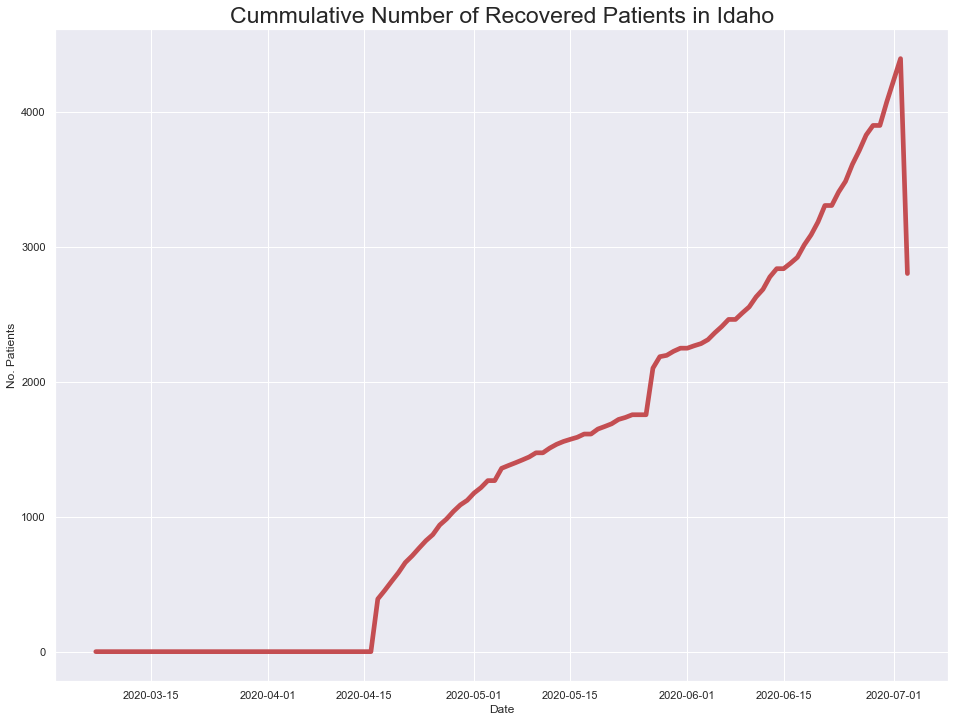

In [555]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(idaho.date, idaho.recovered, linewidth=4.7, color='r')
plt.title('Cummulative Number of Recovered Patients in Idaho', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [556]:
#hide_input
###endidaho

### Iowa

In [557]:
#hide_input
iowa = covid_df.loc[(covid_df['abbrev'] == 'IA') & (covid_df['state']== 'Iowa')] 


Text(0, 0.5, 'No. Patients')

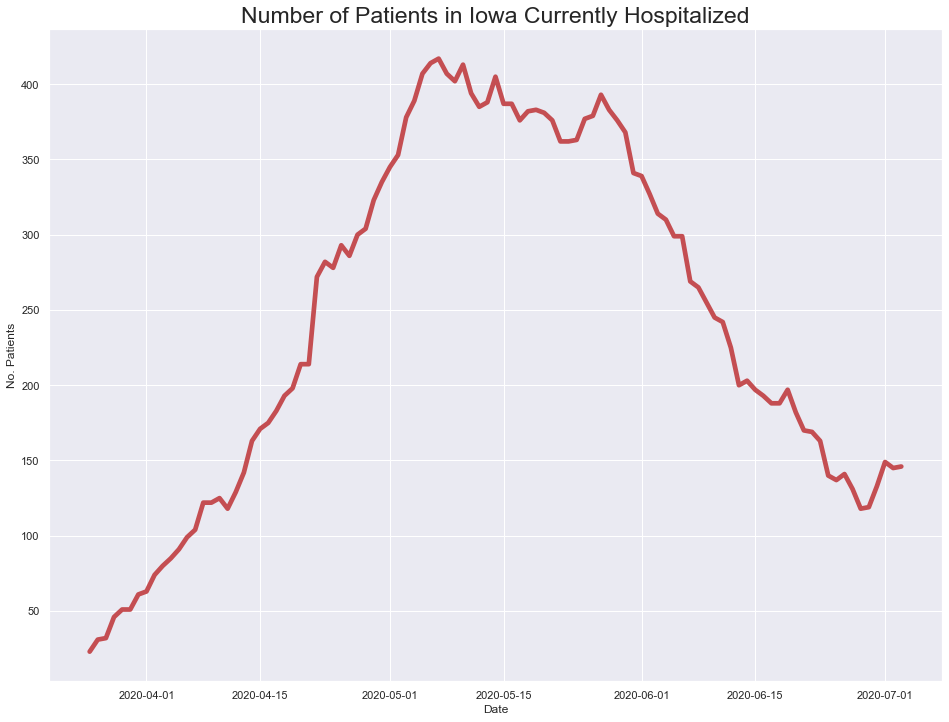

In [558]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(iowa.date, iowa.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Iowa Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

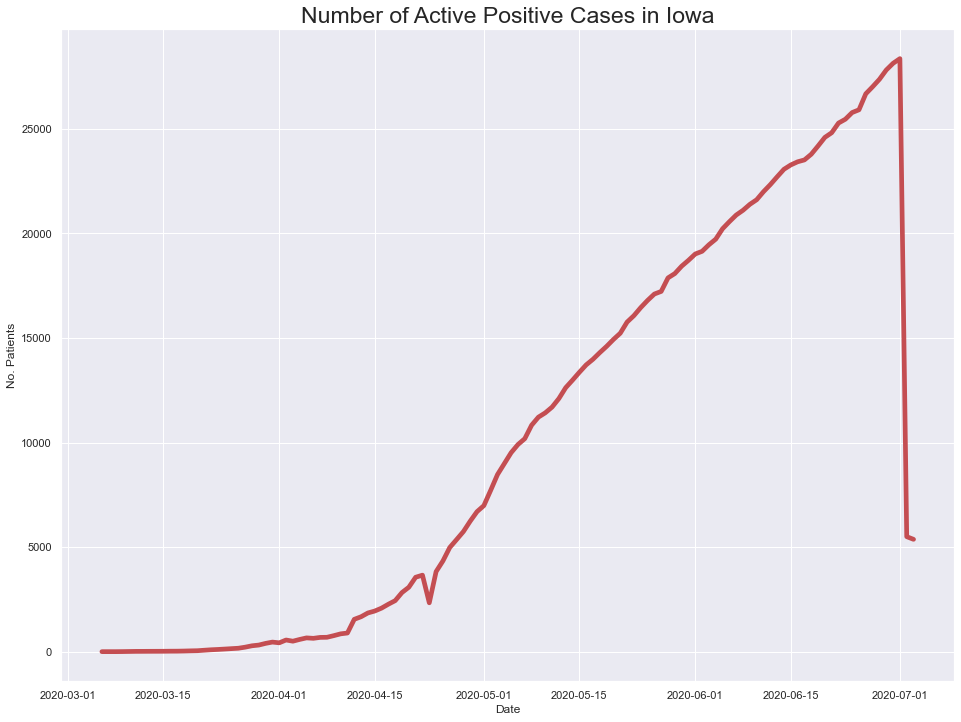

In [559]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(iowa.date, iowa.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Iowa', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

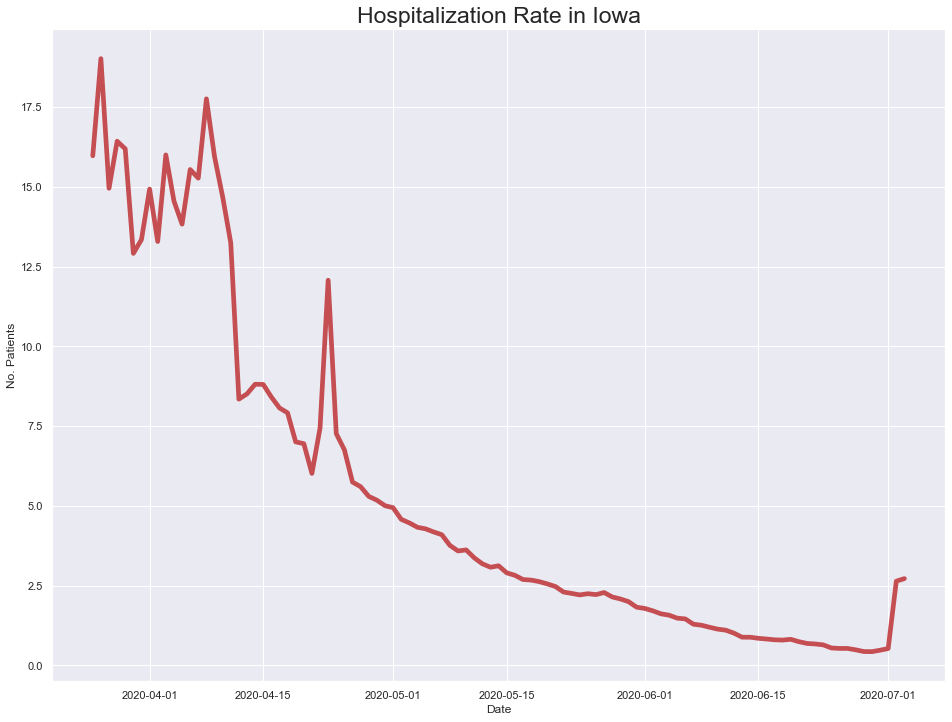

In [560]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(iowa.date, iowa.hospitalizedCurrently/iowa.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Iowa', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

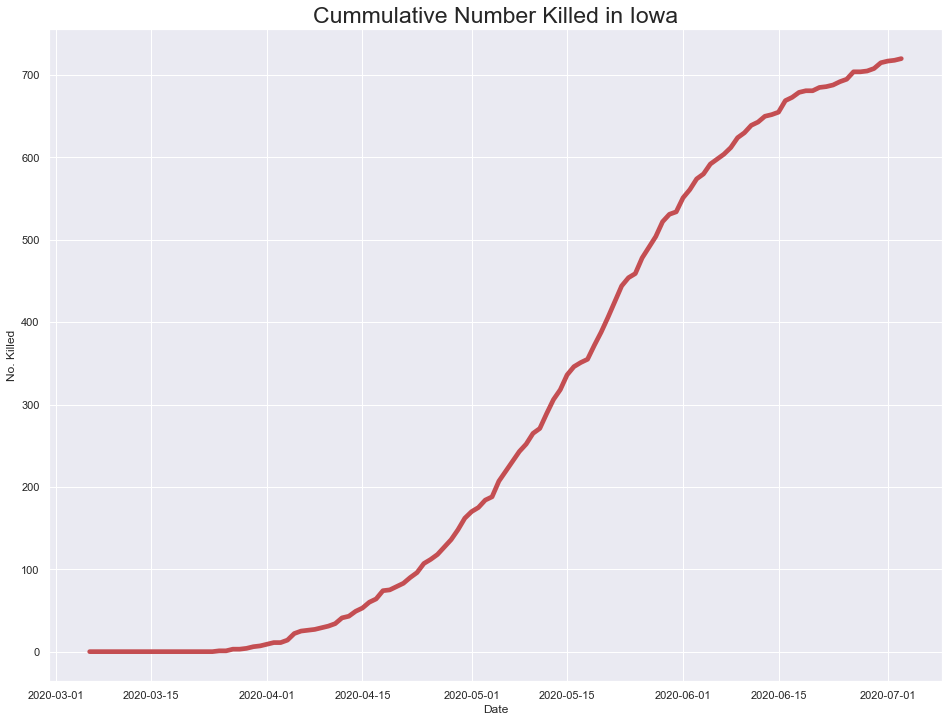

In [561]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(iowa.date, iowa.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Iowa', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [562]:
#hide_input
# Checking which cols have NaN values
iowa[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
iowa.head()

# Omit the NaN cols
iowa = iowa[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

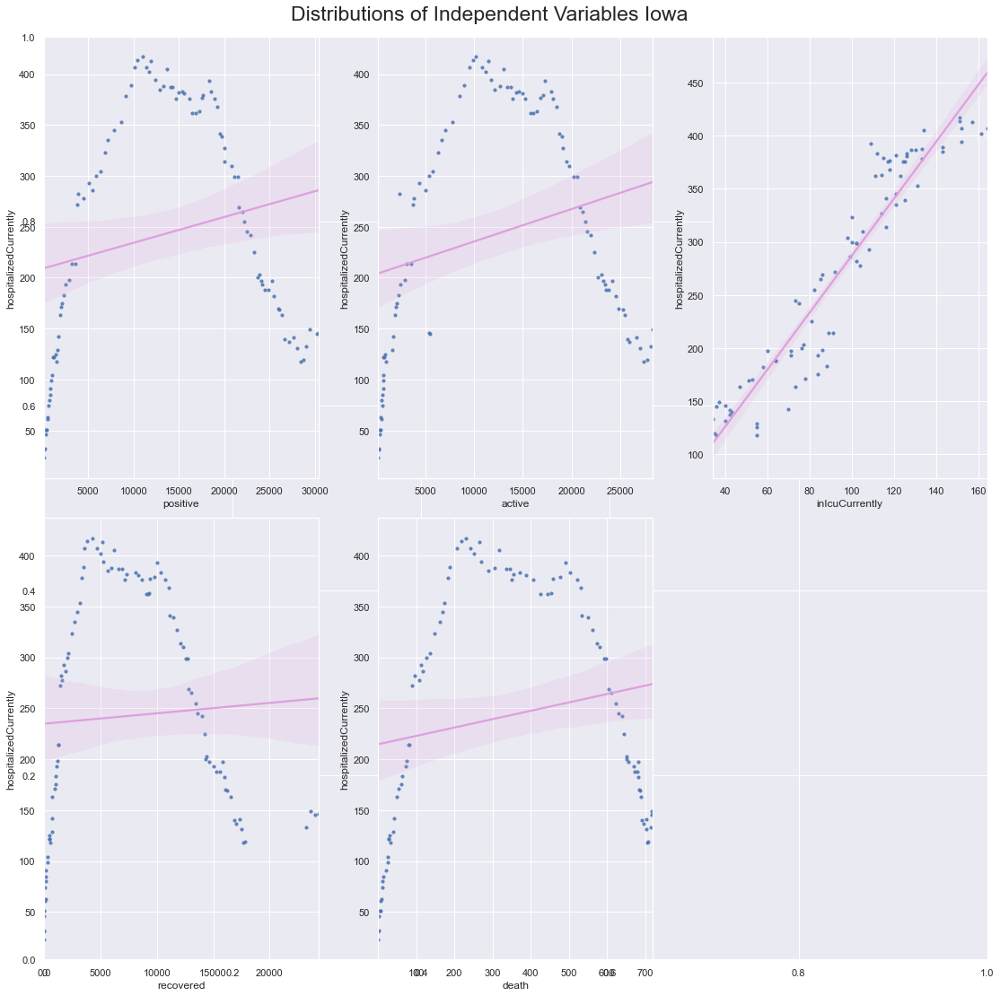

In [563]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_ia = iowa.hospitalizedCurrently
indep_var_ia = iowa.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_al.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ia[col], y=target_ia, data=indep_var_ia, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Iowa', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [564]:
#hide_input
###endiowa

### Kansas

In [565]:
#hide_input
kansas = covid_df.loc[(covid_df['abbrev'] == 'KS') & (covid_df['state']== 'Kansas')] 


Text(0, 0.5, 'No. Patients')

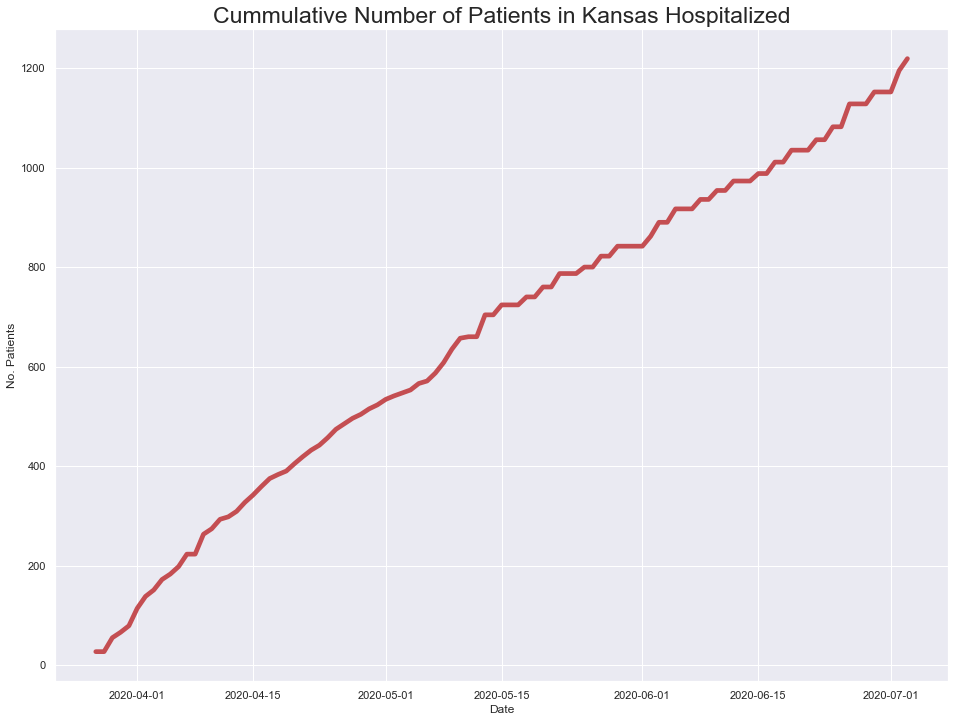

In [566]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(kansas.date, kansas.hospitalizedCumulative, linewidth=4.7, color='r')
plt.title('Cummulative Number of Patients in Kansas Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

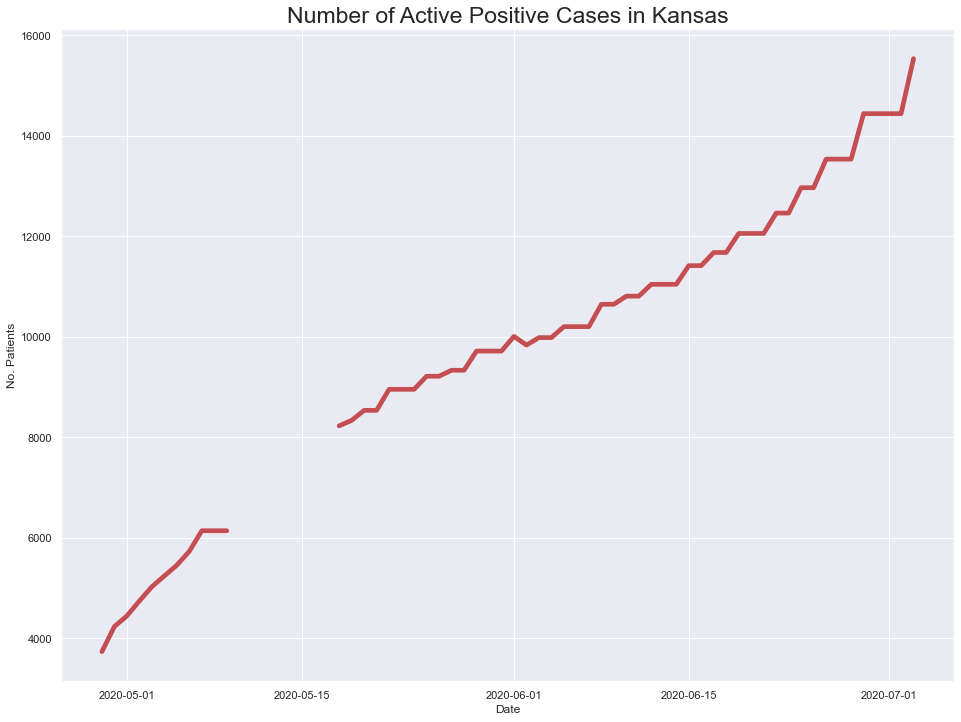

In [567]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(kansas.date, kansas.positiveCasesViral, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Kansas', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [568]:
#hide_input
###endkansas

### Kentucky

In [569]:
#hide_input
kentucky = covid_df.loc[(covid_df['abbrev'] == 'KY') & (covid_df['state']== 'Kentucky')] 


Text(0, 0.5, 'No. Patients')

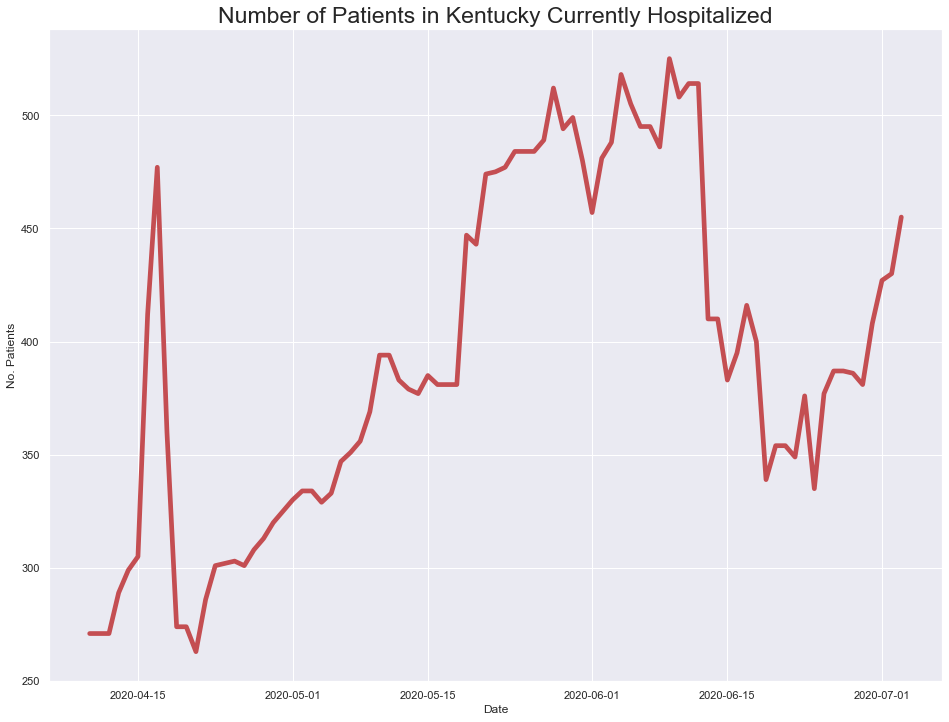

In [570]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(kentucky.date, kentucky.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Kentucky Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

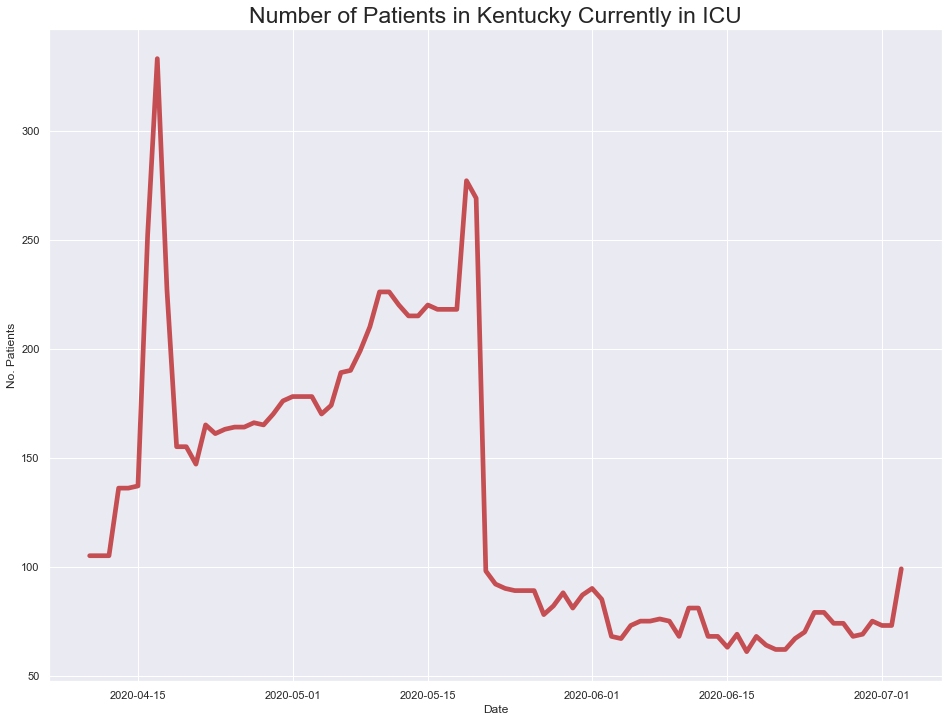

In [571]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(kentucky.date, kentucky.inIcuCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Kentucky Currently in ICU', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

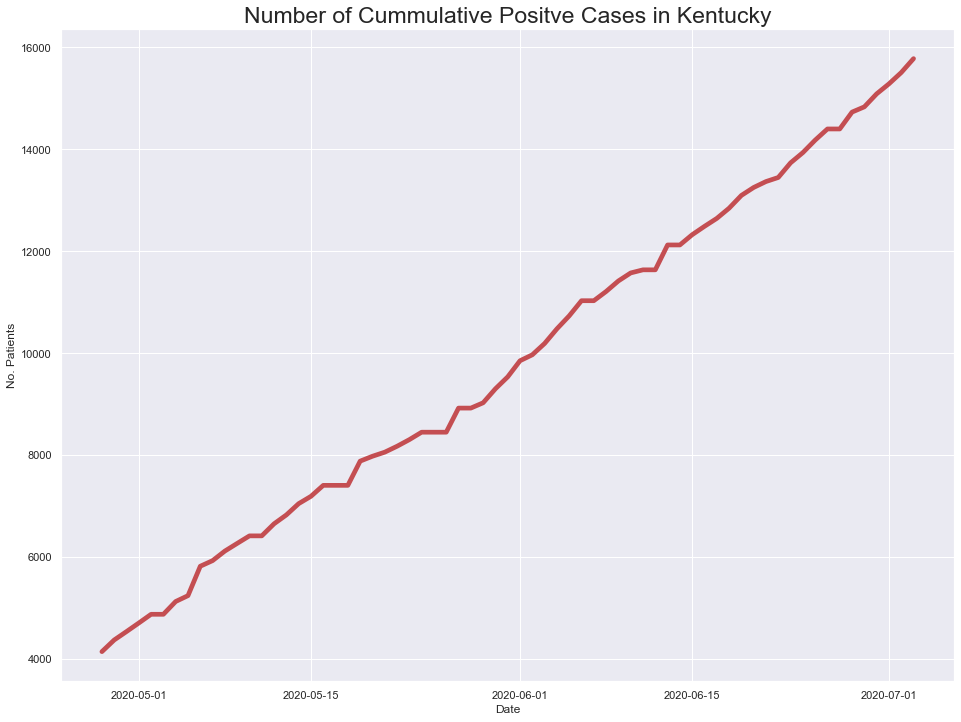

In [572]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(kentucky.date, kentucky.positiveCasesViral, linewidth=4.7, color='r')
plt.title('Number of Cummulative Positve Cases in Kentucky', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [573]:
#hide_input
# Checking which cols have NaN values
kentucky[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
kentucky.head()

# Omit the NaN cols
kentucky = kentucky[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

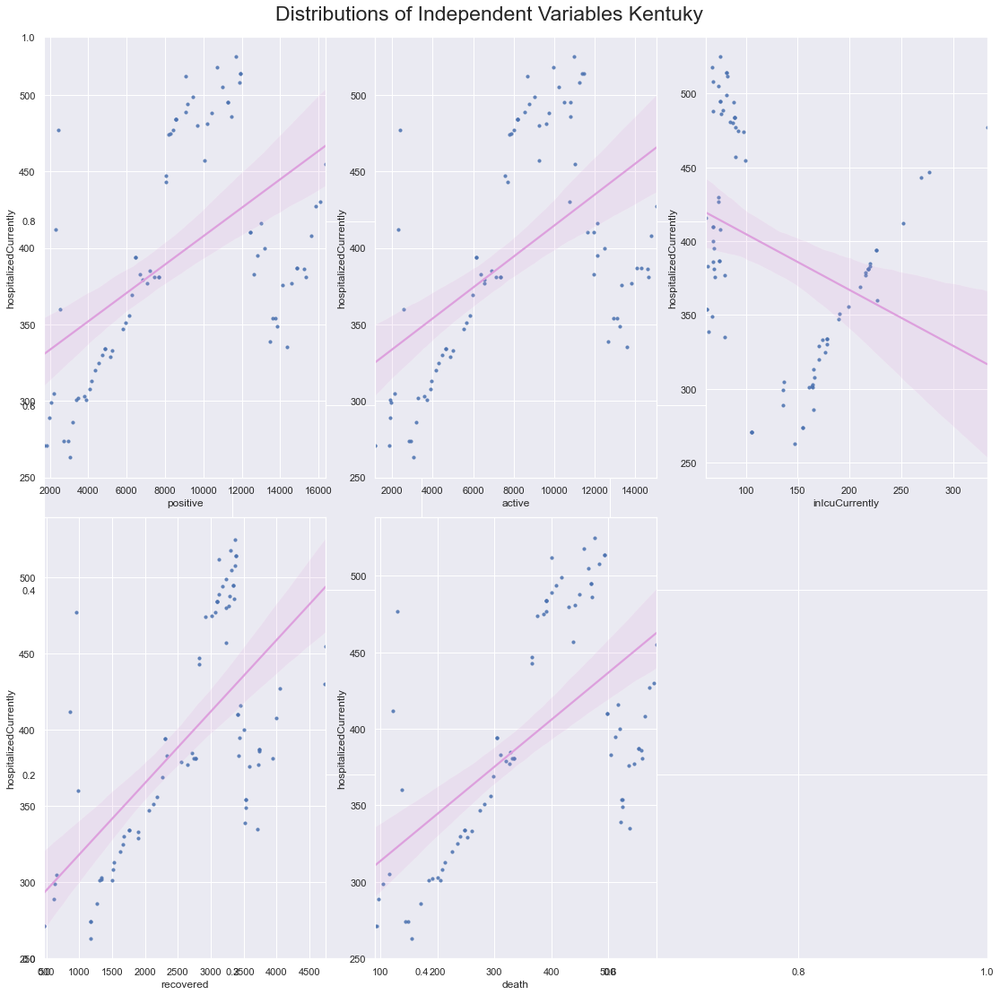

In [574]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_ky = kentucky.hospitalizedCurrently
indep_var_ky = kentucky.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ky.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ky[col], y=target_ky, data=indep_var_ky, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Kentuky', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [575]:
#hide_input
###endkentucky

### Louisiana

In [576]:
#hide_input
louisiana = covid_df.loc[(covid_df['abbrev'] == 'LA') & (covid_df['state']== 'Louisiana')] 


Text(0, 0.5, 'No. Patients')

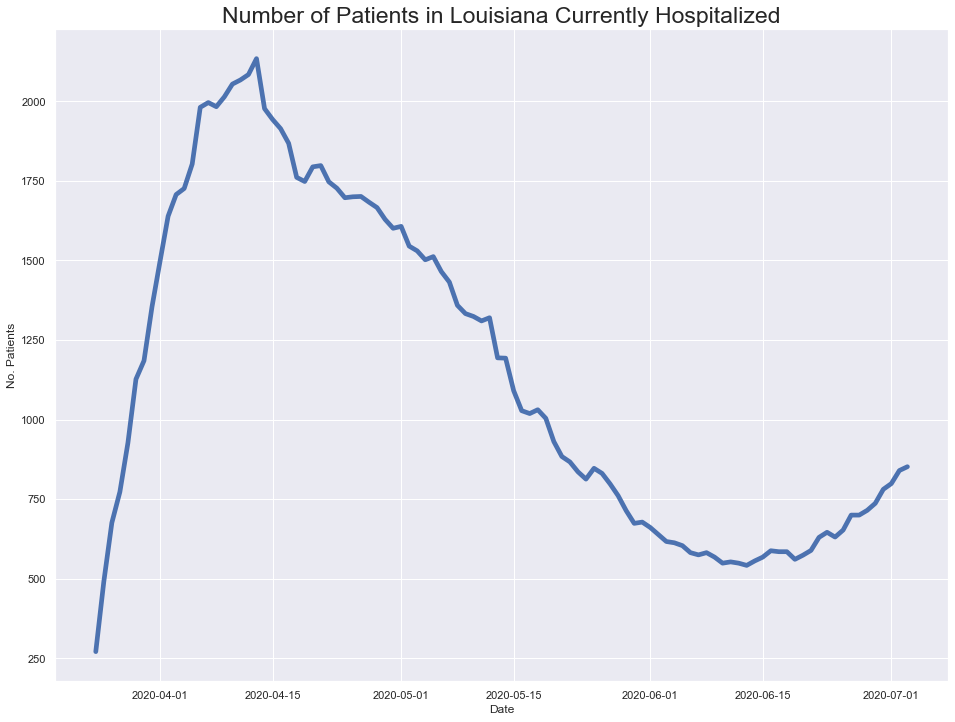

In [577]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(louisiana.date, louisiana.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Louisiana Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

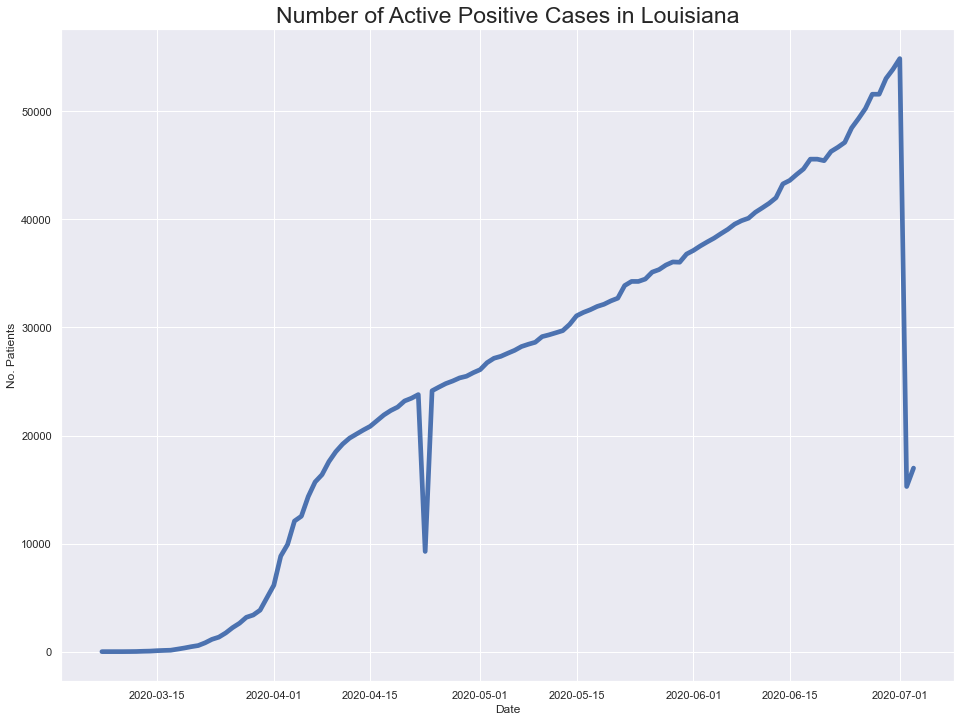

In [578]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(louisiana.date, louisiana.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Louisiana', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

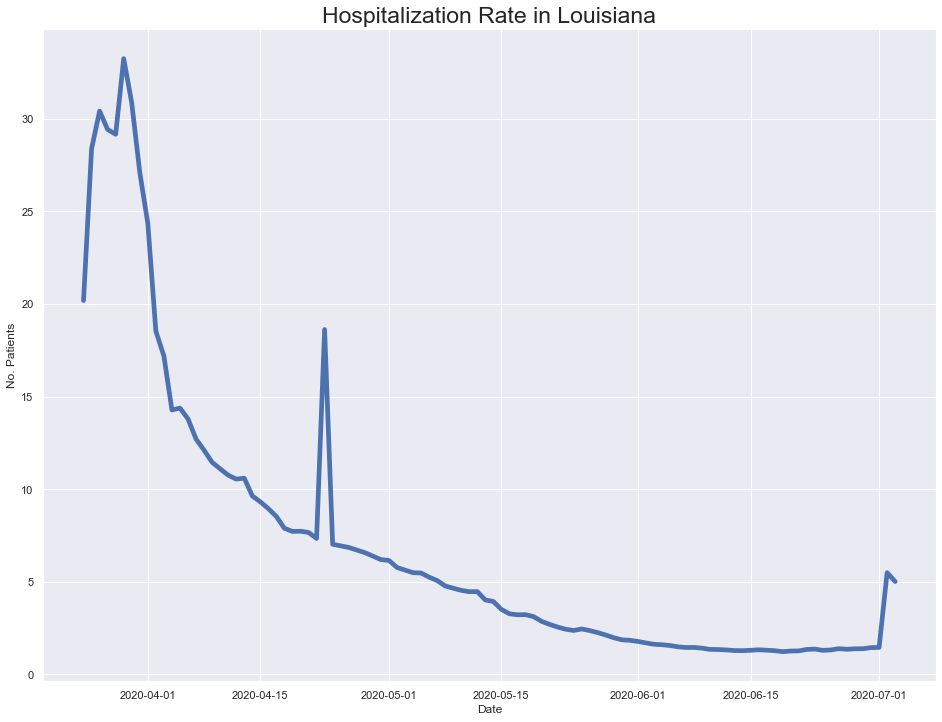

In [579]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(louisiana.date, louisiana.hospitalizedCurrently/louisiana.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Louisiana', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

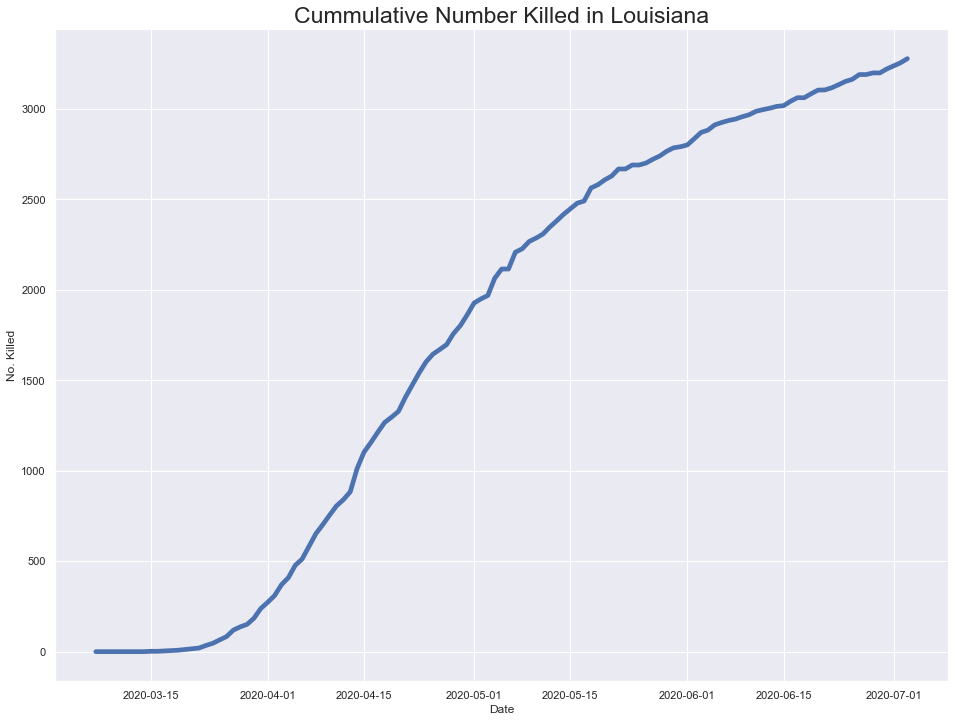

In [580]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(louisiana.date, louisiana.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Louisiana', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [581]:
#hide_input
# Checking which cols have NaN values
louisiana[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
louisiana.head()

# Omit the NaN cols
louisiana = louisiana[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

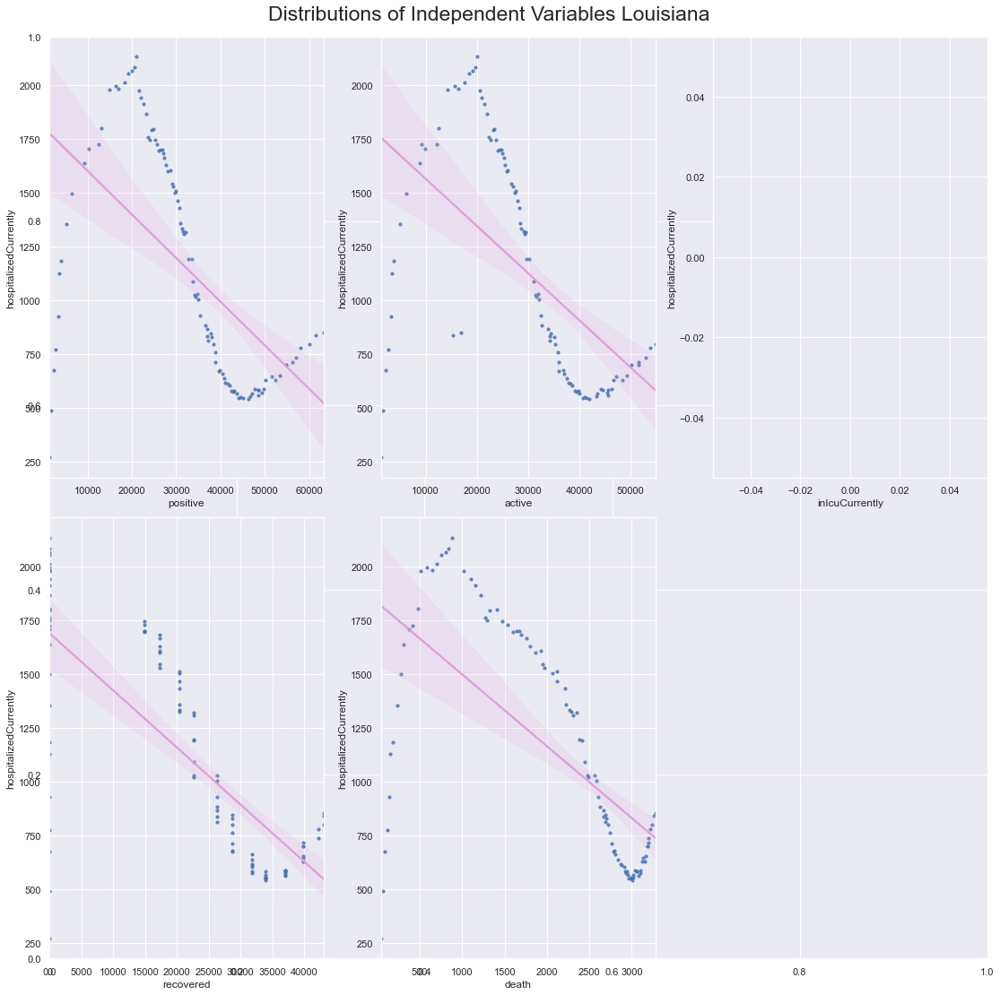

In [582]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_la = louisiana.hospitalizedCurrently
indep_var_la = louisiana.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_la.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_la[col], y=target_la, data=indep_var_la, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Louisiana', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [583]:
#hide_input
###endlouisiana

### Maine

In [584]:
#hide_input
maine = covid_df.loc[(covid_df['abbrev'] == 'ME') & (covid_df['state']== 'Maine')] 


Text(0, 0.5, 'No. Patients')

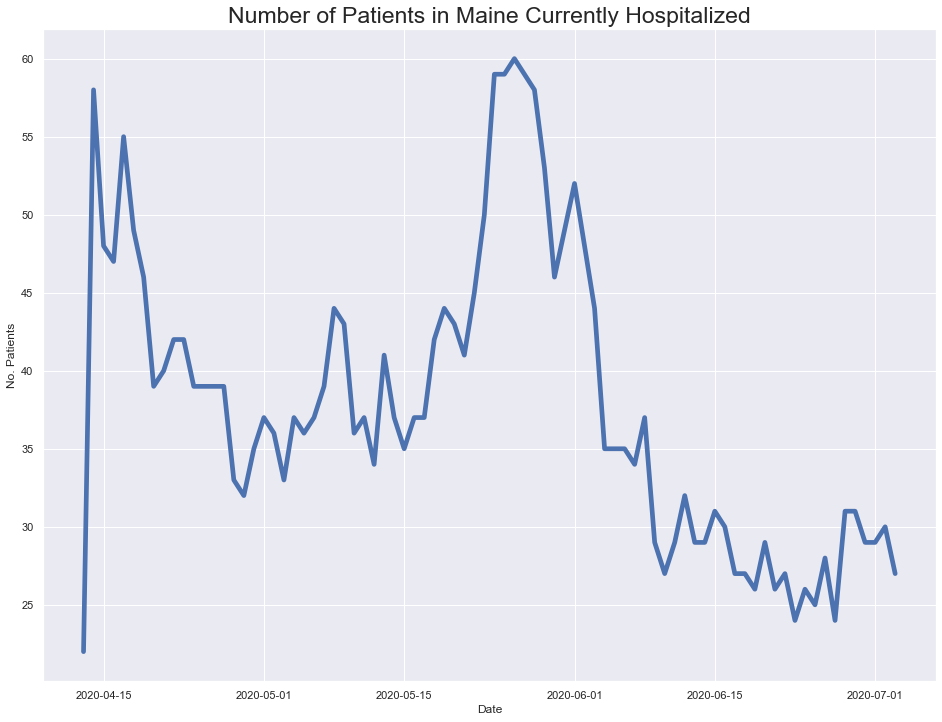

In [585]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maine.date, maine.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Maine Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

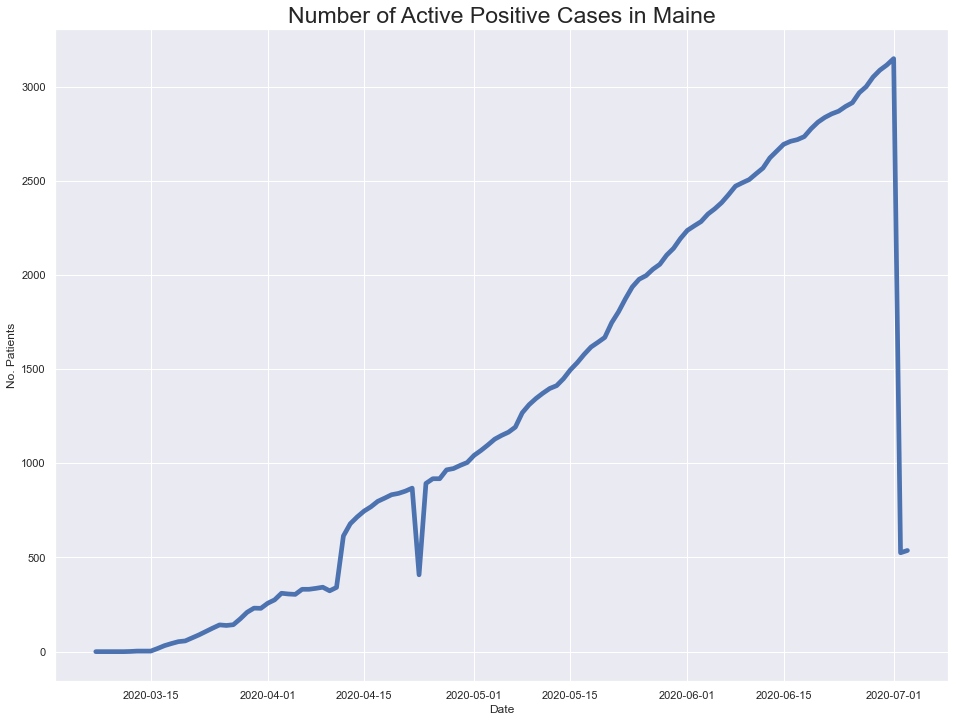

In [586]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maine.date, maine.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Maine', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

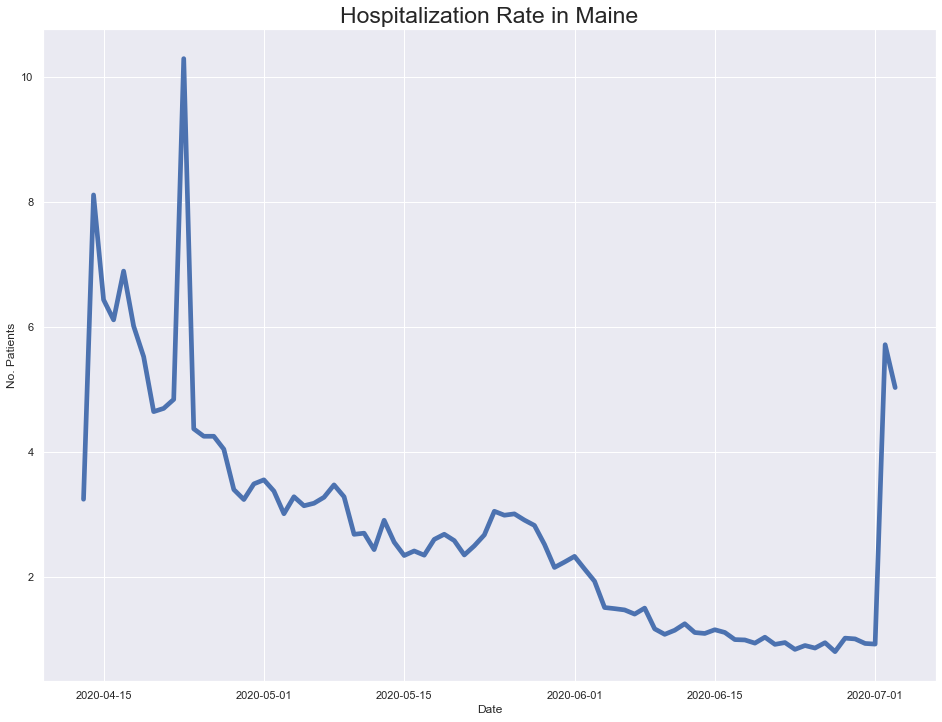

In [587]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maine.date, maine.hospitalizedCurrently/maine.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Maine', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

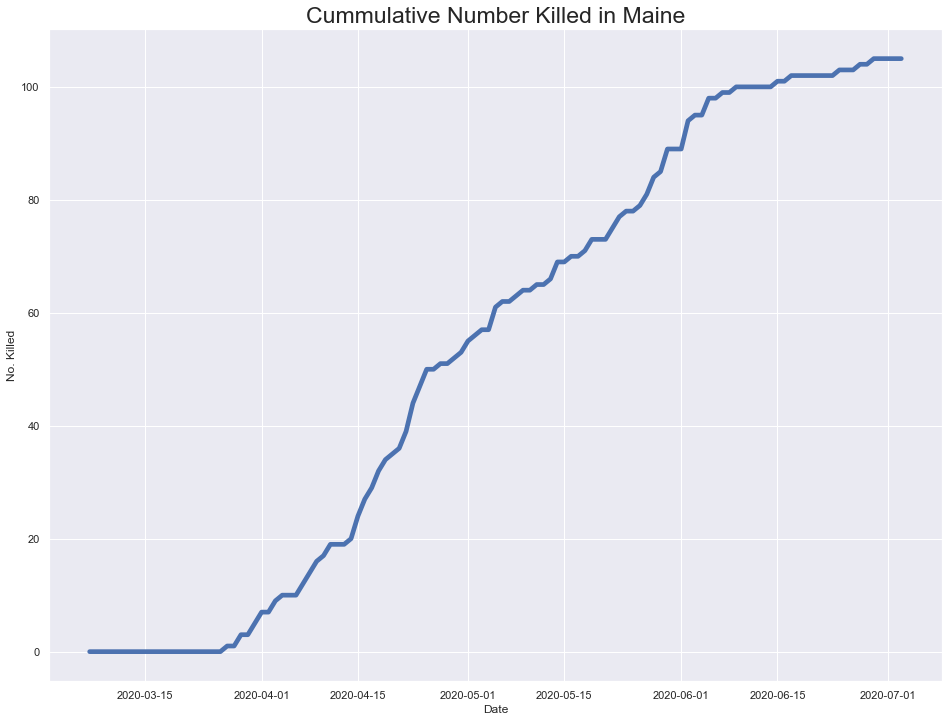

In [588]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maine.date, maine.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Maine', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [589]:
#hide_input
# Checking which cols have NaN values
maine[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
maine.head()

# Omit the NaN cols
maine = maine[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

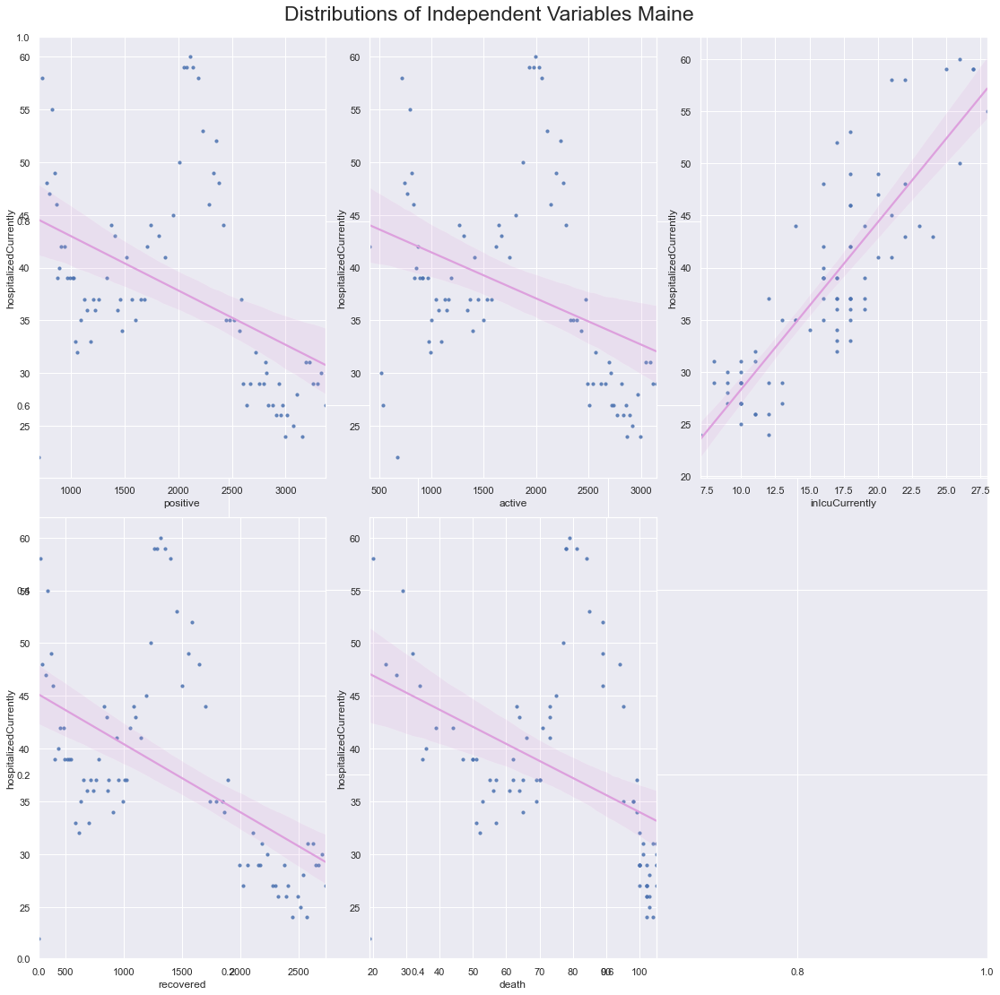

In [590]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_me = maine.hospitalizedCurrently
indep_var_me = maine.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_me.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_me[col], y=target_me, data=indep_var_me, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Maine', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [591]:
#hide_input
###endmaine

### Maryland

In [592]:
#hide_input
maryland = covid_df.loc[(covid_df['abbrev'] == 'MD') & (covid_df['state']== 'Maryland')] 


Text(0, 0.5, 'No. Patients')

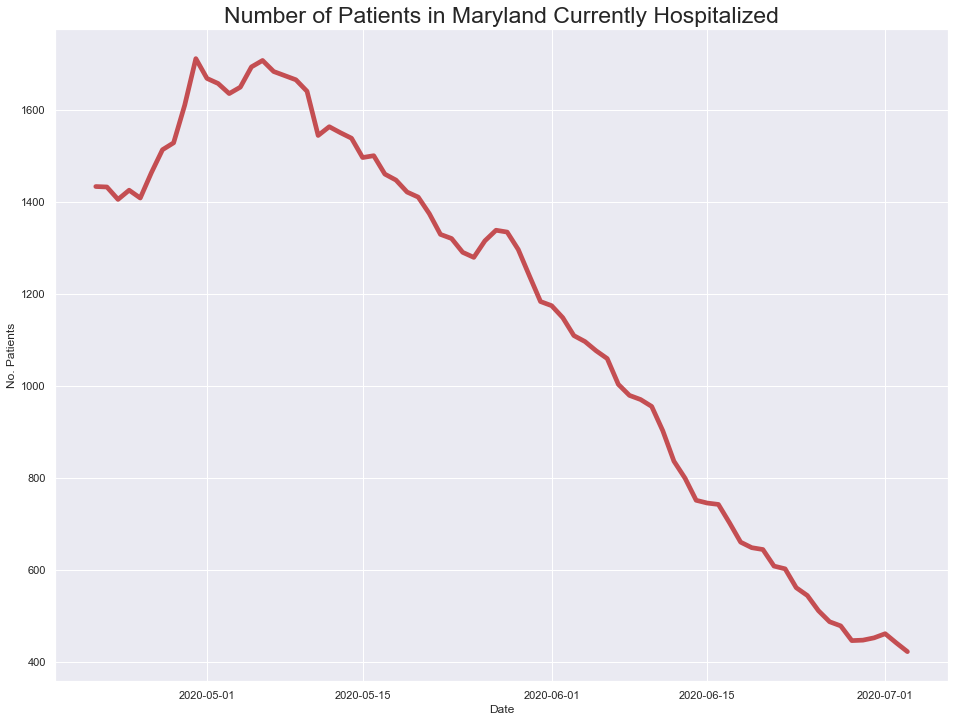

In [593]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maryland.date, maryland.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Maryland Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

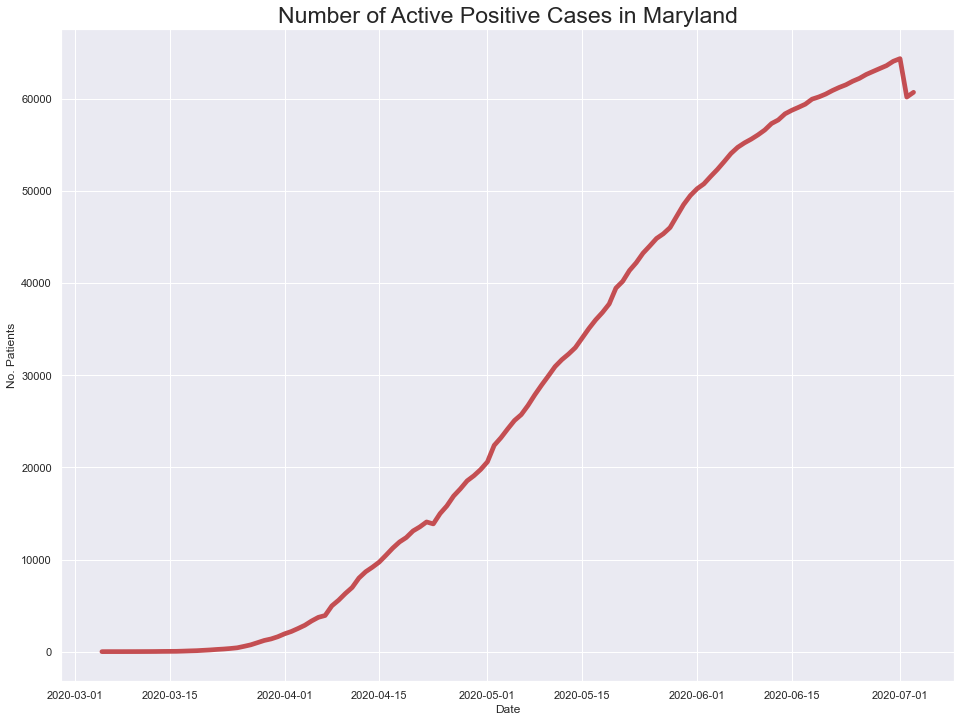

In [594]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maryland.date, maryland.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Maryland', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

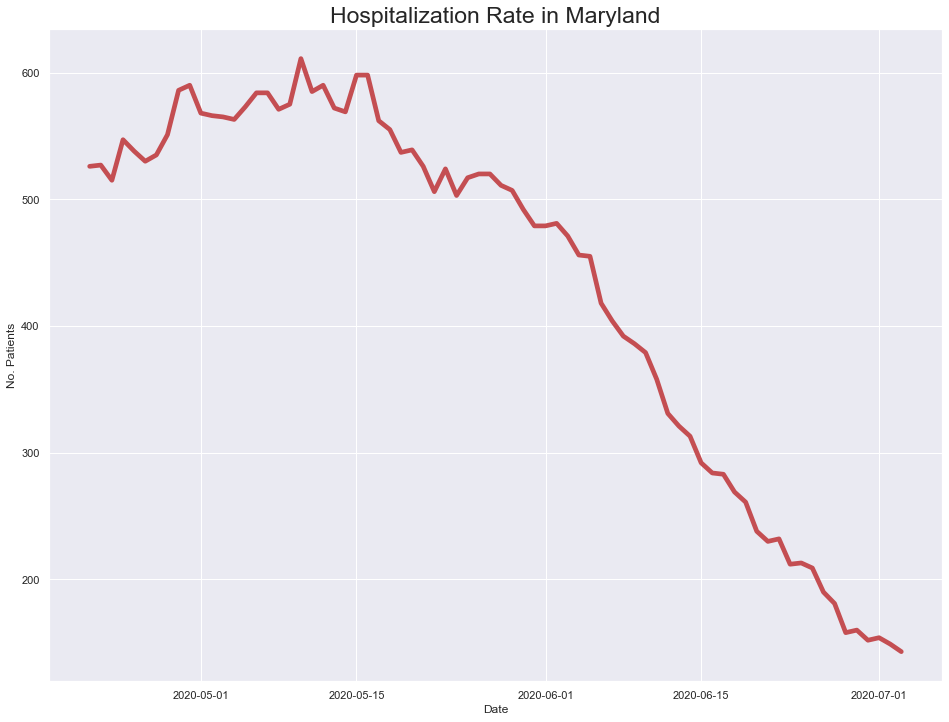

In [595]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maryland.date, maryland.inIcuCurrently, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Maryland', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

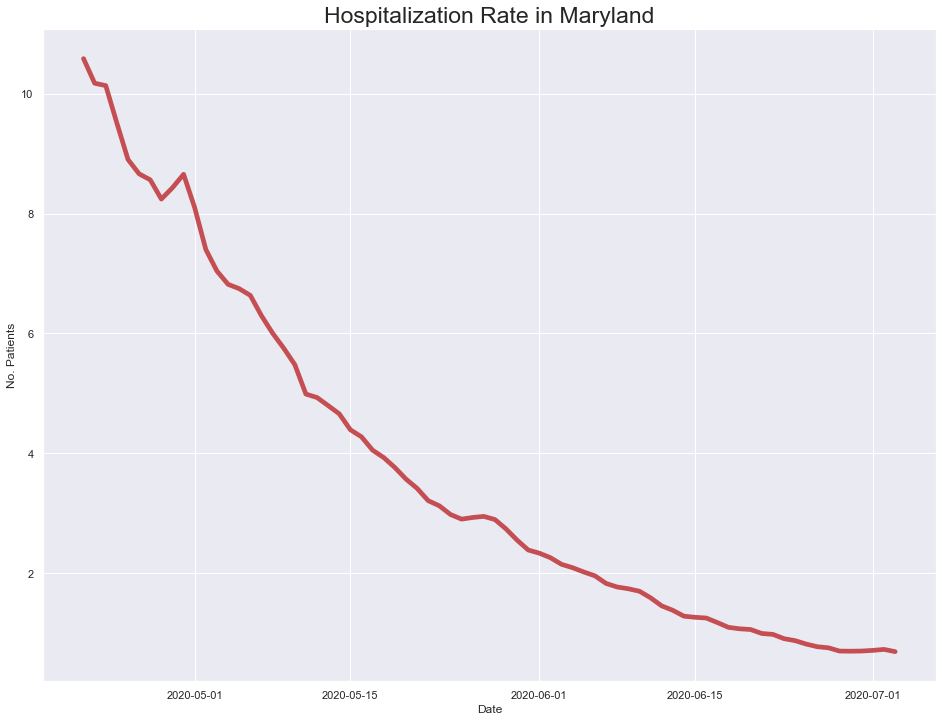

In [596]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maryland.date, maryland.hospitalizedCurrently/maryland.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Maryland', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

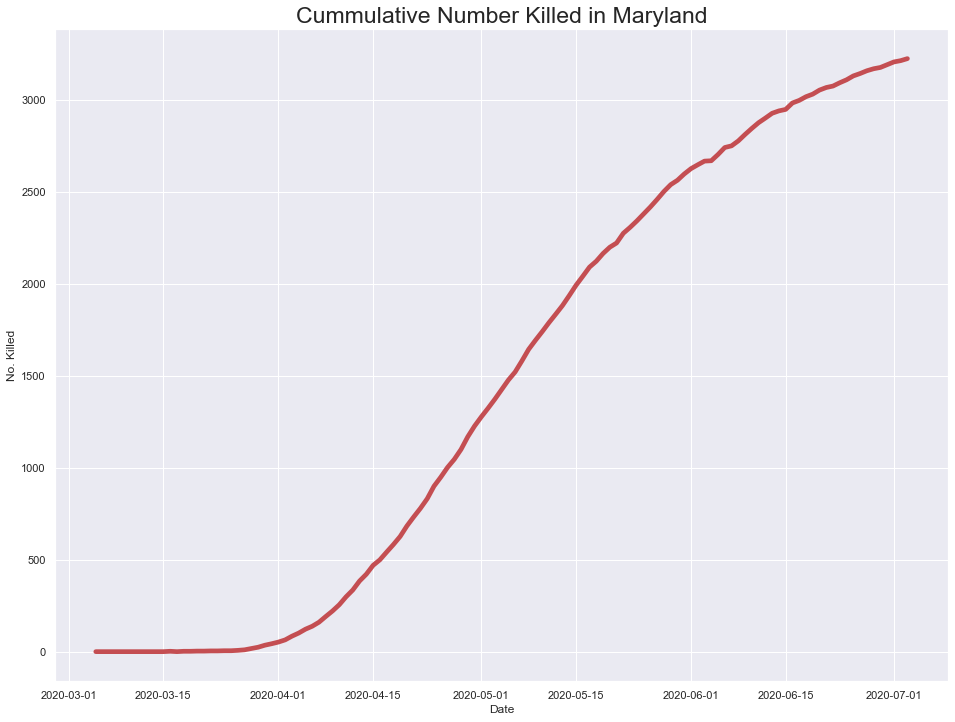

In [597]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(maryland.date, maryland.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Maryland', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [598]:
#hide_input
# Checking which cols have NaN values
maryland[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
maryland.head()

# Omit the NaN cols
maryland = maryland[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

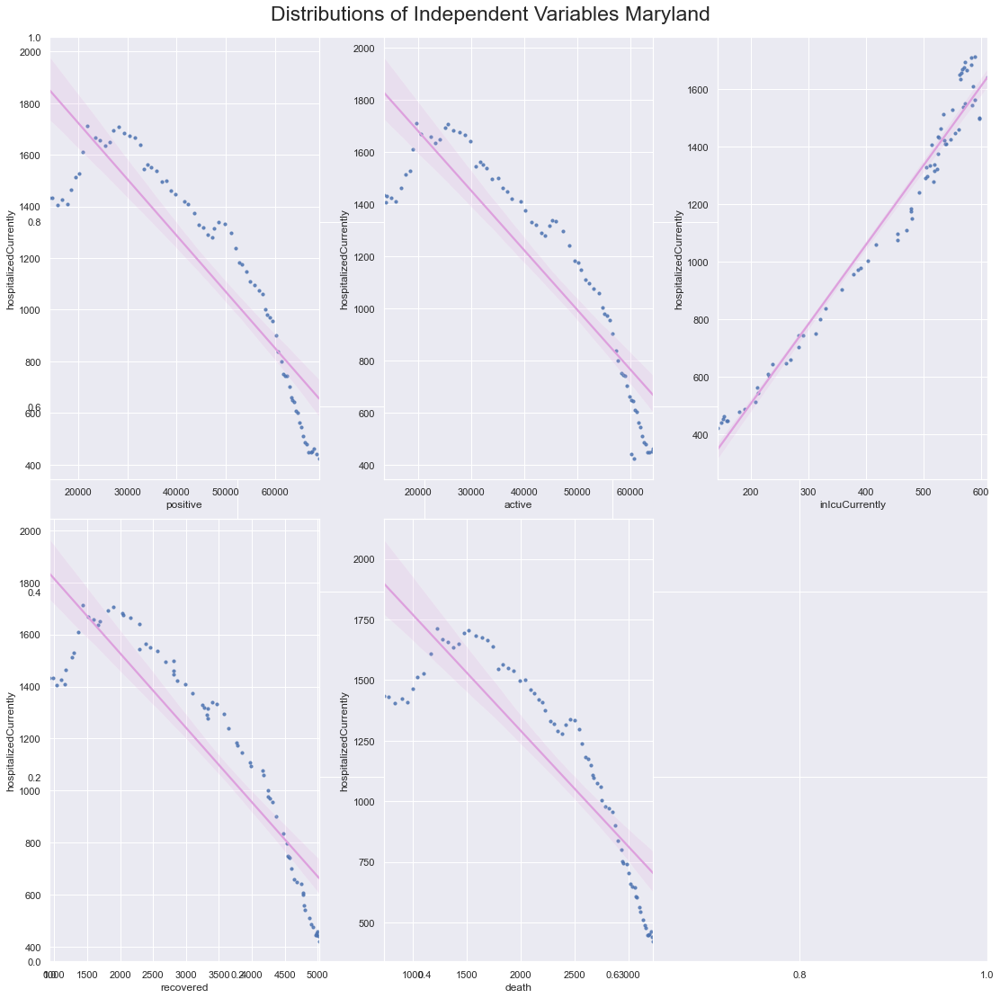

In [599]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_md = maryland.hospitalizedCurrently
indep_var_md = maryland.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_al.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_md[col], y=target_md, data=indep_var_md, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Maryland', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [600]:
#hide_input
###endmaryland

### Massachusetts

In [601]:
#hide_input
mass = covid_df.loc[(covid_df['abbrev'] == 'MA') & (covid_df['state']== 'Massachusetts')] 


Text(0, 0.5, 'No. Patients')

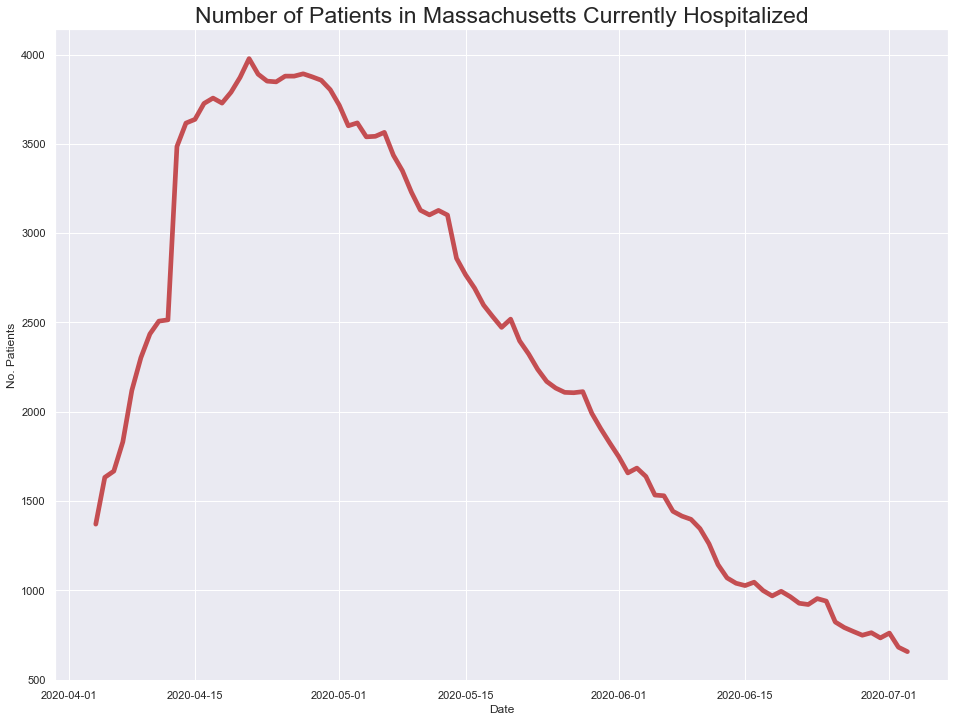

In [602]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mass.date, mass.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Massachusetts Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

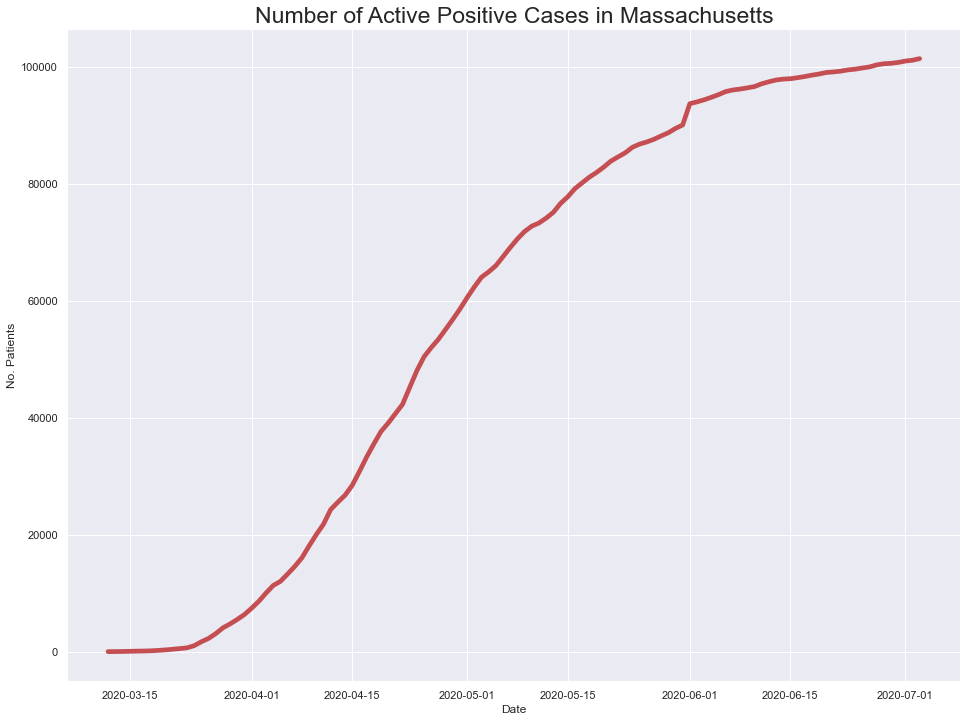

In [603]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mass.date, mass.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Massachusetts', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

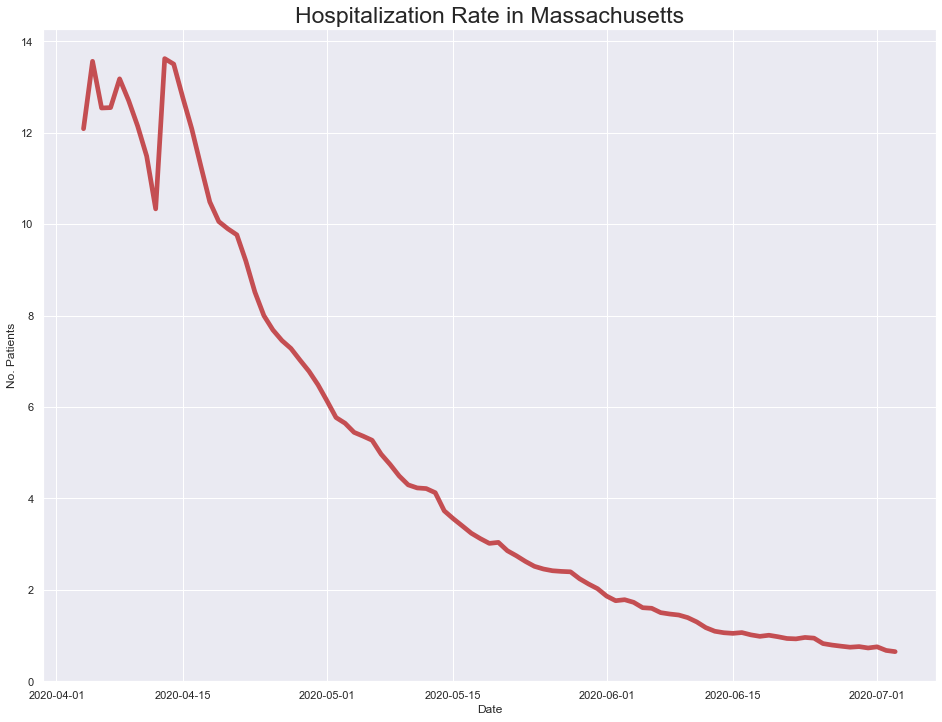

In [604]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mass.date, mass.hospitalizedCurrently/mass.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Massachusetts', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

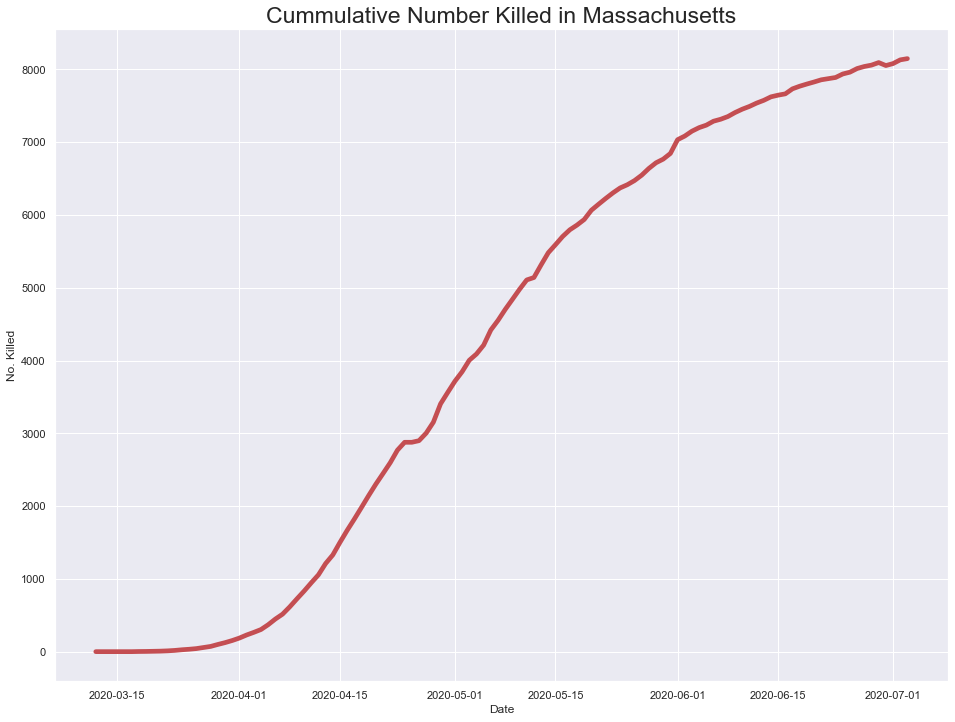

In [605]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mass.date, mass.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Massachusetts', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [606]:
#hide_input
# Checking which cols have NaN values
mass[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
mass.head()

# Omit the NaN cols
mass = mass[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

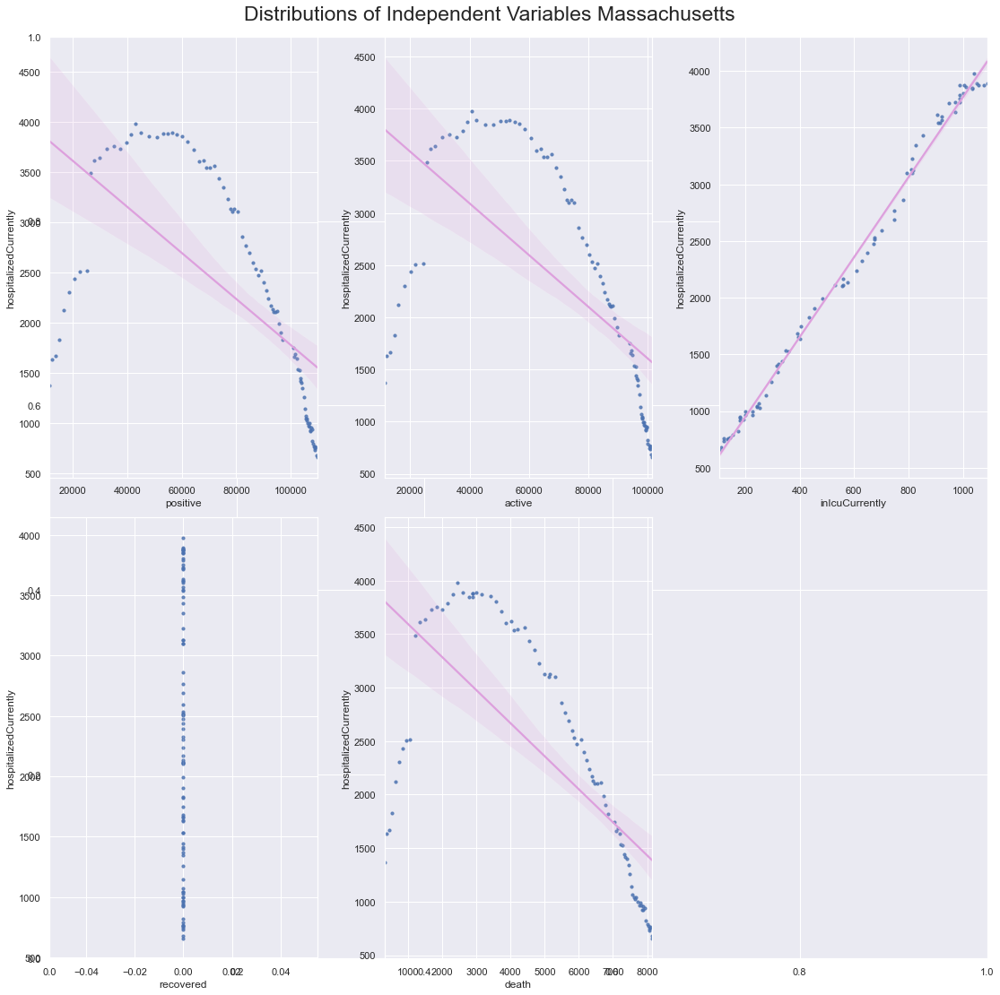

In [607]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_ma = mass.hospitalizedCurrently
indep_var_ma = mass.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ma.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ma[col], y=target_ma, data=indep_var_ma, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Massachusetts', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [608]:
#hide_input
###endmass

### Michigan

In [609]:
#hide_input
mich = covid_df.loc[(covid_df['abbrev'] == 'MI') & (covid_df['state']== 'Michigan')] 


Text(0, 0.5, 'No. Patients')

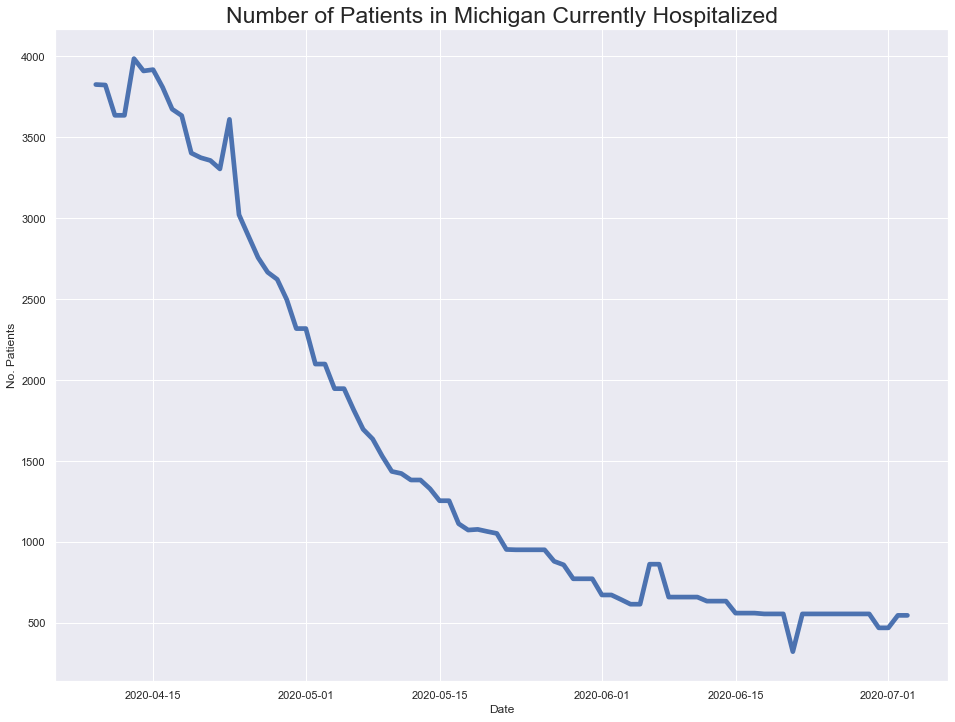

In [610]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mich.date, mich.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Michigan Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

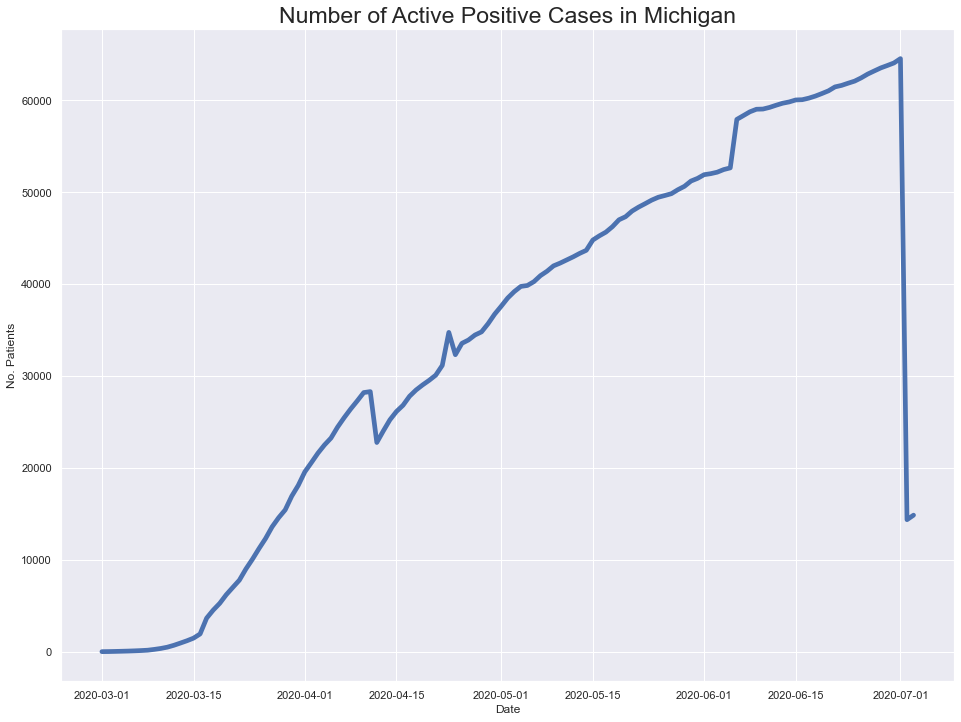

In [611]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mich.date, mich.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Michigan', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

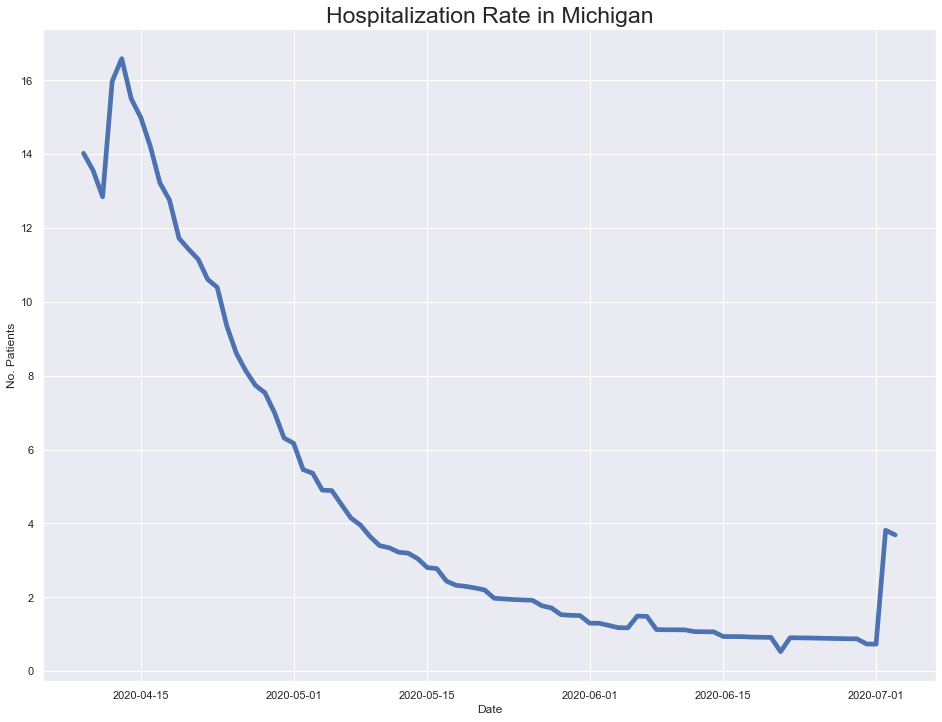

In [612]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mich.date, mich.hospitalizedCurrently/mich.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Michigan', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

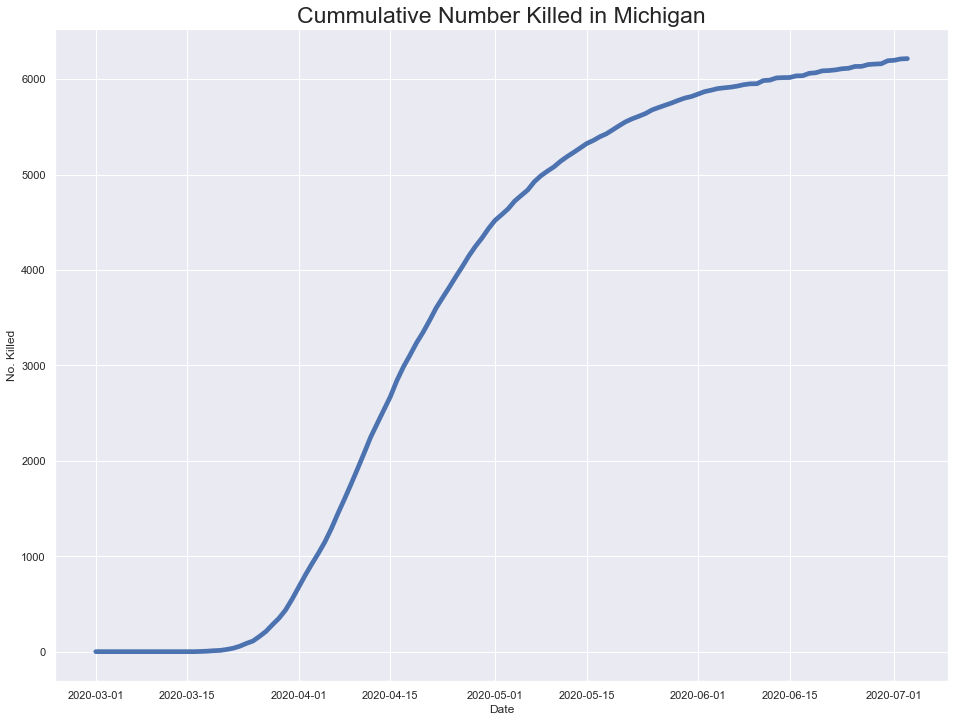

In [613]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mich.date, mich.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Michigan', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [614]:
#hide_input
# Checking which cols have NaN values
mich[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
mich.head()

# Omit the NaN cols
mich = mich[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

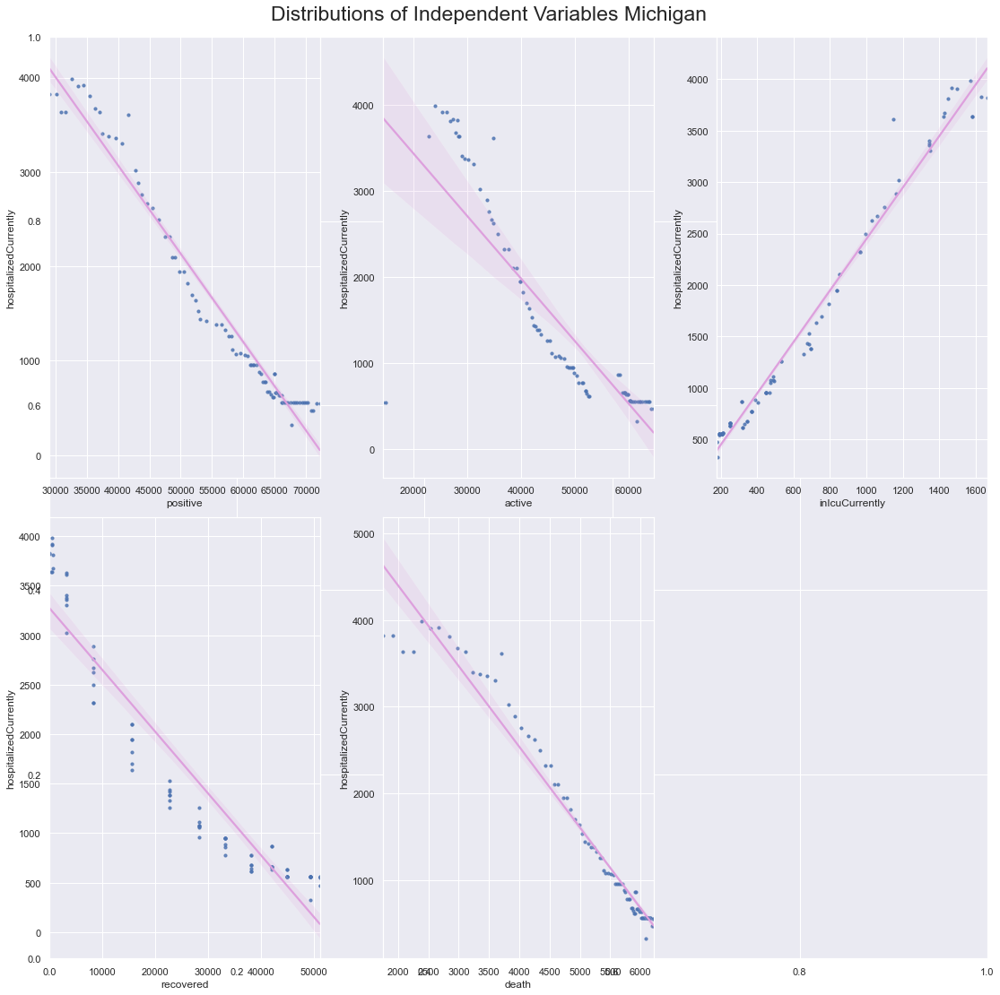

In [615]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_mi = mich.hospitalizedCurrently
indep_var_mi = mich.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_mi.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_mi[col], y=target_mi, data=indep_var_mi, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Michigan', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [616]:
#hide_input
###endmichigan

### Minnesota

In [617]:
#hide_input
minn = covid_df.loc[(covid_df['abbrev'] == 'MN') & (covid_df['state']== 'Minnesota')] 


Text(0, 0.5, 'No. Patients')

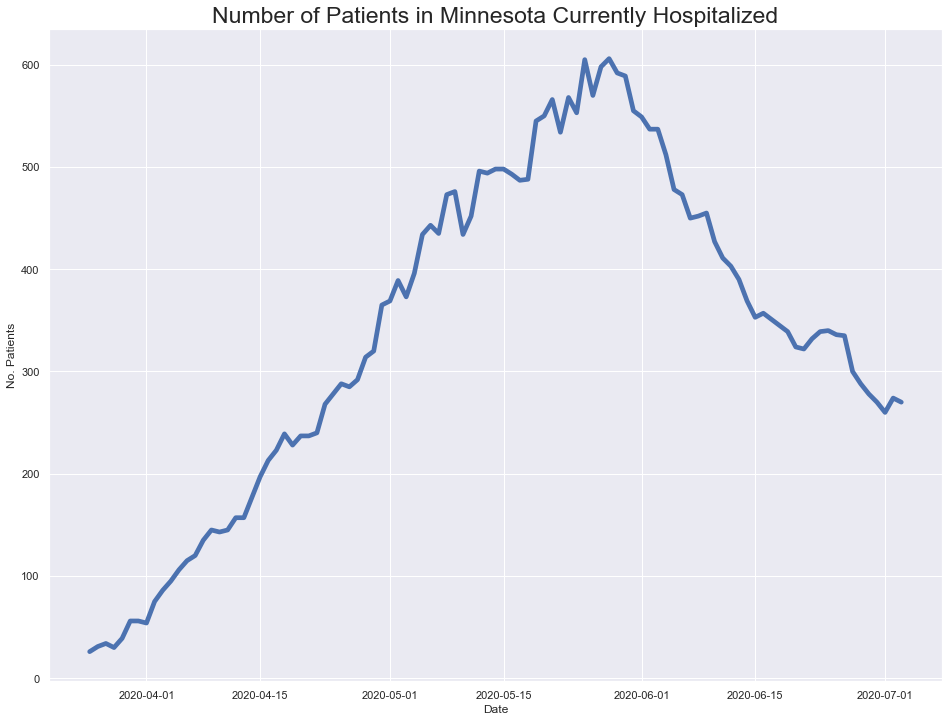

In [618]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(minn.date, minn.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Minnesota Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

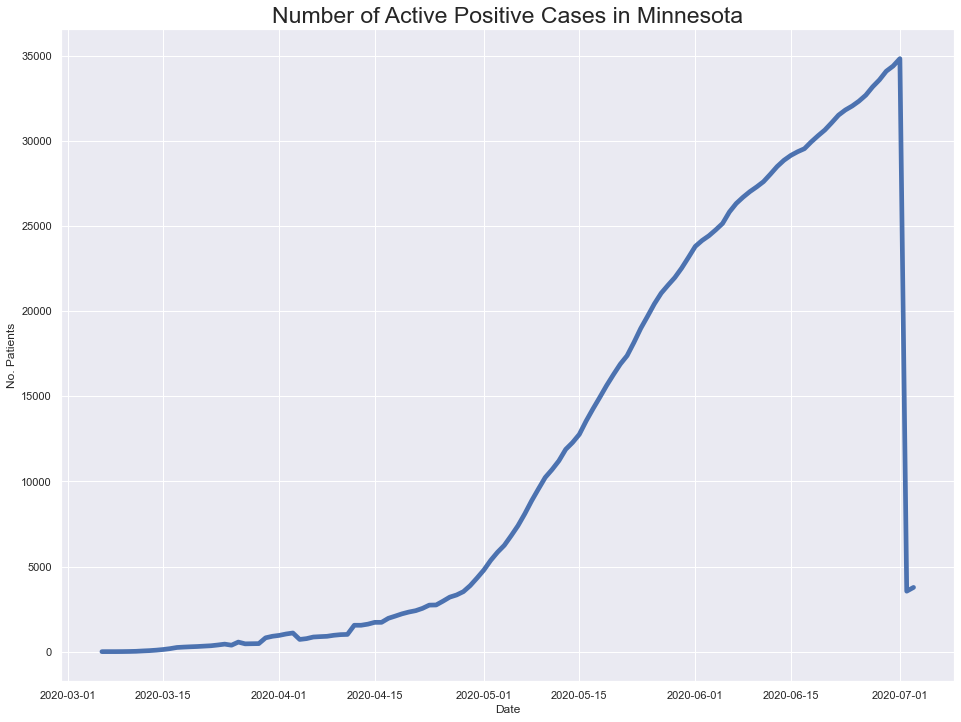

In [619]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(minn.date, minn.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Minnesota', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

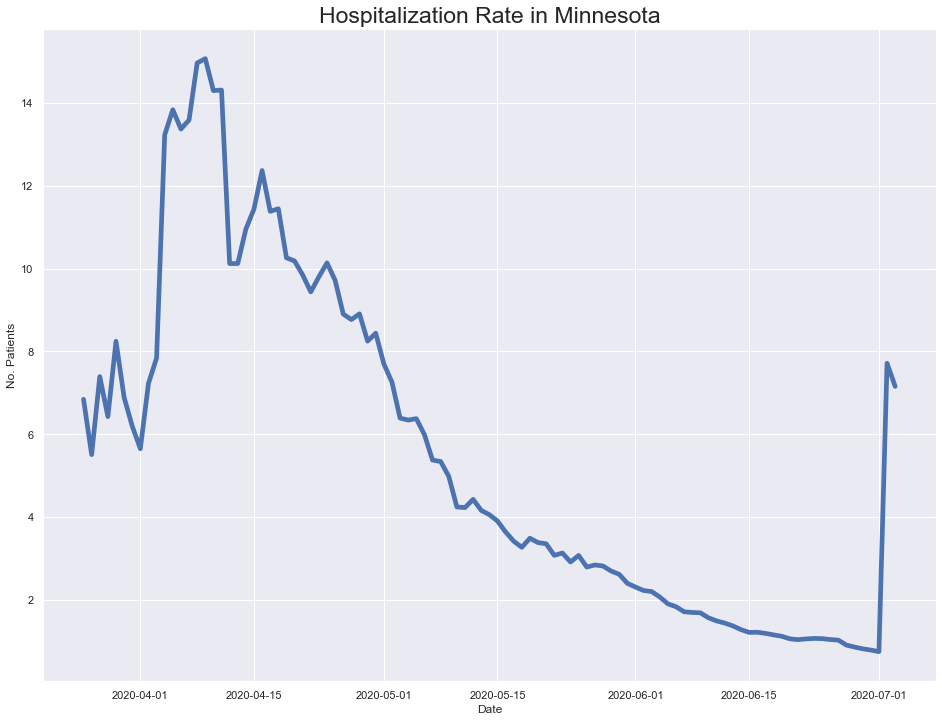

In [620]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(minn.date, minn.hospitalizedCurrently/minn.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Minnesota', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

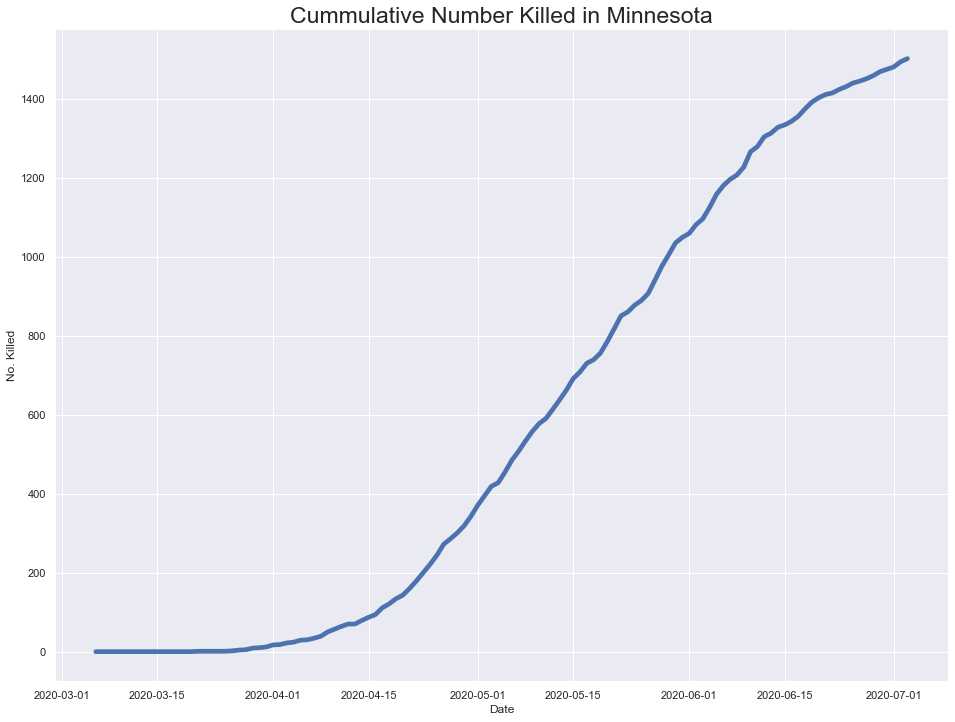

In [621]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(minn.date, minn.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Minnesota', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [622]:
#hide_input
# Checking which cols have NaN values
minn[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
minn.head()

# Omit the NaN cols
minn = minn[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

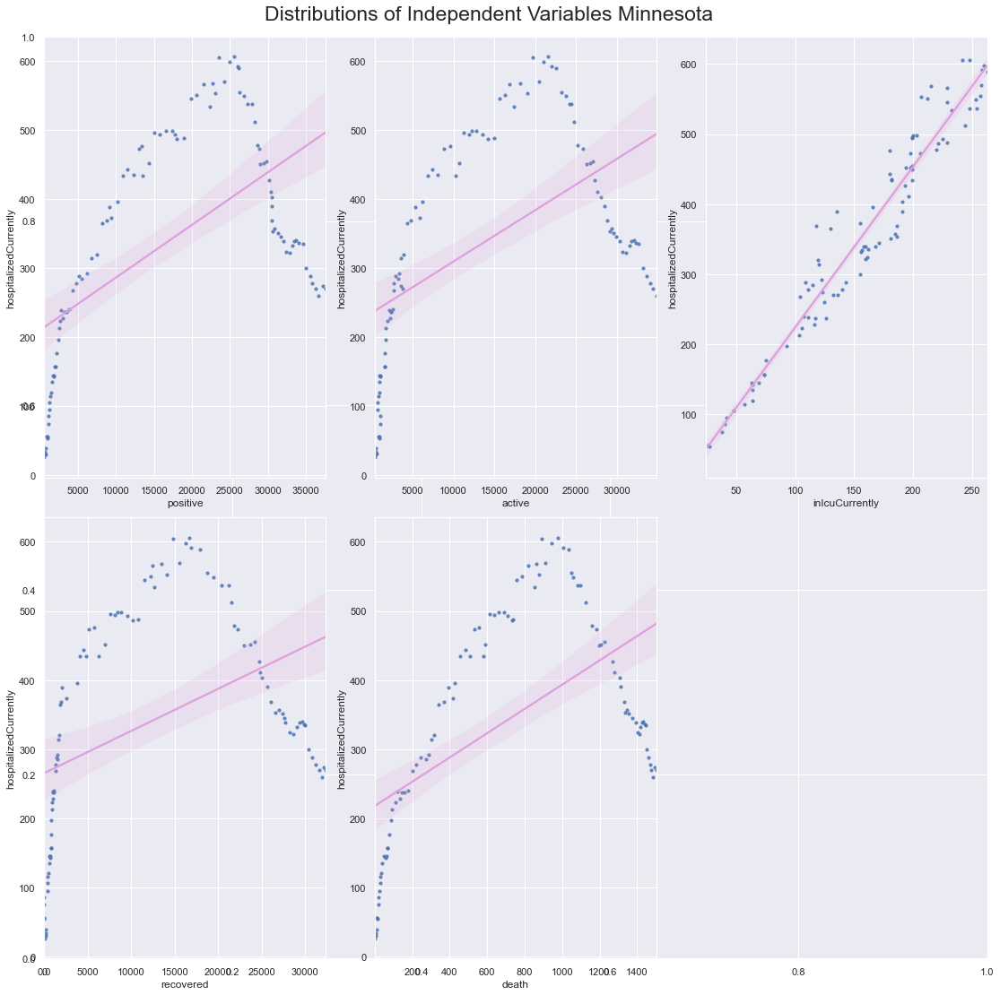

In [623]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_mn = minn.hospitalizedCurrently
indep_var_mn = minn.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_mn.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_mn[col], y=target_mn, data=indep_var_mn, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Minnesota', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [624]:
#hide_input
###endminnesota

### Mississippi

In [625]:
#hide_input
miss = covid_df.loc[(covid_df['abbrev'] == 'MS') & (covid_df['state']== 'Mississippi')] 


Text(0, 0.5, 'No. Patients')

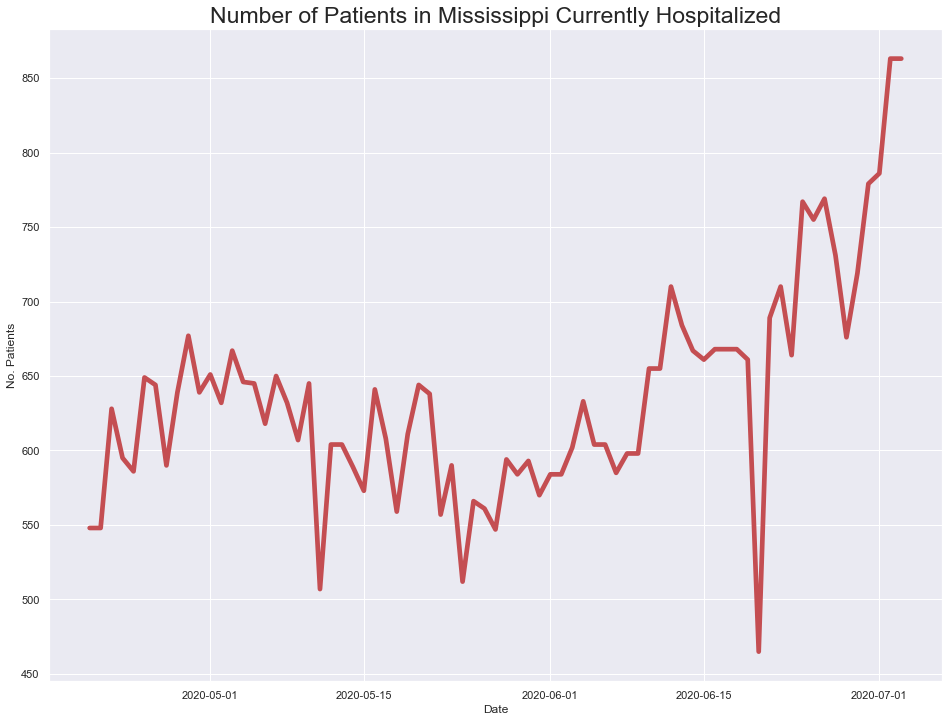

In [626]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(miss.date, miss.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Mississippi Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

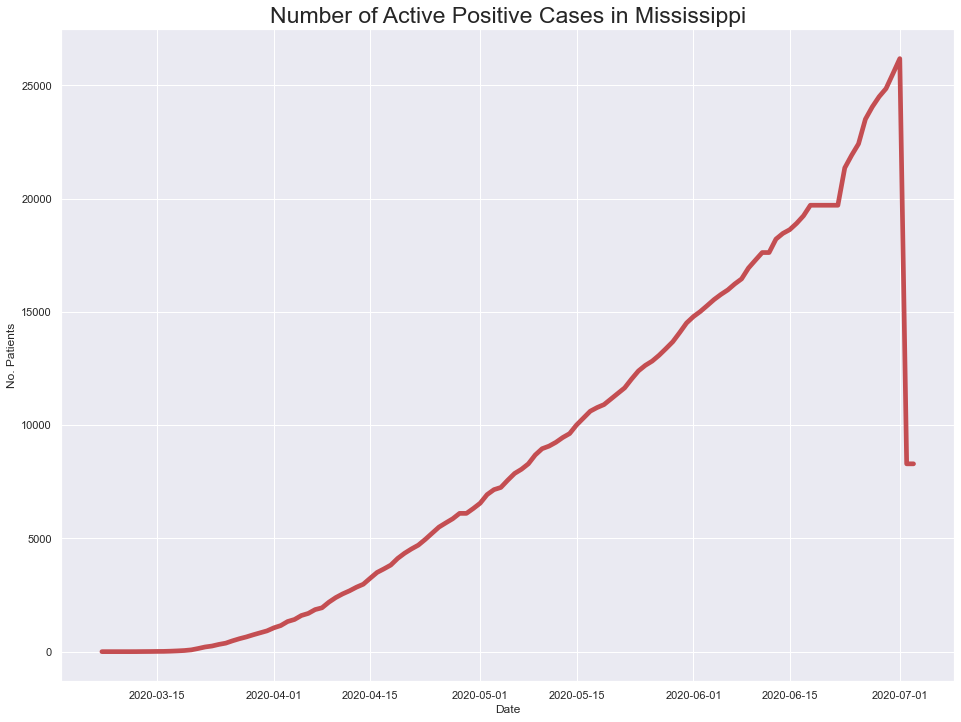

In [627]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(miss.date, miss.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Mississippi', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

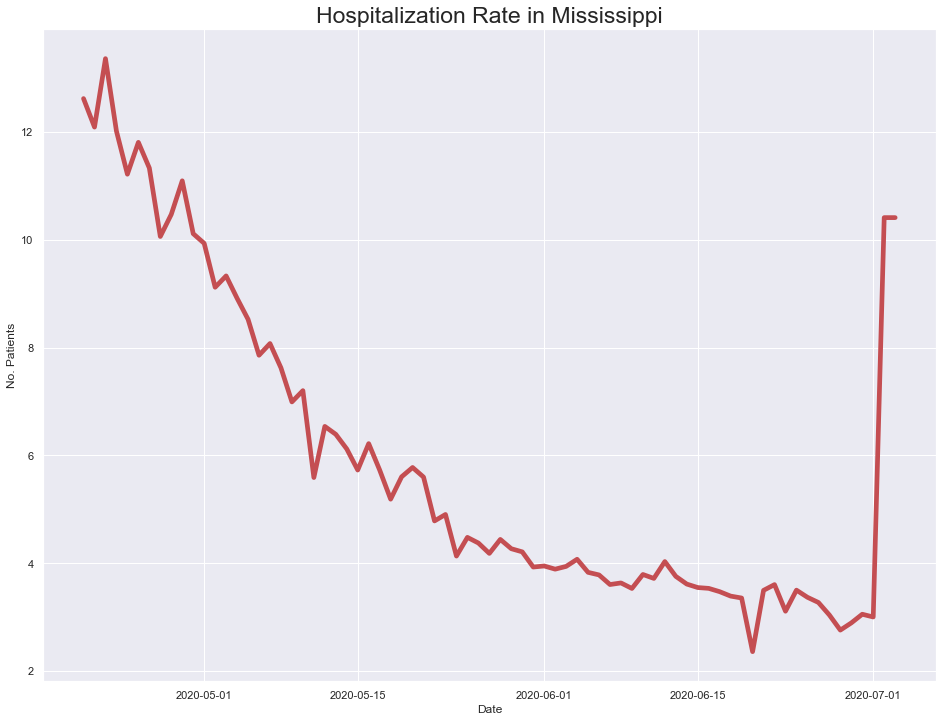

In [628]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(miss.date, miss.hospitalizedCurrently/miss.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Mississippi', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

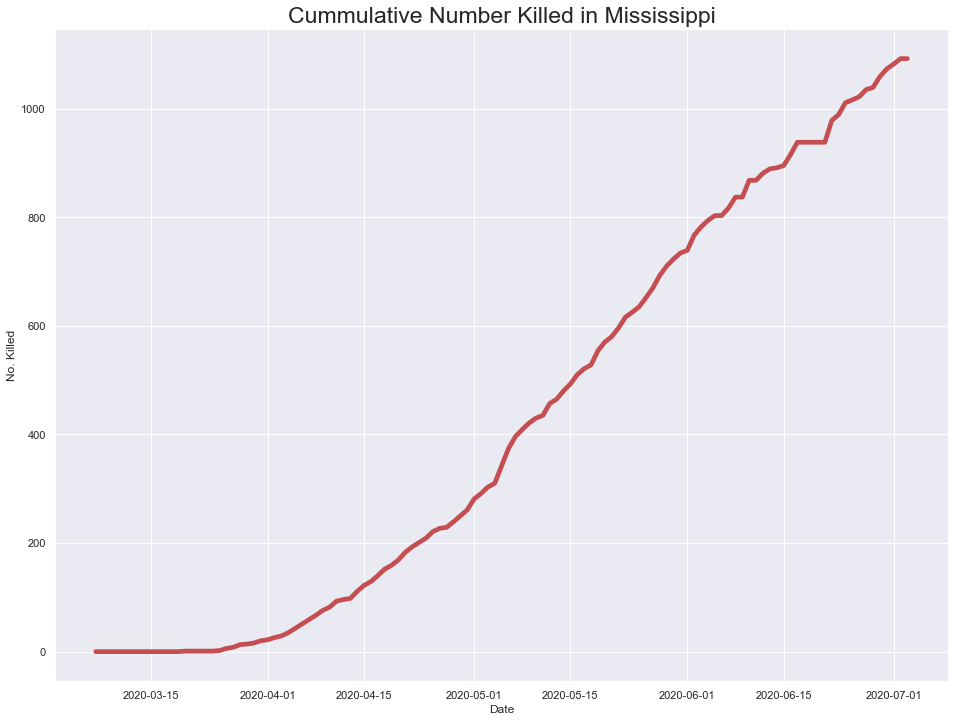

In [629]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(miss.date, miss.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Mississippi', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [630]:
#hide_input
# Checking which cols have NaN values
miss[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
miss.head()

# Omit the NaN cols
miss = miss[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

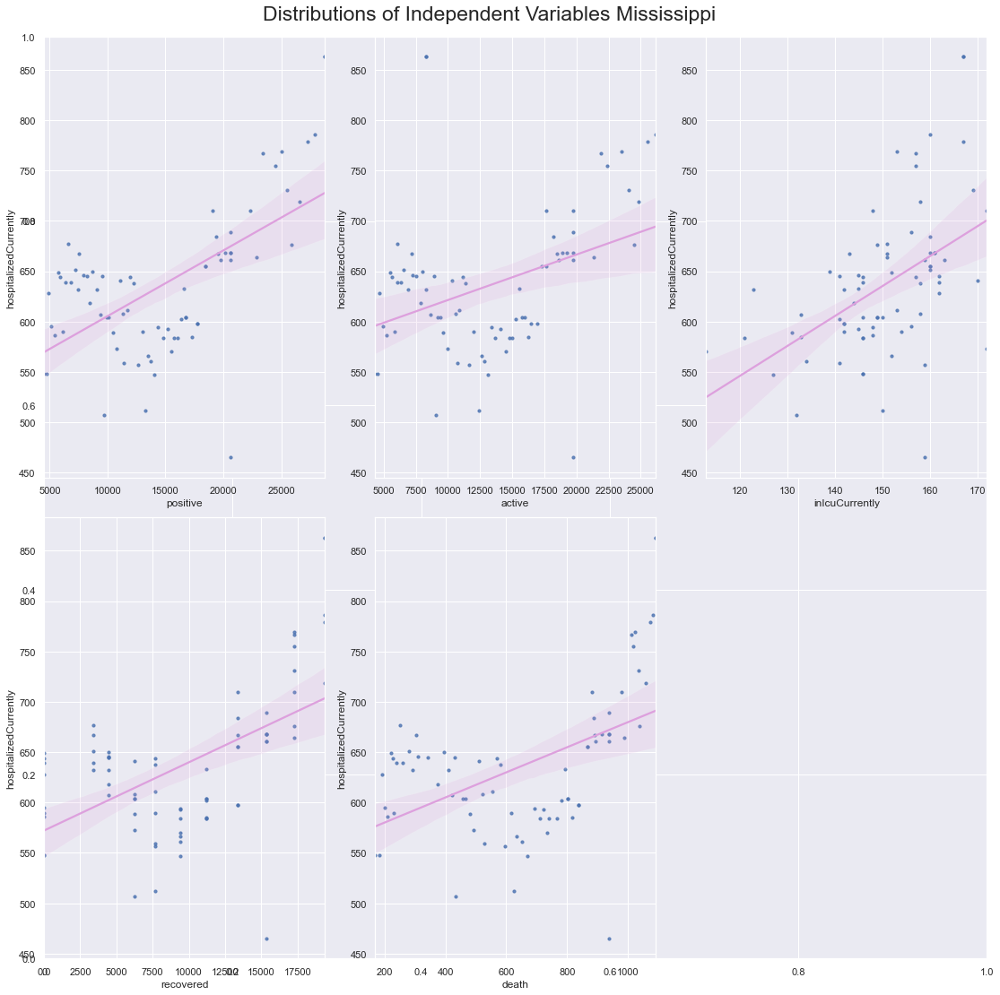

In [631]:
#hide_input
# Scatter plots MS
# Split dependent var from independent variables
target_ms = miss.hospitalizedCurrently
indep_var_ms = miss.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ms.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ms[col], y=target_ms, data=indep_var_ms, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Mississippi', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [632]:
#hide_input
###endmississippi

### Missouri

In [633]:
#hide_input
mo = covid_df.loc[(covid_df['abbrev'] == 'MO') & (covid_df['state']== 'Missouri')] 


Text(0, 0.5, 'No. Patients')

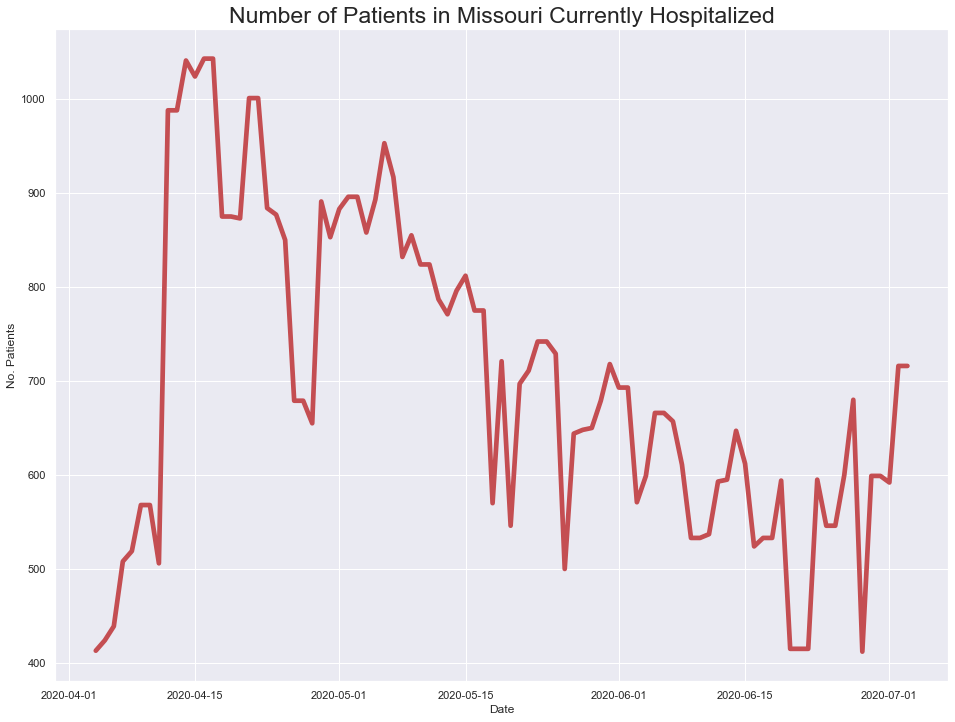

In [634]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mo.date, mo.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Missouri Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

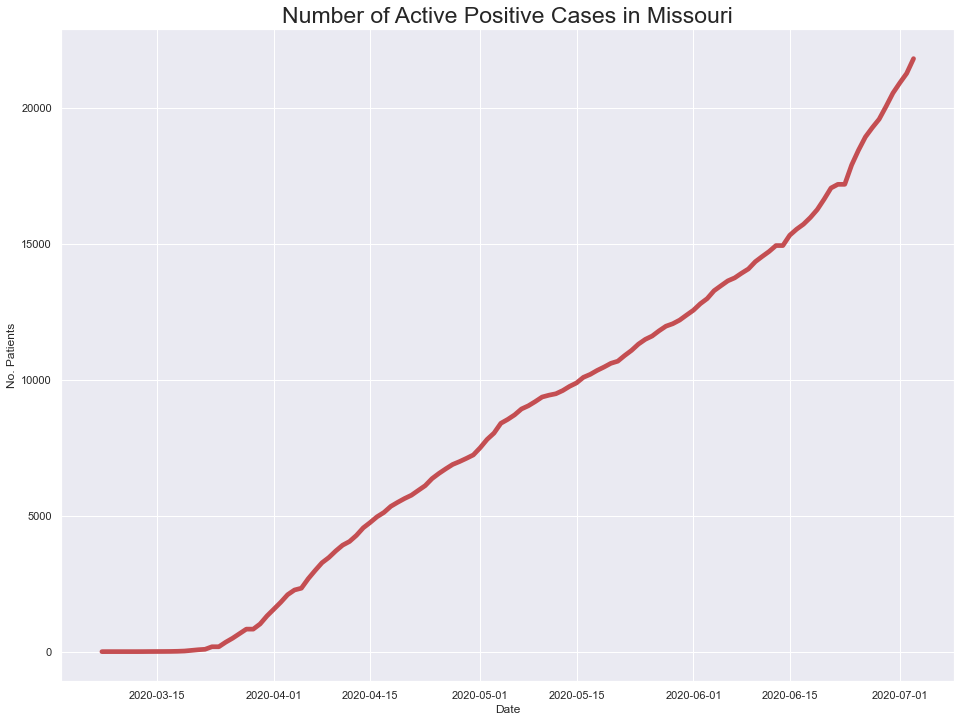

In [635]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mo.date, mo.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Missouri', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

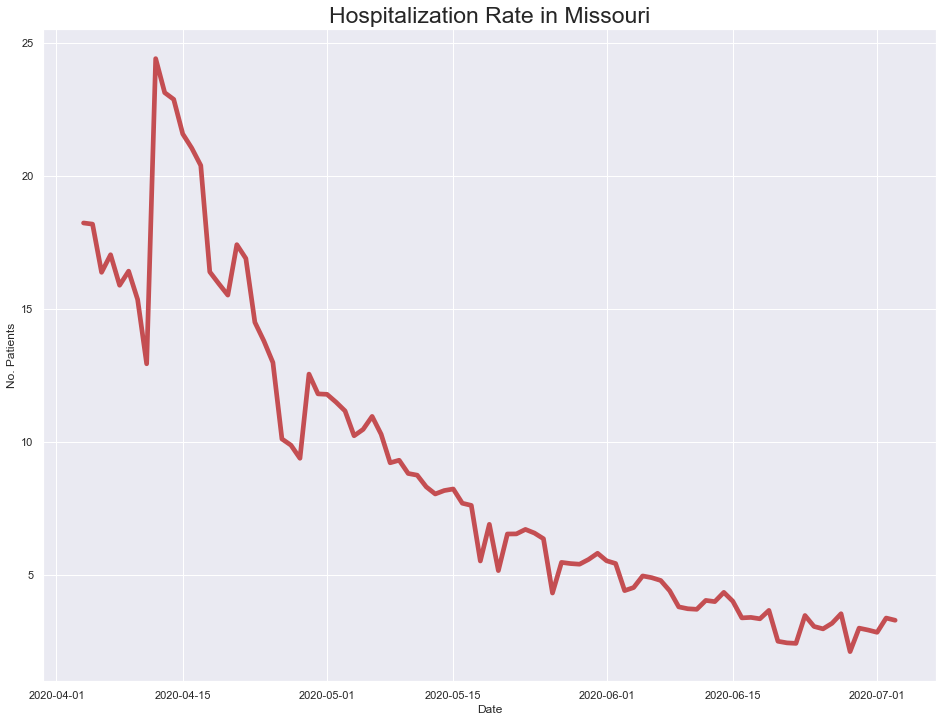

In [636]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mo.date, mo.hospitalizedCurrently/mo.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Missouri', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

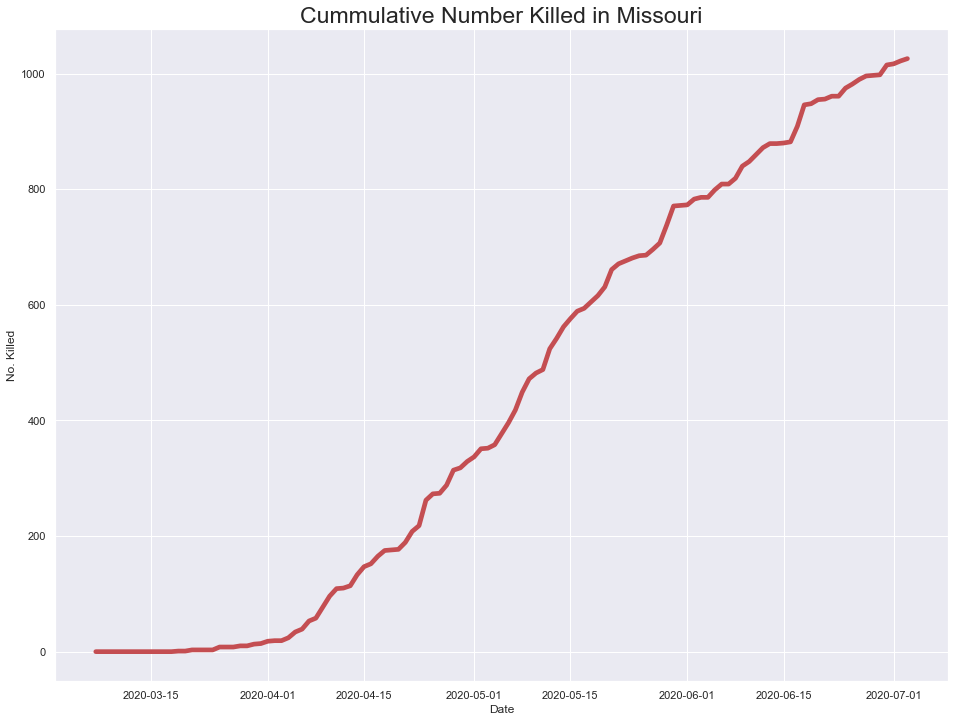

In [637]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mo.date, mo.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Missouri', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [638]:
#hide_input
# Checking which cols have NaN values
mo[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
mo.head()

# Omit the NaN cols
mo = mo[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

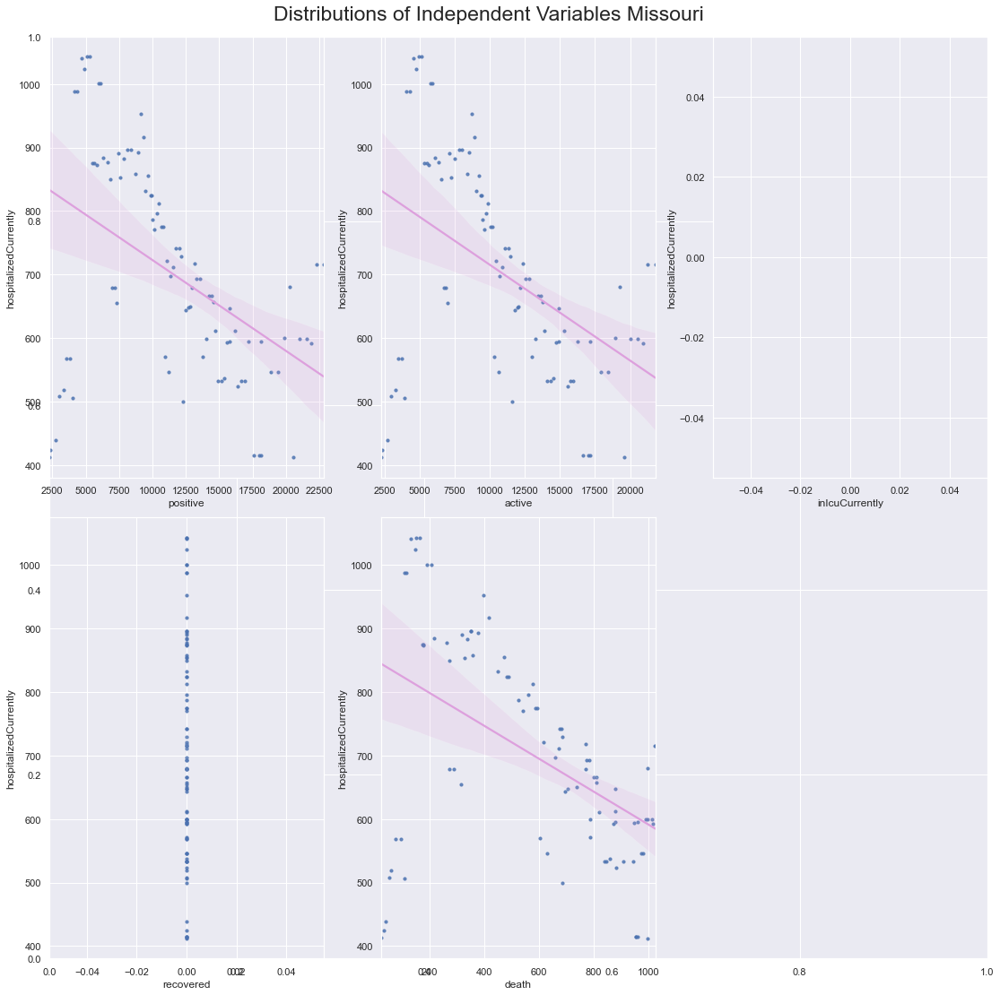

In [639]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_mo = mo.hospitalizedCurrently
indep_var_mo = mo.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_mo.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_mo[col], y=target_mo, data=indep_var_mo, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Missouri', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [640]:
#hide_input
###endalabama

### Montana

In [641]:
#hide_input
mt = covid_df.loc[(covid_df['abbrev'] == 'MT') & (covid_df['state']== 'Montana')] 


Text(0, 0.5, 'No. Patients')

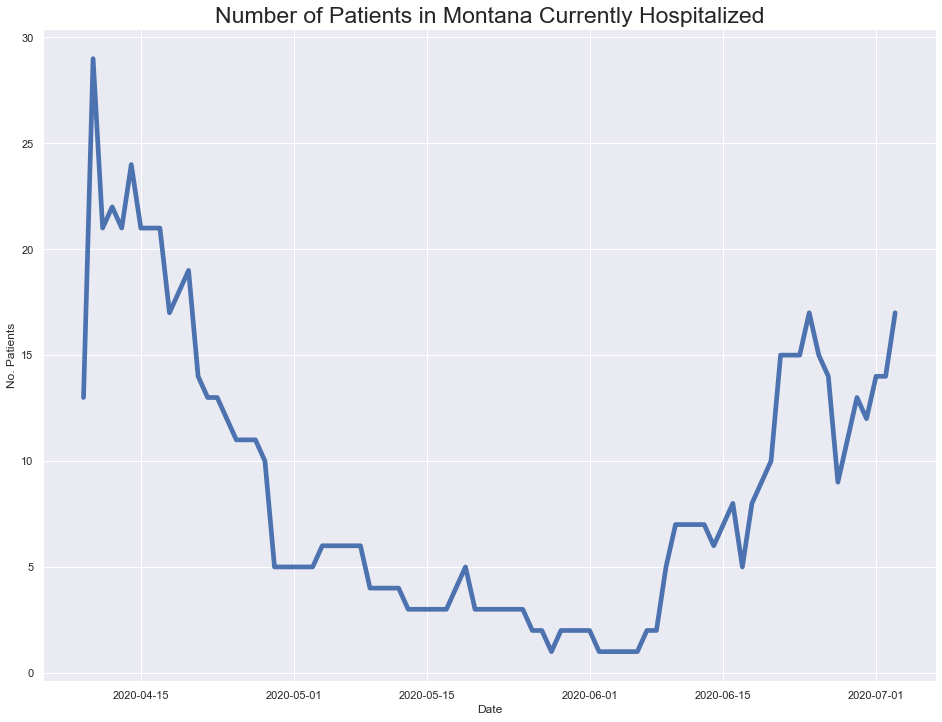

In [642]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mt.date, mt.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Montana Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

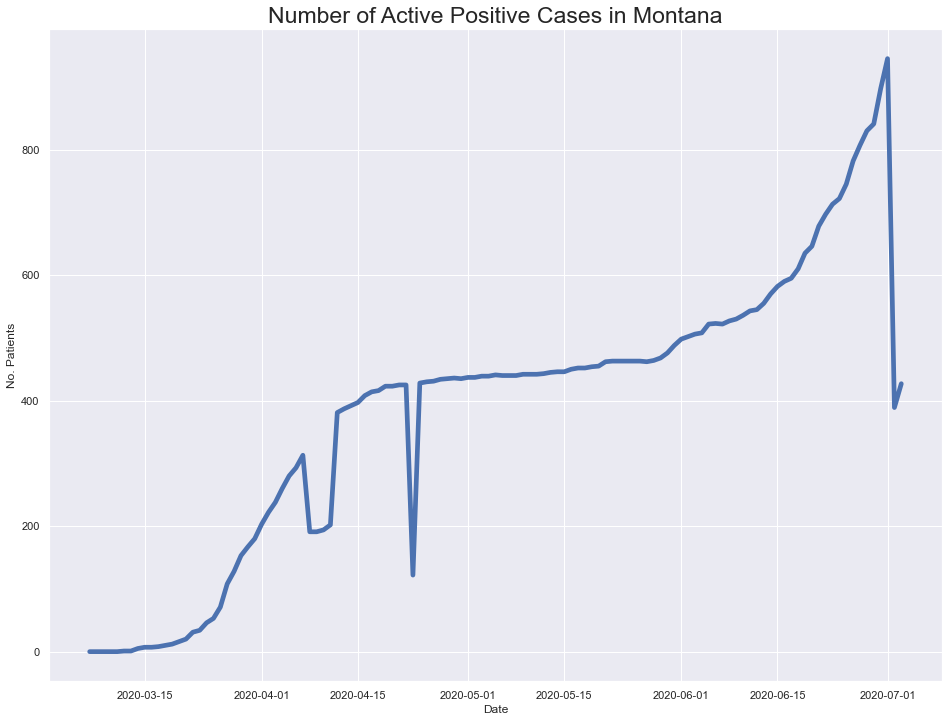

In [643]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mt.date, mt.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Montana', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

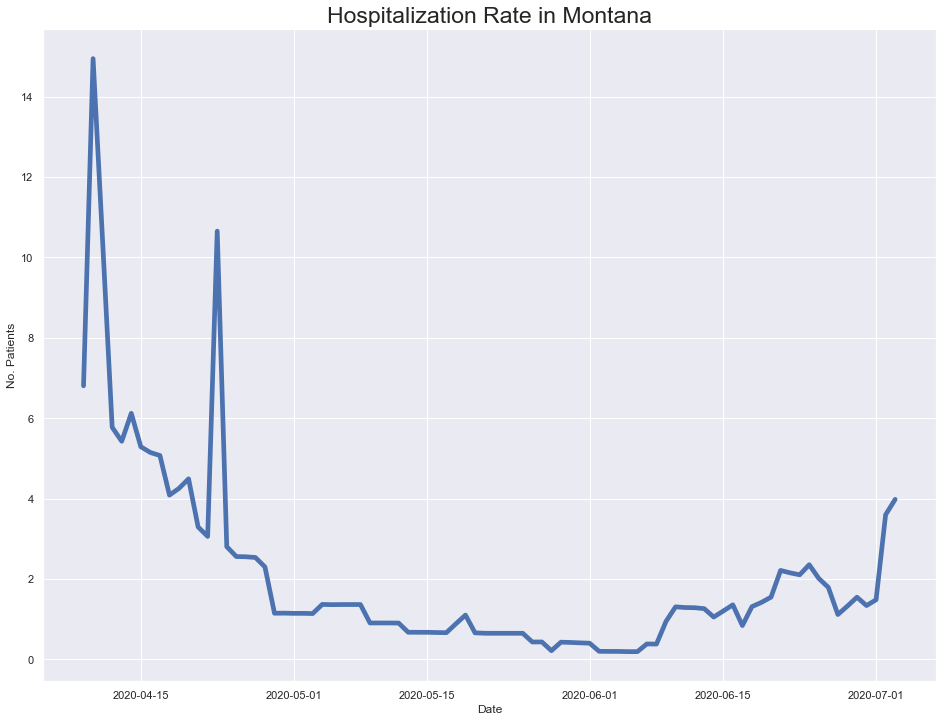

In [644]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mt.date, mt.hospitalizedCurrently/mt.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Montana', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

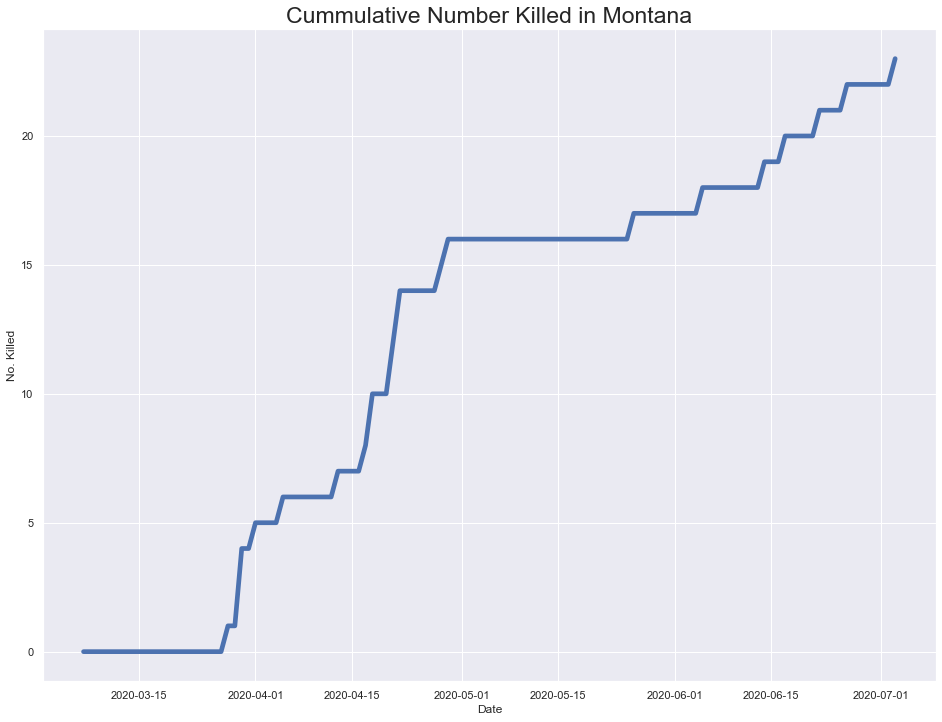

In [645]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(mt.date, mt.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Montana', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [646]:
#hide_input
# Checking which cols have NaN values
mt[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
mt.head()

# Omit the NaN cols
mt = mt[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

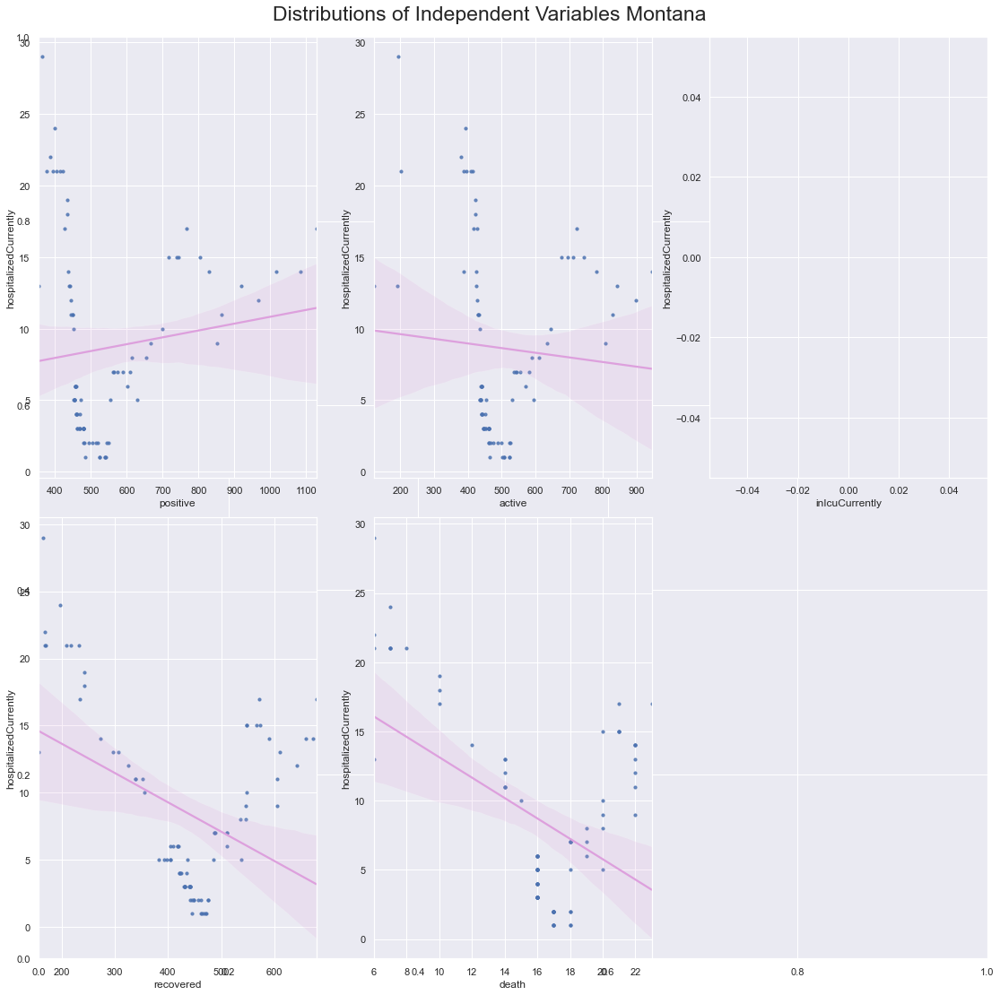

In [647]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_mt = mt.hospitalizedCurrently
indep_var_mt = mt.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_mt.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_mt[col], y=target_mt, data=indep_var_mt, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Montana', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [648]:
#hide_input
###endmontana

### Nebraska

In [649]:
#hide_input
ne = covid_df.loc[(covid_df['abbrev'] == 'NE') & (covid_df['state']== 'Nebraska')] 


Text(0, 0.5, 'No. Patients')

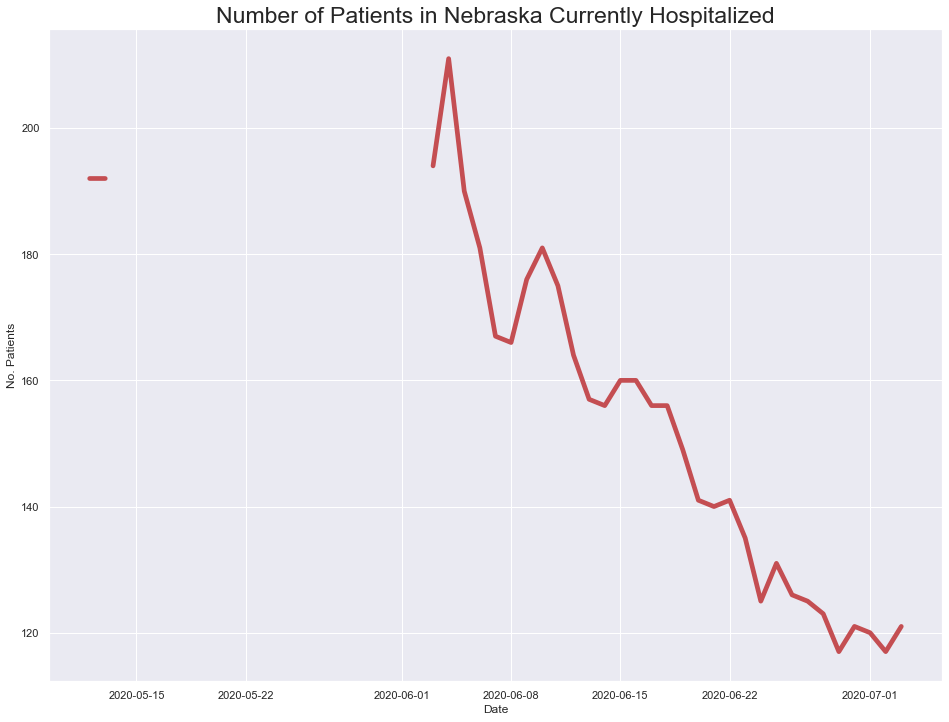

In [650]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ne.date, ne.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Nebraska Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

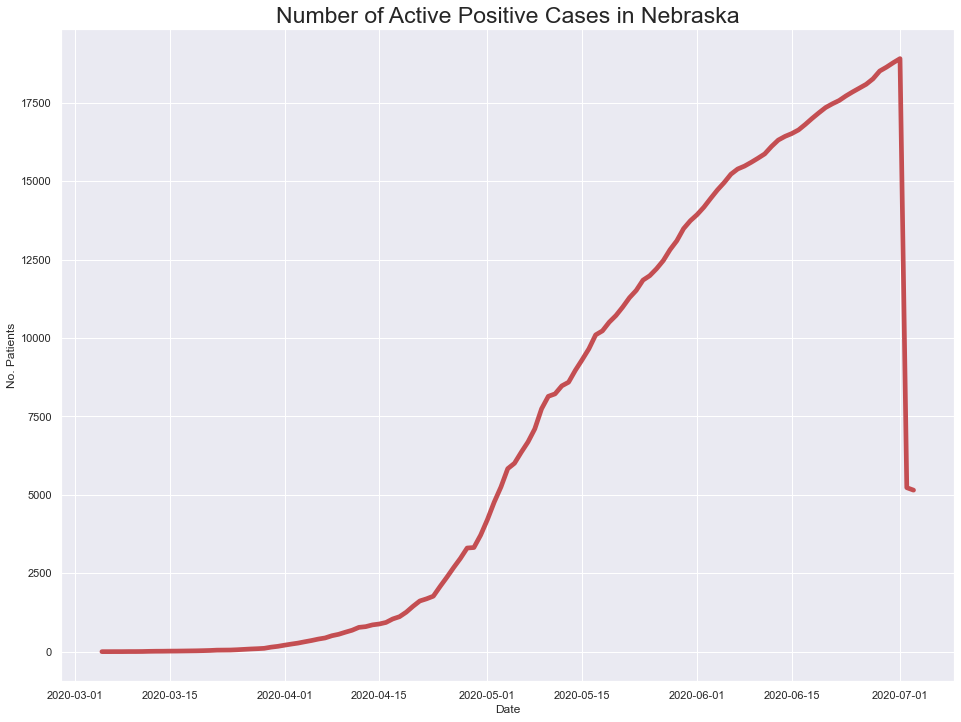

In [651]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ne.date, ne.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Nebraska', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

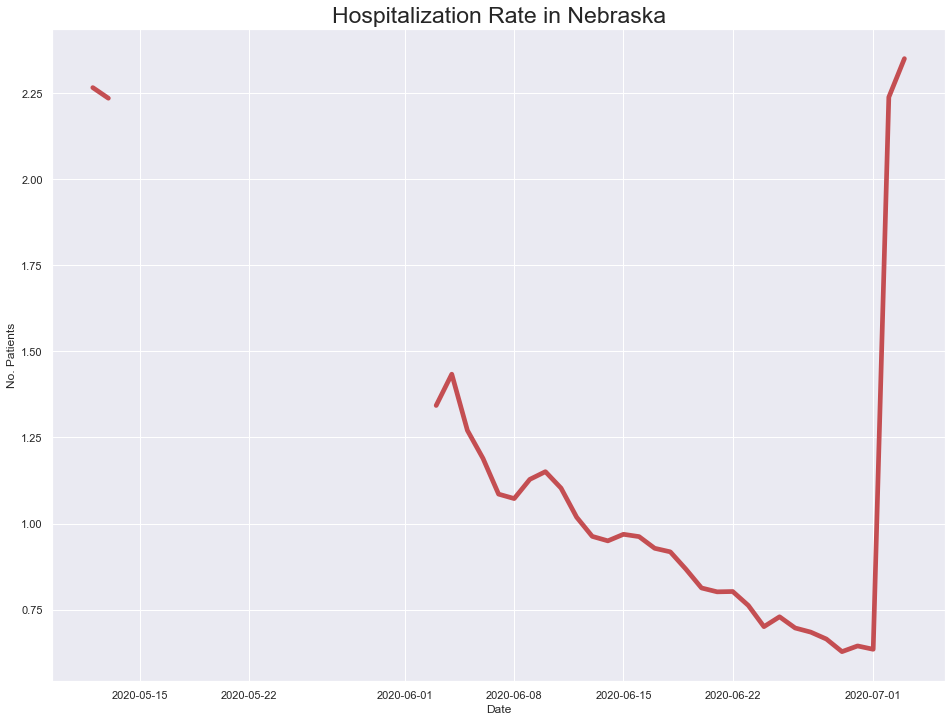

In [652]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ne.date, ne.hospitalizedCurrently/ne.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Nebraska', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

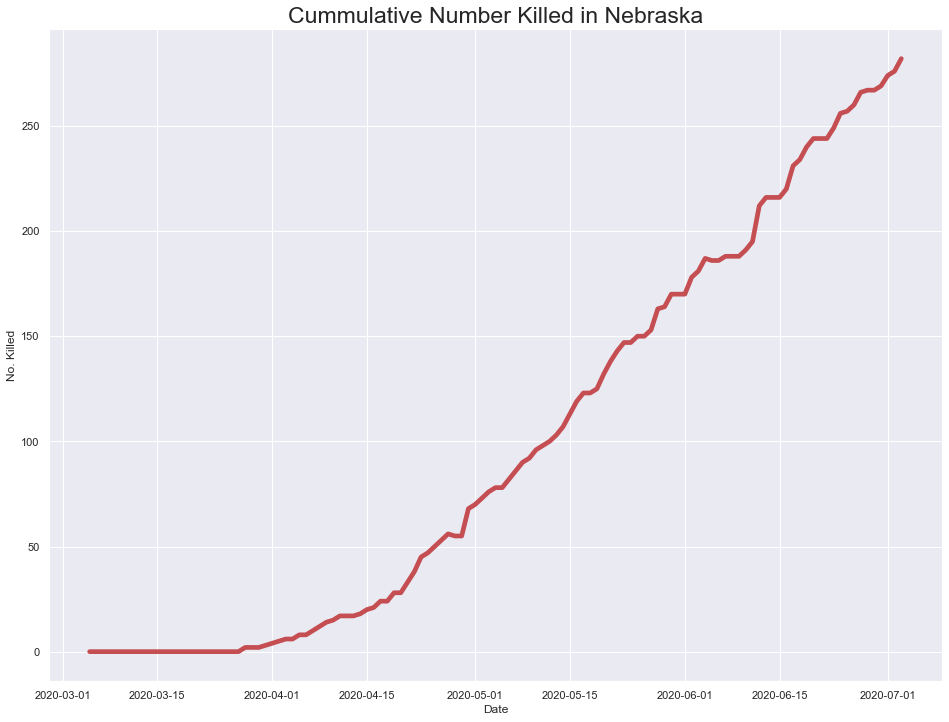

In [653]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ne.date, ne.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Nebraska', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [654]:
#hide_input
# Checking which cols have NaN values
ne[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
ne.head()

# Omit the NaN cols
ne = ne[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

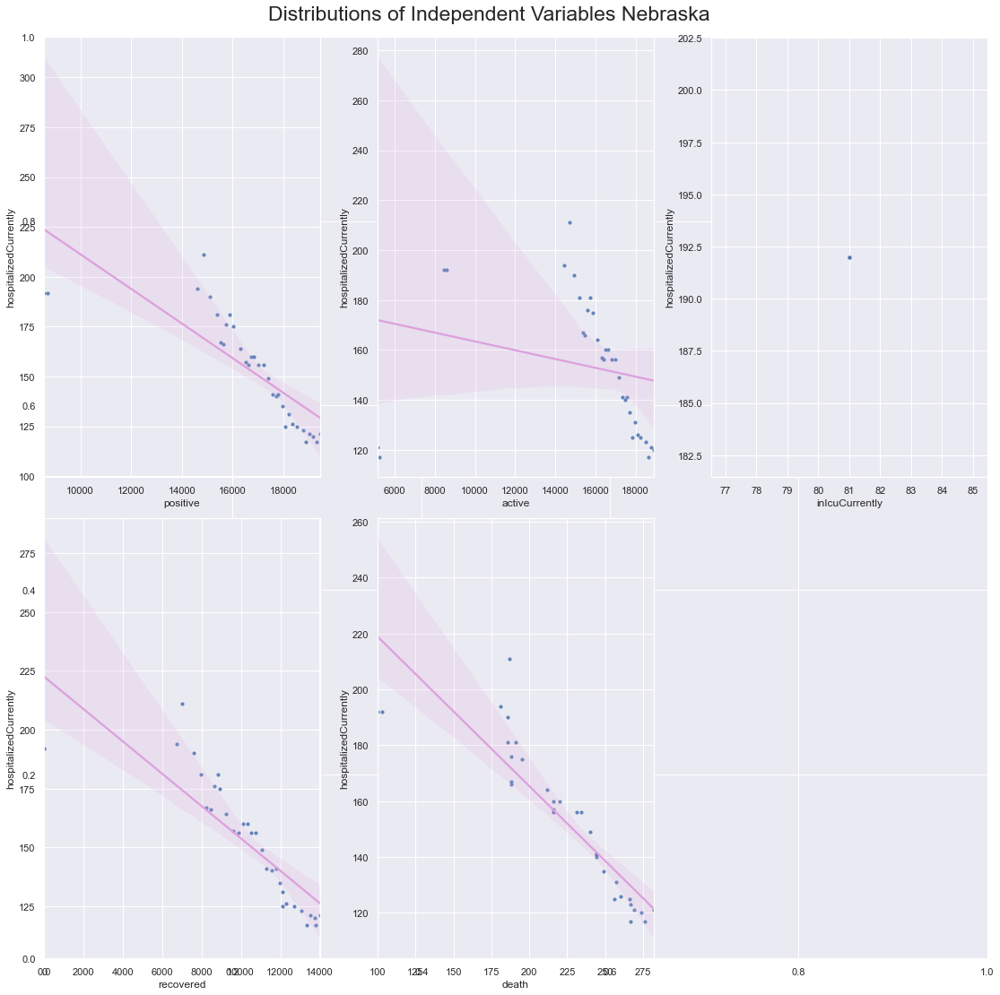

In [655]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_ne = ne.hospitalizedCurrently
indep_var_ne = ne.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ne.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ne[col], y=target_ne, data=indep_var_ne, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Nebraska', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [656]:
#hide_input
###endnebraska

### Nevada:

In [657]:
#hide_input
nevada = covid_df.loc[(covid_df['abbrev'] == 'NV') & (covid_df['state']== 'Nevada')] 


Text(0, 0.5, 'No. Patients')

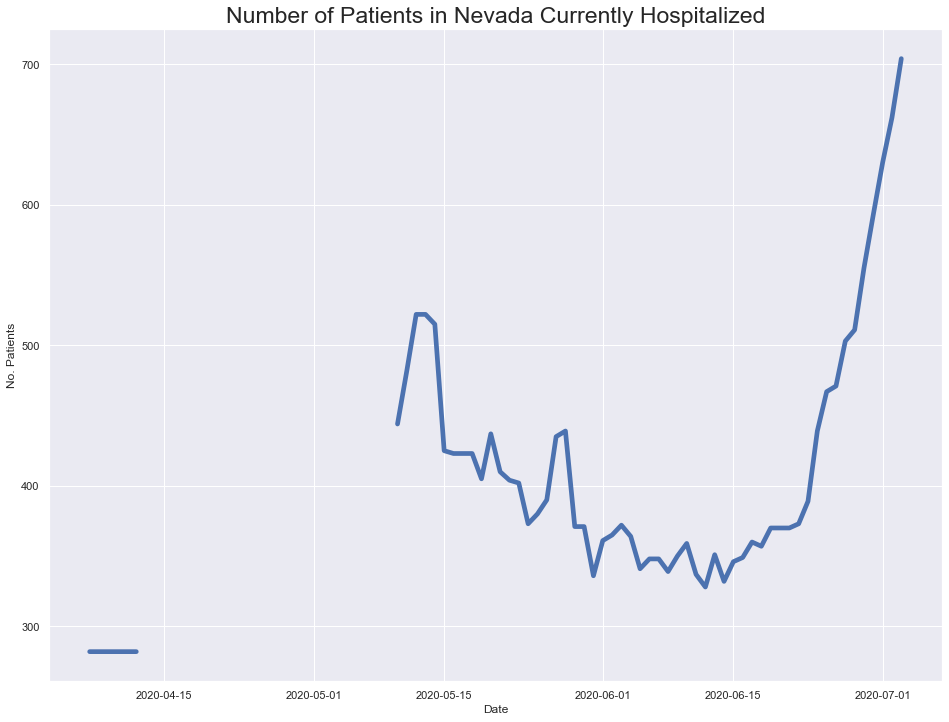

In [658]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nevada.date, nevada.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Nevada Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

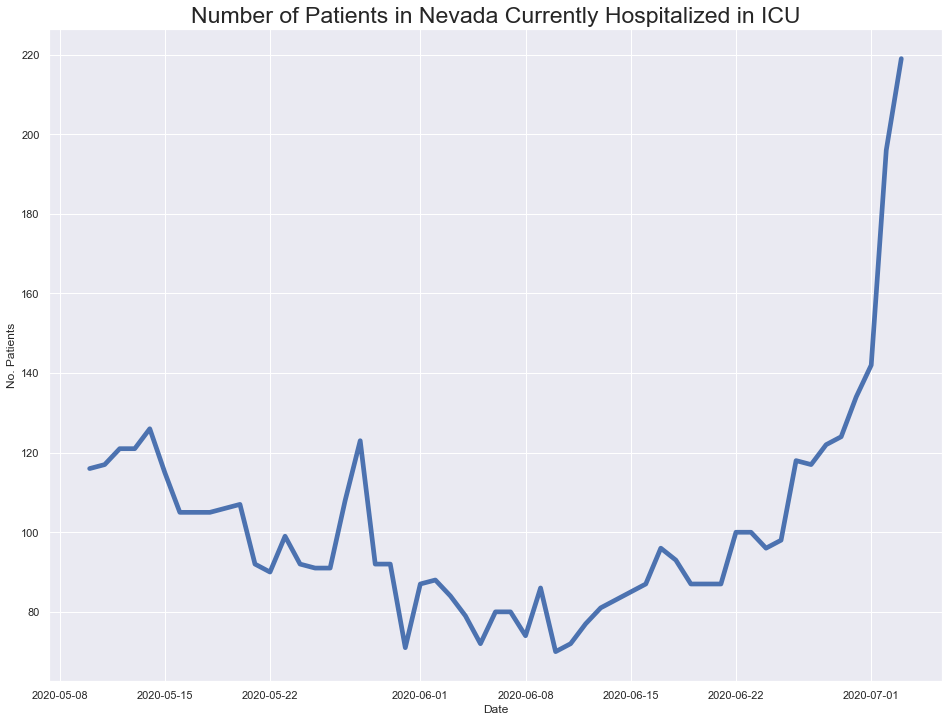

In [659]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nevada.date, nevada.inIcuCurrently, linewidth=4.7)
plt.title('Number of Patients in Nevada Currently Hospitalized in ICU', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

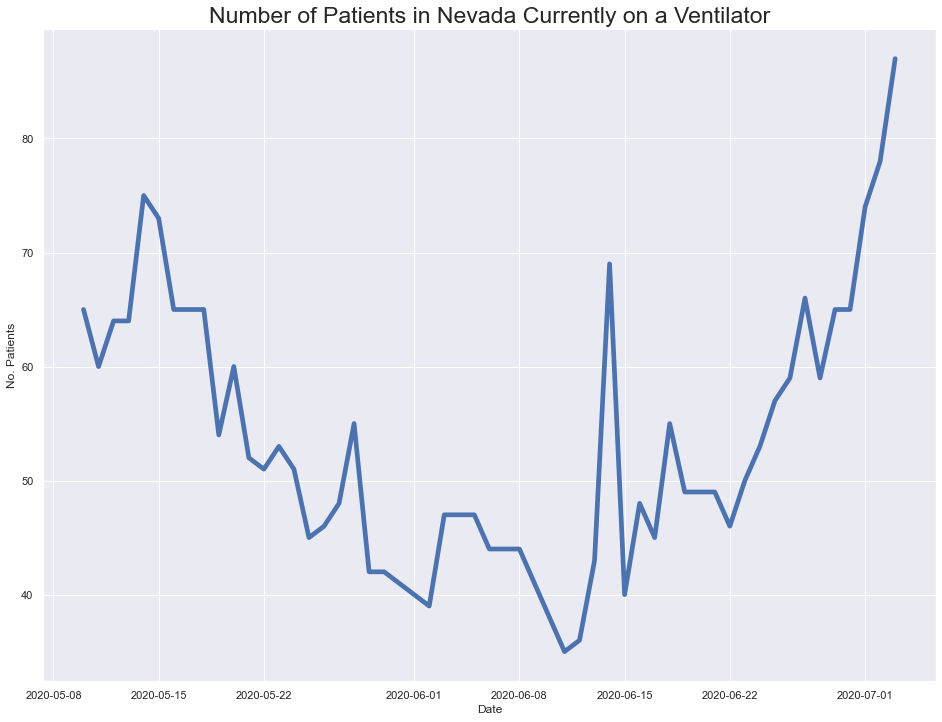

In [660]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nevada.date, nevada.onVentilatorCurrently, linewidth=4.7)
plt.title('Number of Patients in Nevada Currently on a Ventilator', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [661]:
#hide_input
# Checking which cols have NaN values
nevada[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
nevada.head()

# Omit the NaN cols
nevada = nevada[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

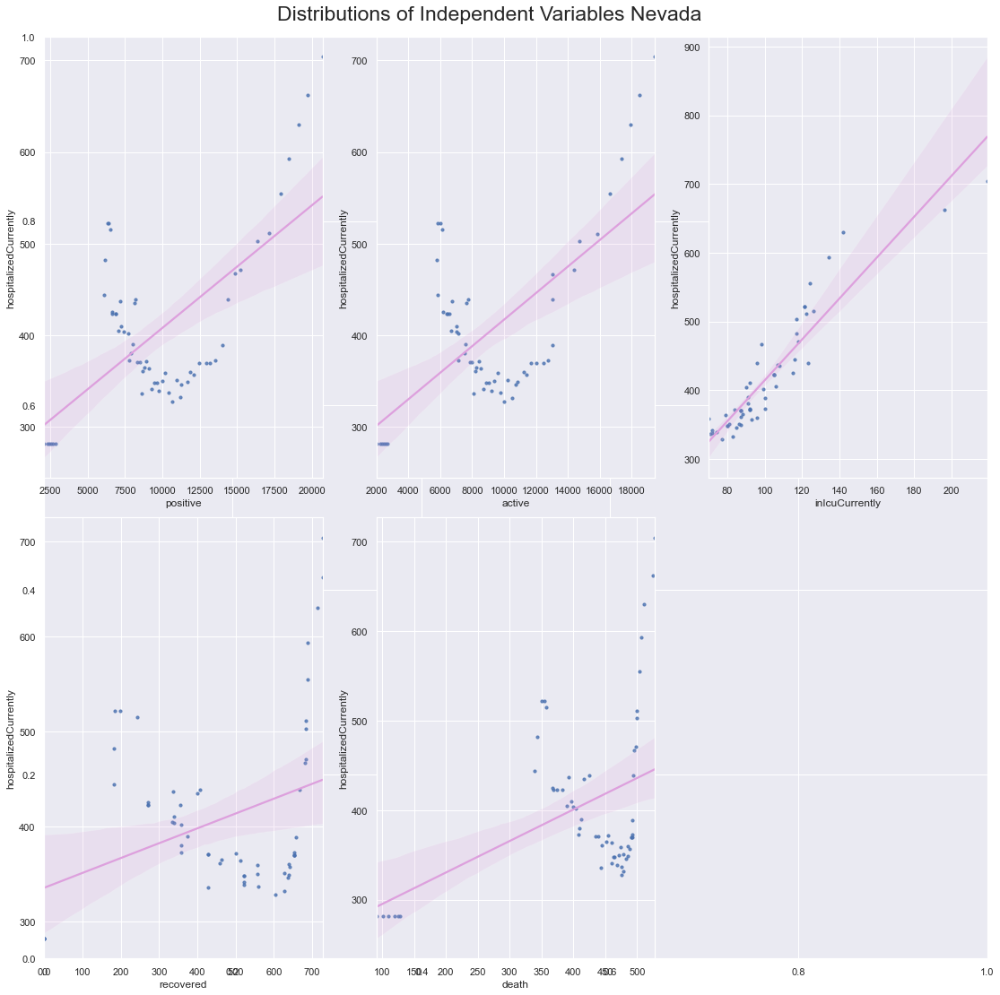

In [662]:
#hide_input
# Scatter plots NV
# Split dependent var from independent variables
target_nv = nevada.hospitalizedCurrently
indep_var_nv = nevada.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_nv.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_nv[col], y=target_nv, data=indep_var_nv, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Nevada', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [663]:
#hide_input
###endnevada

### New Hampshire

In [664]:
#hide_input
nh = covid_df.loc[(covid_df['abbrev'] == 'NH') & (covid_df['state']== 'New Hampshire')] 


Text(0, 0.5, 'No. Patients')

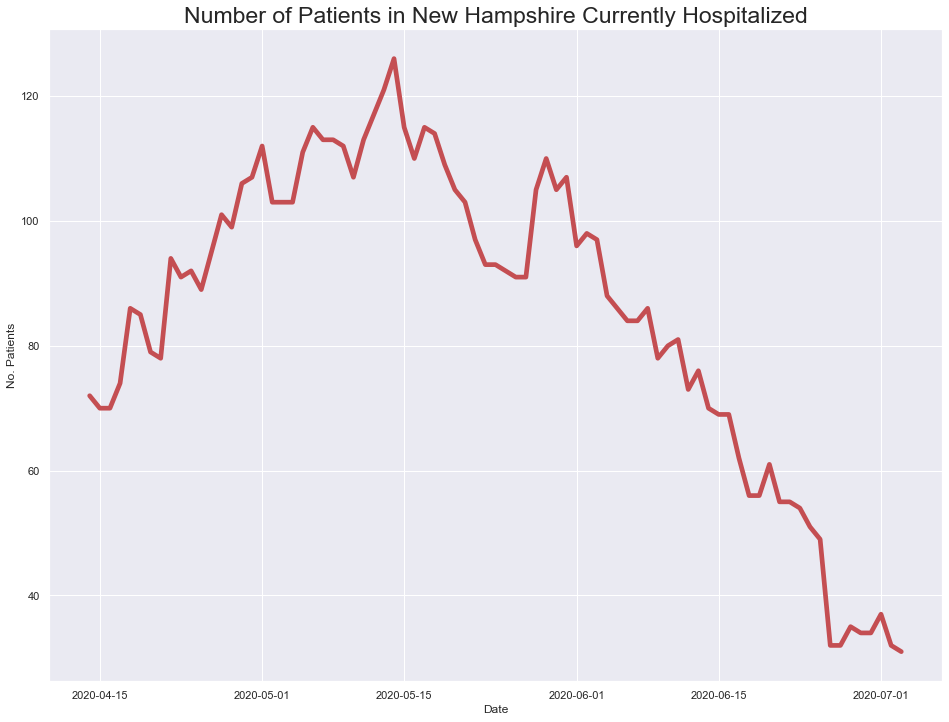

In [665]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nh.date, nh.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in New Hampshire Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

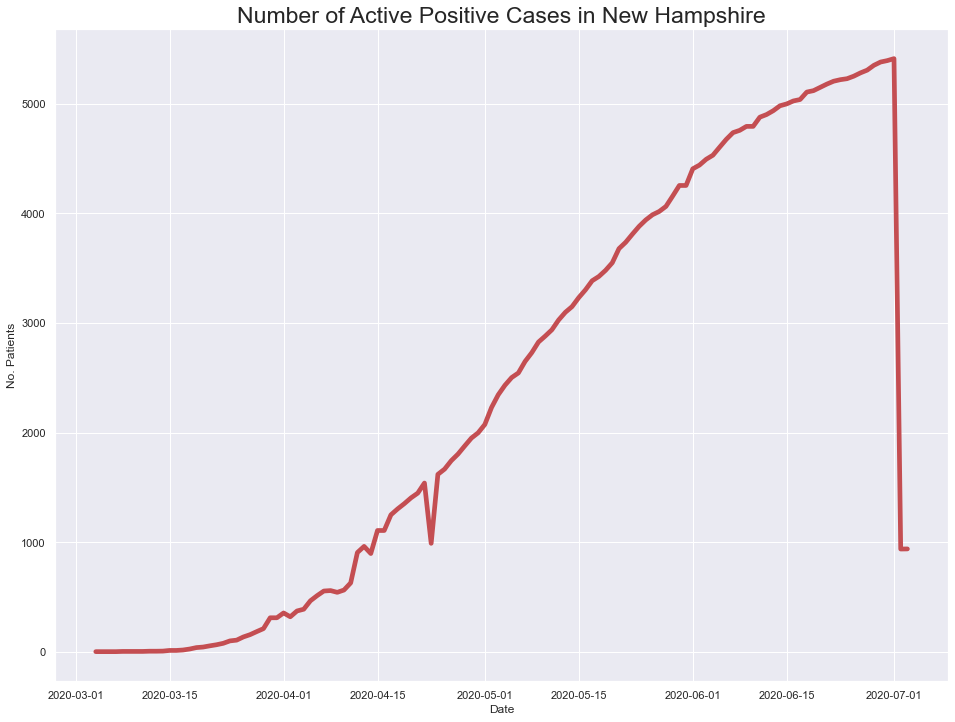

In [666]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nh.date, nh.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in New Hampshire', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

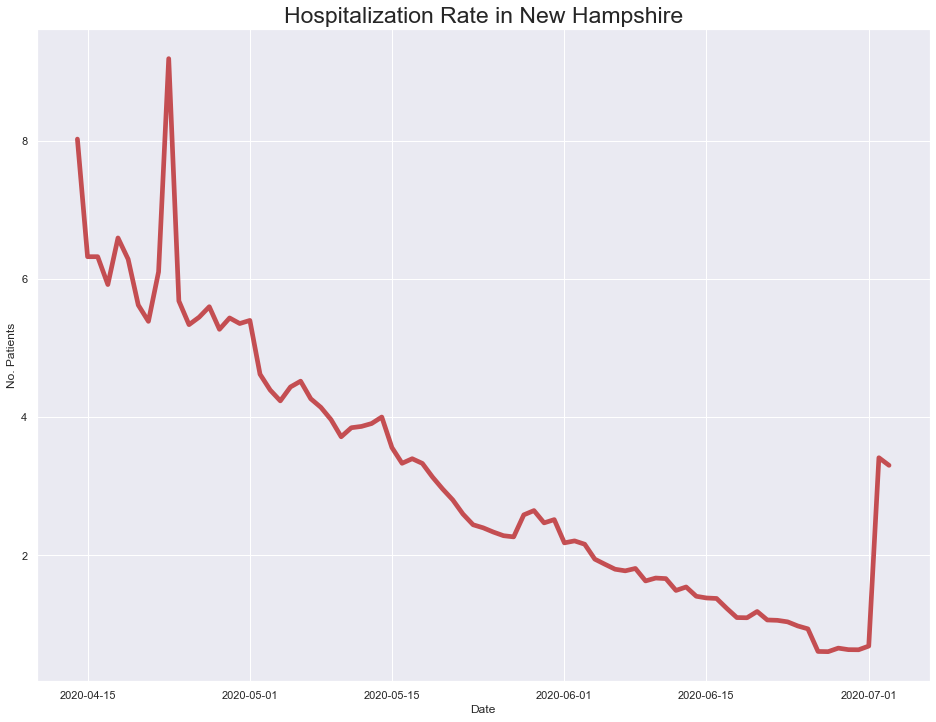

In [667]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nh.date, nh.hospitalizedCurrently/nh.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in New Hampshire', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

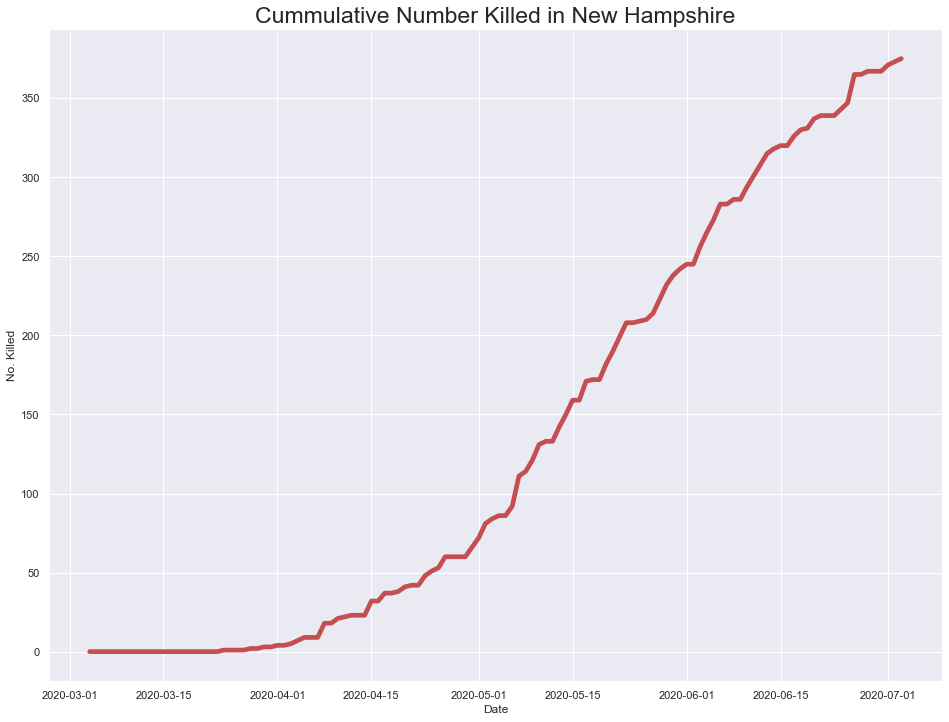

In [668]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nh.date, nh.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in New Hampshire', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [669]:
#hide_input
# Checking which cols have NaN values
nh[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
nh.head()

# Omit the NaN cols
nh = nh[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

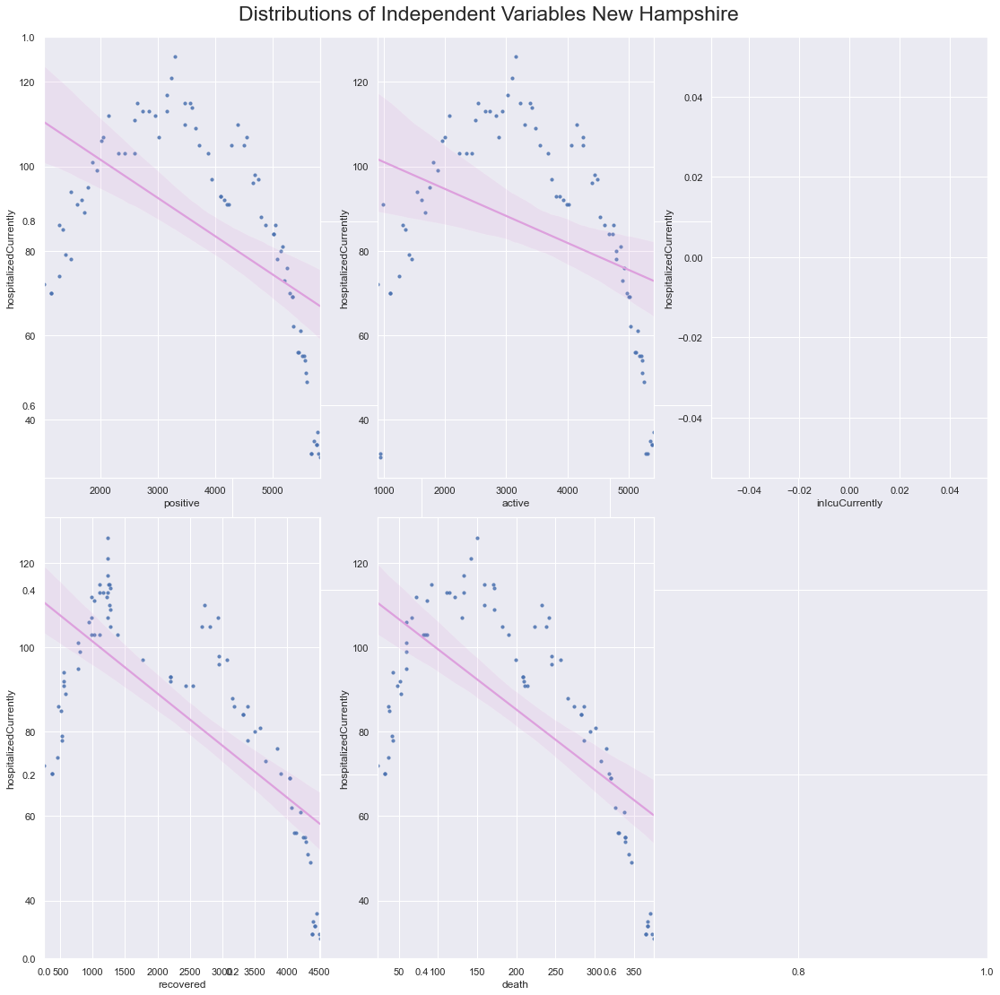

In [670]:
#hide_input
# Scatter plots NH
# Split dependent var from independent variables
target_nh = nh.hospitalizedCurrently
indep_var_nh = nh.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_nh.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_nh[col], y=target_nh, data=indep_var_nh, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables New Hampshire', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [671]:
#hide_input
###endnewhampshire

### New Jersey

In [672]:
#hide_input
nj = covid_df.loc[(covid_df['abbrev'] == 'NJ') & (covid_df['state']== 'New Jersey')] 


Text(0, 0.5, 'No. Patients')

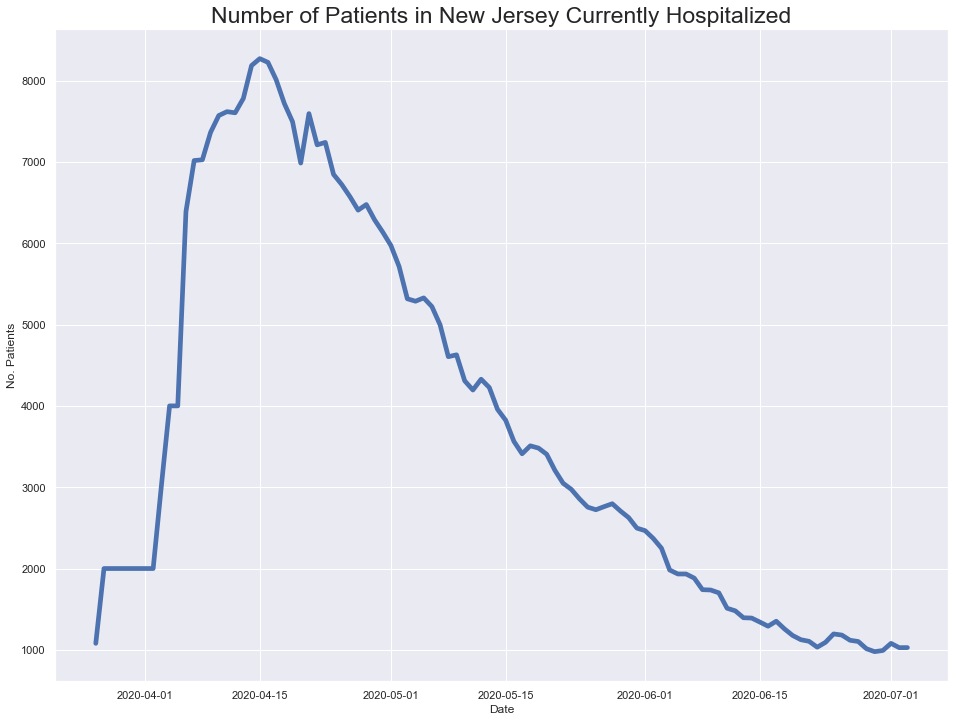

In [673]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nj.date, nj.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in New Jersey Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

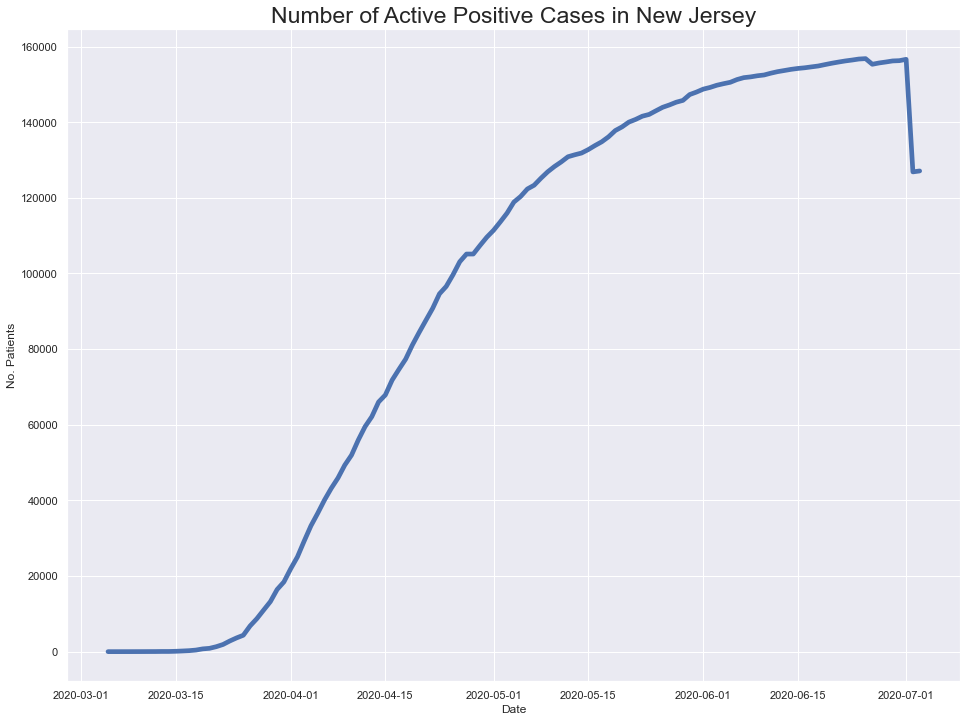

In [674]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nj.date, nj.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in New Jersey', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

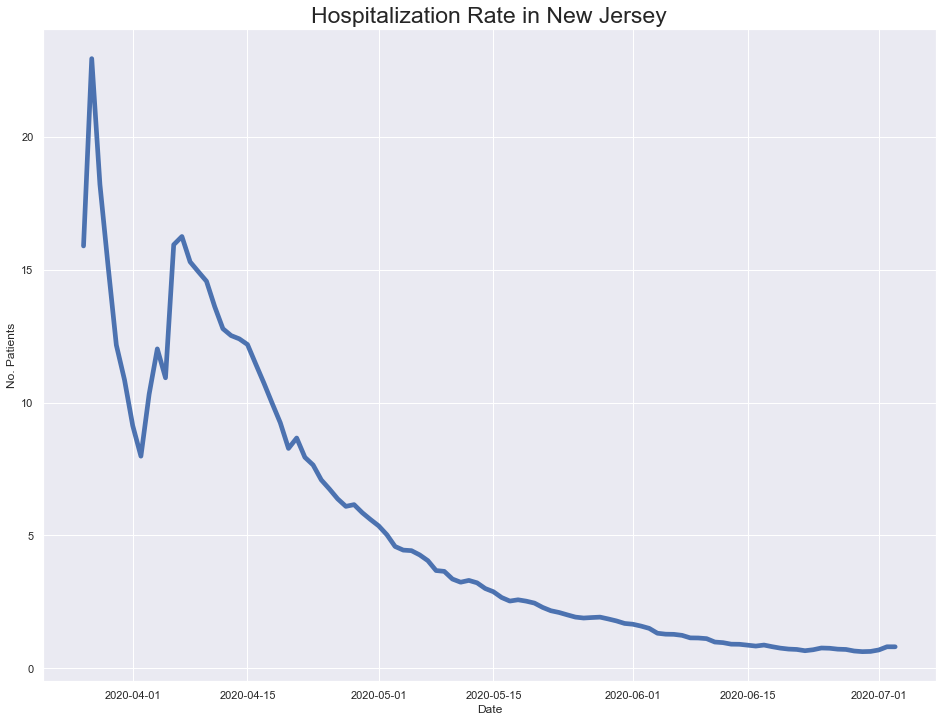

In [675]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nj.date, nj.hospitalizedCurrently/nj.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in New Jersey', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

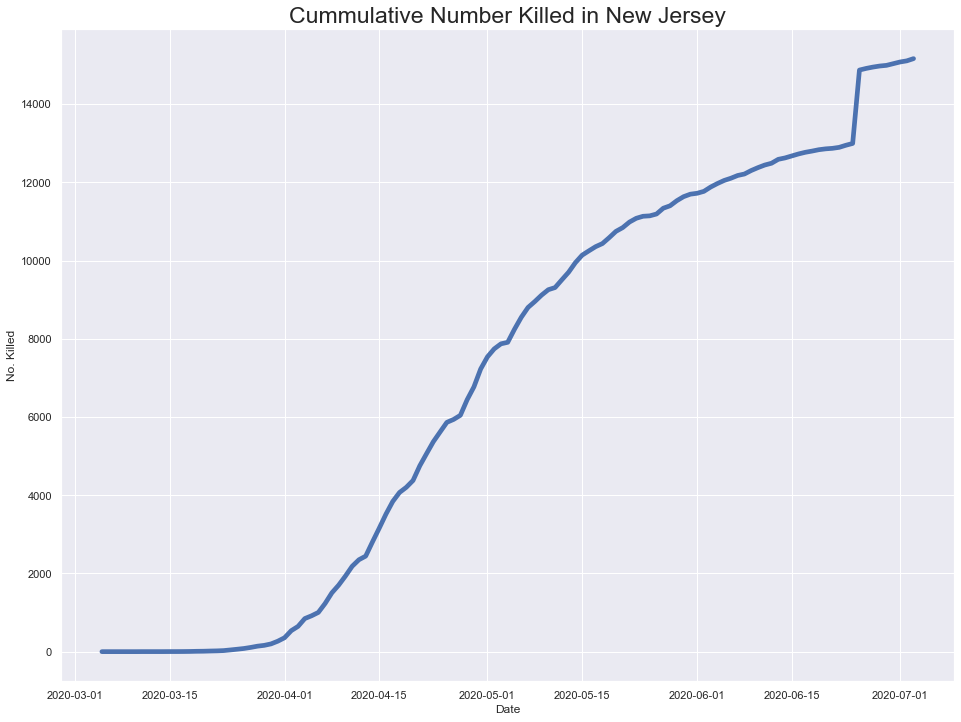

In [676]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nj.date, nj.death, linewidth=4.7)
plt.title('Cummulative Number Killed in New Jersey', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [677]:
#hide_input
# Checking which cols have NaN values
nj[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
nj.head()

# Omit the NaN cols
nj = nj[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

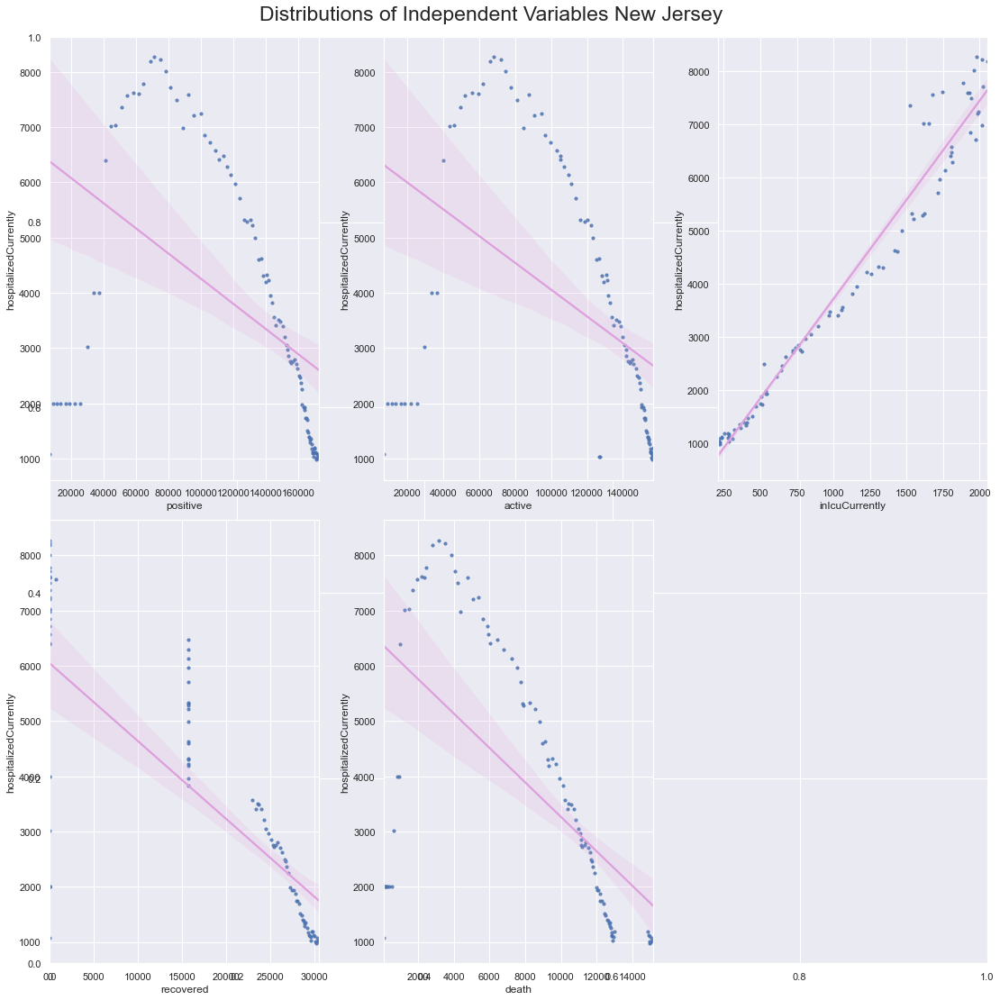

In [678]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_nj = nj.hospitalizedCurrently
indep_var_nj = nj.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_nj.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_nj[col], y=target_nj, data=indep_var_nj, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables New Jersey', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [679]:
#hide_input
###endnewjersey

### New Mexico

In [680]:
#hide_input
nm = covid_df.loc[(covid_df['abbrev'] == 'NM') & (covid_df['state']== 'New Mexico')] 


Text(0, 0.5, 'No. Patients')

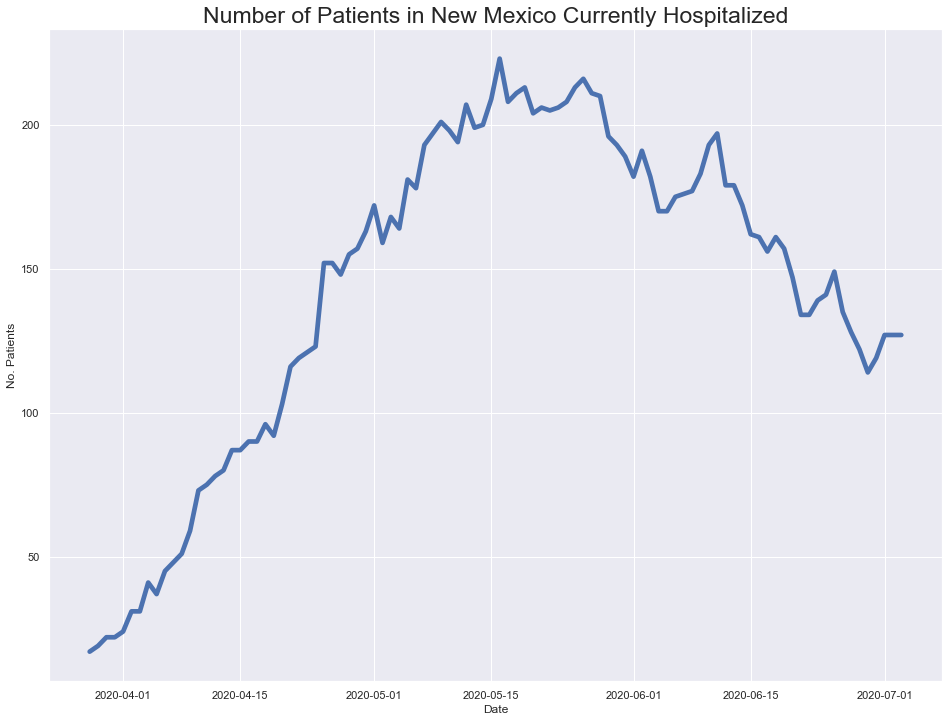

In [681]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nm.date, nm.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in New Mexico Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

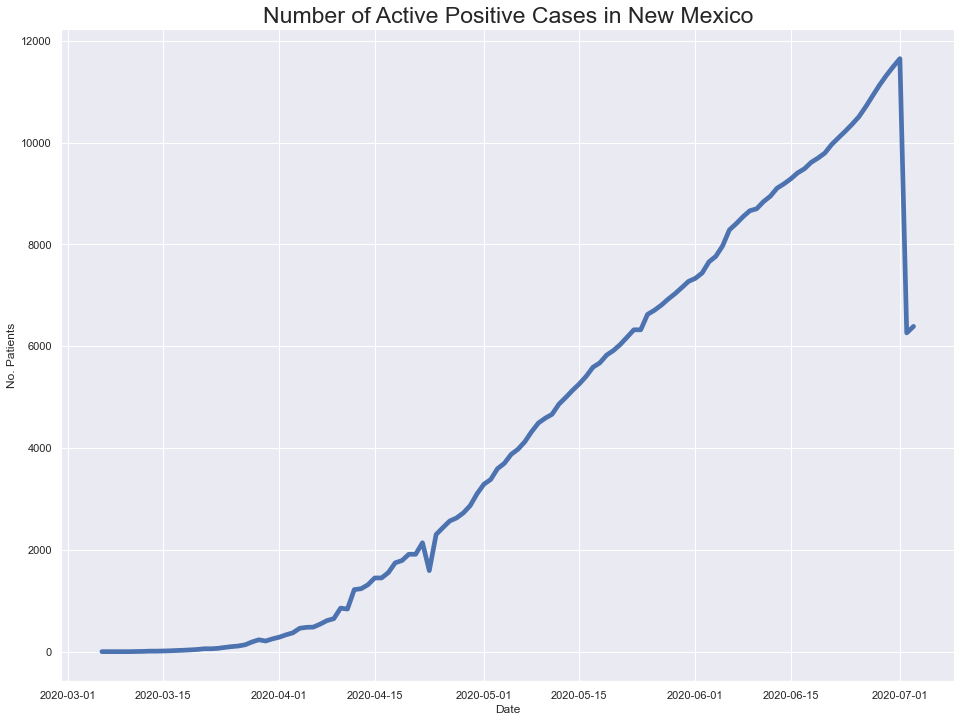

In [682]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nm.date, nm.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in New Mexico', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

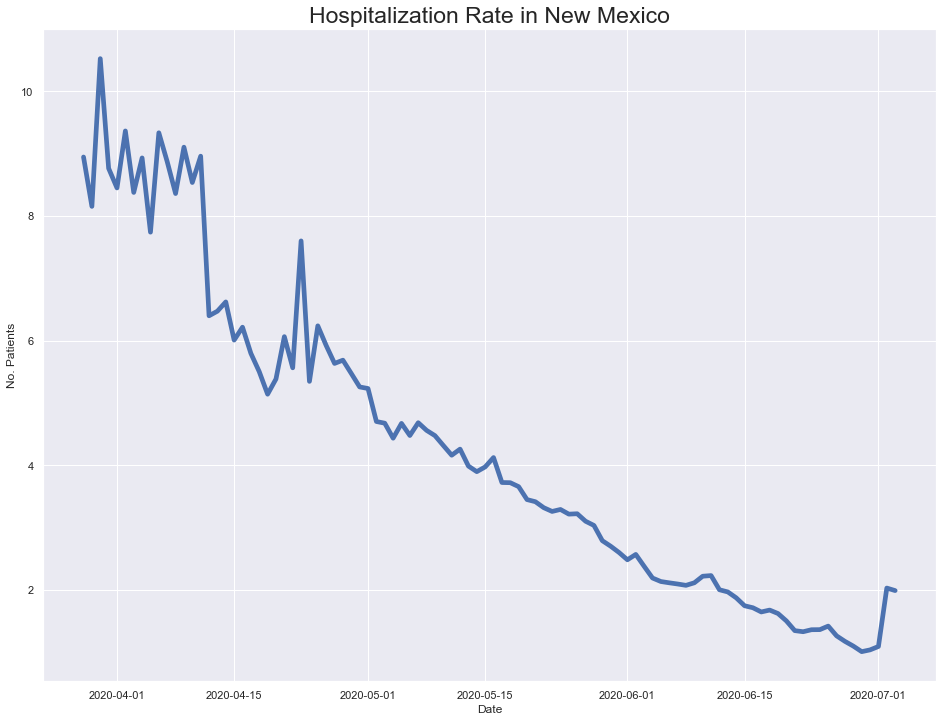

In [683]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nm.date, nm.hospitalizedCurrently/nm.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in New Mexico', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

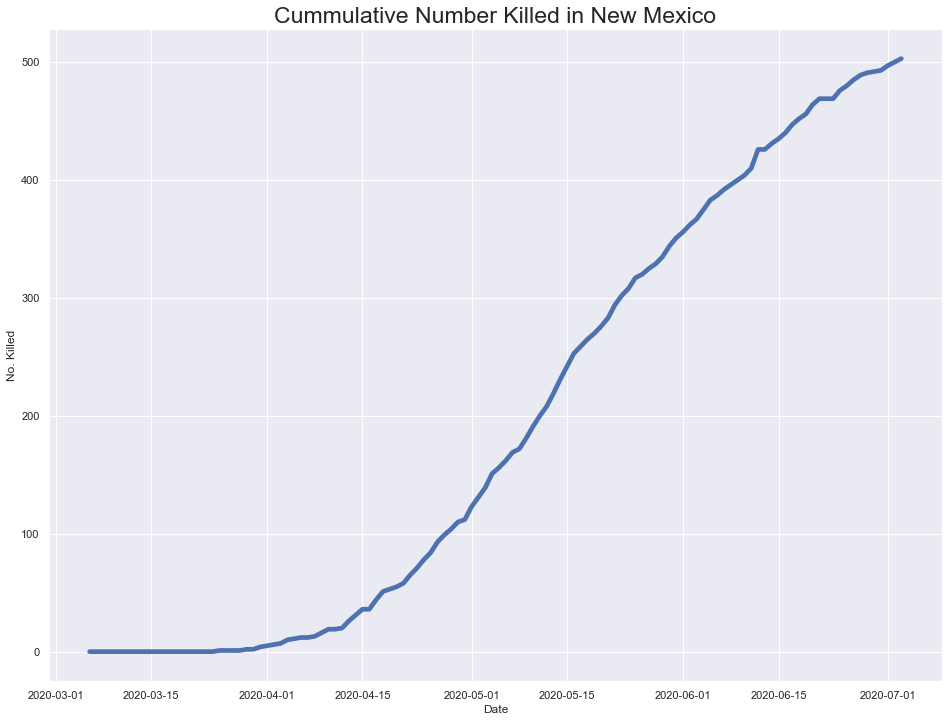

In [684]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nm.date, nm.death, linewidth=4.7)
plt.title('Cummulative Number Killed in New Mexico', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [685]:
#hide_input
# Checking which cols have NaN values
nm[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
nm.head()

# Omit the NaN cols
nm = nm[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

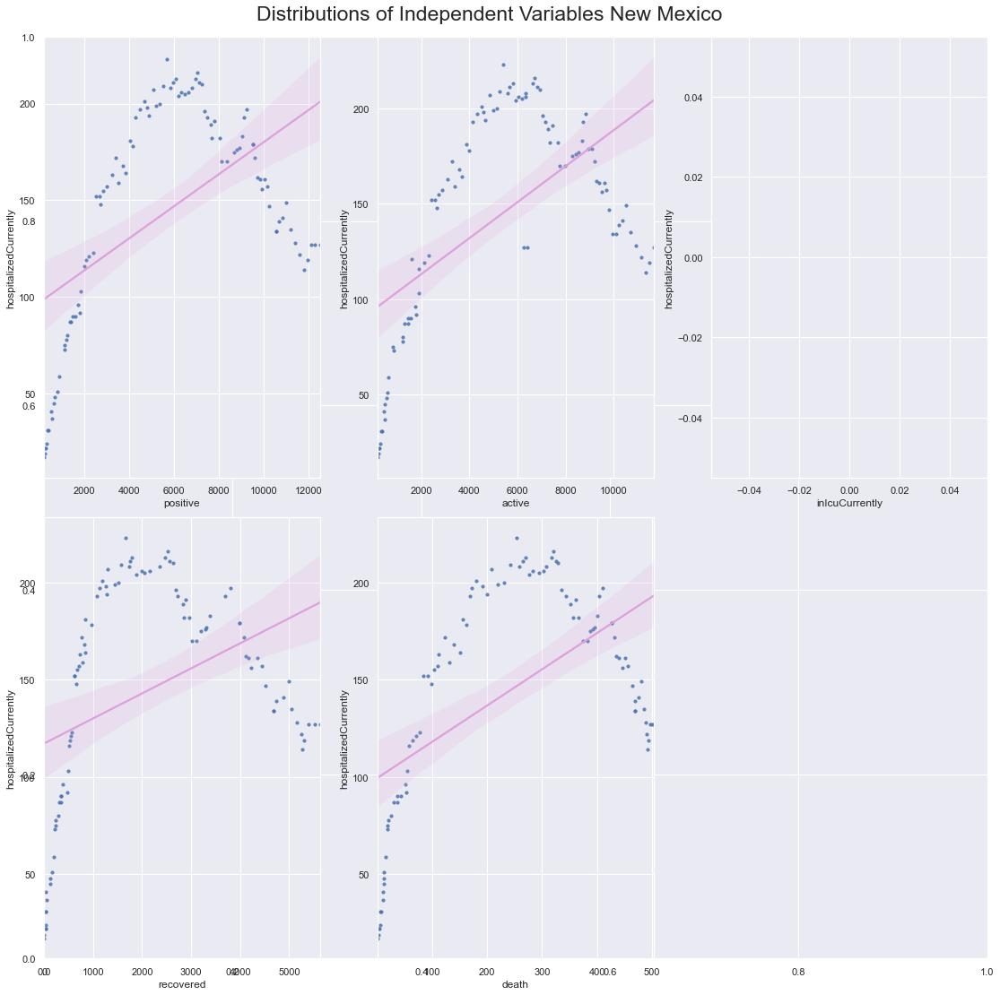

In [686]:
#hide_input
# Scatter plots NM
# Split dependent var from independent variables
target_nm = nm.hospitalizedCurrently
indep_var_nm = nm.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_nm.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_nm[col], y=target_nm, data=indep_var_nm, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables New Mexico', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [687]:
#hide_input
###endnewmexico

### New York

Text(0, 0.5, 'No. Patients')

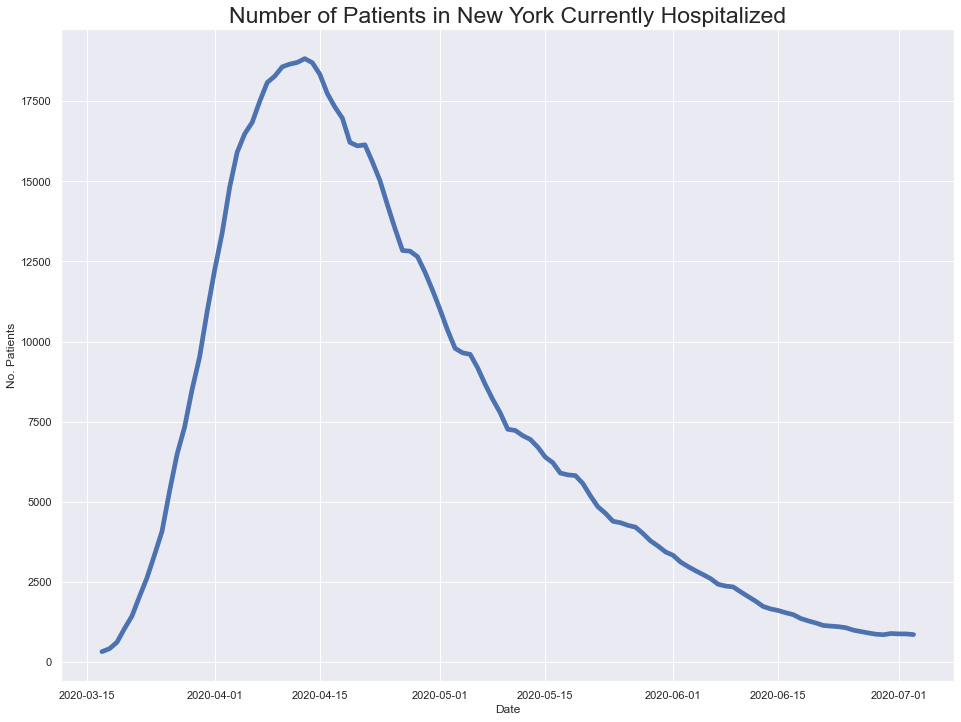

In [688]:
#hide_input
# Split covid_df into subset with only NY values
new_york = covid_df.loc[covid_df['abbrev'] == 'NY'] 
fig, ax = plt.subplots(figsize = (16, 12))
# Timeseries plt
plt.plot(new_york.date, new_york.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in New York Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

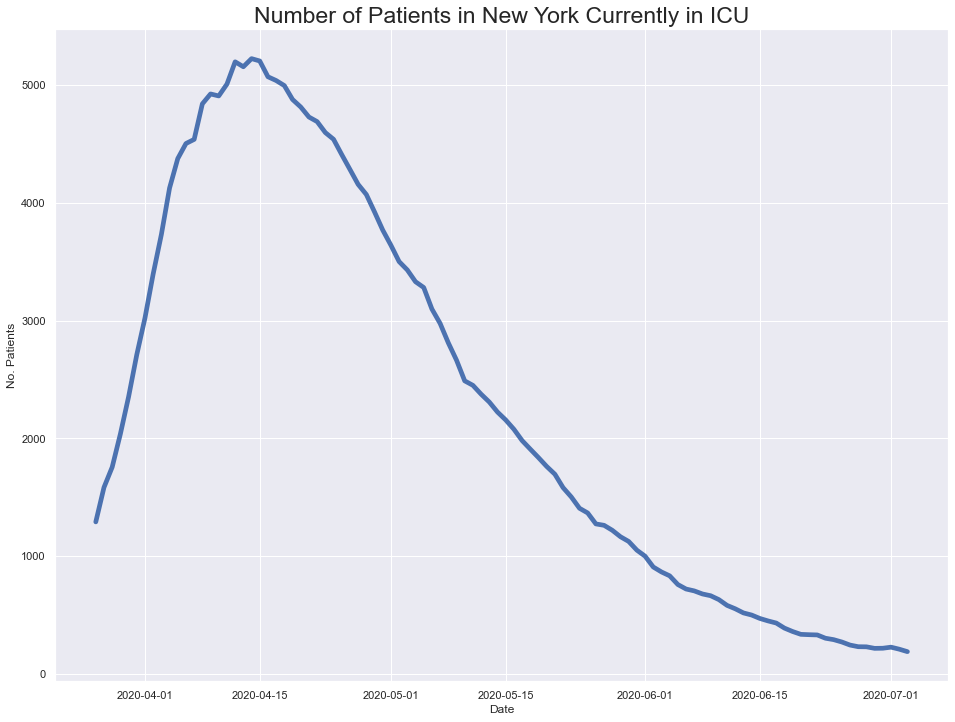

In [689]:
#hide_input
# Split covid_df into subset with only NY values
new_york = covid_df.loc[covid_df['abbrev'] == 'NY'] 
fig, ax = plt.subplots(figsize = (16, 12))
# Timeseries plt
plt.plot(new_york.date, new_york.inIcuCurrently, linewidth=4.7)
plt.title('Number of Patients in New York Currently in ICU', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

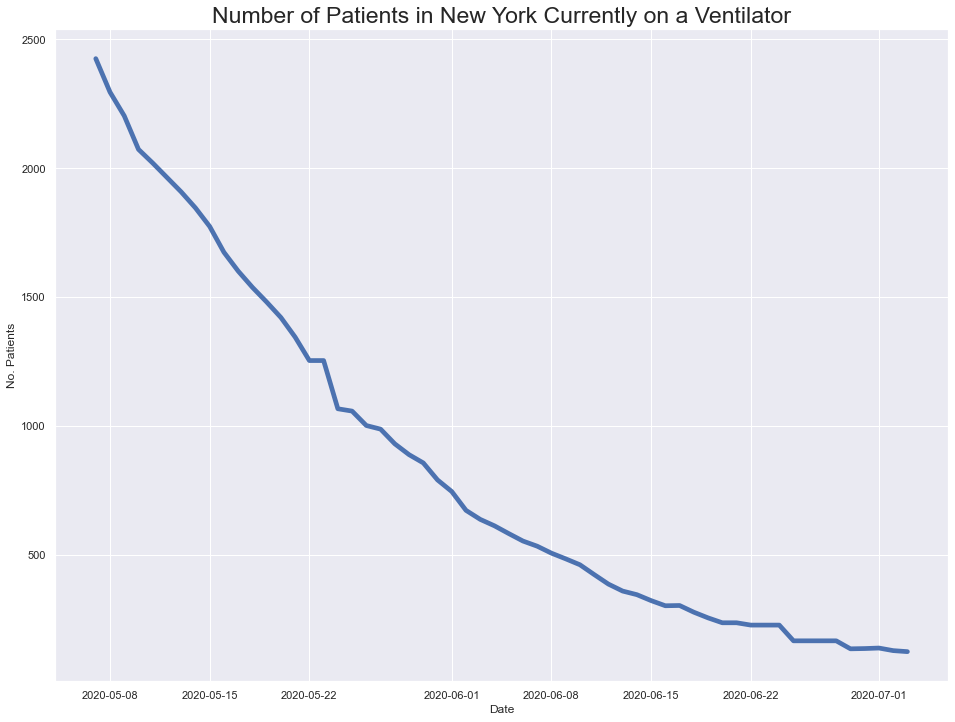

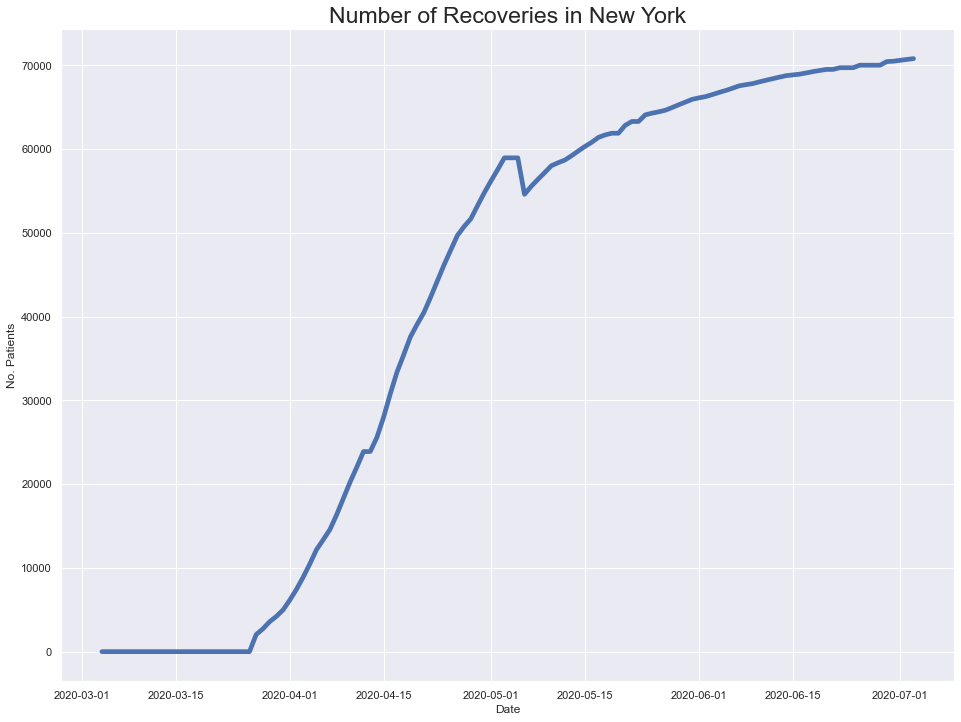

In [690]:
#hide_input
# Split covid_df into subset with only NY values
new_york = covid_df.loc[covid_df['abbrev'] == 'NY'] 
fig, ax = plt.subplots(figsize = (16, 12))
# Timeseries plt
plt.plot(new_york.date, new_york.onVentilatorCurrently, linewidth=4.7)
plt.title('Number of Patients in New York Currently on a Ventilator', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

#hide_input
# Split covid_df into subset with only NY values
new_york = covid_df.loc[covid_df['abbrev'] == 'NY'] 
fig, ax = plt.subplots(figsize = (16, 12))
# Timeseries plt
plt.plot(new_york.date, new_york.recovered, linewidth=4.7)
plt.title('Number of Recoveries in New York', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

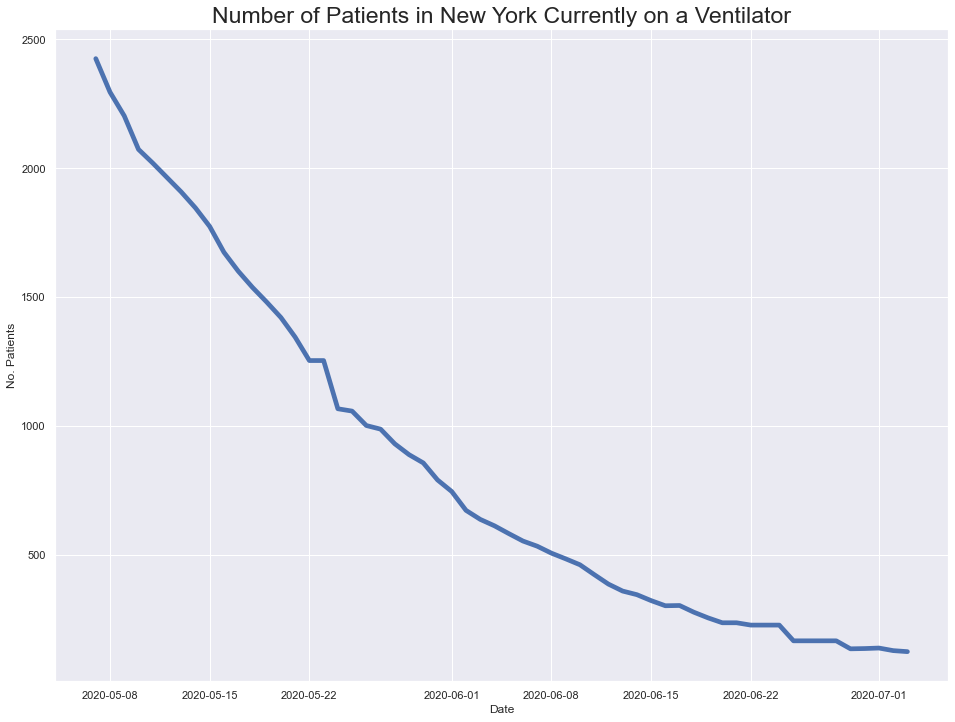

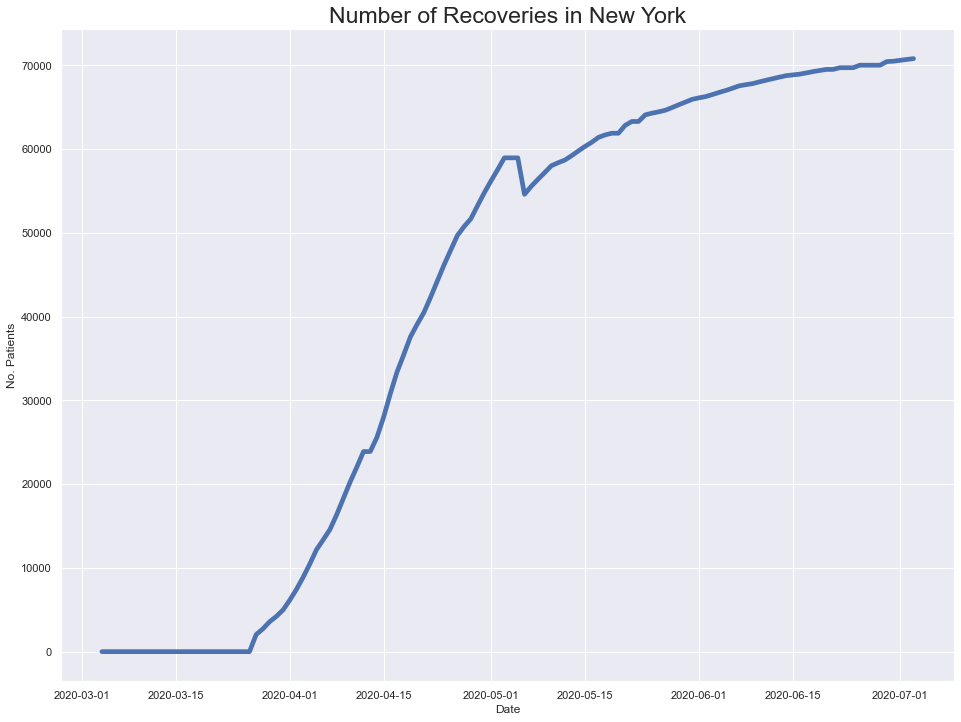

In [691]:
#hide_input
# Split covid_df into subset with only NY values
new_york = covid_df.loc[covid_df['abbrev'] == 'NY'] 
fig, ax = plt.subplots(figsize = (16, 12))
# Timeseries plt
plt.plot(new_york.date, new_york.onVentilatorCurrently, linewidth=4.7)
plt.title('Number of Patients in New York Currently on a Ventilator', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

#hide_input
# Split covid_df into subset with only NY values
new_york = covid_df.loc[covid_df['abbrev'] == 'NY'] 
fig, ax = plt.subplots(figsize = (16, 12))
# Timeseries plt
plt.plot(new_york.date, new_york.recovered, linewidth=4.7)
plt.title('Number of Recoveries in New York', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [692]:
#hide_input
# Omit the categorical and date cols 
new_york = new_york[['positive', 'active', 'hospitalizedCurrently', 'hospitalizedCumulative', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]

In [693]:
#hide_input
# Checking which cols have NaN values
new_york[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
new_york.head()

# Omit the NaN cols
new_york = new_york[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

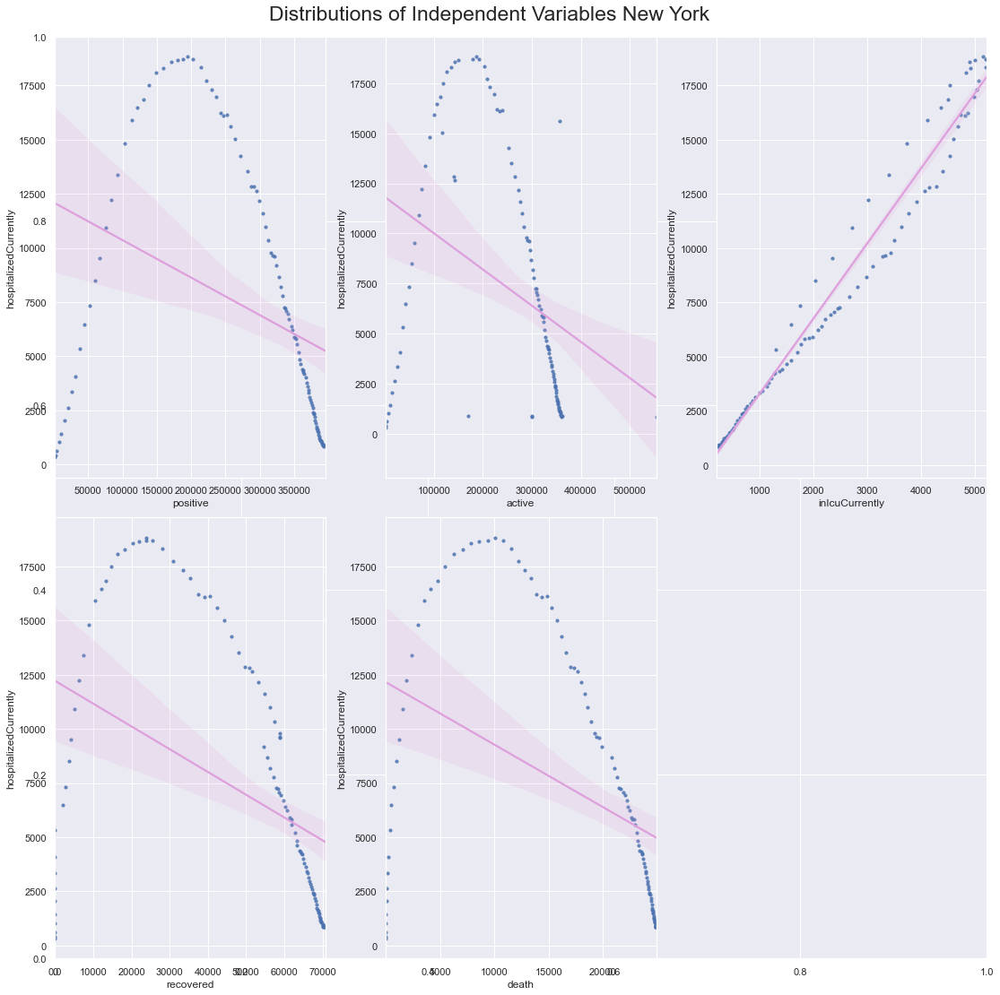

In [694]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_ny = new_york.hospitalizedCurrently
indep_var_ny = new_york.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ny.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ny[col], y=target_ny, data=indep_var_ny, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables New York', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

### North Carolina

In [695]:
#hide_input
nc = covid_df.loc[(covid_df['abbrev'] == 'NC') & (covid_df['state']== 'North Carolina')] 


Text(0, 0.5, 'No. Patients')

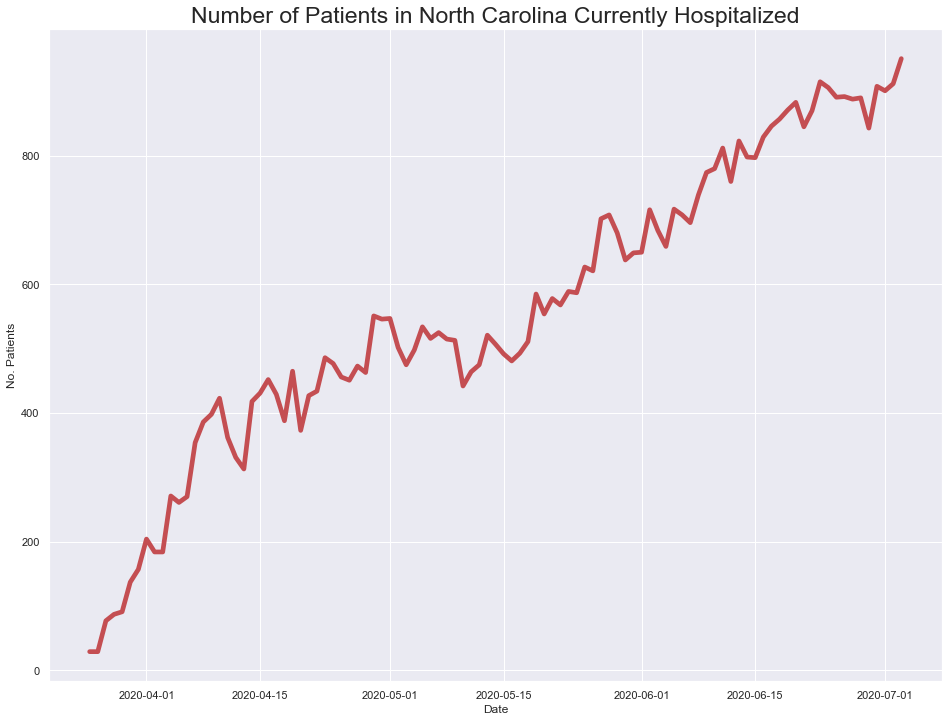

In [696]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nc.date, nc.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in North Carolina Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

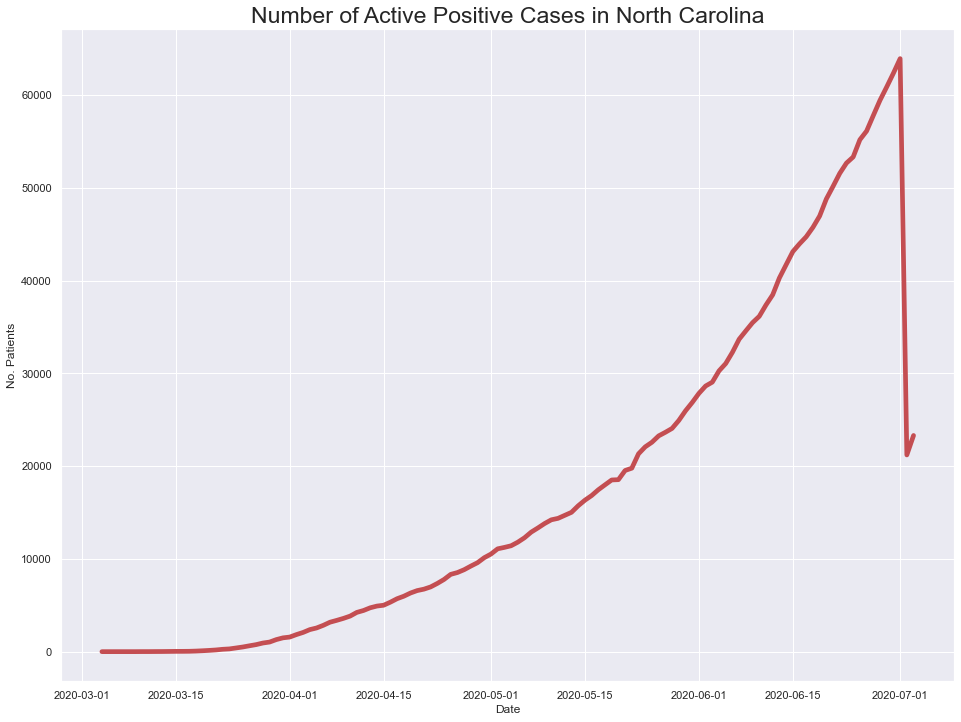

In [697]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nc.date, nc.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in North Carolina', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

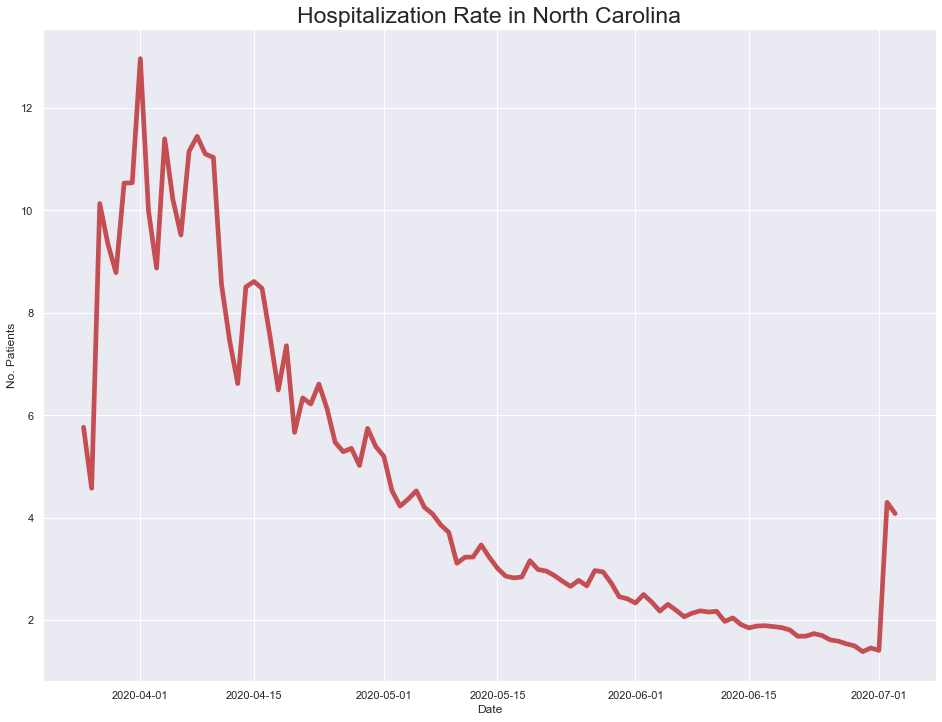

In [698]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nc.date, nc.hospitalizedCurrently/nc.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in North Carolina', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

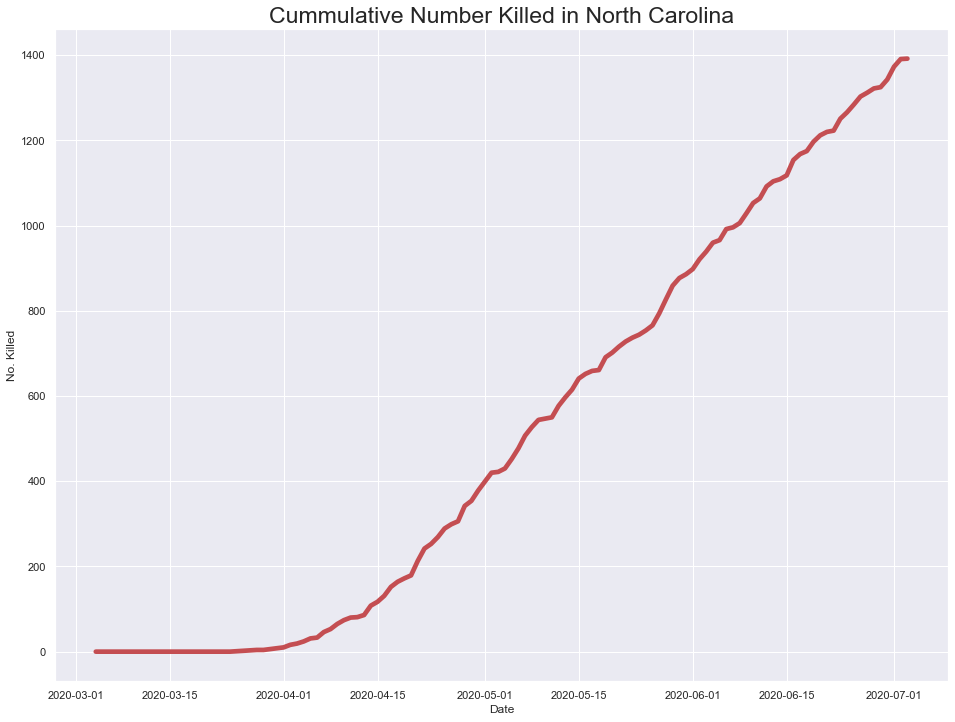

In [699]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(nc.date, nc.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in North Carolina', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [700]:
#hide_input
# Checking which cols have NaN values
nc[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
nc.head()

# Omit the NaN cols
nc = nc[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

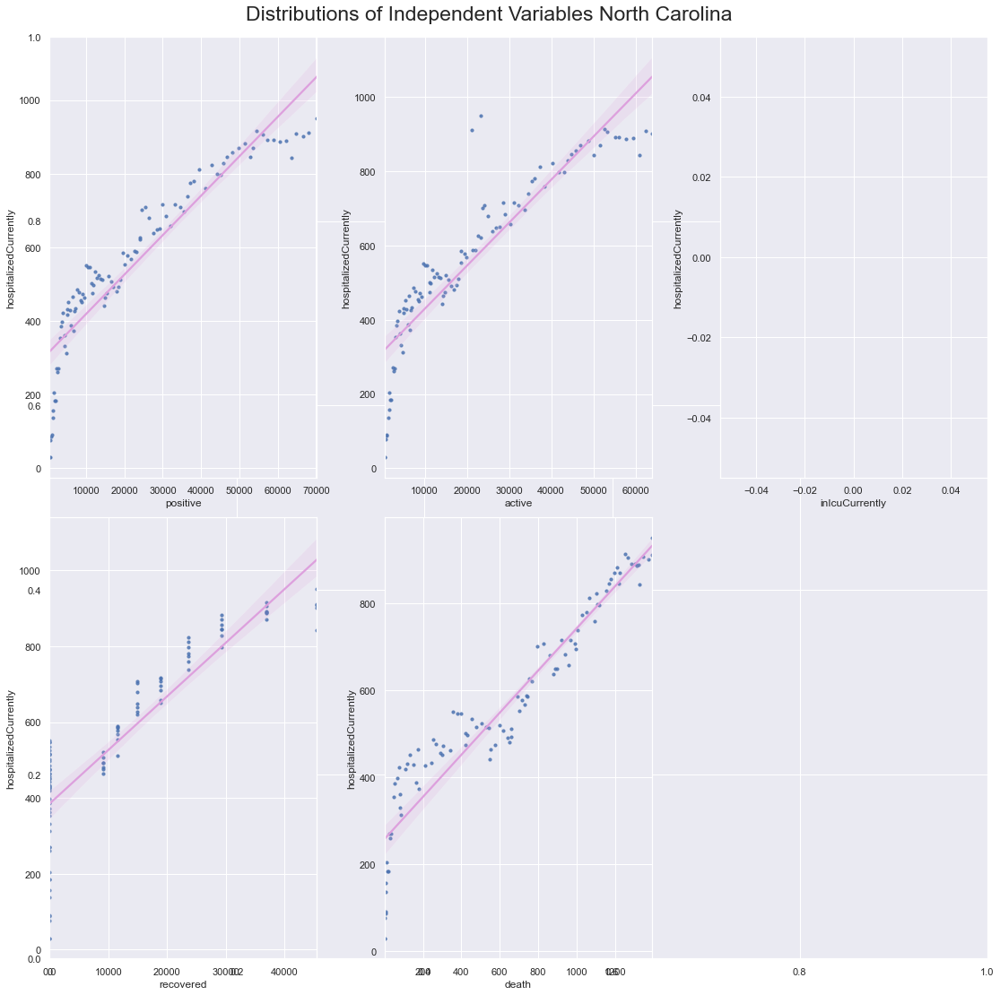

In [701]:
#hide_input
# Scatter plots NC
# Split dependent var from independent variables
target_nc = nc.hospitalizedCurrently
indep_var_nc = nc.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_nc.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_nc[col], y=target_nc, data=indep_var_nc, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables North Carolina', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [702]:
#hide_input
###endnorthcarolina

### Ohio

In [703]:
#hide_input
oh = covid_df.loc[(covid_df['abbrev'] == 'OH') & (covid_df['state']== 'Ohio')] 


Text(0, 0.5, 'No. Patients')

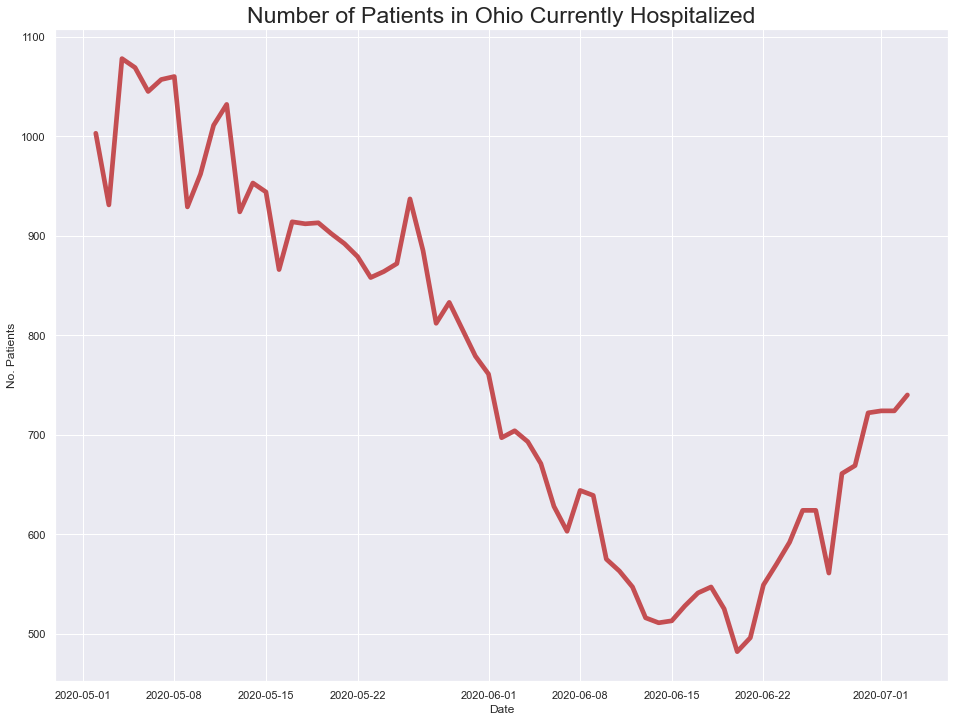

In [704]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oh.date, oh.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Ohio Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

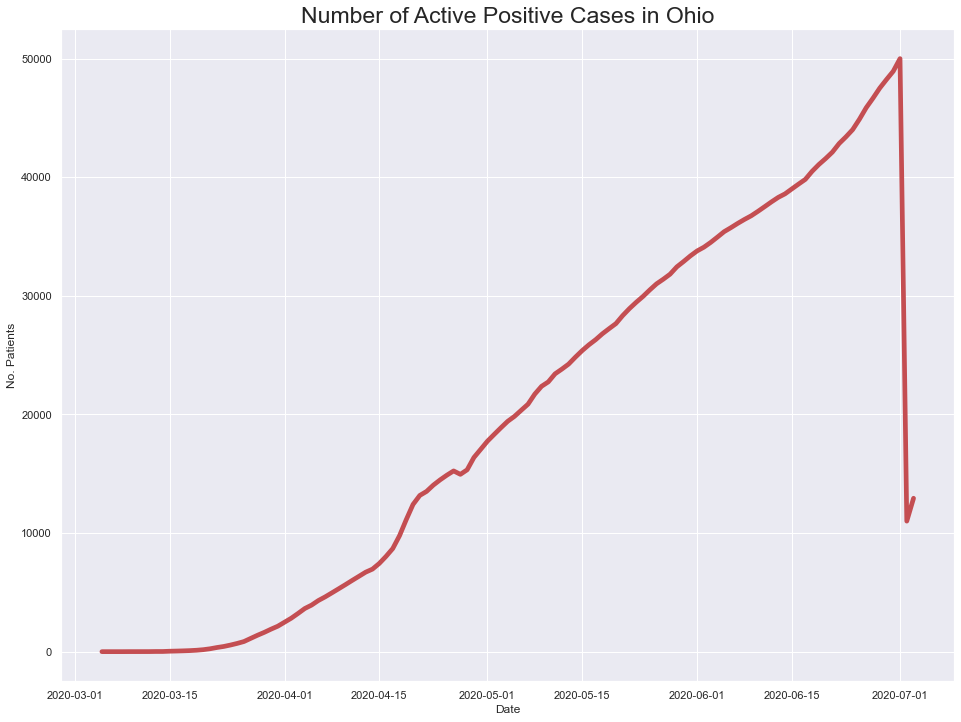

In [705]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oh.date, oh.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Ohio', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

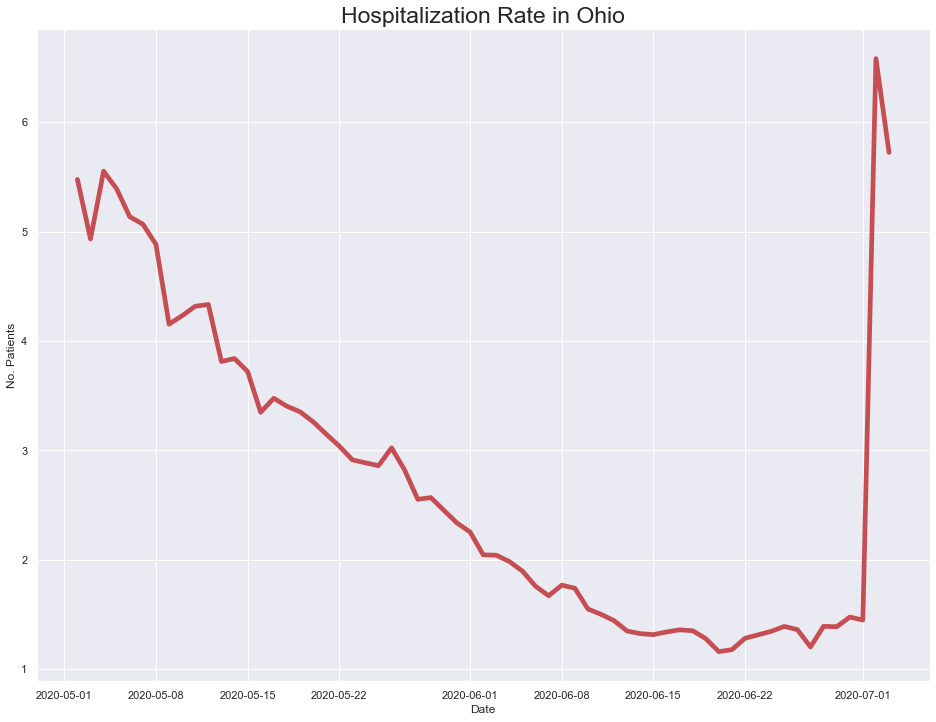

In [706]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oh.date, oh.hospitalizedCurrently/oh.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Ohio', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

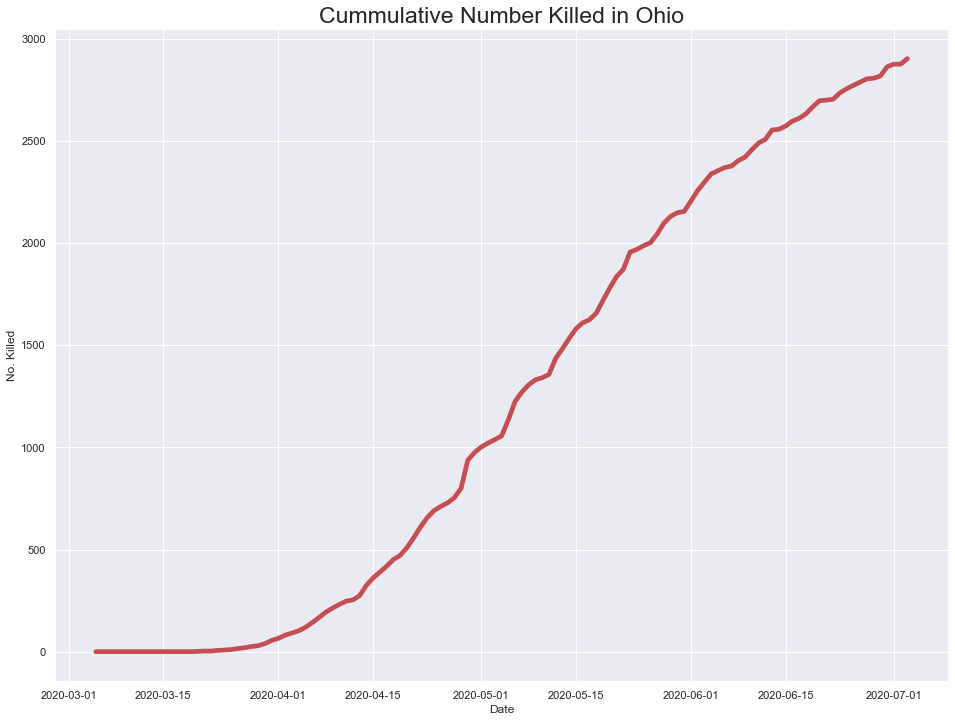

In [707]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oh.date, oh.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Ohio', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [708]:
#hide_input
# Checking which cols have NaN values
oh[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
oh.head()

# Omit the NaN cols
oh = oh[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

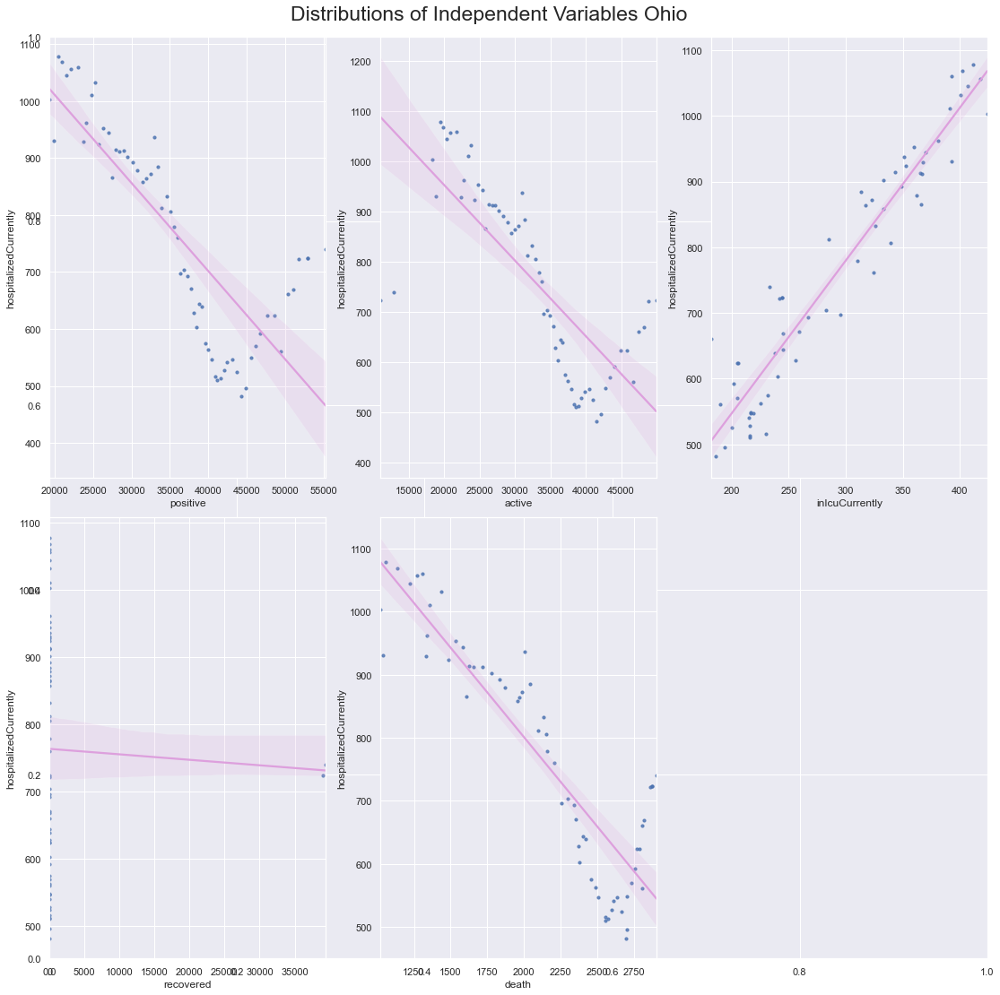

In [709]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_oh = oh.hospitalizedCurrently
indep_var_oh = oh.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_oh.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_oh[col], y=target_oh, data=indep_var_oh, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Ohio', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [710]:
#hide_input
###endohio

### Oklahoma

In [711]:
#hide_input
oklahoma = covid_df.loc[(covid_df['abbrev'] == 'OK') & (covid_df['state']== 'Oklahoma')] 


Text(0, 0.5, 'No. Patients')

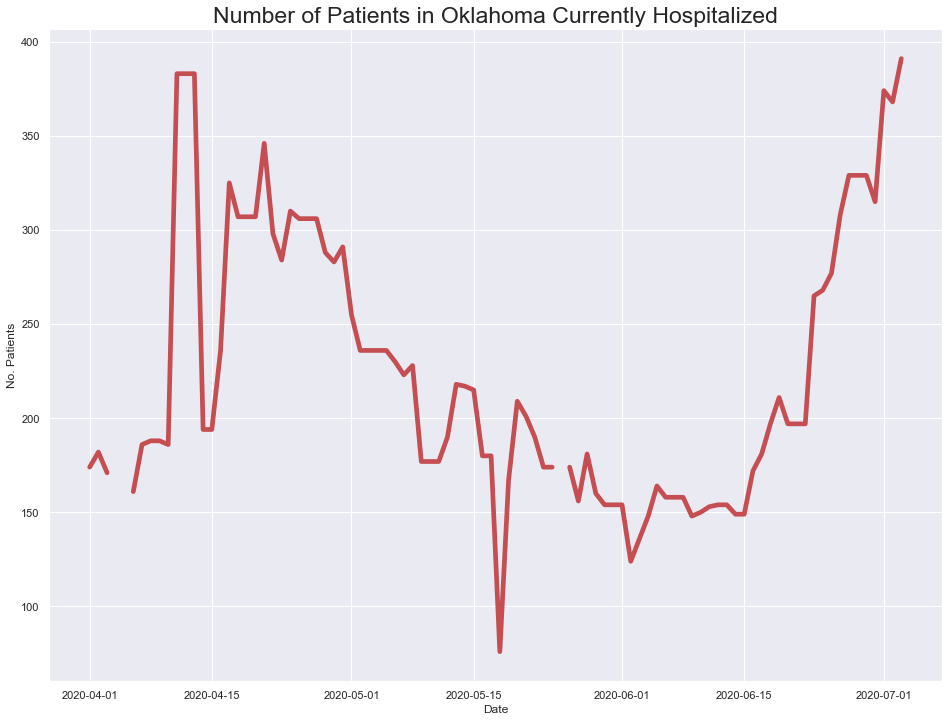

In [712]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oklahoma.date, oklahoma.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Oklahoma Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [713]:
#hide_input
# Checking which cols have NaN values
oklahoma[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
oklahoma.head()

# Omit the NaN cols
oklahoma = oklahoma[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

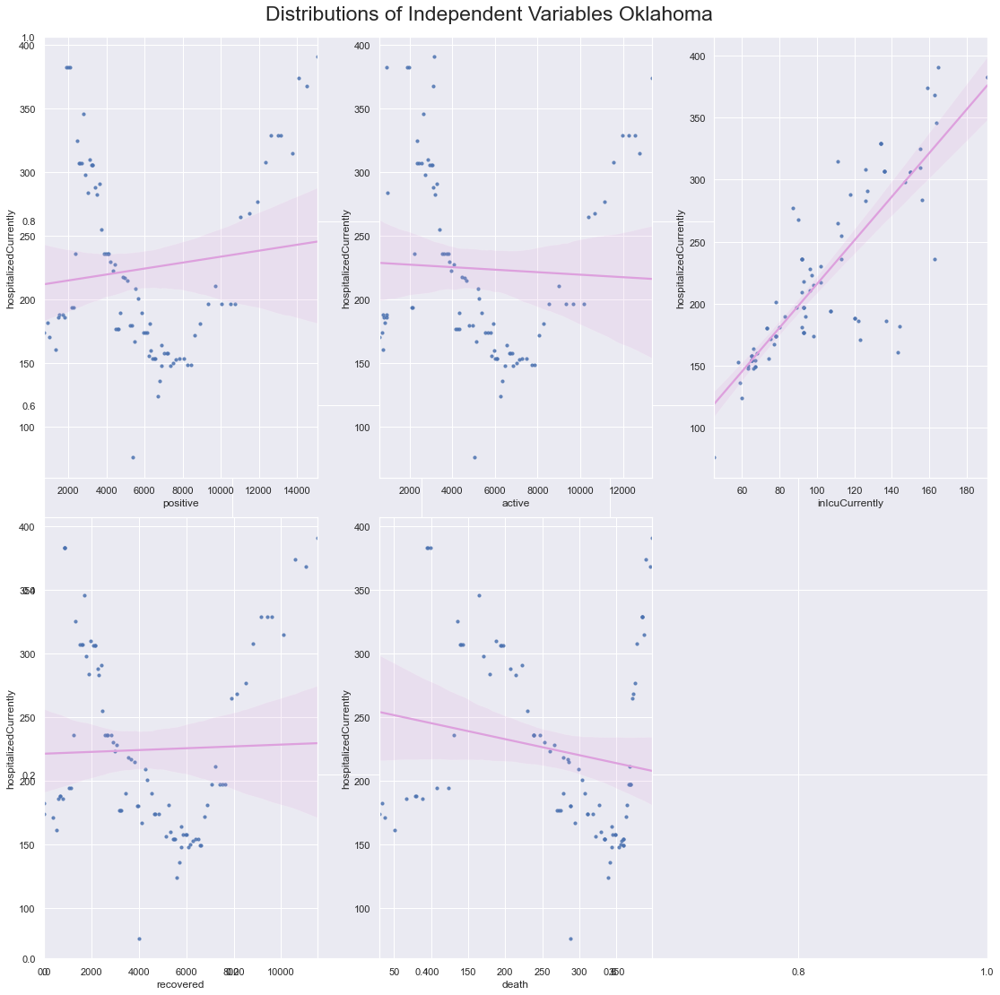

In [714]:
#hide_input
# Scatter plots OK
# Split dependent var from independent variables
target_ok = oklahoma.hospitalizedCurrently
indep_var_ok = oklahoma.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ok.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ok[col], y=target_ok, data=indep_var_ok, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Oklahoma', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [715]:
#hide_input
###endoklahoma

### Oregon

In [716]:
#hide_input
oregon = covid_df.loc[(covid_df['abbrev'] == 'OR') & (covid_df['state']== 'Oregon')] 


Text(0, 0.5, 'No. Patients')

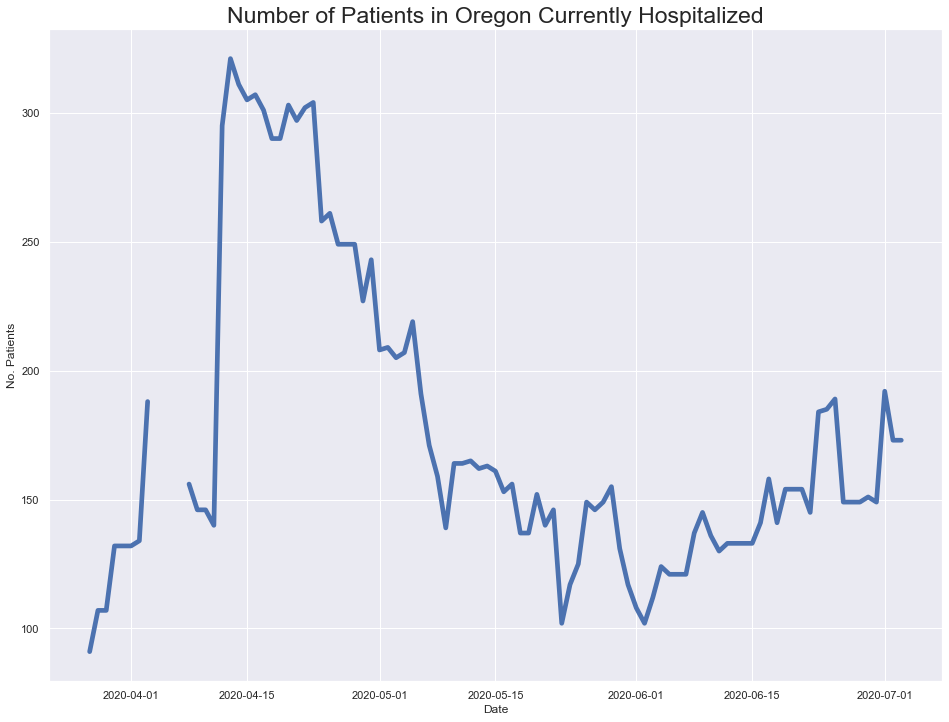

In [717]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oregon.date, oregon.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Oregon Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

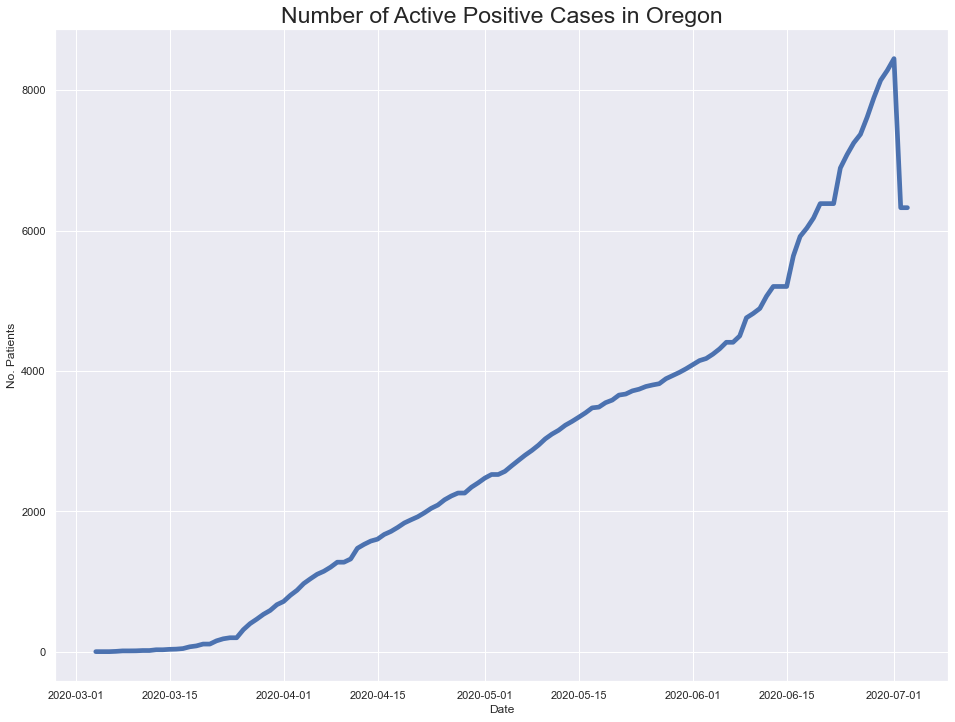

In [718]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oregon.date, oregon.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Oregon', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

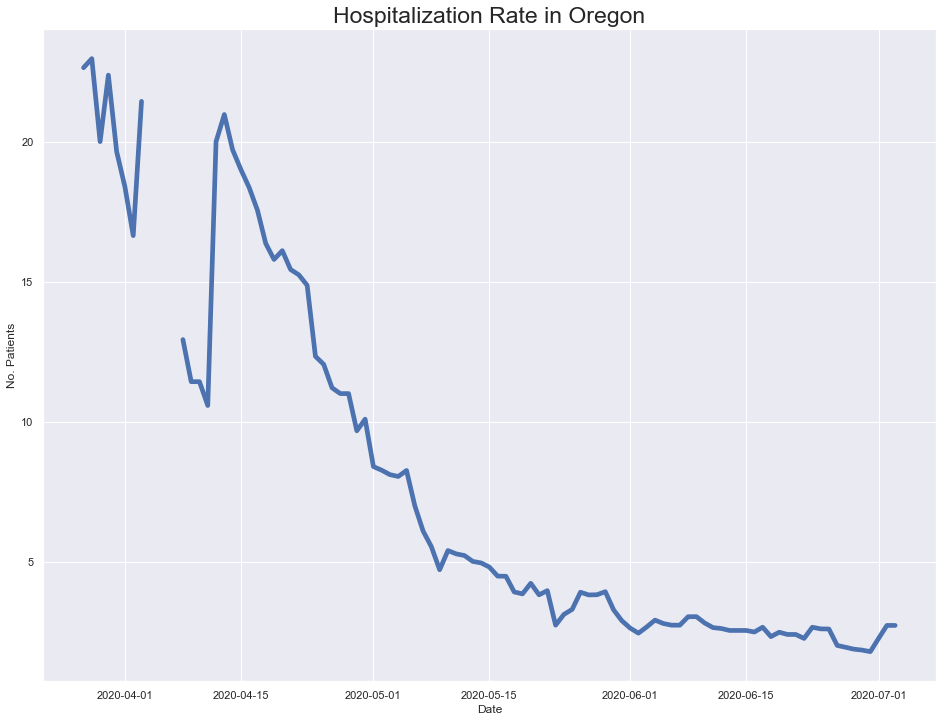

In [719]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oregon.date, oregon.hospitalizedCurrently/oregon.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Oregon', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

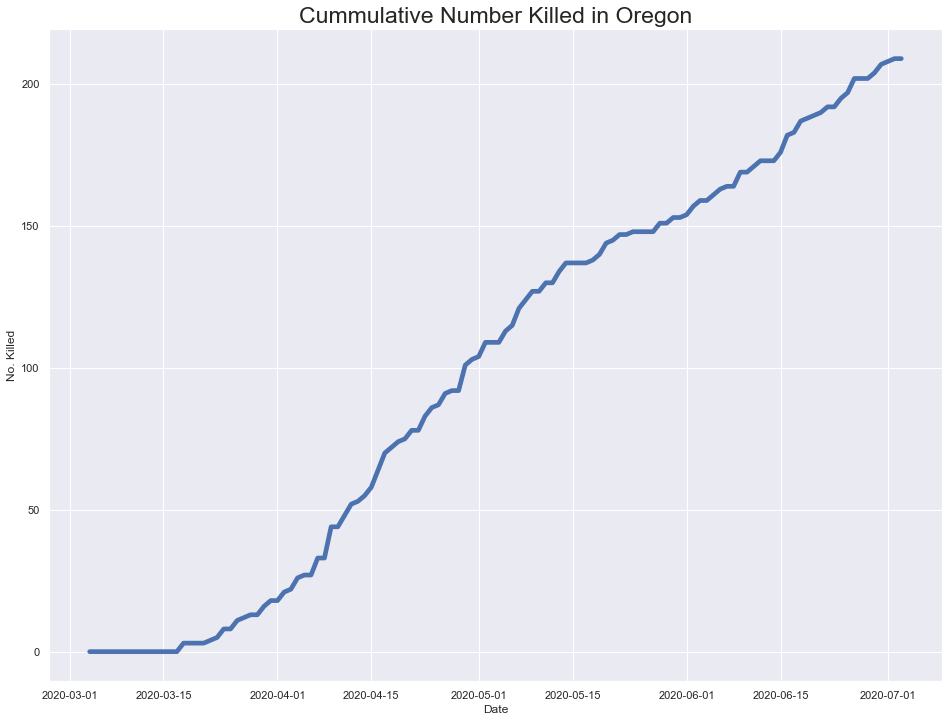

In [720]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(oregon.date, oregon.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Oregon', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [721]:
#hide_input
# Checking which cols have NaN values
oregon[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
oregon.head()

# Omit the NaN cols
oregon = oregon[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

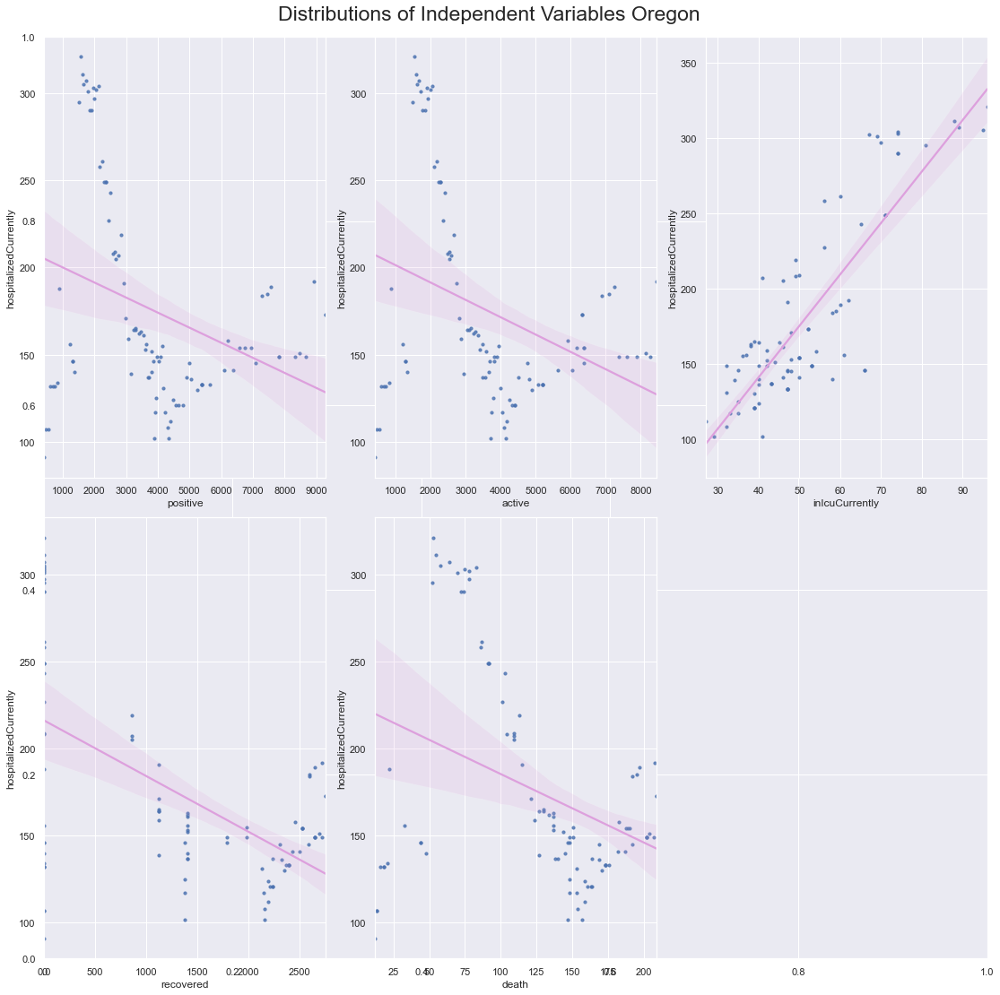

In [722]:
#hide_input
# Scatter plots OR
# Split dependent var from independent variables
target_oregon = oregon.hospitalizedCurrently
indep_var_oregon = oregon.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_oregon.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_oregon[col], y=target_oregon, data=indep_var_oregon, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Oregon', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [723]:
#hide_input
###endoregon

### Pennsylvania

In [724]:
#hide_input
pa = covid_df.loc[(covid_df['abbrev'] == 'PA') & (covid_df['state']== 'Pennsylvania')] 


Text(0, 0.5, 'No. Patients')

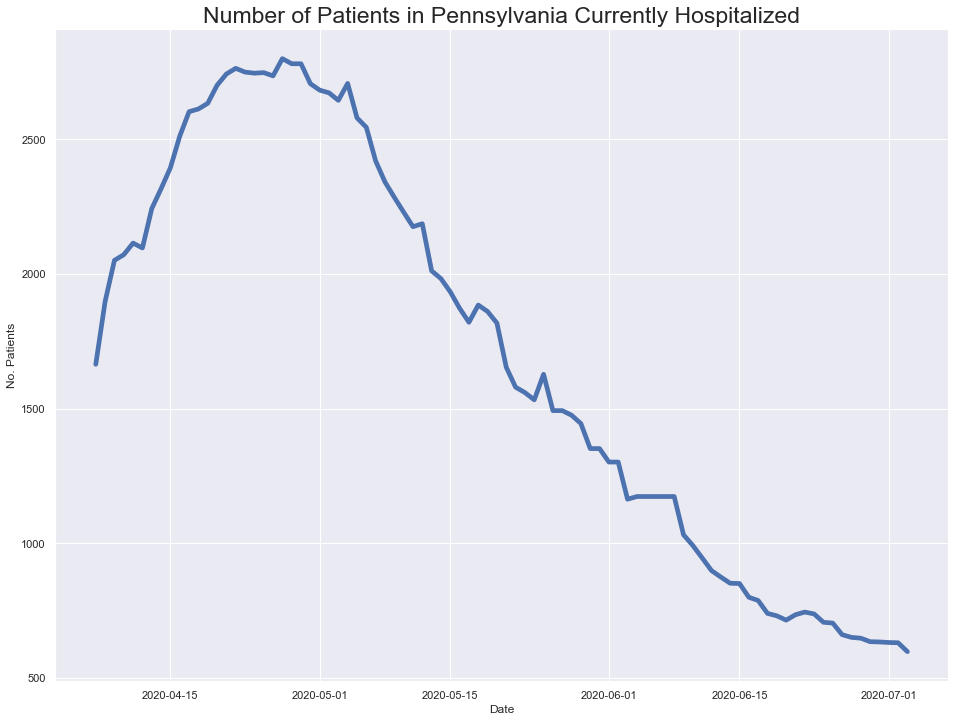

In [725]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(pa.date, pa.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Pennsylvania Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

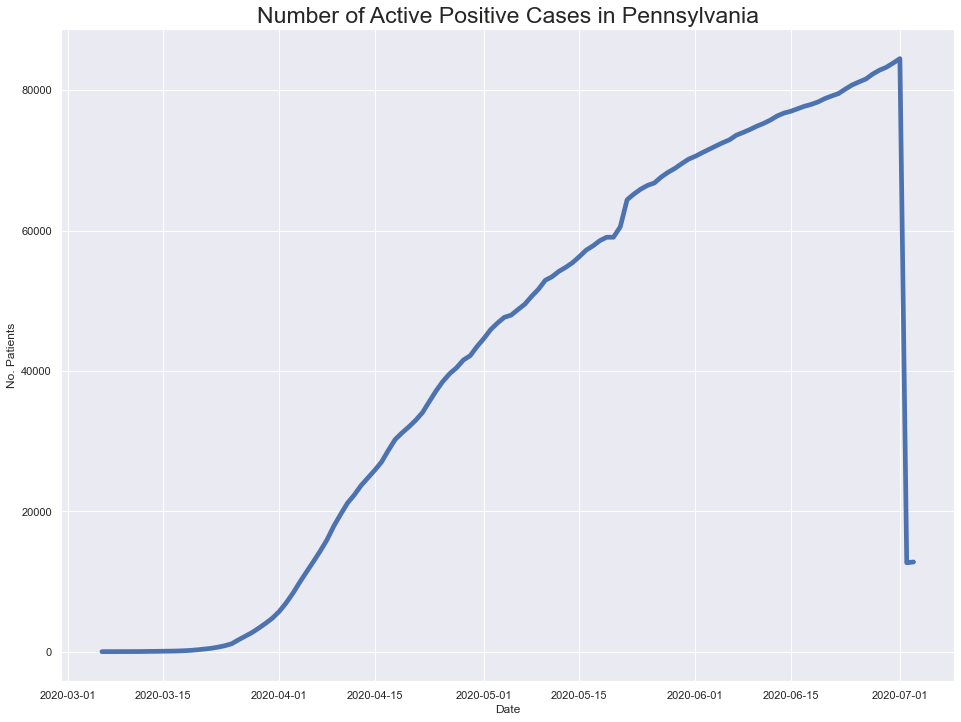

In [726]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(pa.date, pa.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Pennsylvania', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

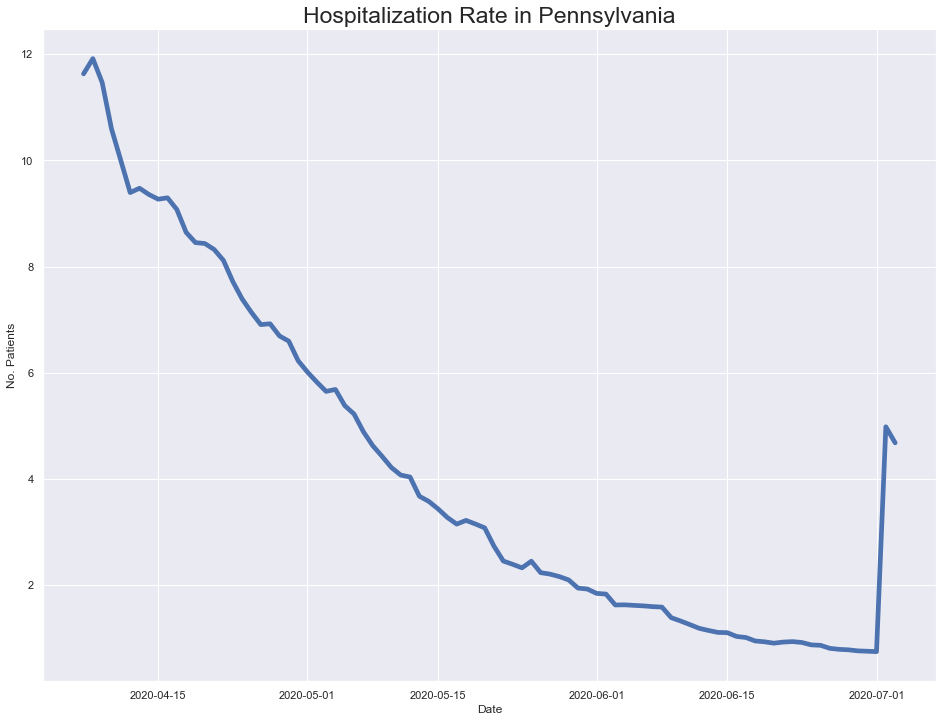

In [727]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(pa.date, pa.hospitalizedCurrently/pa.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Pennsylvania', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

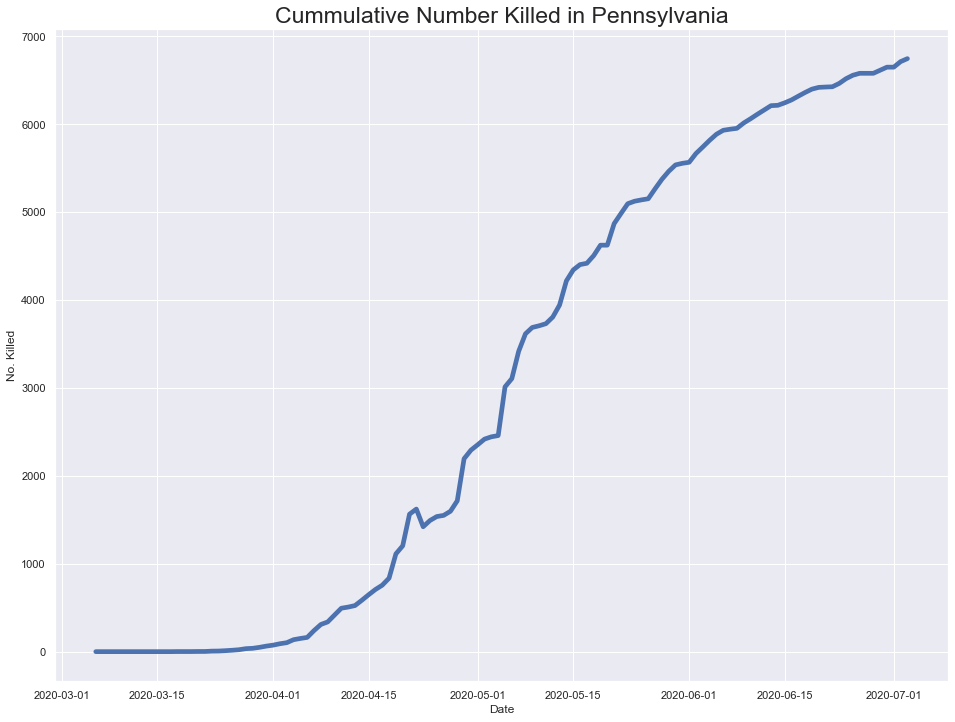

In [728]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(pa.date, pa.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Pennsylvania', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [729]:
#hide_input
# Checking which cols have NaN values
pa[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
pa.head()

# Omit the NaN cols
pa = pa[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

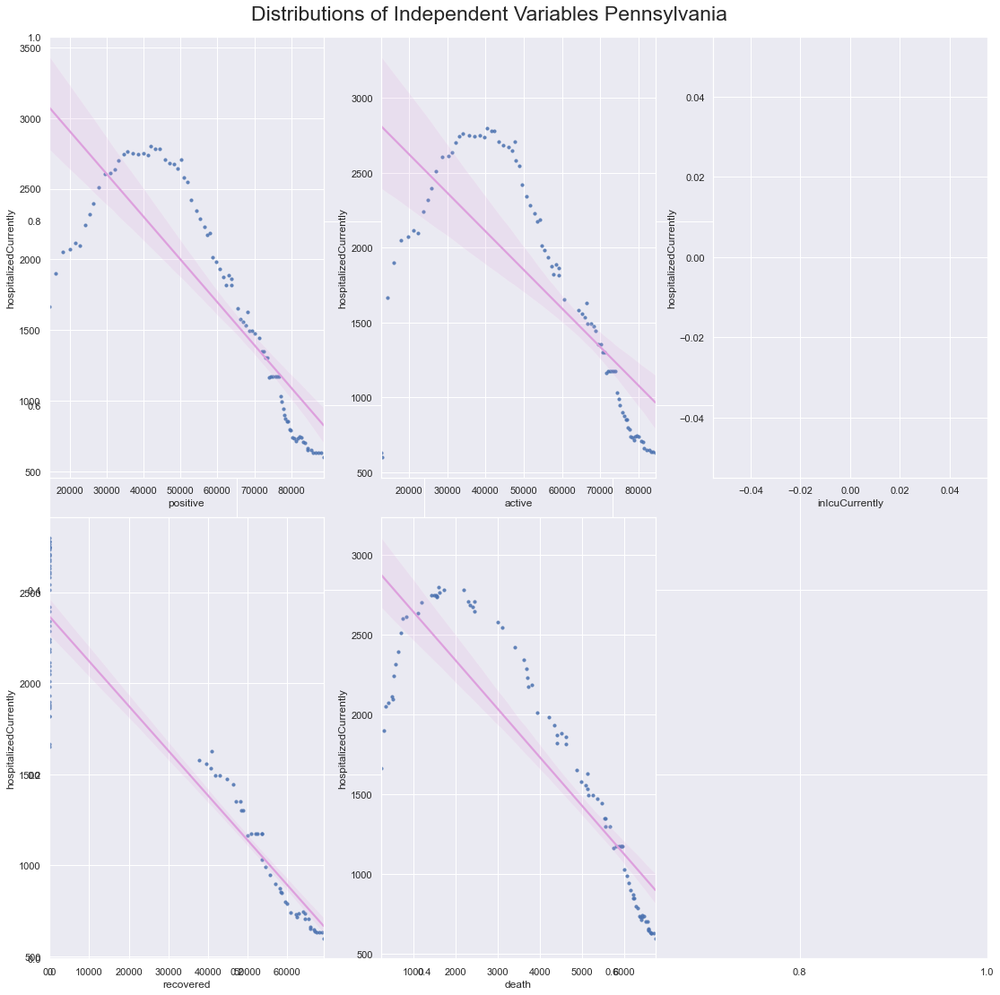

In [730]:
#hide_input
# Scatter plots PA
# Split dependent var from independent variables
target_pa = pa.hospitalizedCurrently
indep_var_pa = pa.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_pa.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_pa[col], y=target_pa, data=indep_var_pa, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Pennsylvania', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [731]:
#hide_input
###endpennsylvania

### Rhode Island

In [732]:
#hide_input
ri = covid_df.loc[(covid_df['abbrev'] == 'RI') & (covid_df['state']== 'Rhode Island')] 


Text(0, 0.5, 'No. Patients')

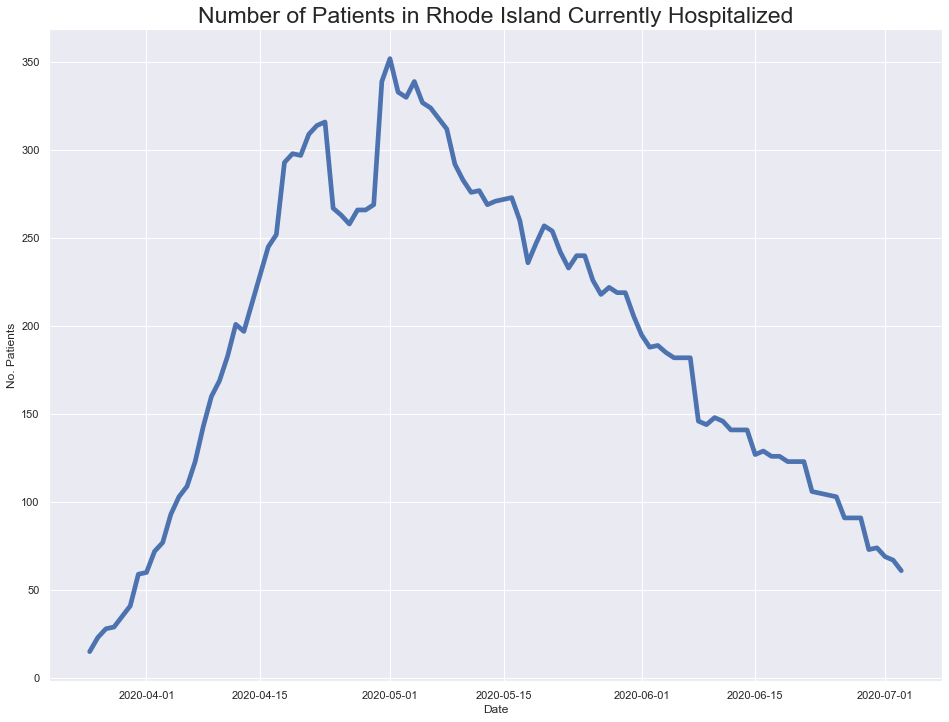

In [733]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ri.date, ri.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Rhode Island Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

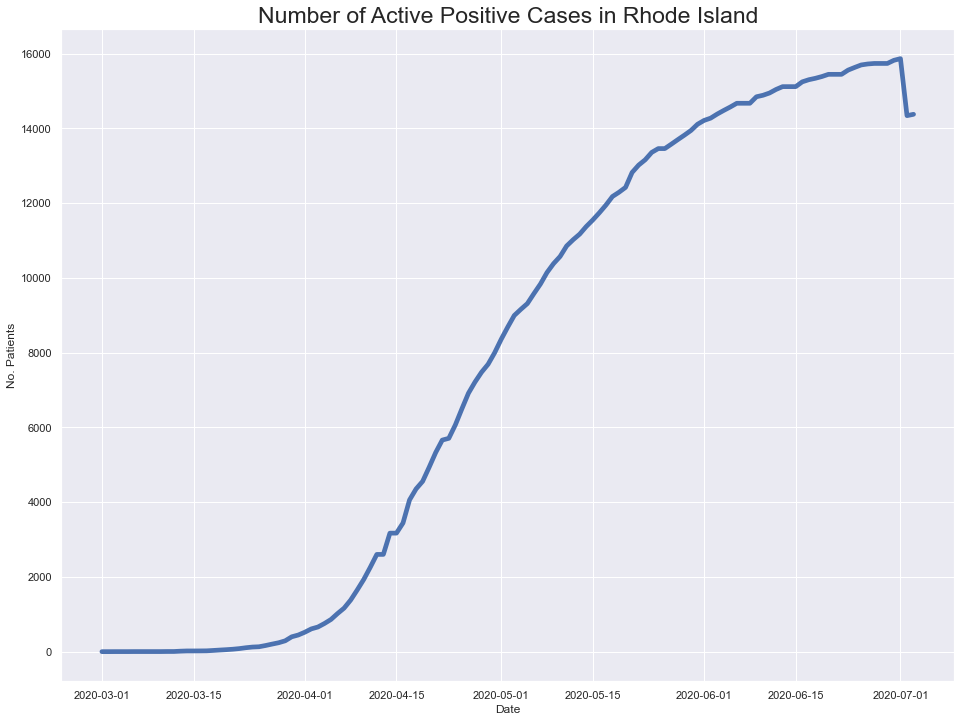

In [734]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ri.date, ri.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Rhode Island', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

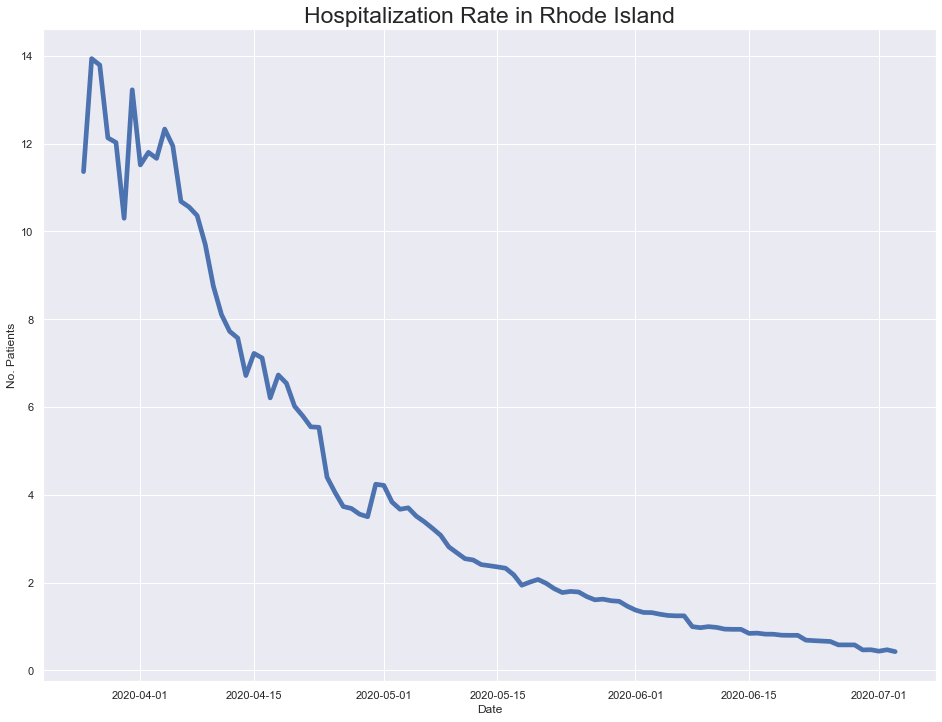

In [735]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ri.date, ri.hospitalizedCurrently/ri.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Rhode Island', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

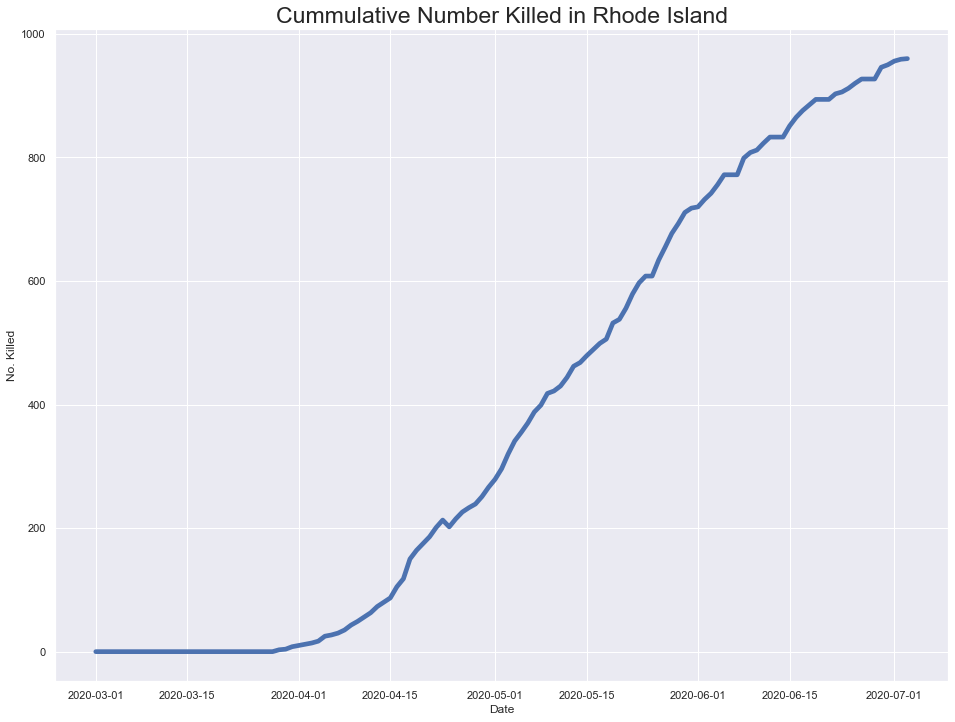

In [736]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(ri.date, ri.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Rhode Island', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [737]:
#hide_input
# Checking which cols have NaN values
ri[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
ri.head()

# Omit the NaN cols
ri = ri[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

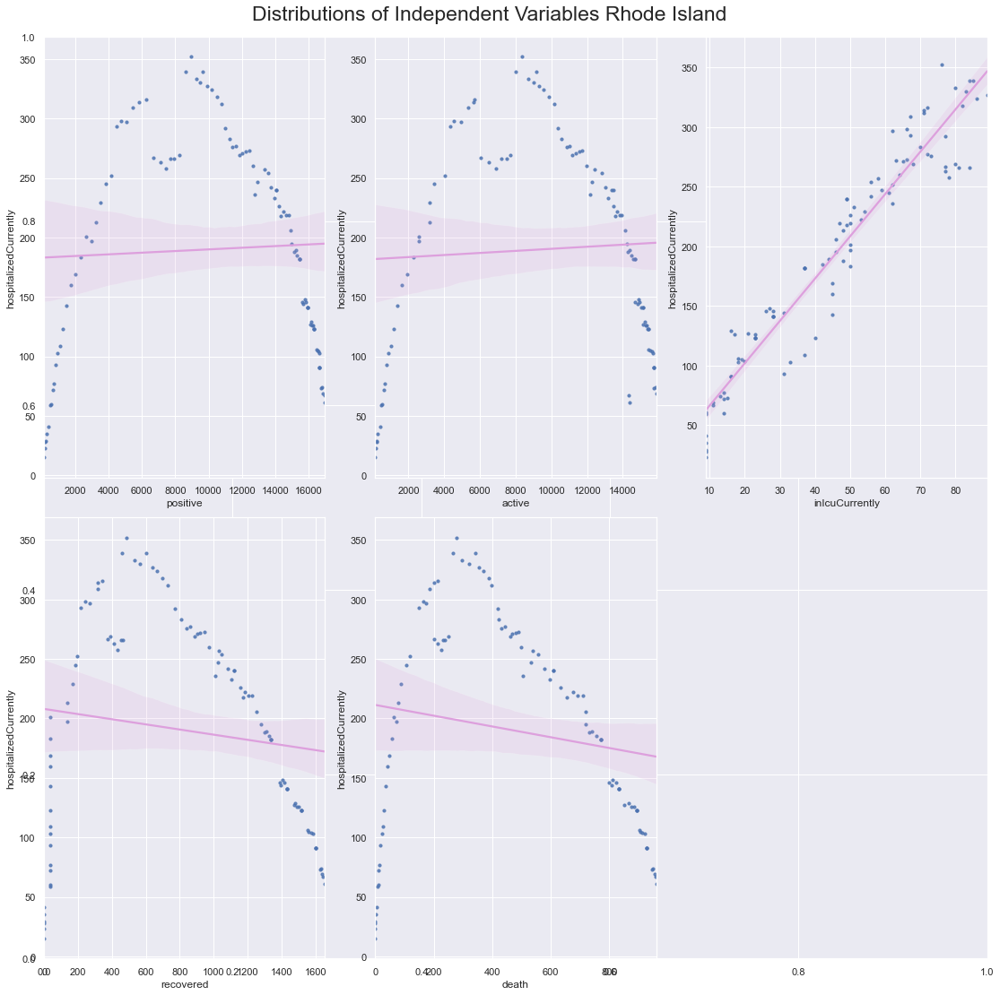

In [738]:
#hide_input
# Scatter plots RI
# Split dependent var from independent variables
target_ri = ri.hospitalizedCurrently
indep_var_ri = ri.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_ri.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ri[col], y=target_ri, data=indep_var_ri, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Rhode Island', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [739]:
#hide_input
###endrhodeisland

### South Carolina

In [740]:
#hide_input
sc = covid_df.loc[(covid_df['abbrev'] == 'SC') & (covid_df['state']== 'South Carolina')] 


Text(0, 0.5, 'No. Patients')

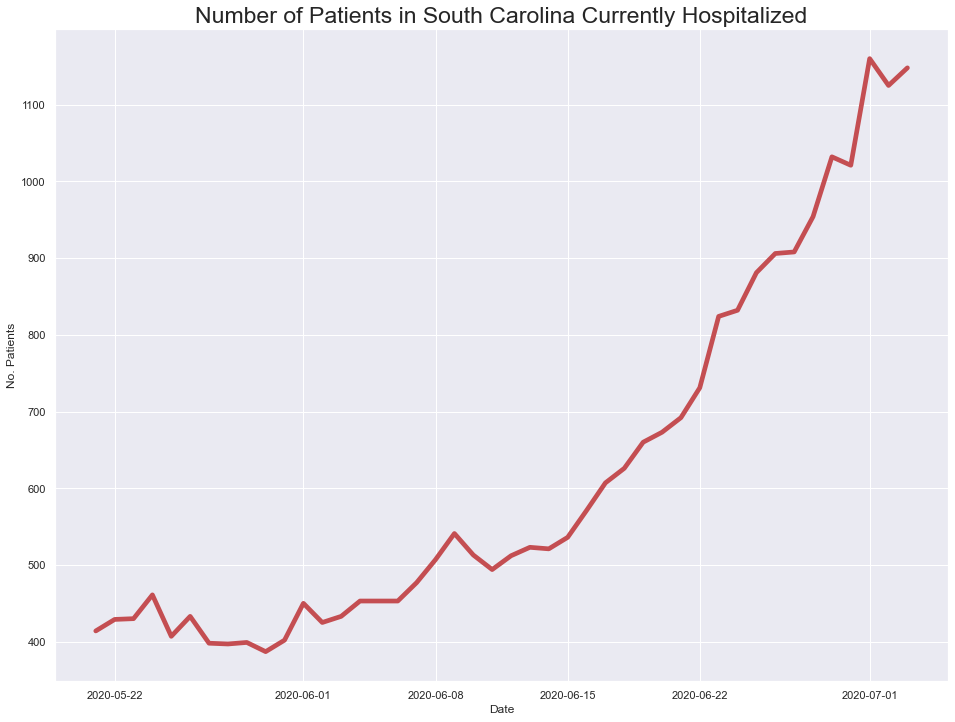

In [741]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sc.date, sc.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in South Carolina Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

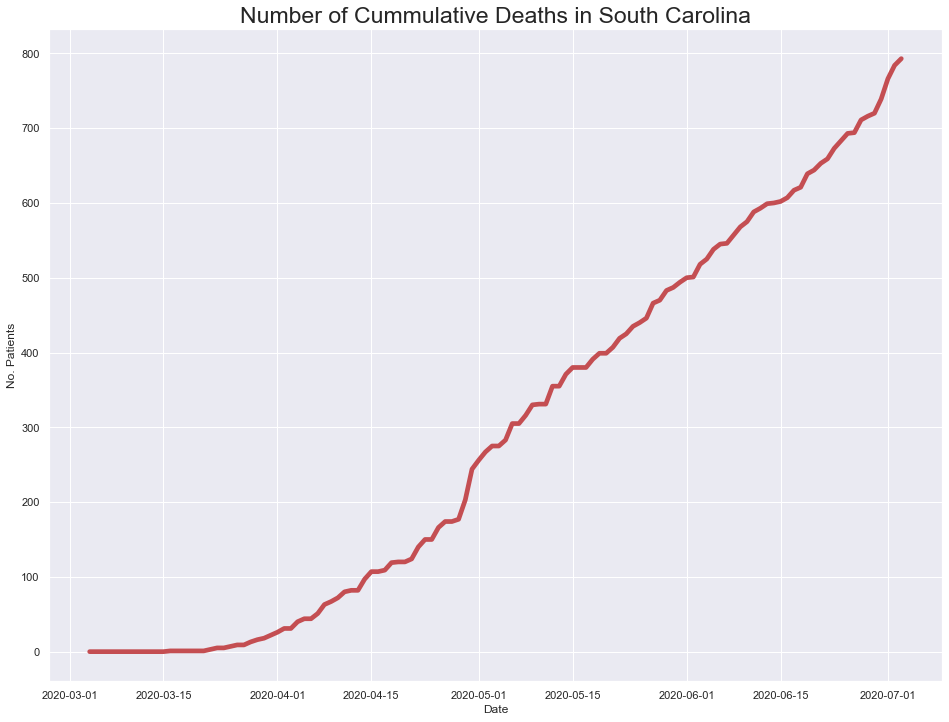

In [742]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sc.date, sc.death, linewidth=4.7, color='r')
plt.title('Number of Cummulative Deaths in South Carolina', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

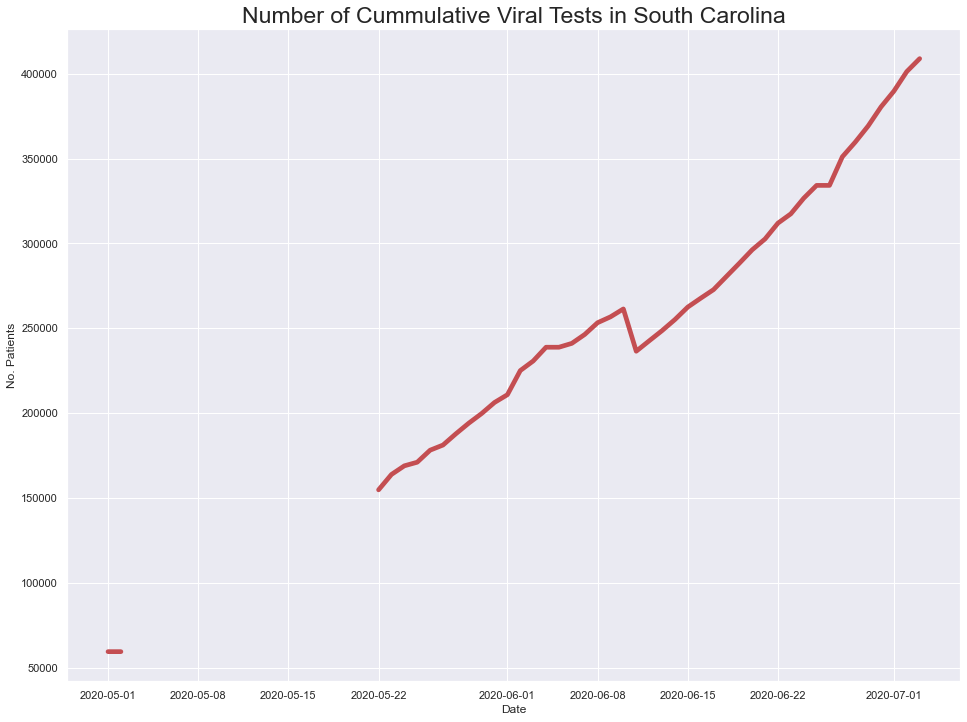

In [743]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sc.date, sc.totalTestsViral, linewidth=4.7, color='r')
plt.title('Number of Cummulative Viral Tests in South Carolina', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

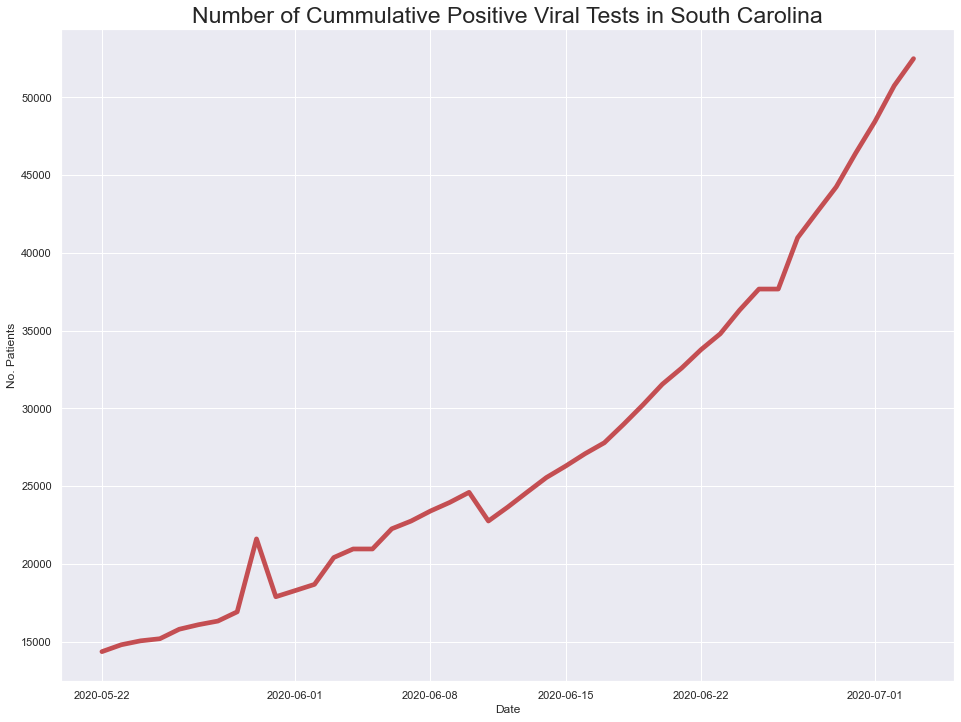

In [744]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sc.date, sc.positiveTestsViral, linewidth=4.7, color='r')
plt.title('Number of Cummulative Positive Viral Tests in South Carolina', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, '% Infection Rate')

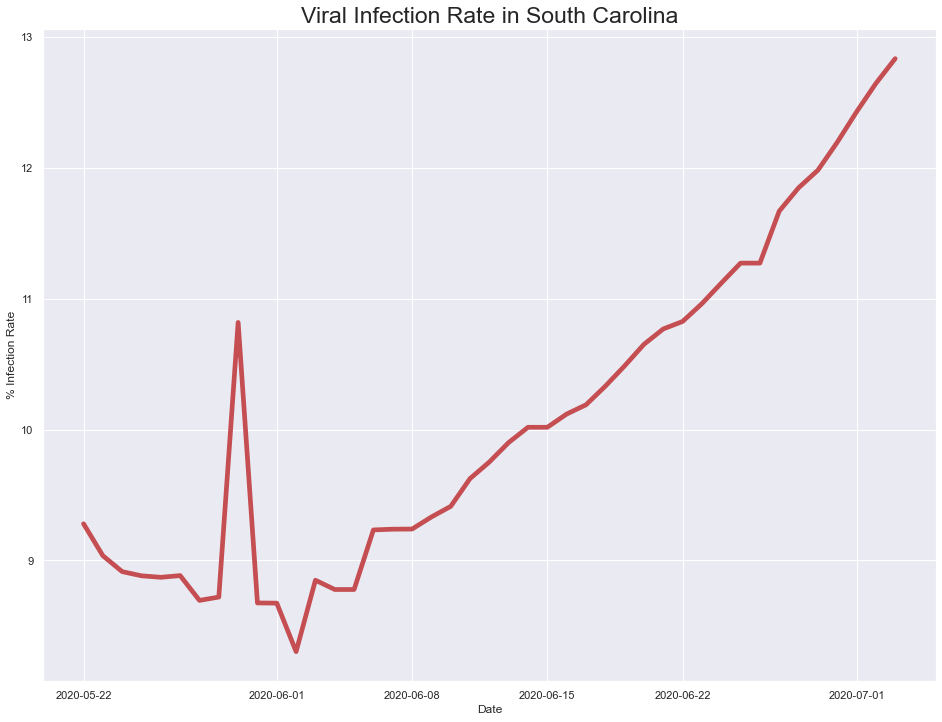

In [745]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sc.date, sc.positiveTestsViral/sc.totalTestsViral*100, linewidth=4.7, color='r')
plt.title('Viral Infection Rate in South Carolina', fontsize=23)
plt.xlabel('Date')
plt.ylabel('% Infection Rate')

In [746]:
#hide_input
# Checking which cols have NaN values
sc[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
sc.head()

# Omit the NaN cols
sc = sc[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

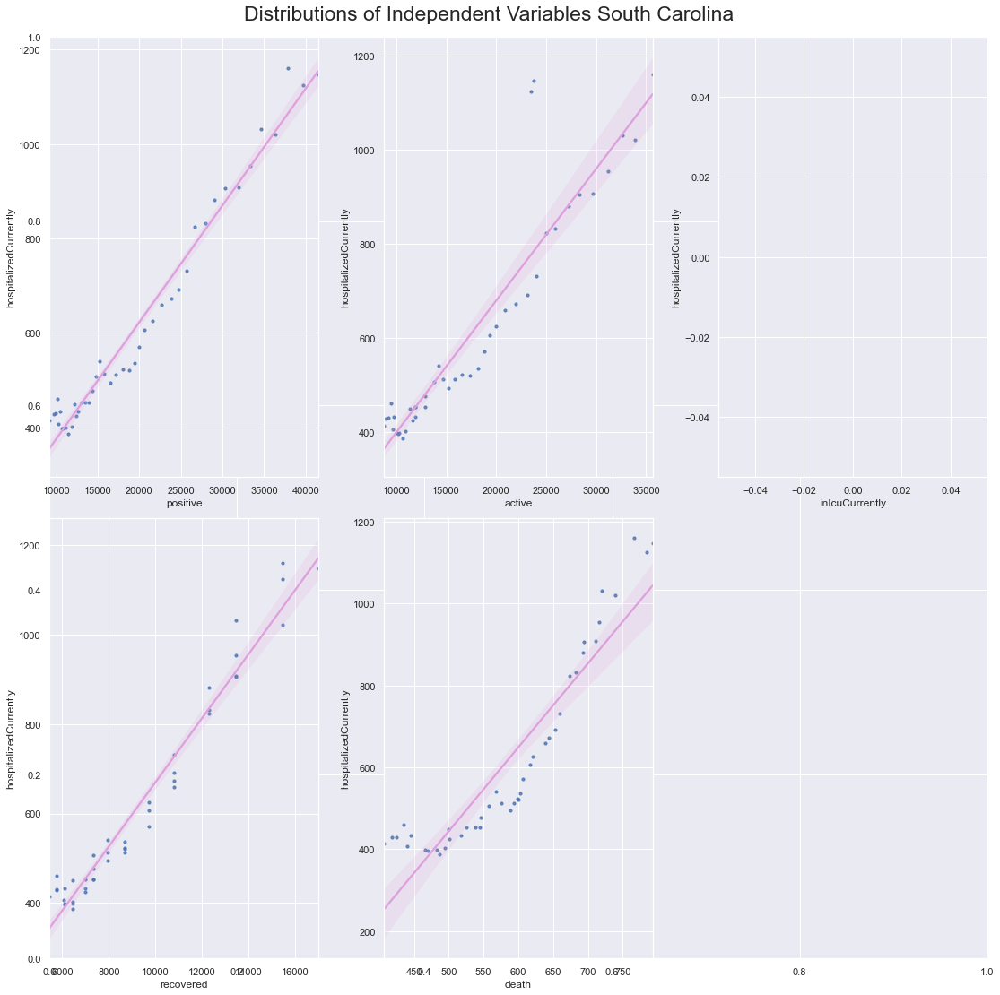

In [747]:
#hide_input
# Scatter plots SC
# Split dependent var from independent variables
target_sc = sc.hospitalizedCurrently
indep_var_sc = sc.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_sc.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_sc[col], y=target_sc, data=indep_var_sc, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables South Carolina', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [748]:
#hide_input
###endsouthcarolina

### South Dakota

In [749]:
#hide_input
sd = covid_df.loc[(covid_df['abbrev'] == 'SD') & (covid_df['state']== 'South Dakota')] 


Text(0, 0.5, 'No. Patients')

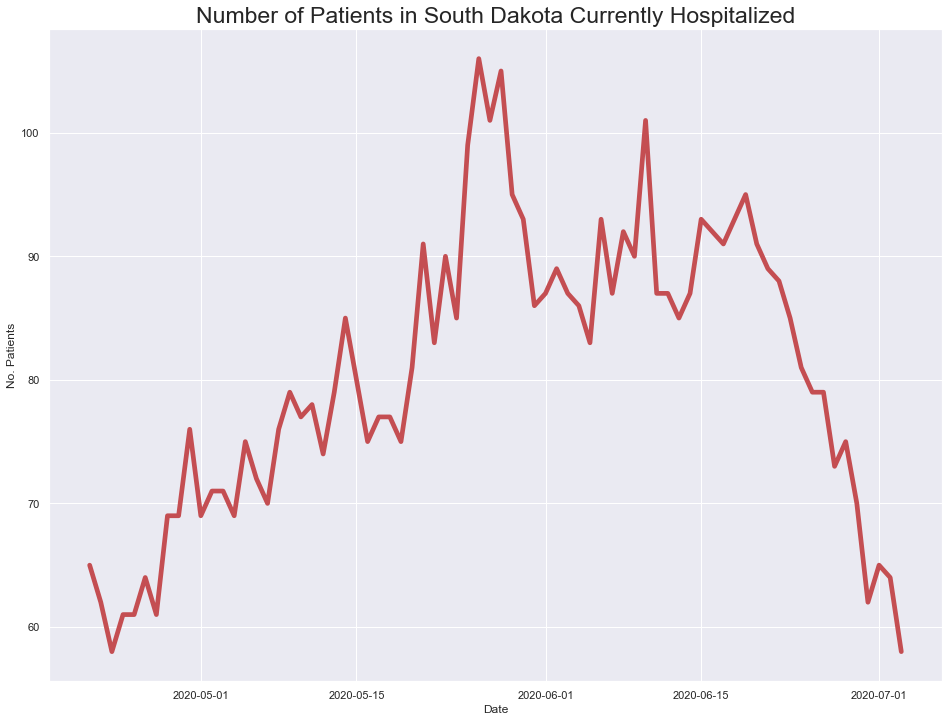

In [750]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sd.date, sd.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in South Dakota Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

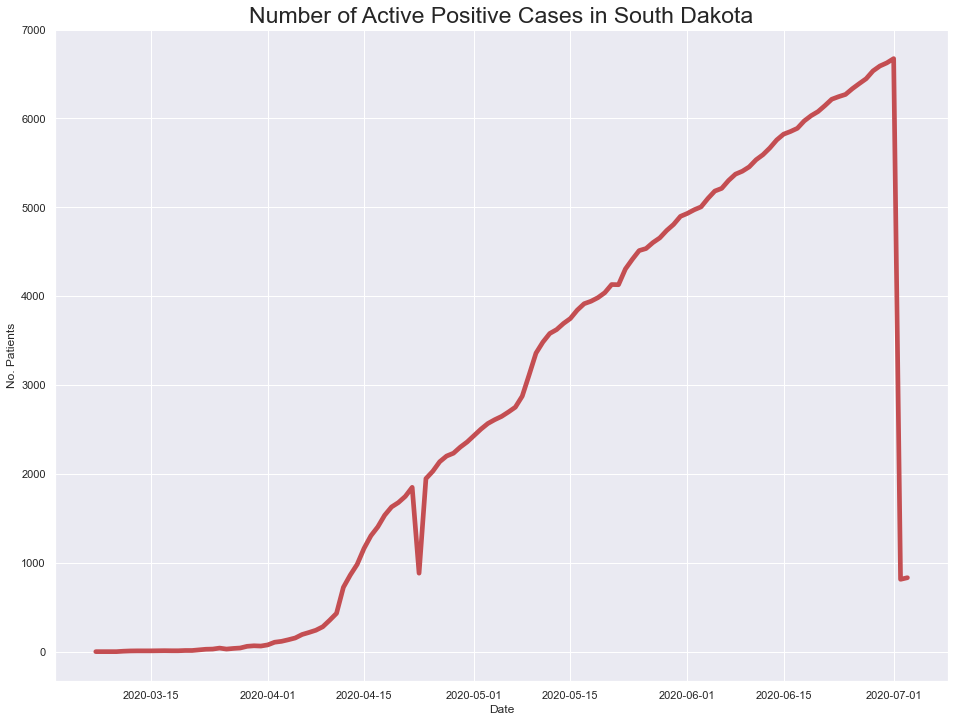

In [751]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sd.date, sd.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in South Dakota', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

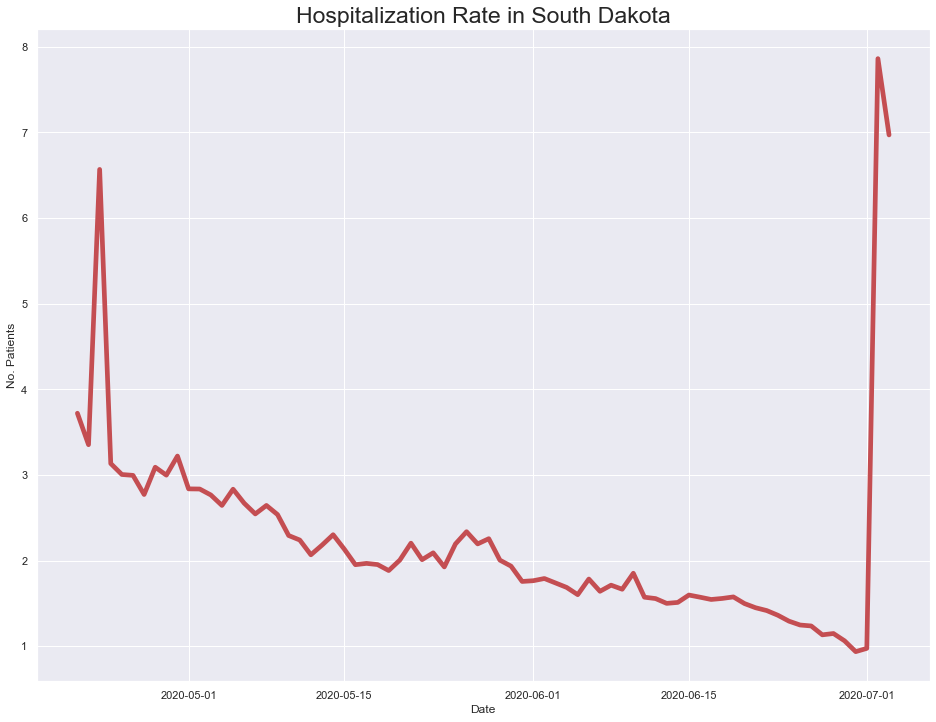

In [752]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sd.date, sd.hospitalizedCurrently/sd.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in South Dakota', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

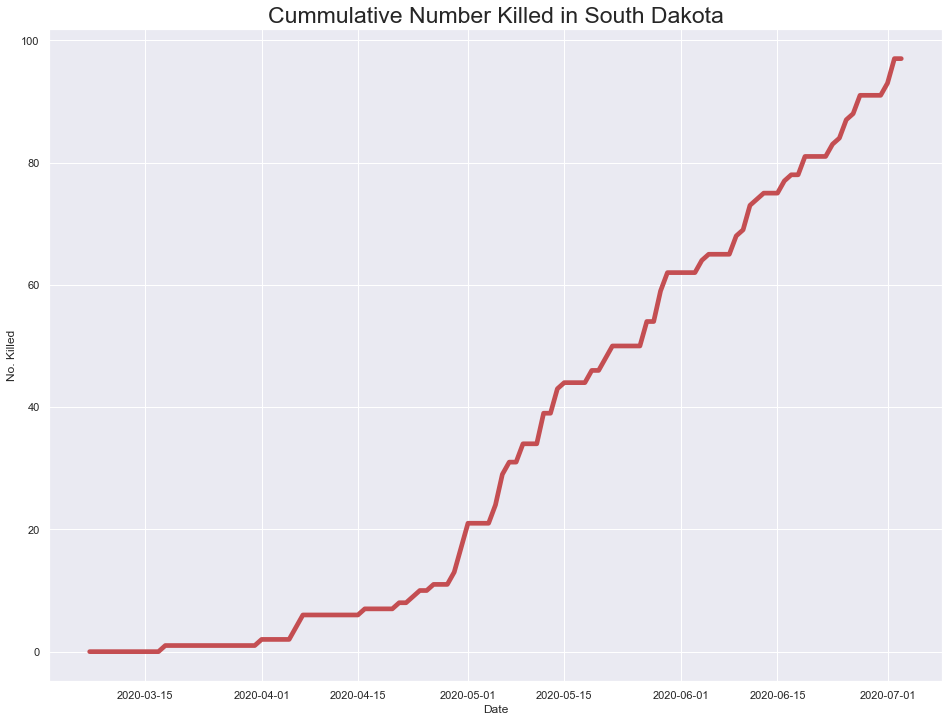

In [753]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(sd.date, sd.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in South Dakota', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [754]:
#hide_input
# Checking which cols have NaN values
sd[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
sd.head()

# Omit the NaN cols
sd = sd[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

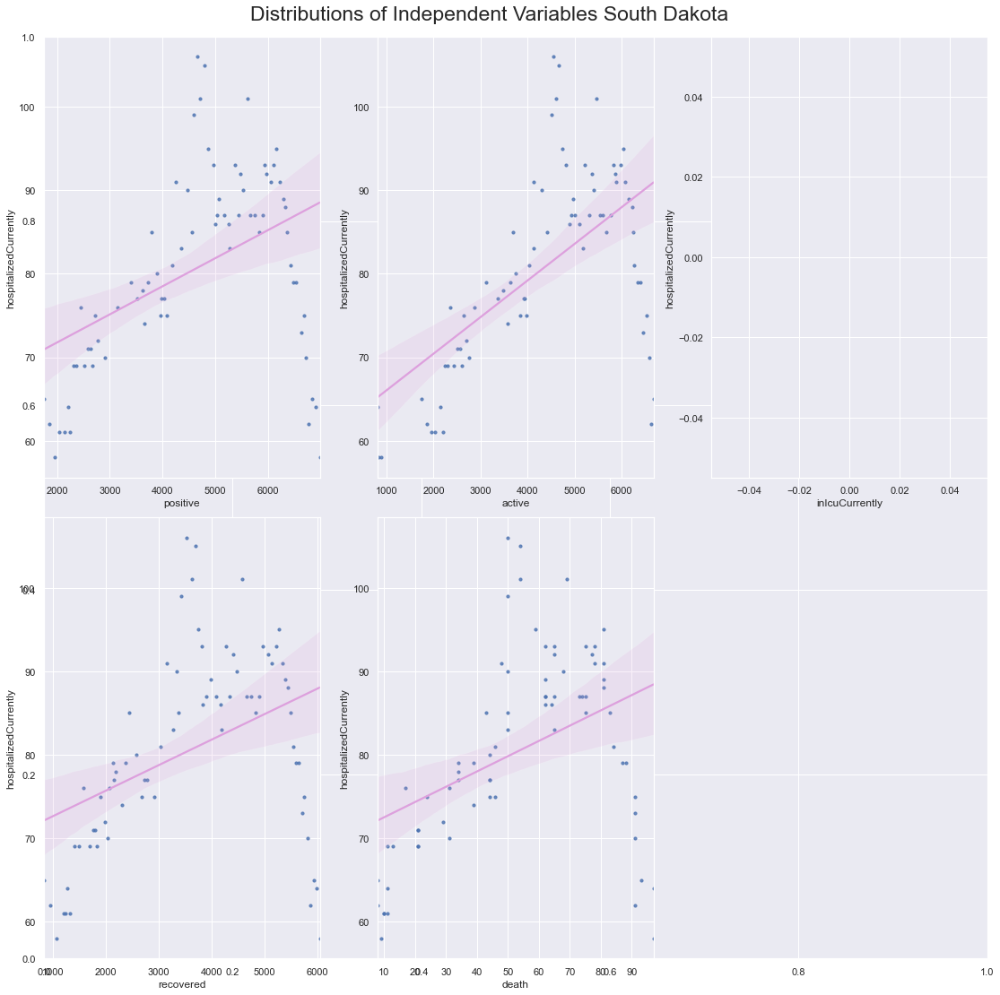

In [755]:
#hide_input
# Scatter plots SD
# Split dependent var from independent variables
target_sd = sd.hospitalizedCurrently
indep_var_sd = sd.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_sd.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_sd[col], y=target_sd, data=indep_var_sd, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables South Dakota', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [756]:
#hide_input
###endsouthdakota

### Tennessee

In [757]:
#hide_input
tn = covid_df.loc[(covid_df['abbrev'] == 'TN') & (covid_df['state']== 'Tennessee')] 


Text(0, 0.5, 'No. Patients')

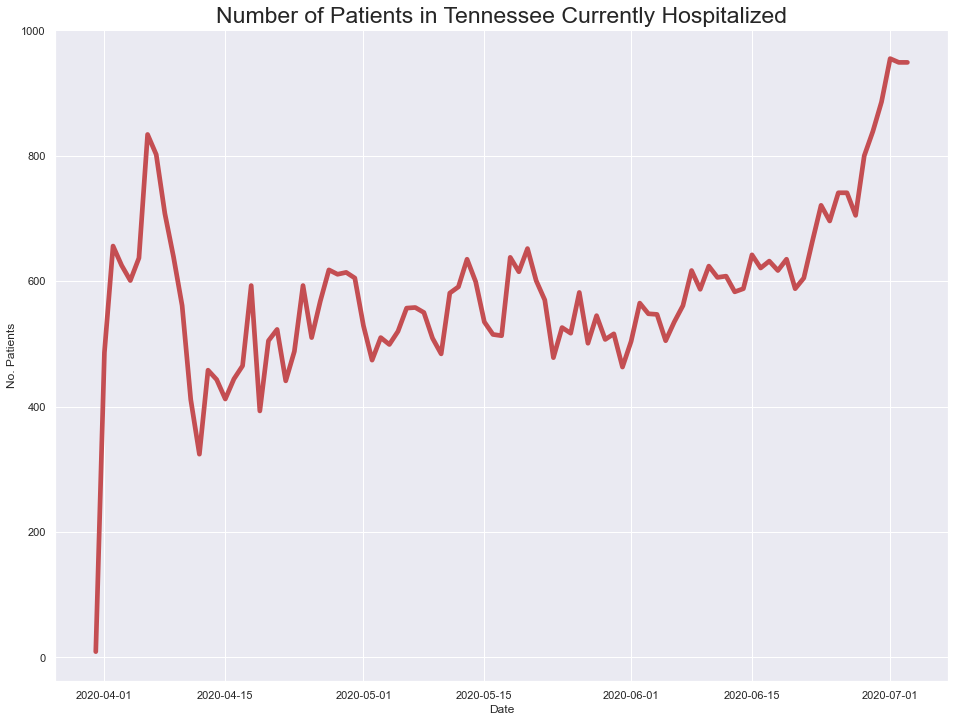

In [758]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(tn.date, tn.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Tennessee Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

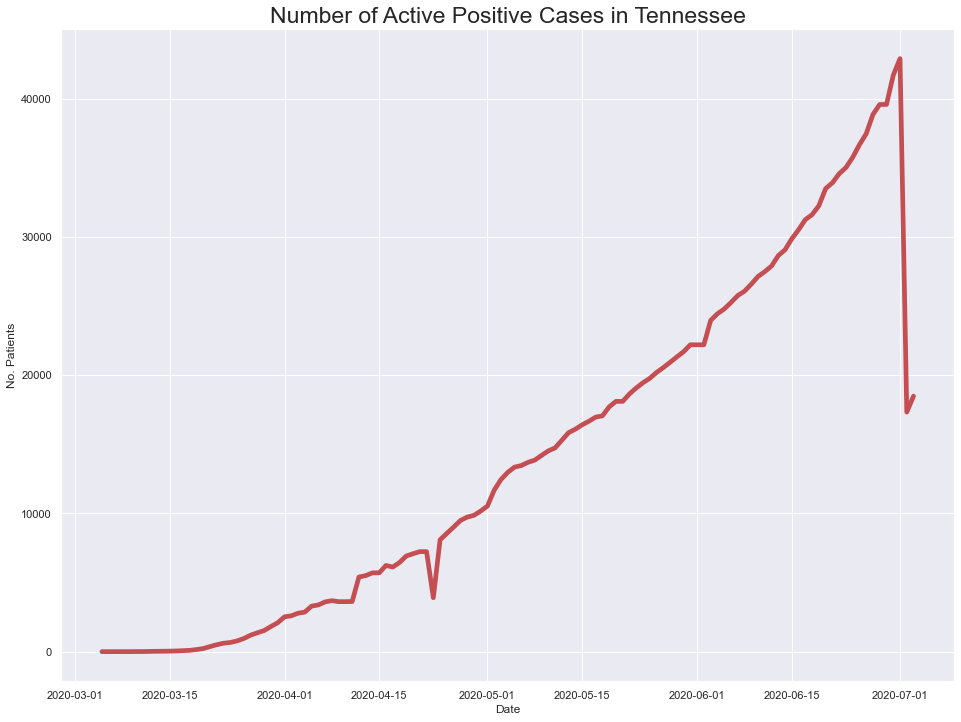

In [759]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(tn.date, tn.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Tennessee', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

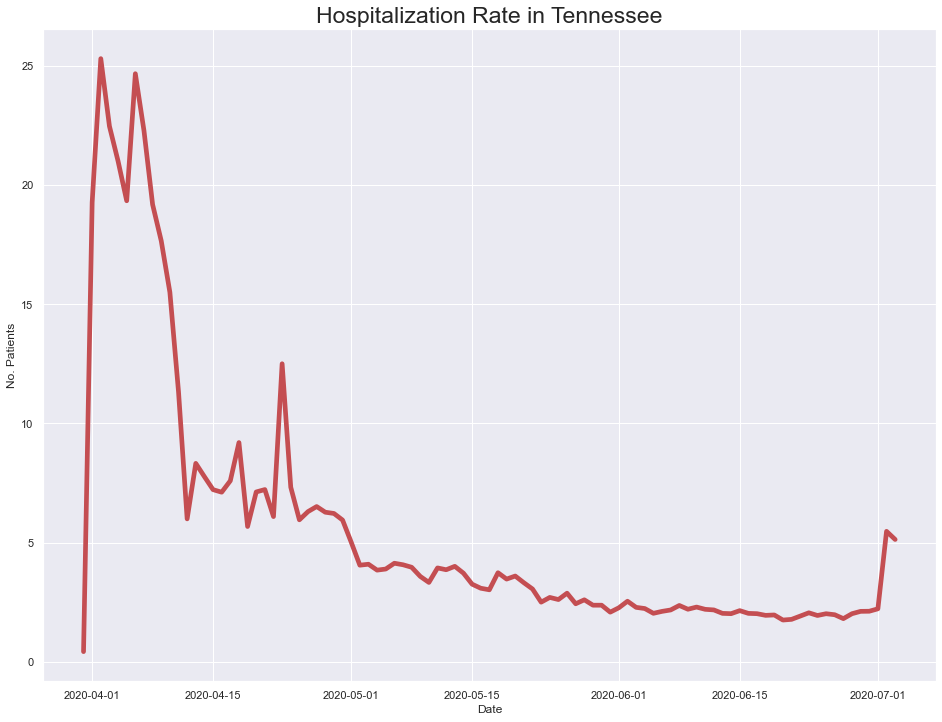

In [760]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(tn.date, tn.hospitalizedCurrently/tn.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Tennessee', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

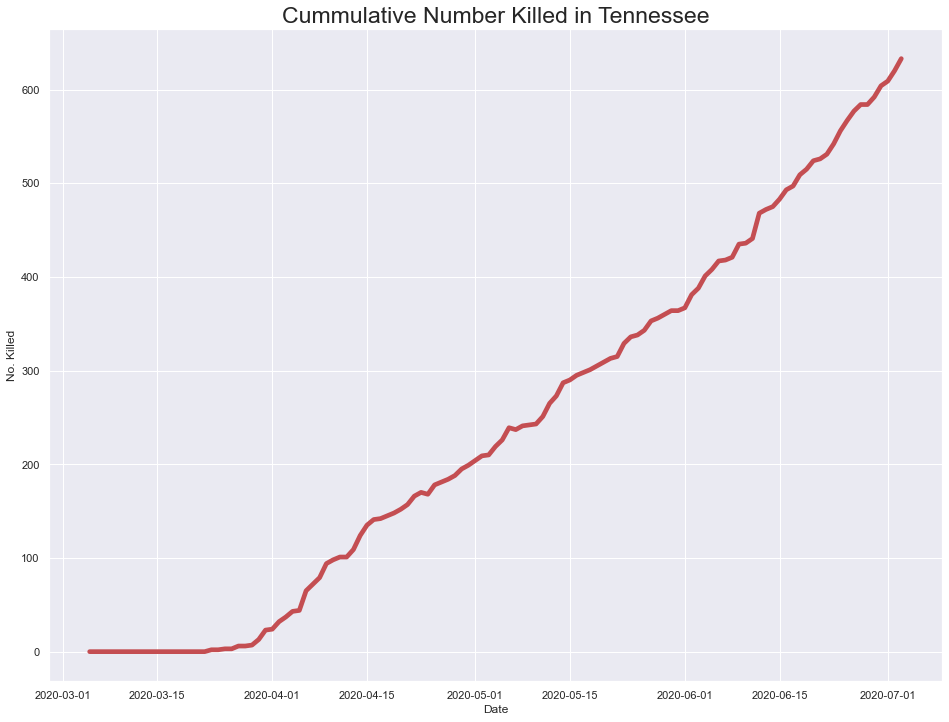

In [761]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(tn.date, tn.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Tennessee', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [762]:
#hide_input
# Checking which cols have NaN values
tn[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
tn.head()

# Omit the NaN cols
tn = tn[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

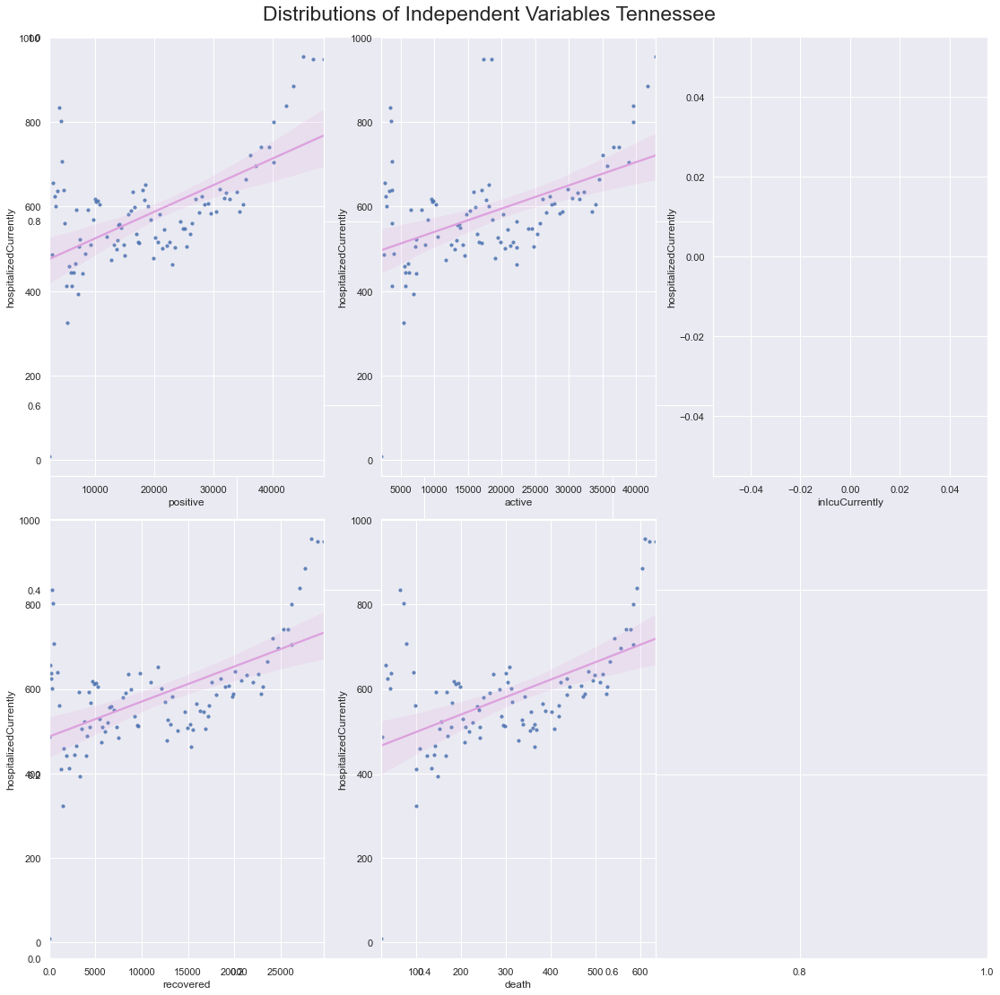

In [763]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_tn = tn.hospitalizedCurrently
indep_var_tn = tn.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_tn.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_tn[col], y=target_tn, data=indep_var_tn, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Tennessee', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [764]:
#hide_input
###endtennessee

### Texas

In [765]:
#hide_input
texas = covid_df.loc[(covid_df['abbrev'] == 'TX') & (covid_df['state']== 'Texas')] 


Text(0, 0.5, 'No. Patients')

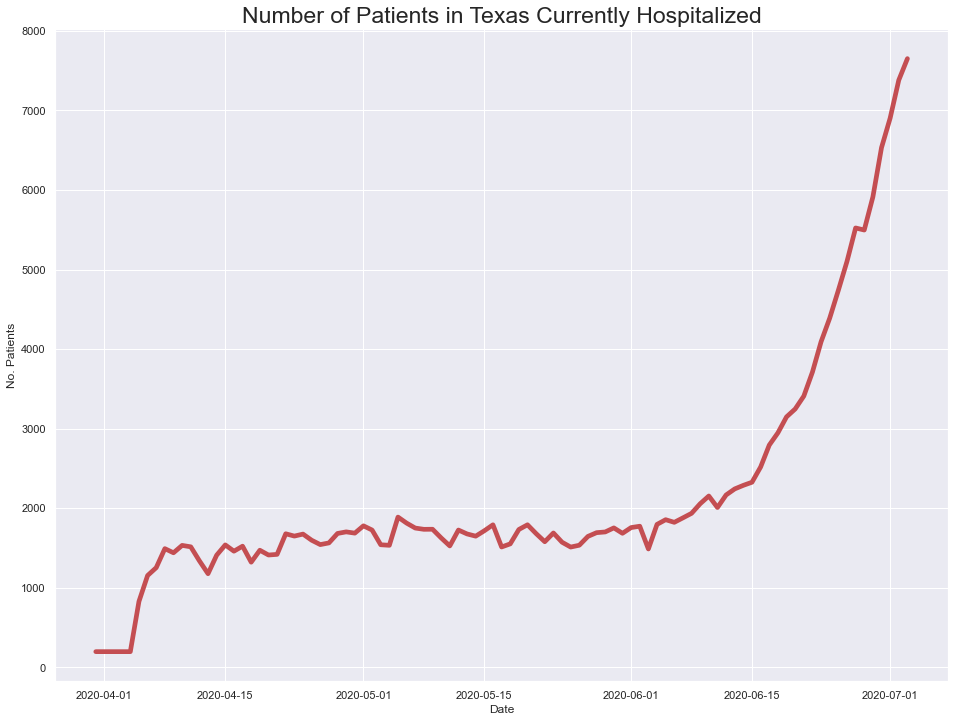

In [766]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(texas.date, texas.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Texas Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

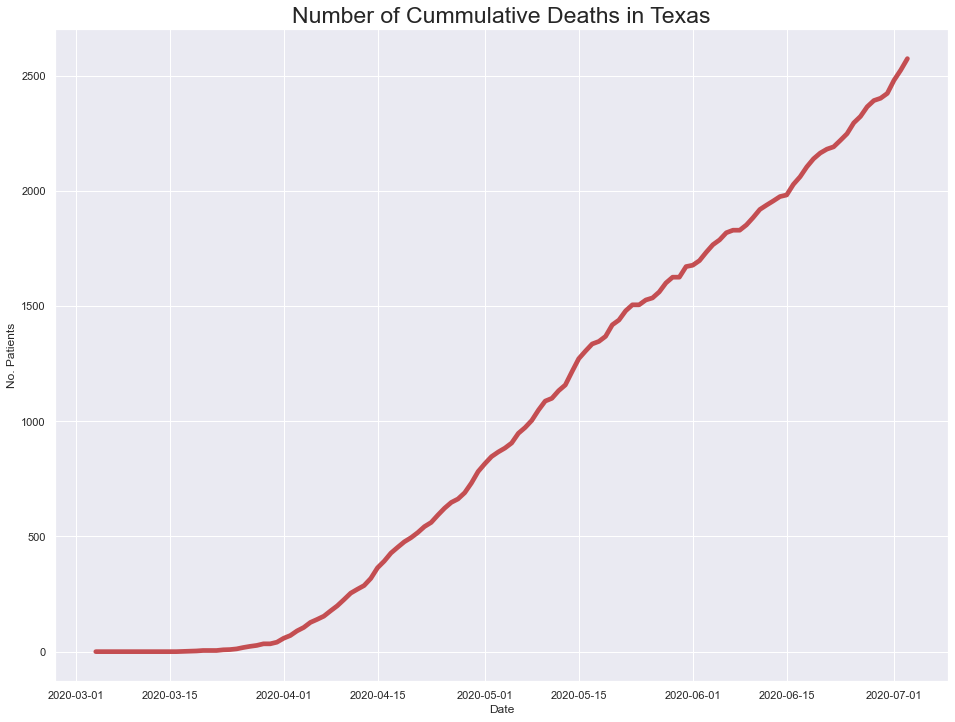

In [767]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(texas.date, texas.death, linewidth=4.7, color='r')
plt.title('Number of Cummulative Deaths in Texas', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

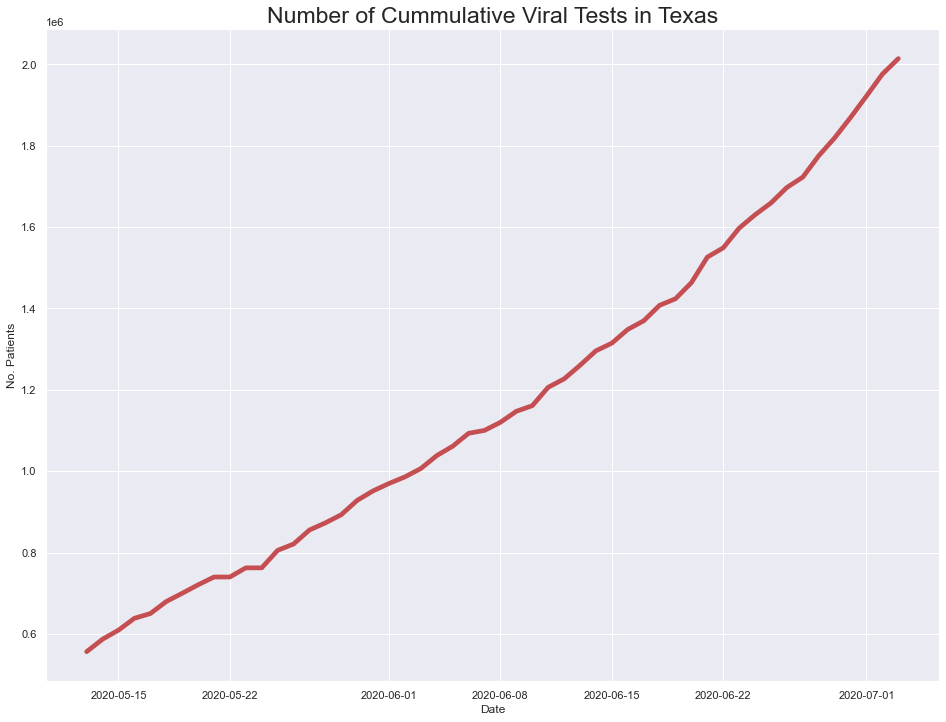

In [768]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(texas.date, texas.totalTestsViral, linewidth=4.7, color='r')
plt.title('Number of Cummulative Viral Tests in Texas', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [769]:
#hide_input
# Checking which cols have NaN values
texas[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
texas.head()

# Omit the NaN cols
texas = texas[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

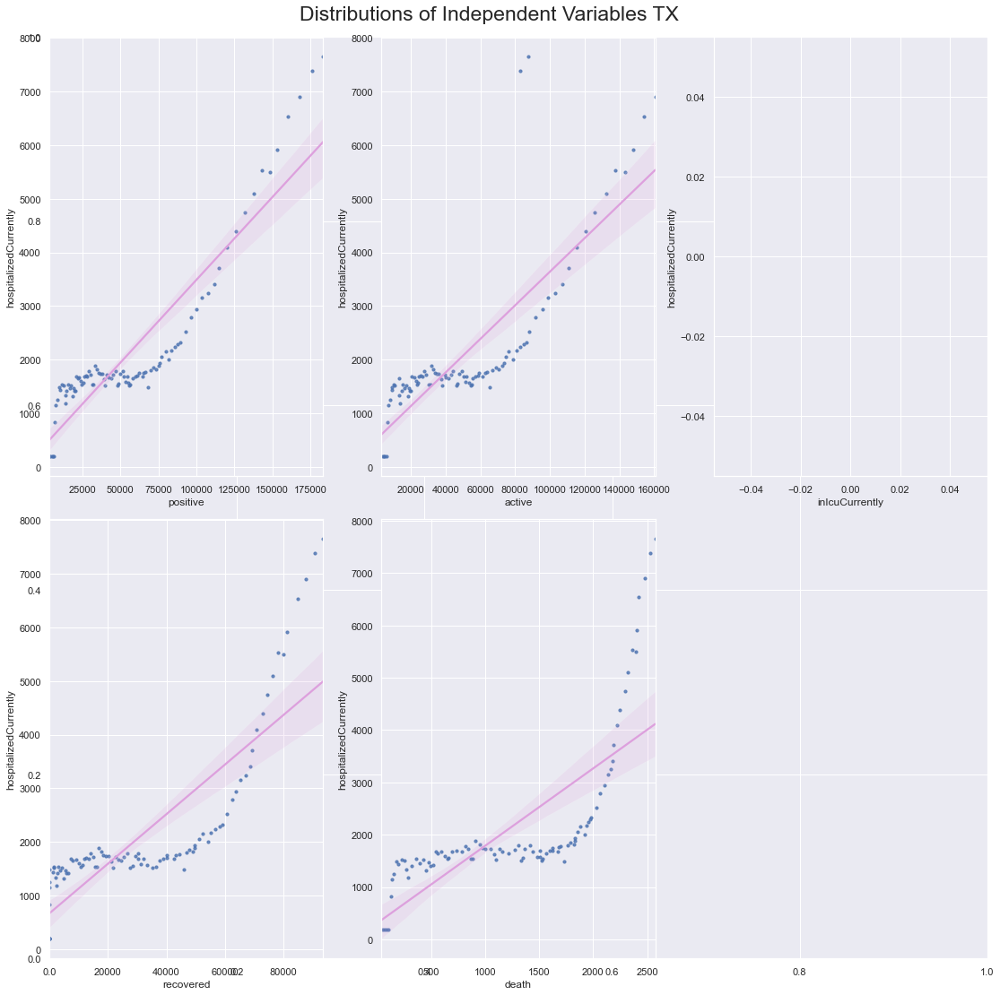

In [770]:
#hide_input
# Scatter plots TX
# Split dependent var from independent variables
target_tx = texas.hospitalizedCurrently
indep_var_tx = texas.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_tx.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_tx[col], y=target_tx, data=indep_var_tx, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables TX', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [771]:
#hide_input
###endtx

### Utah

In [772]:
#hide_input
utah = covid_df.loc[(covid_df['abbrev'] == 'UT') & (covid_df['state']== 'Utah')] 


Text(0, 0.5, 'No. Patients')

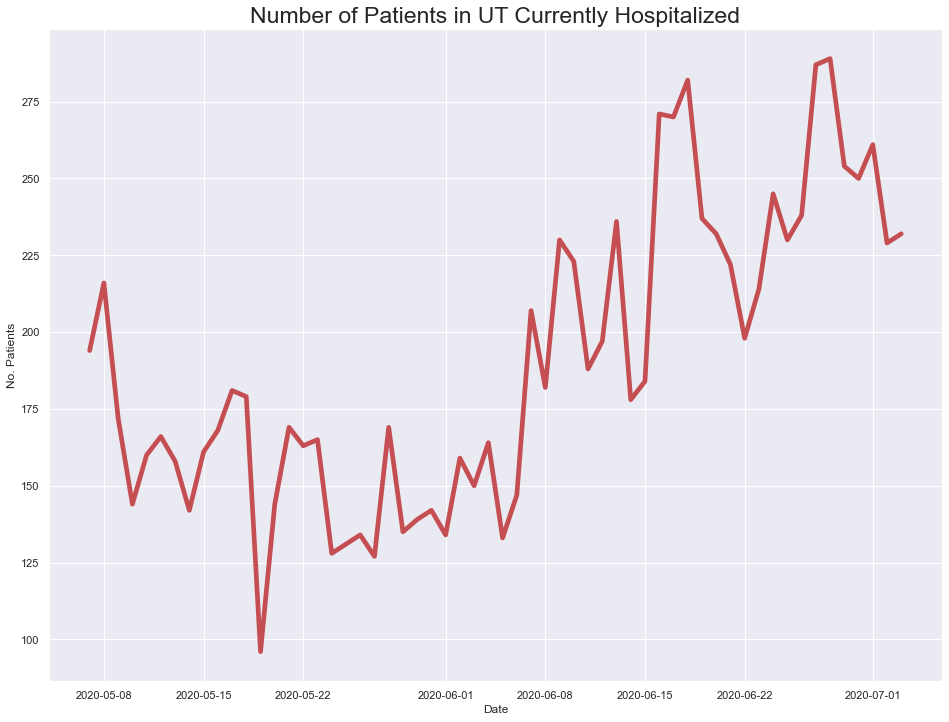

In [773]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(utah.date, utah.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in UT Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

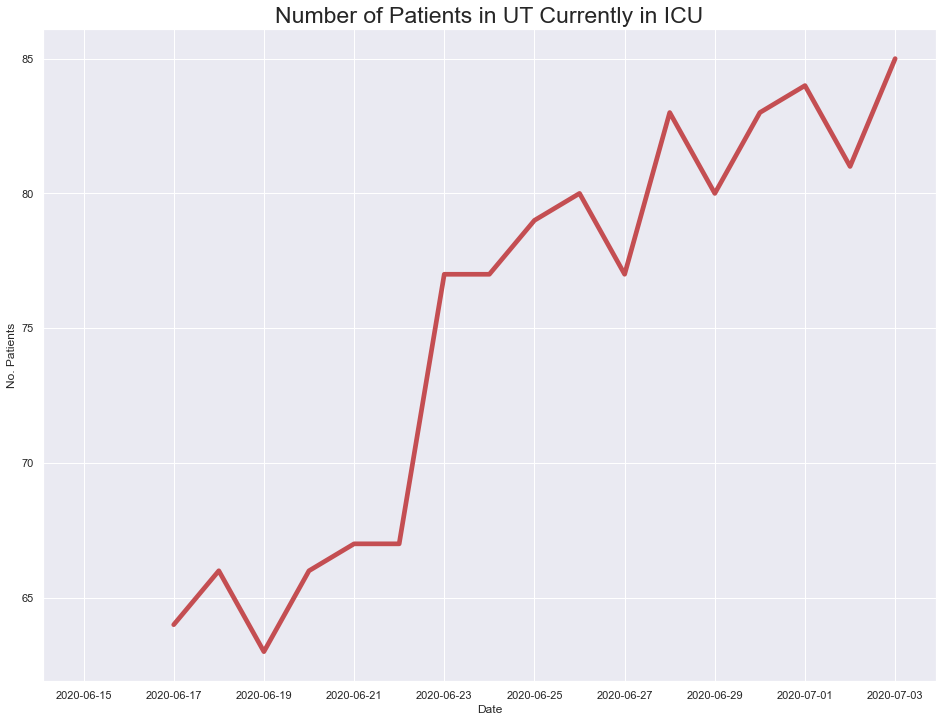

In [774]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(utah.date, utah.inIcuCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in UT Currently in ICU', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

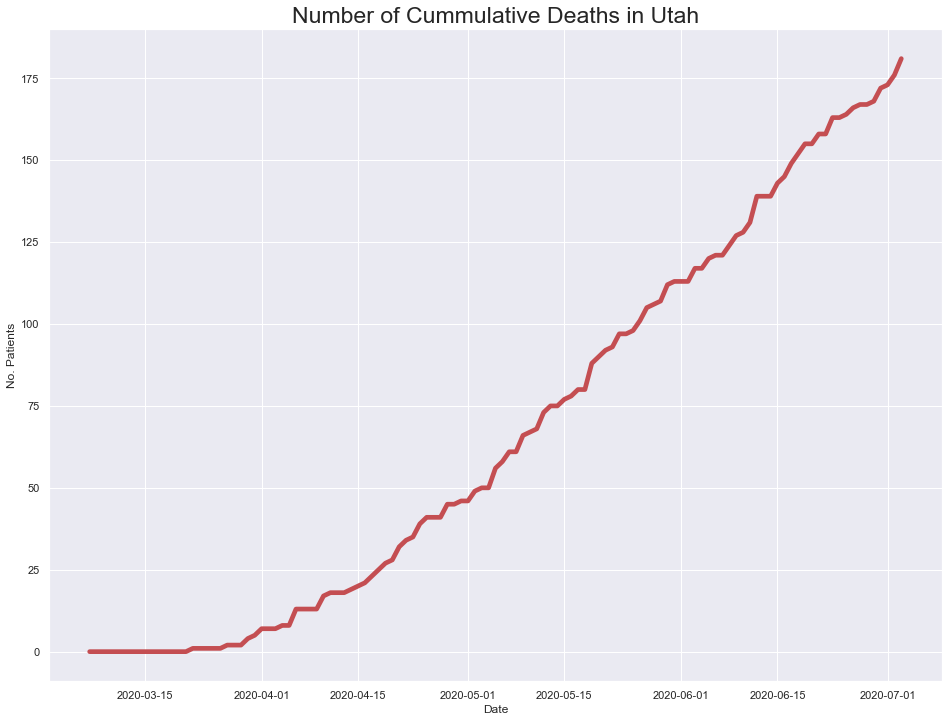

In [775]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(utah.date, utah.death, linewidth=4.7, color='r')
plt.title('Number of Cummulative Deaths in Utah', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

In [776]:
#hide_input
# Checking which cols have NaN values
utah[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
utah.head()

# Omit the NaN cols
utah = utah[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

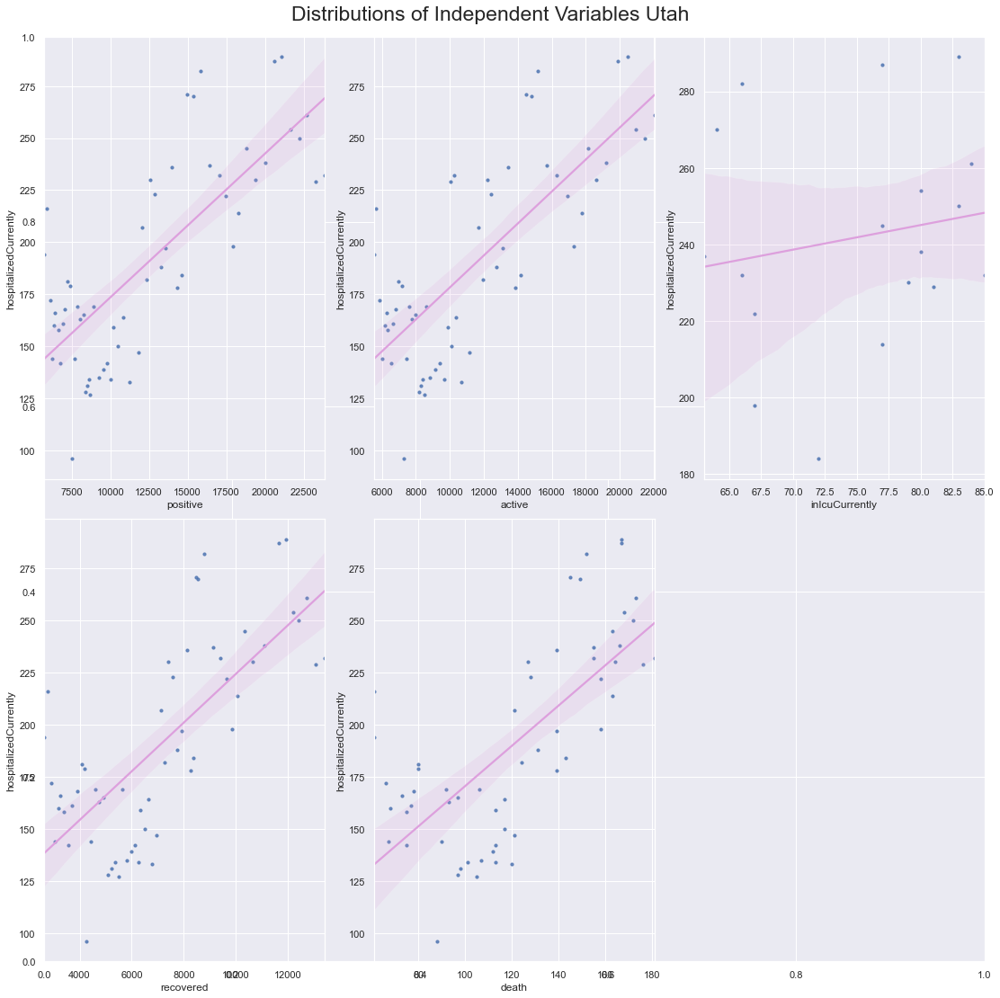

In [777]:
#hide_input
# Scatter plots UT
# Split dependent var from independent variables
target_ut = utah.hospitalizedCurrently
indep_var_ut = utah.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_tx.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_ut[col], y=target_ut, data=indep_var_ut, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Utah', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [778]:
#hide_input
###endutah

### Vermont

In [779]:
#hide_input
vt = covid_df.loc[(covid_df['abbrev'] == 'VT') & (covid_df['state']== 'Vermont')] 


Text(0, 0.5, 'No. Patients')

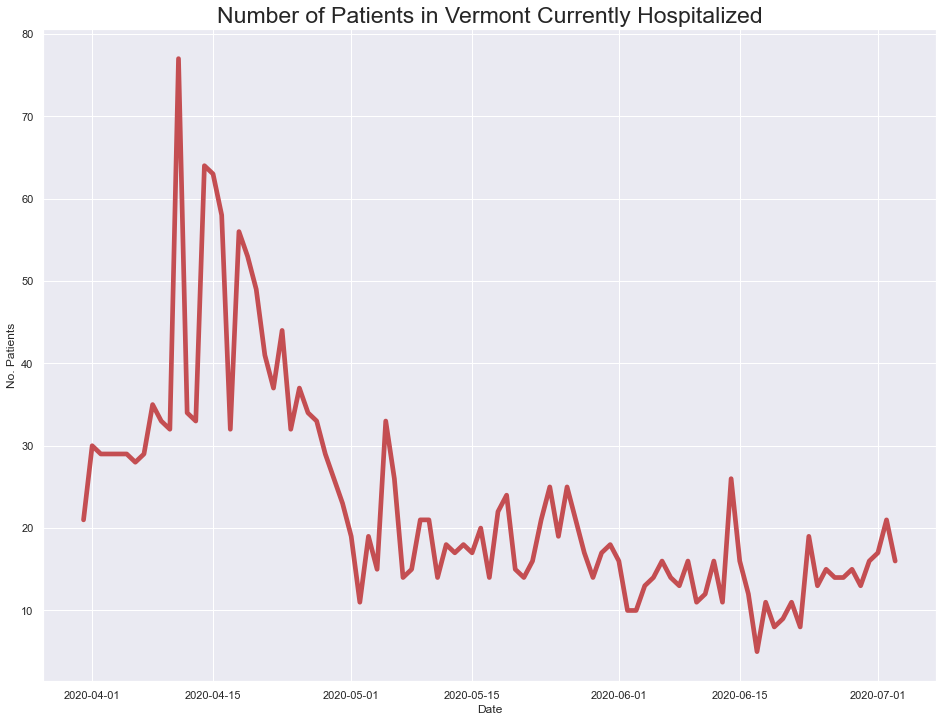

In [780]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(vt.date, vt.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Vermont Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

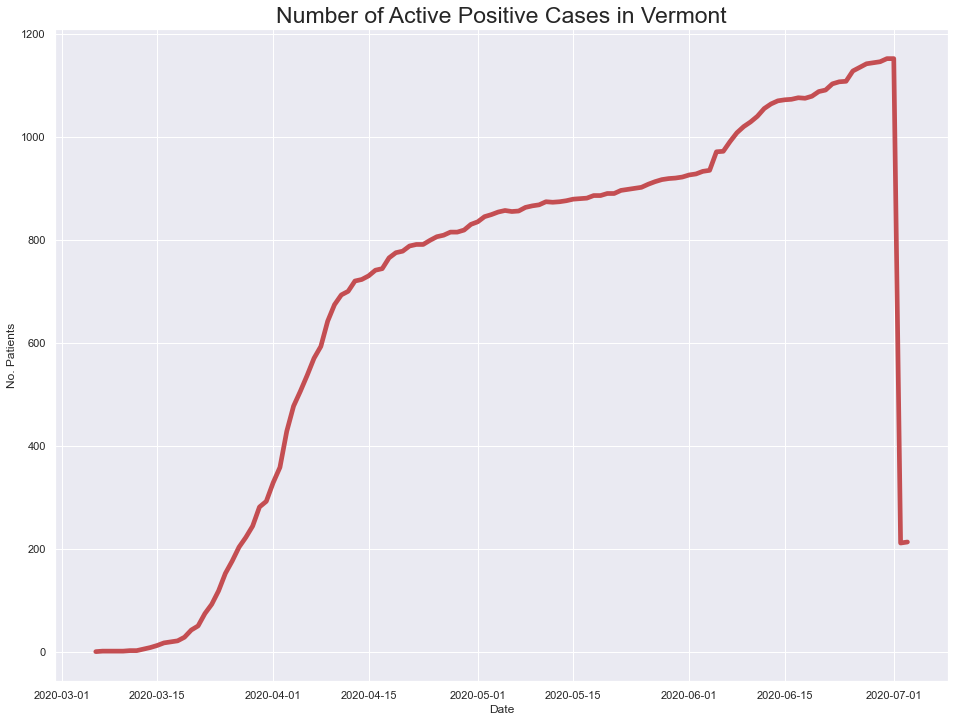

In [781]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(vt.date, vt.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Vermont', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

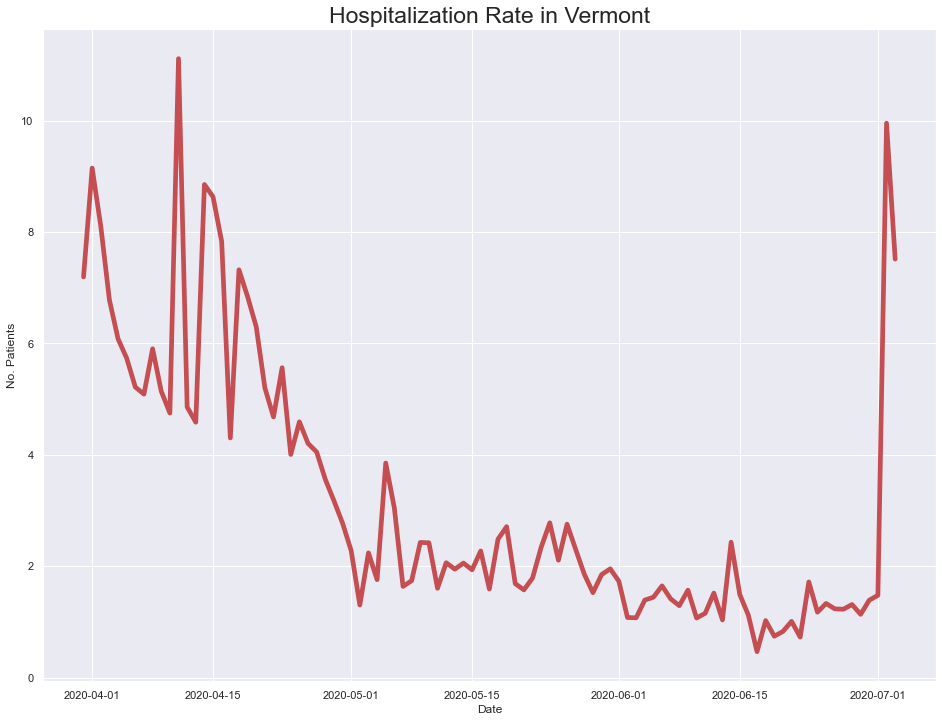

In [782]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(vt.date, vt.hospitalizedCurrently/vt.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Vermont', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

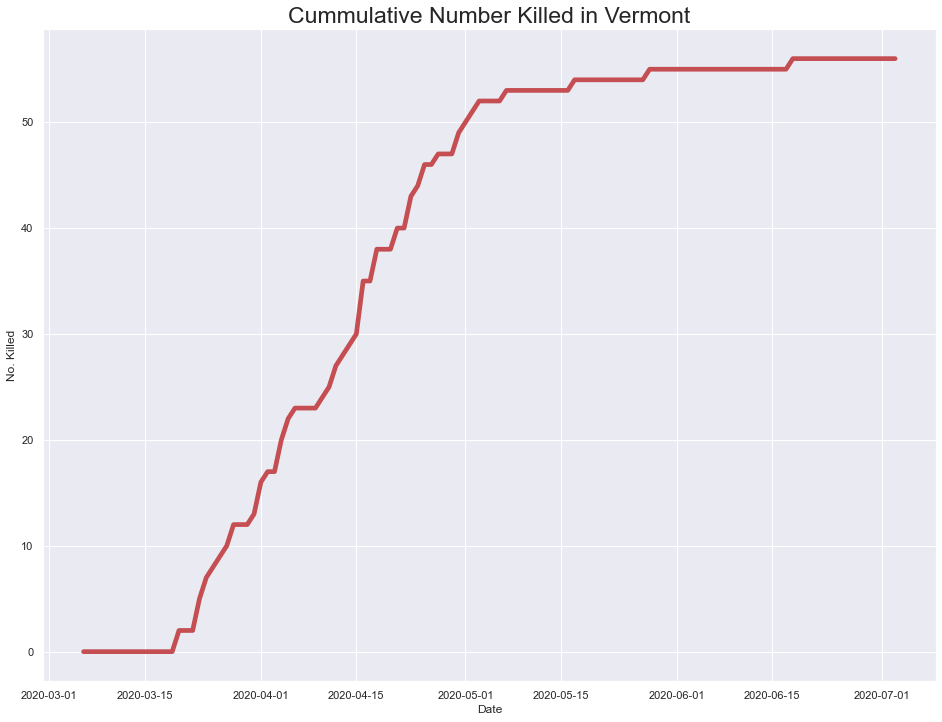

In [783]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(vt.date, vt.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Vermont', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [784]:
#hide_input
# Checking which cols have NaN values
vt[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
vt.head()

# Omit the NaN cols
vt = vt[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

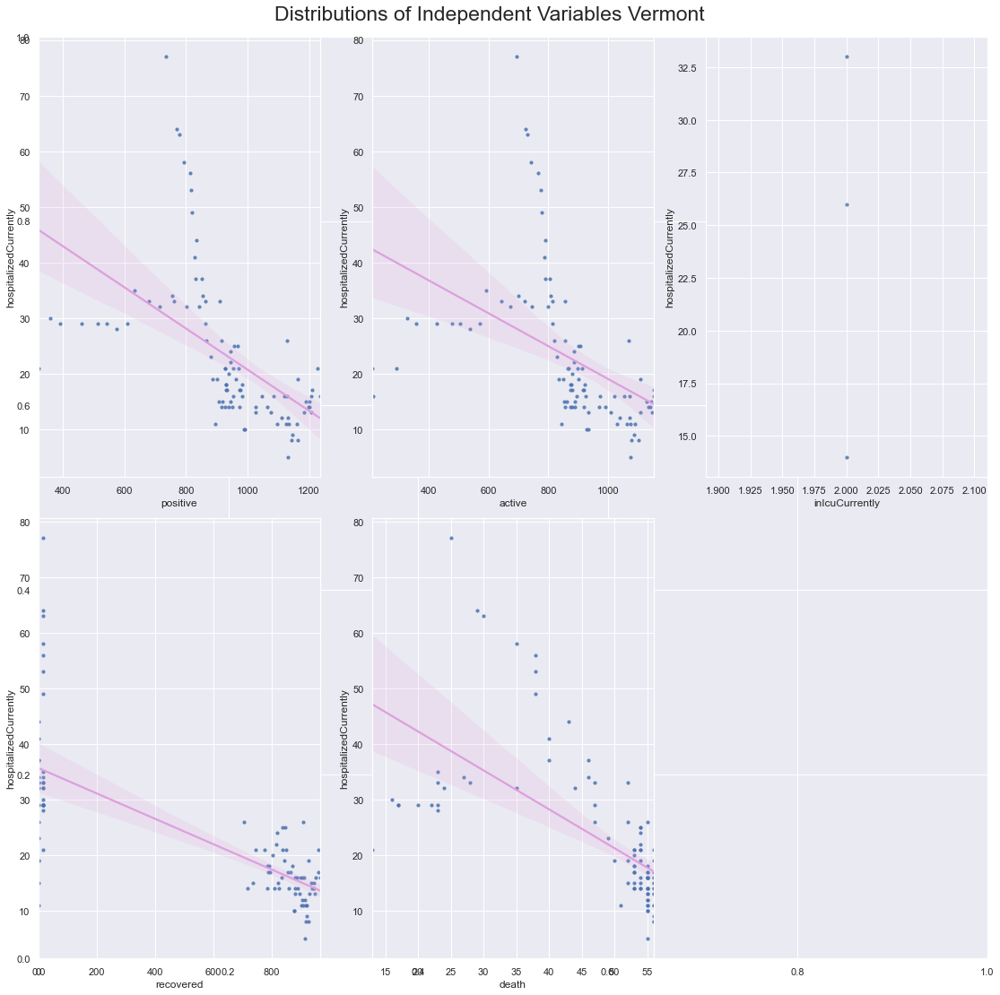

In [785]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_vt = vt.hospitalizedCurrently
indep_var_vt = vt.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_vt.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_vt[col], y=target_vt, data=indep_var_vt, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Vermont', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [786]:
#hide_input
###endalabama

### Virginia

In [787]:
#hide_input
va = covid_df.loc[(covid_df['abbrev'] == 'VA') & (covid_df['state']== 'Virginia')] 


Text(0, 0.5, 'No. Patients')

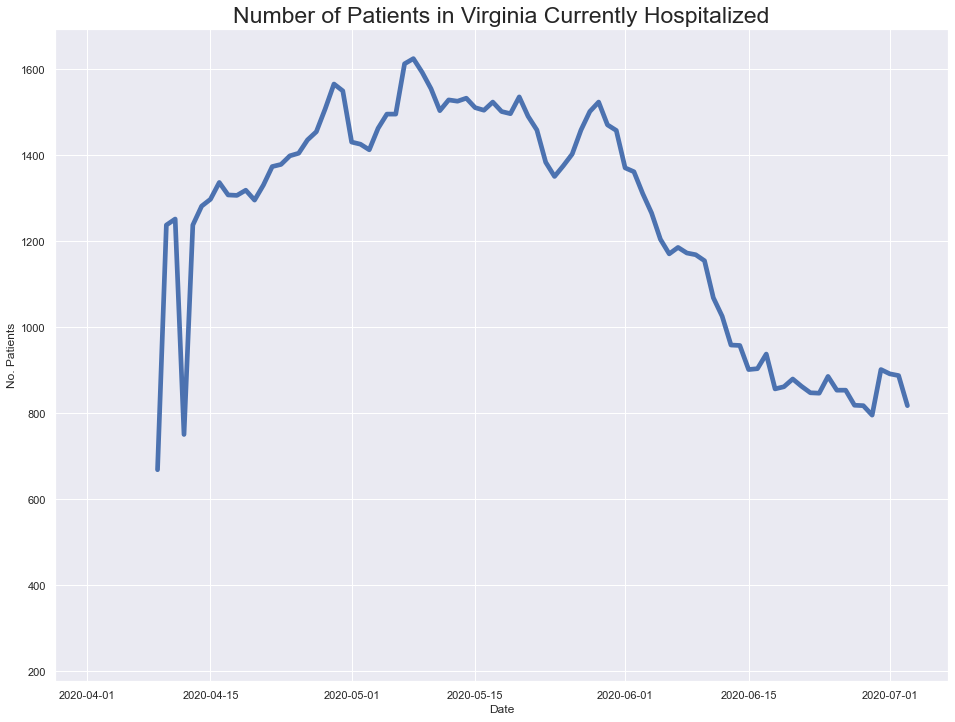

In [788]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(va.date, va.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Virginia Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

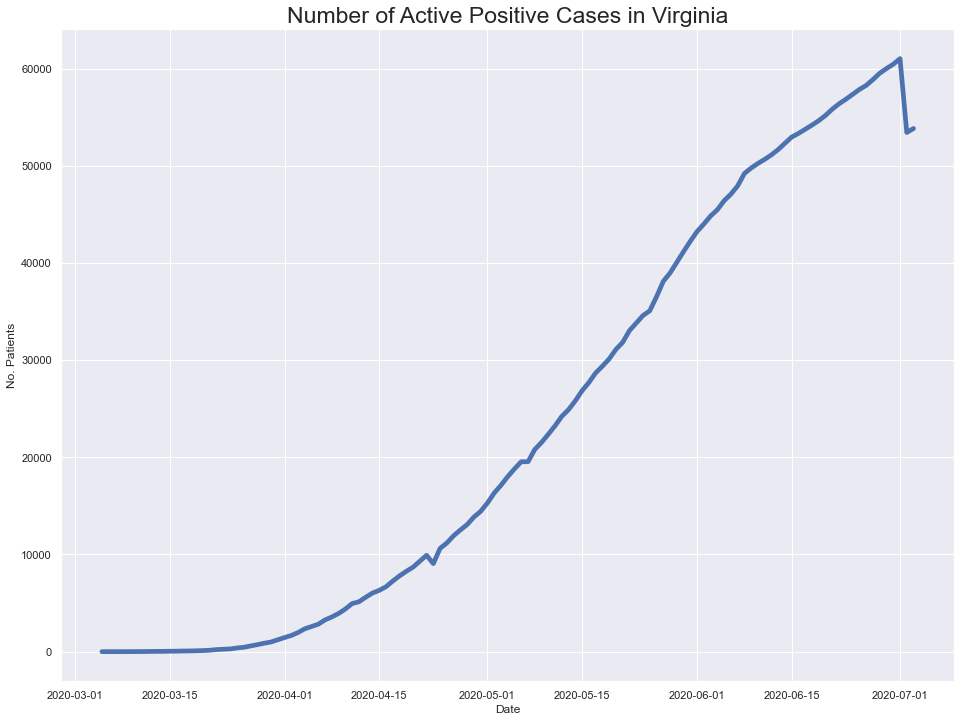

In [789]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(va.date, va.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Virginia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

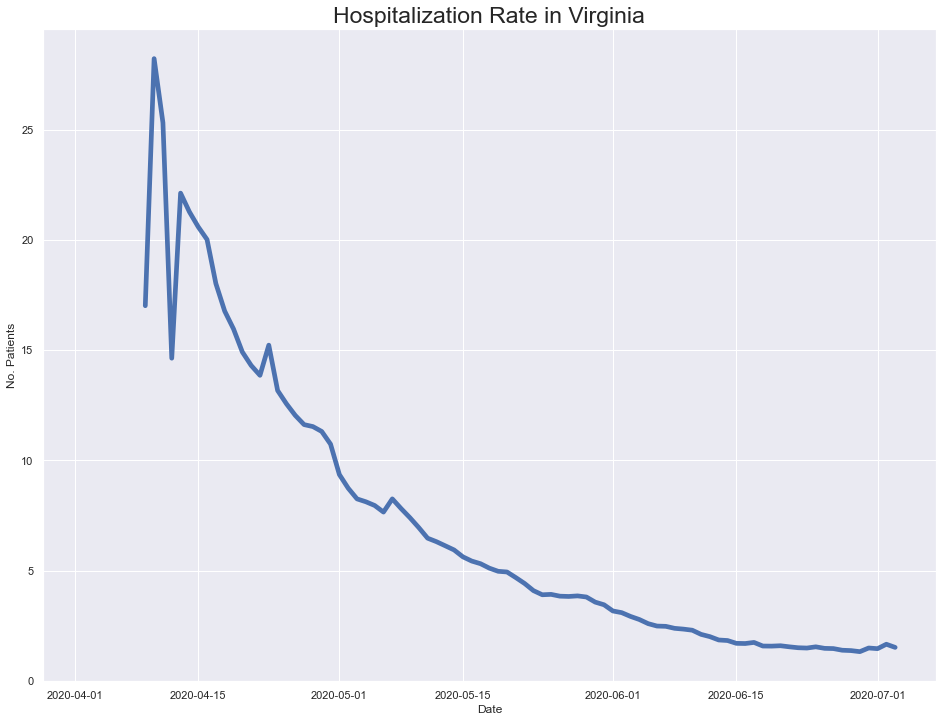

In [790]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(va.date, va.hospitalizedCurrently/va.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Virginia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

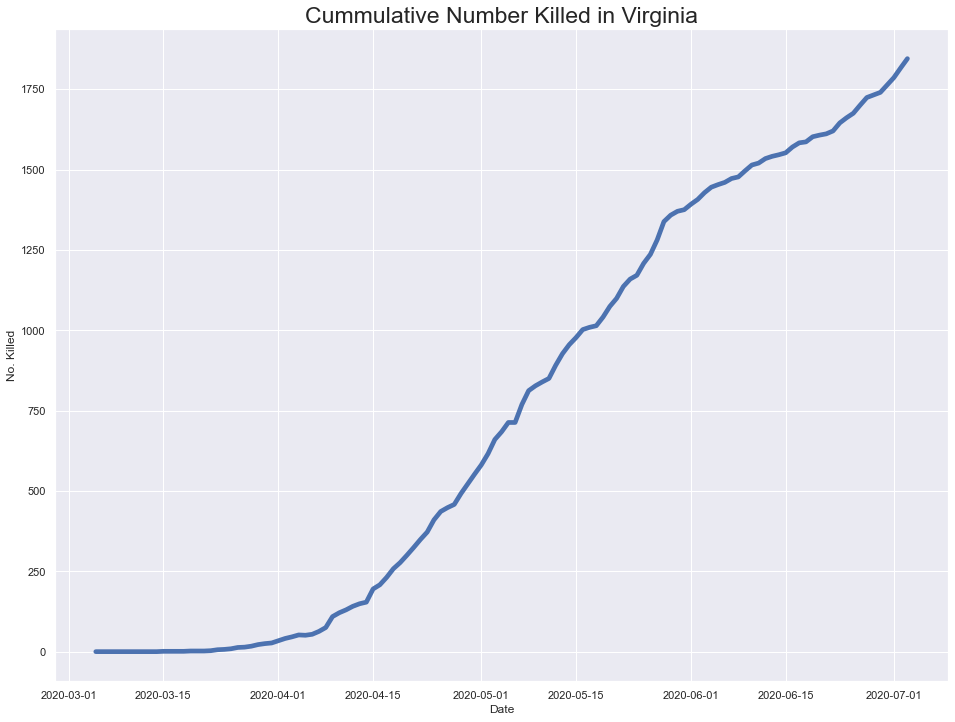

In [791]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(va.date, va.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Virginia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [792]:
#hide_input
# Checking which cols have NaN values
va[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
va.head()

# Omit the NaN cols
va = va[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

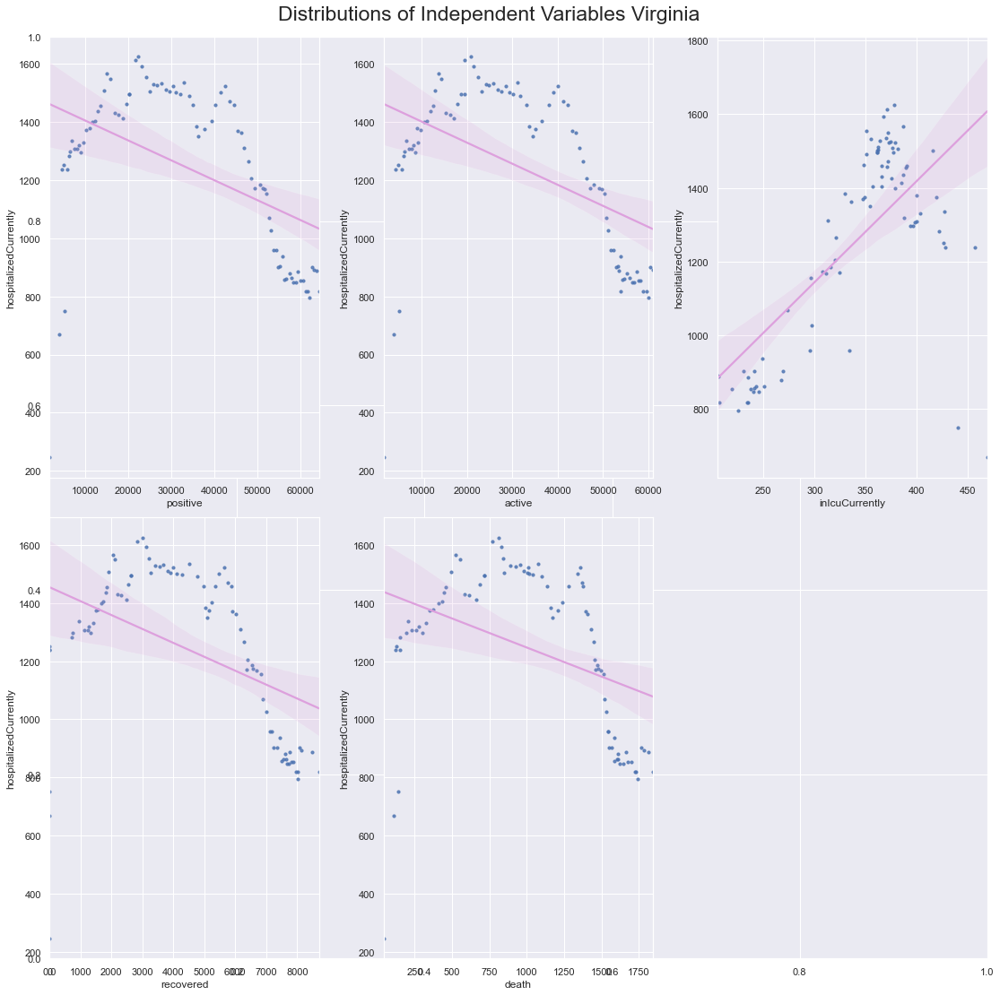

In [793]:
#hide_input
# Scatter plots VA
# Split dependent var from independent variables
target_va = va.hospitalizedCurrently
indep_var_va = va.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_va.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_va[col], y=target_va, data=indep_var_va, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Virginia', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [794]:
#hide_input
###endvirginia

### Washington

In [795]:
#hide_input
wa = covid_df.loc[(covid_df['abbrev'] == 'WA') & (covid_df['state']== 'Washington')] 


Text(0, 0.5, 'No. Patients')

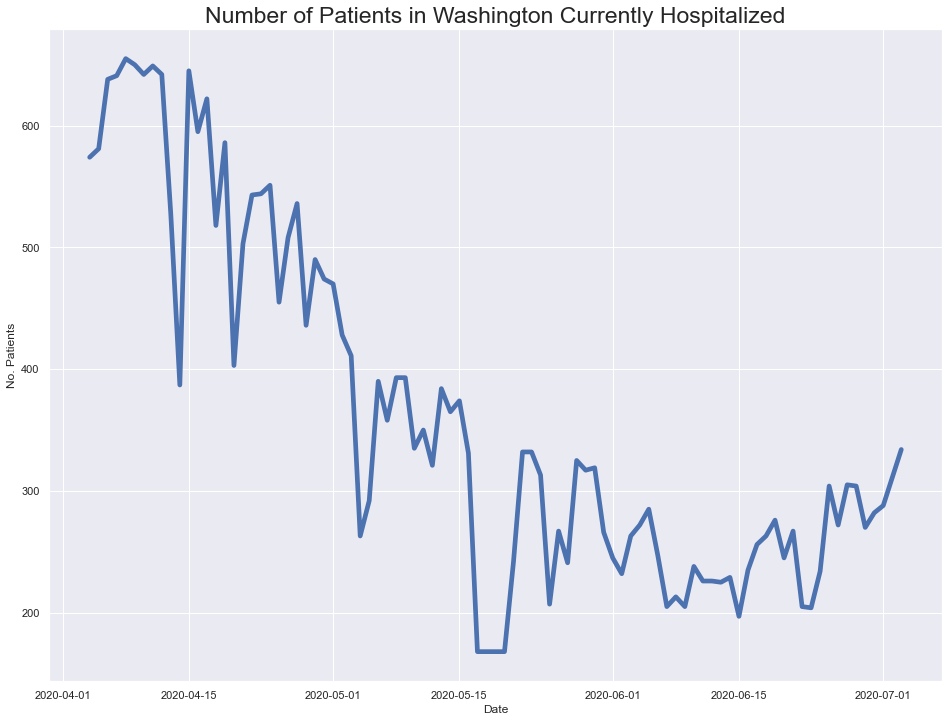

In [796]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wa.date, wa.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Washington Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

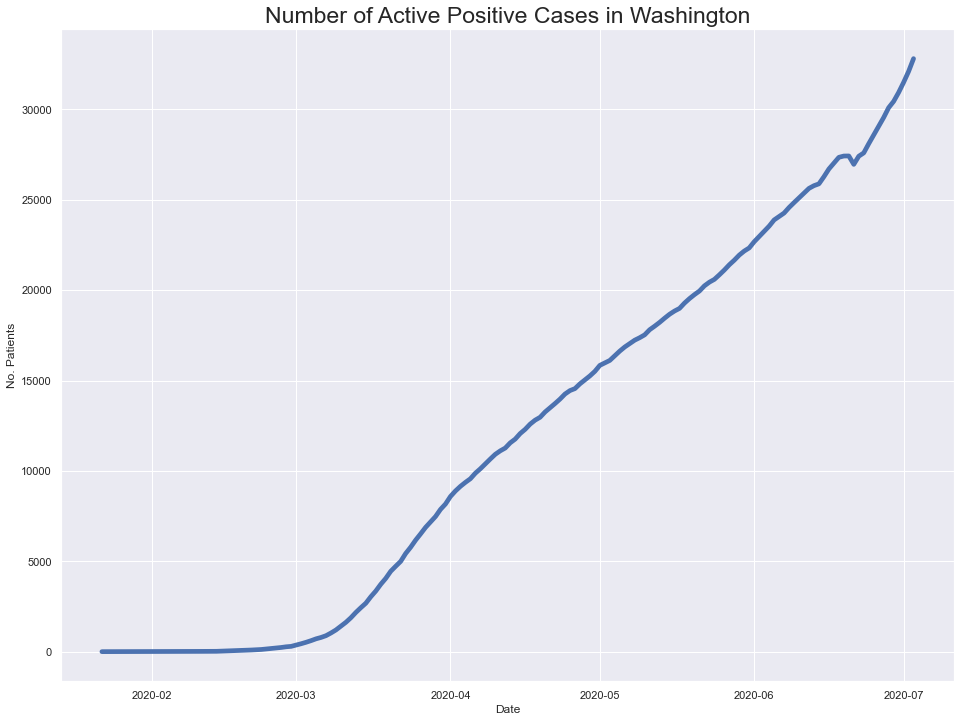

In [797]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wa.date, wa.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Washington', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

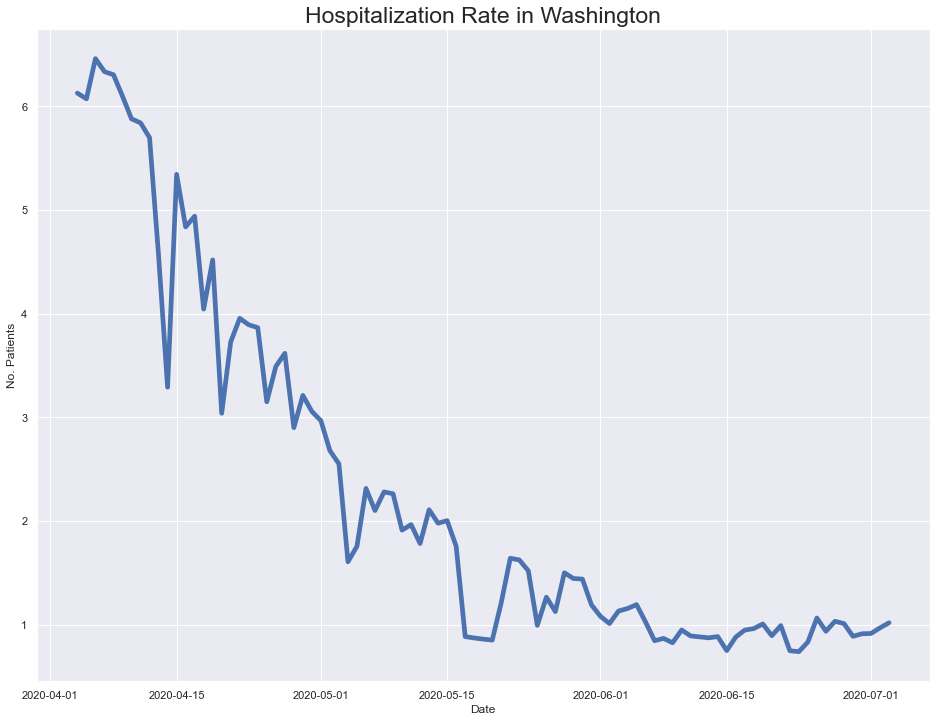

In [798]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wa.date, wa.hospitalizedCurrently/wa.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Washington', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

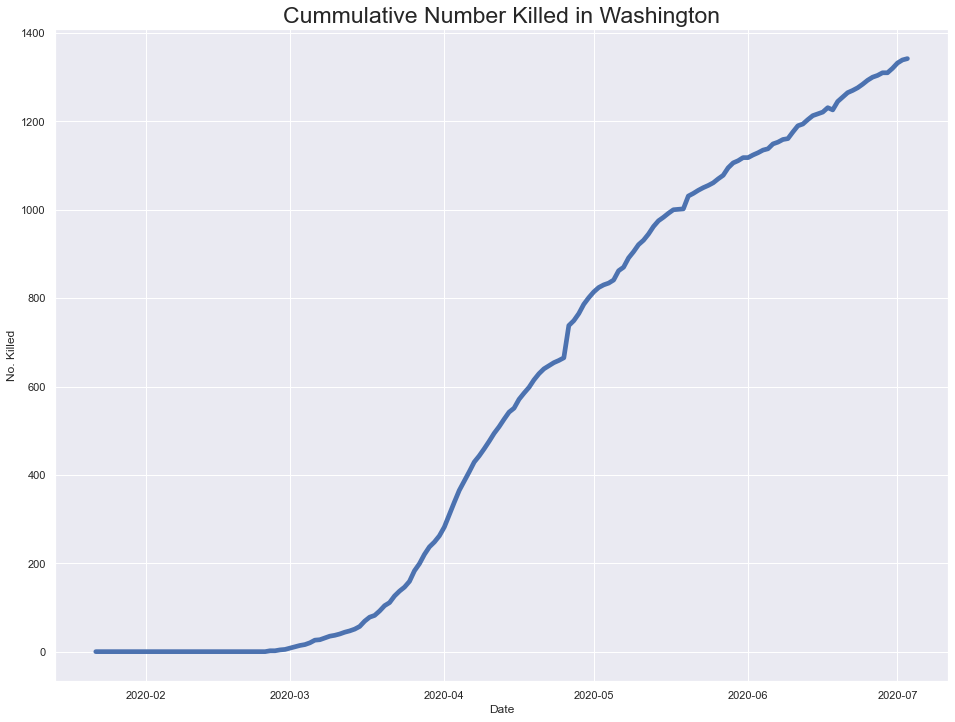

In [799]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wa.date, wa.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Washington', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [800]:
#hide_input
# Checking which cols have NaN values
wa[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
wa.head()

# Omit the NaN cols
wa = wa[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

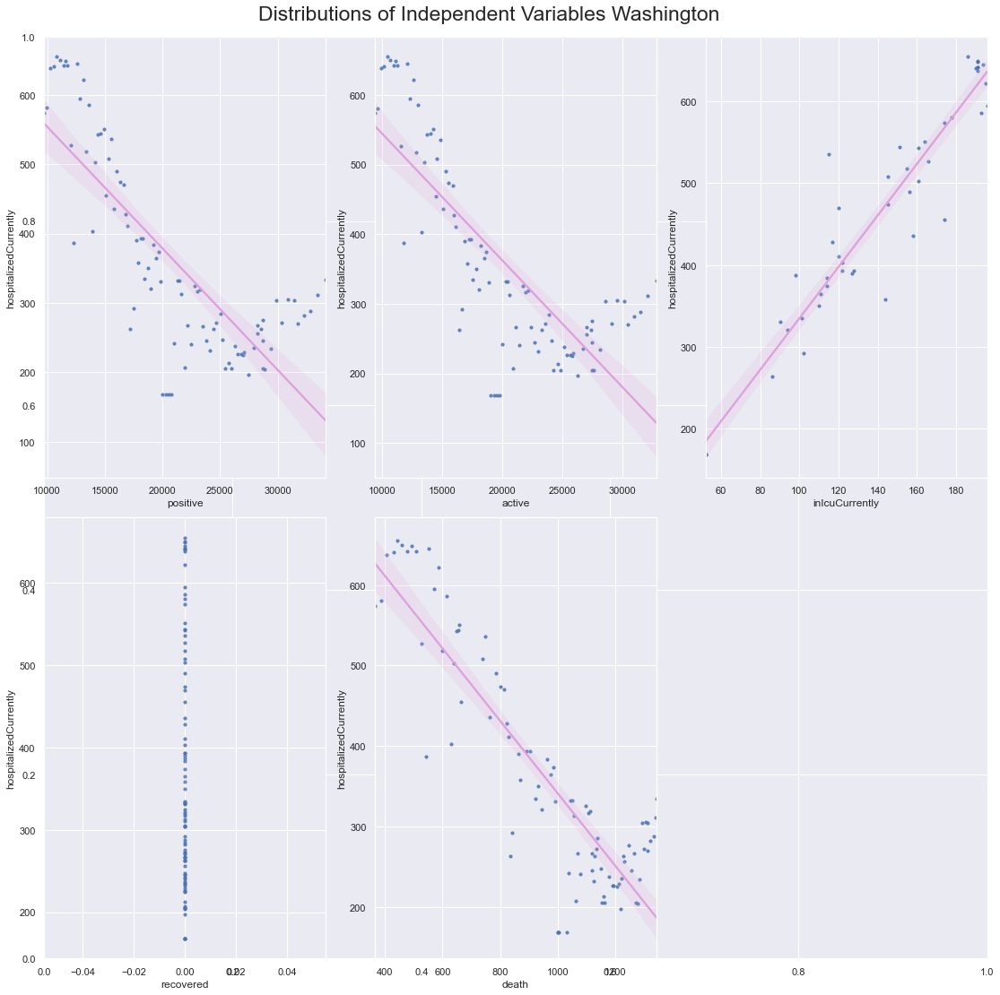

In [801]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_wa = wa.hospitalizedCurrently
indep_var_wa = wa.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_wa.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_wa[col], y=target_wa, data=indep_var_wa, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Washington', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [802]:
#hide_input
###endalabama

### West Virginia

In [803]:
#hide_input
wv = covid_df.loc[(covid_df['abbrev'] == 'WV') & (covid_df['state']== 'West Virginia')] 


Text(0, 0.5, 'No. Patients')

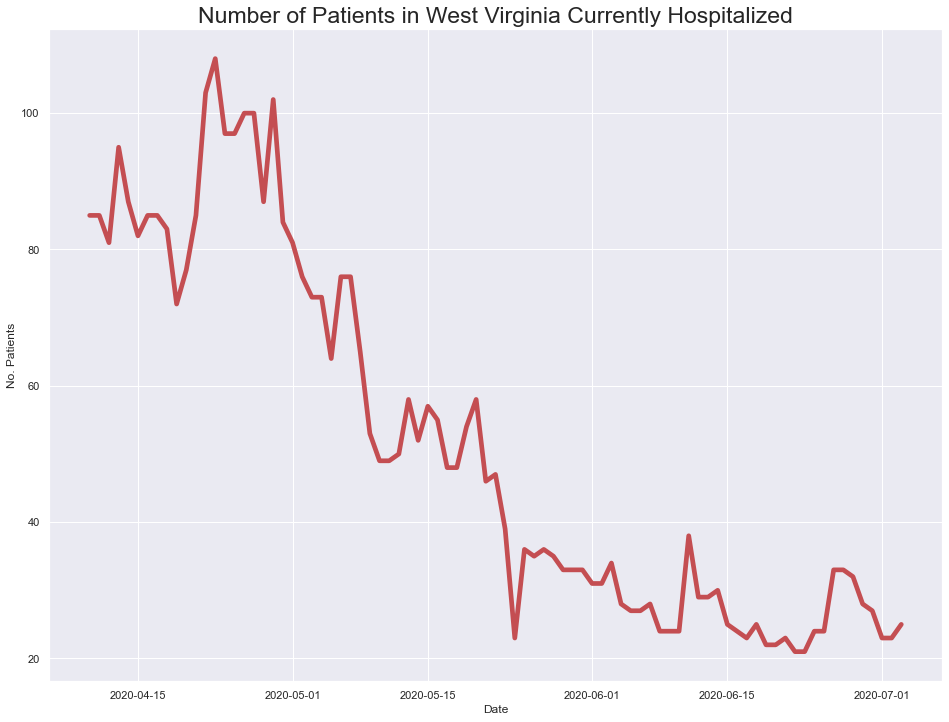

In [804]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wv.date, wv.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in West Virginia Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

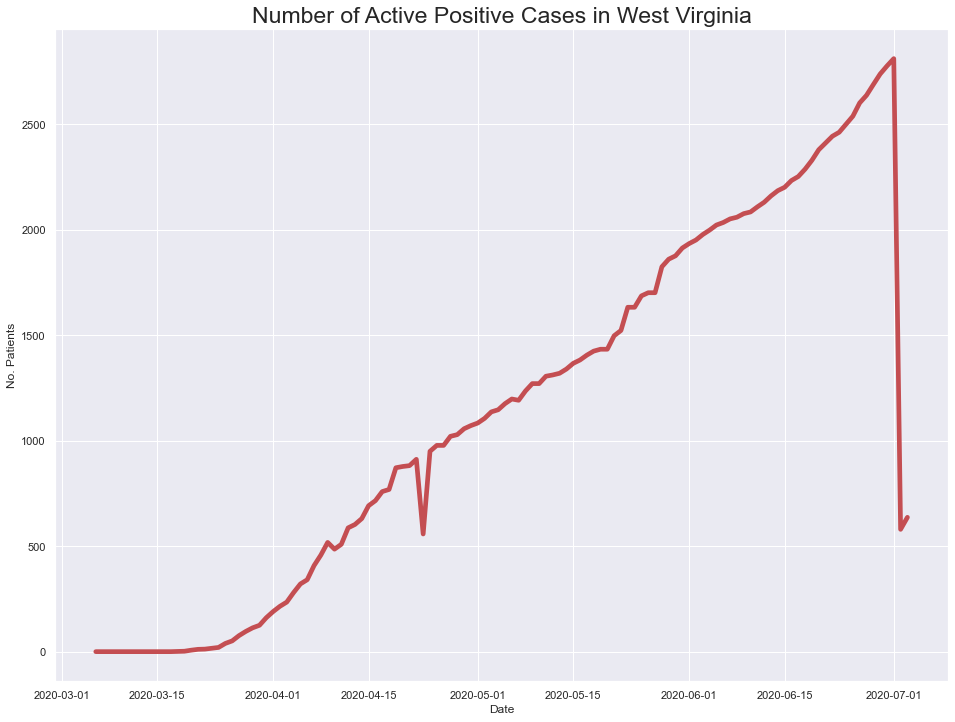

In [805]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wv.date, wv.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in West Virginia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

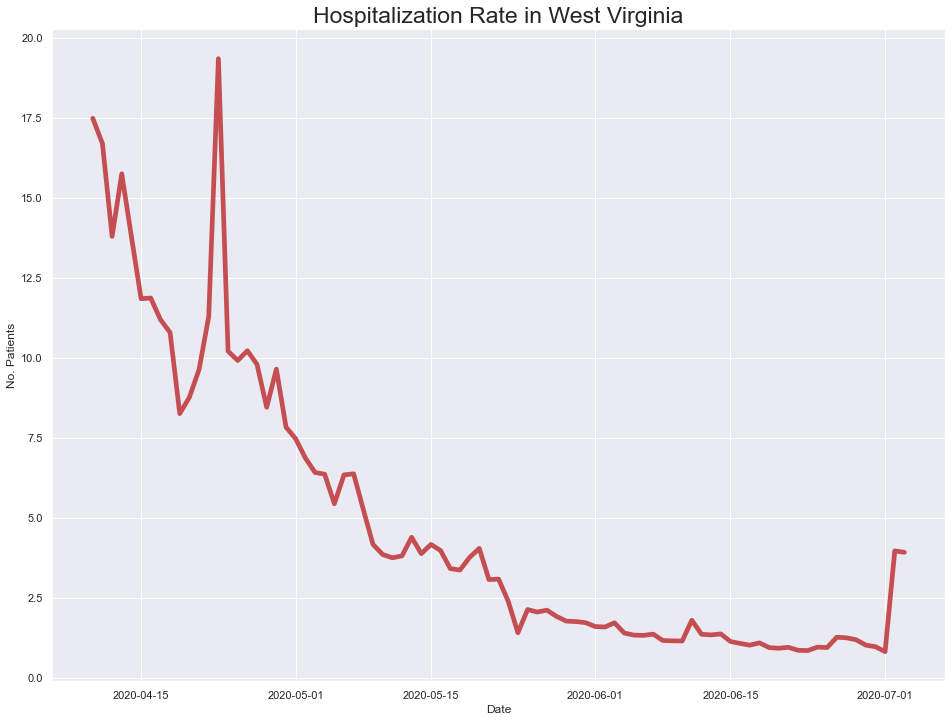

In [806]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wv.date, wv.hospitalizedCurrently/wv.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in West Virginia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

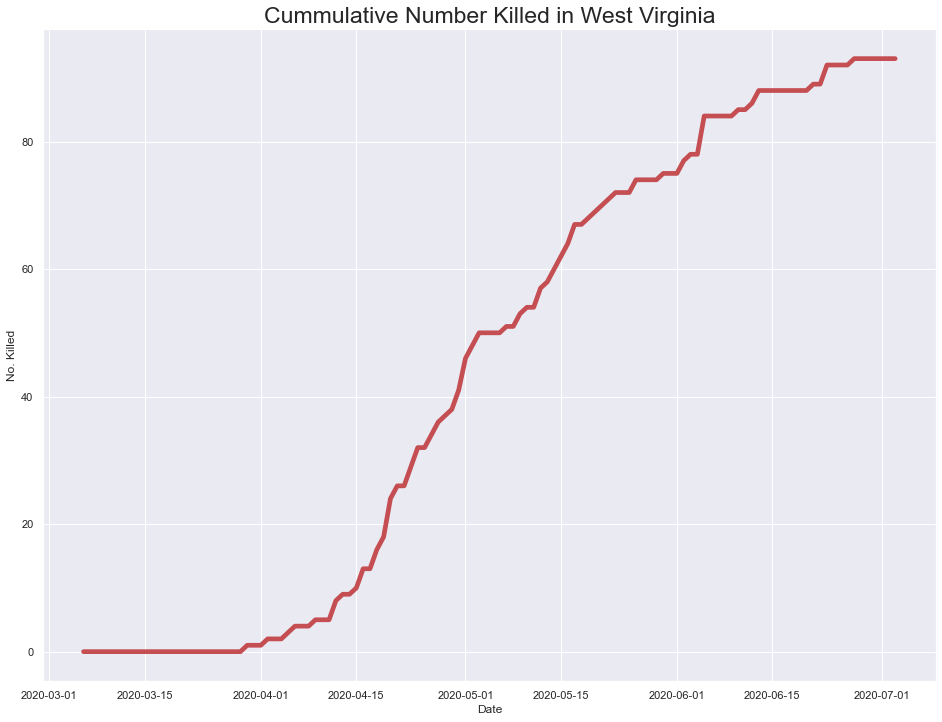

In [807]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wv.date, wv.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in West Virginia', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [808]:
#hide_input
# Checking which cols have NaN values
wv[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
wv.head()

# Omit the NaN cols
wv = wv[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

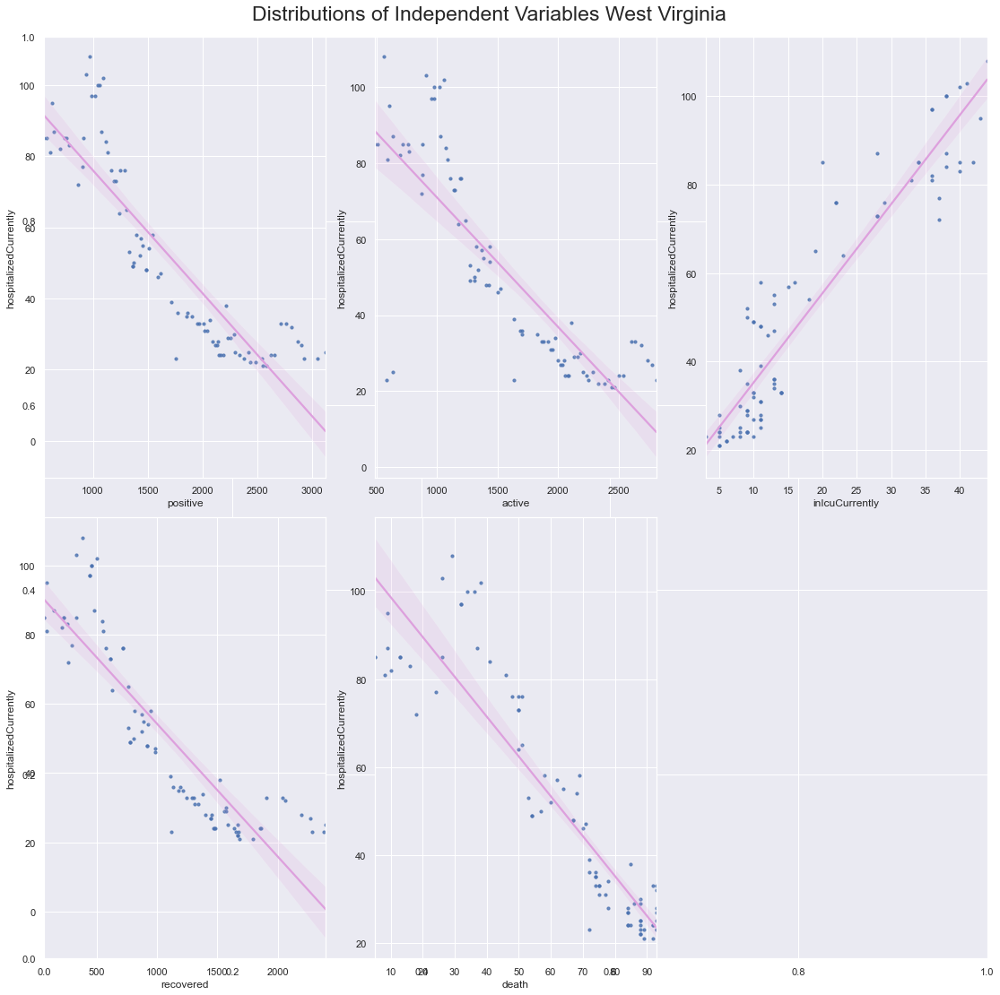

In [809]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_wv = wv.hospitalizedCurrently
indep_var_wv = wv.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_wv.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_wv[col], y=target_wv, data=indep_var_wv, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables West Virginia', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [810]:
#hide_input
###endwestvirginia

### Wisconsin

In [811]:
#hide_input
wi = covid_df.loc[(covid_df['abbrev'] == 'WI') & (covid_df['state']== 'Wisconsin')] 


Text(0, 0.5, 'No. Patients')

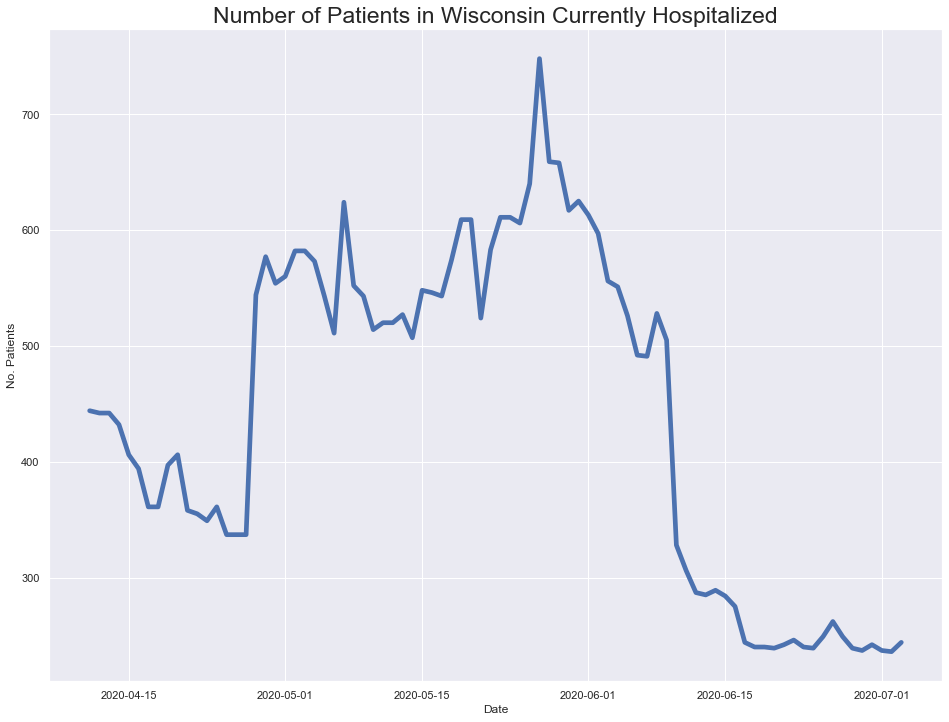

In [812]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wi.date, wi.hospitalizedCurrently, linewidth=4.7)
plt.title('Number of Patients in Wisconsin Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

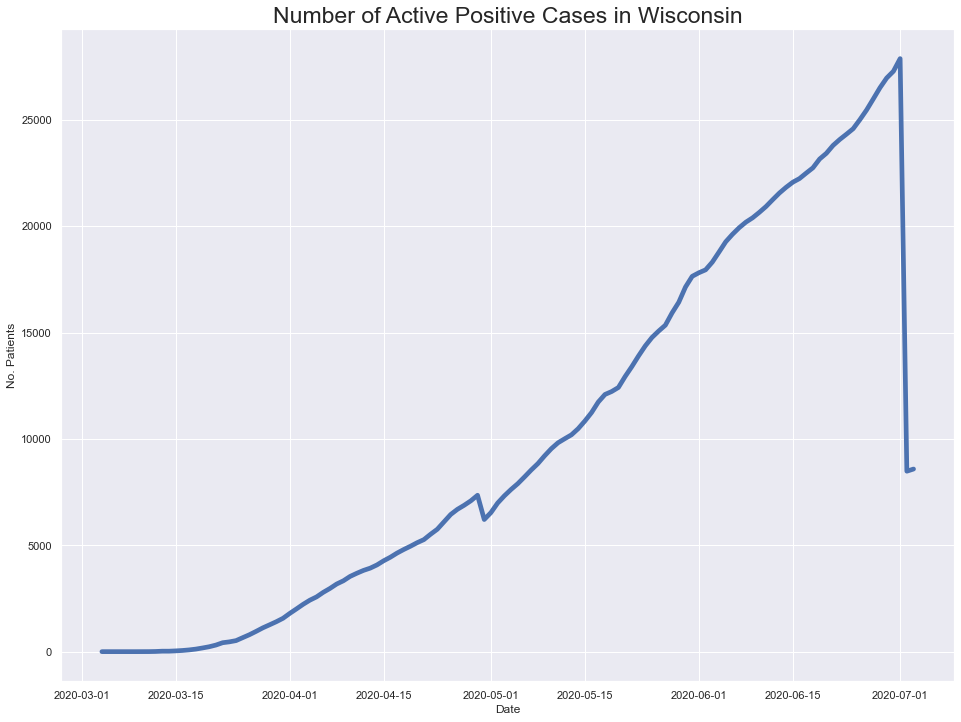

In [813]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wi.date, wi.active, linewidth=4.7)
plt.title('Number of Active Positive Cases in Wisconsin', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

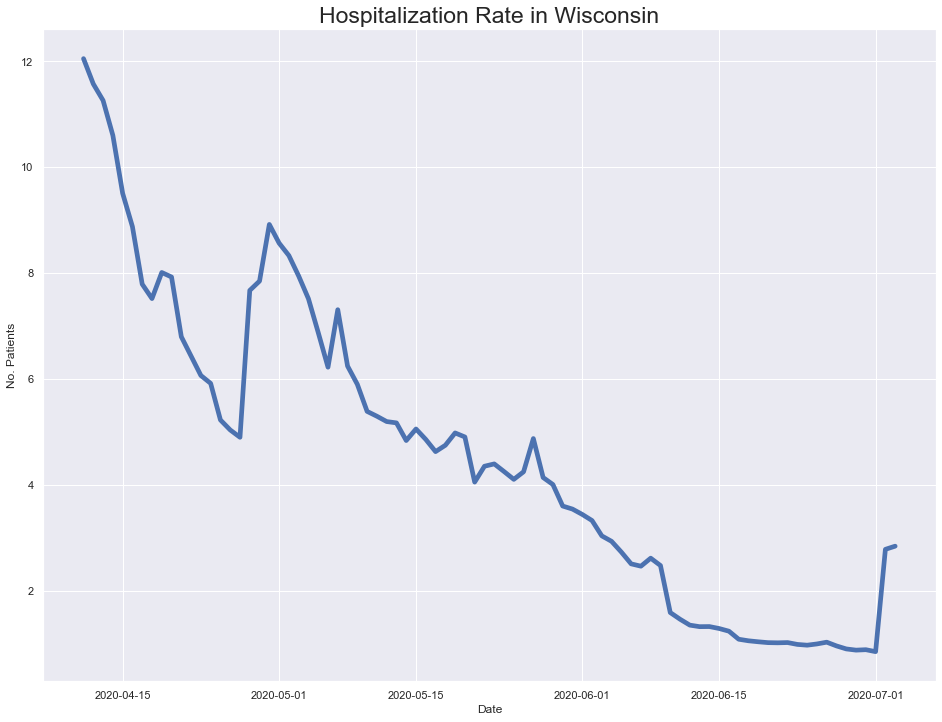

In [814]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wi.date, wi.hospitalizedCurrently/wi.active*100, linewidth=4.7)
plt.title('Hospitalization Rate in Wisconsin', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

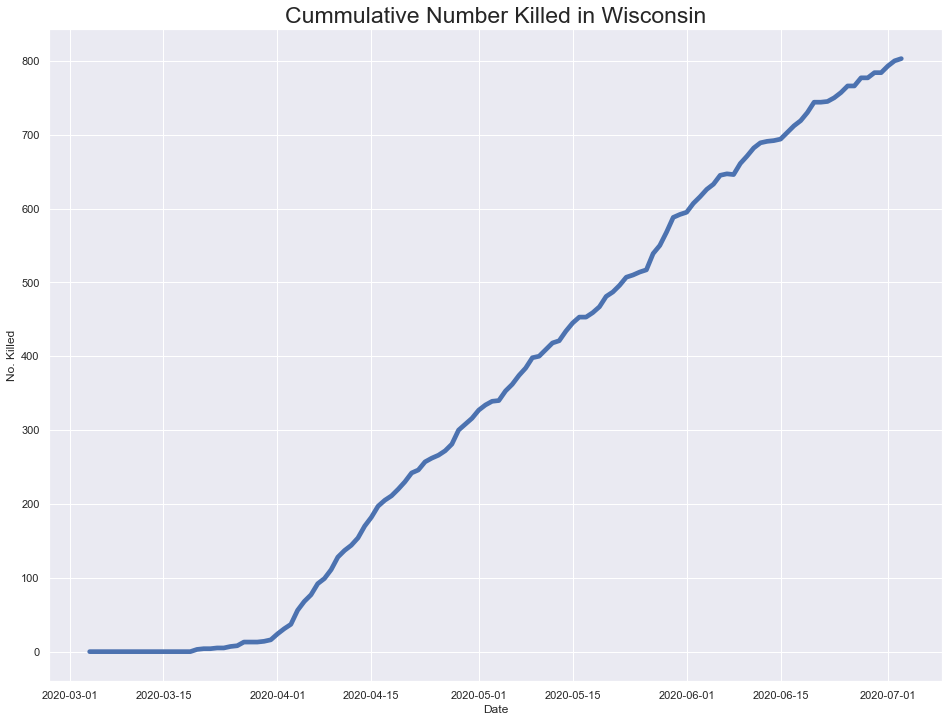

In [815]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wi.date, wi.death, linewidth=4.7)
plt.title('Cummulative Number Killed in Wisconsin', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [816]:
#hide_input
# Checking which cols have NaN values
wi[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
wi.head()

# Omit the NaN cols
wi = wi[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

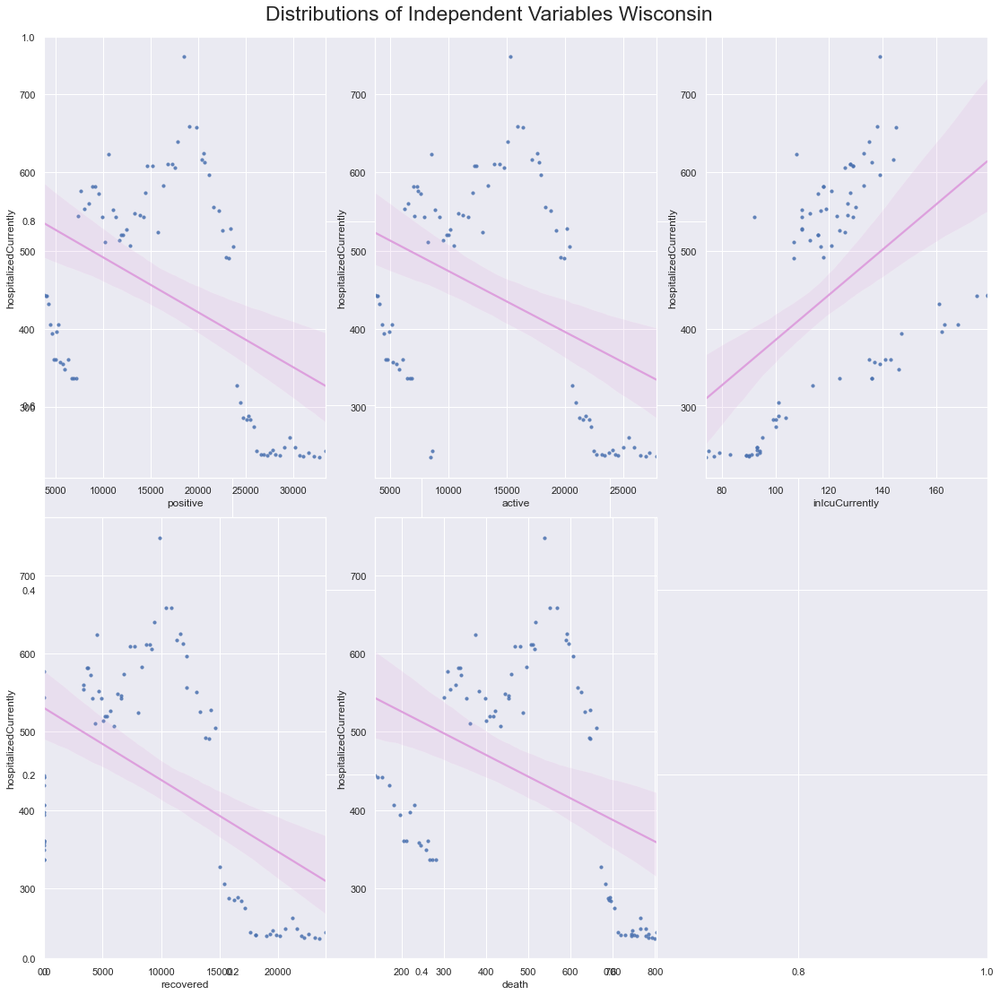

In [817]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_wi = wi.hospitalizedCurrently
indep_var_wi = wi.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_wi.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_wi[col], y=target_wi, data=indep_var_wi, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Wisconsin', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [818]:
#hide_input
###endwisconsin

### Wyoming

In [819]:
#hide_input
wy = covid_df.loc[(covid_df['abbrev'] == 'WY') & (covid_df['state']== 'Wyoming')] 


Text(0, 0.5, 'No. Patients')

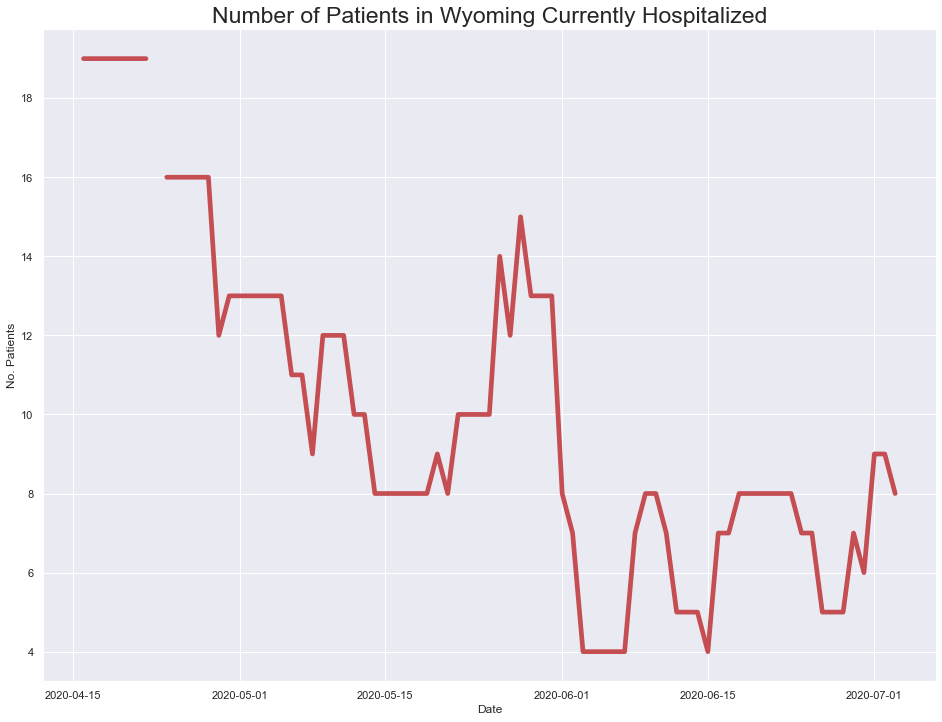

In [820]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wy.date, wy.hospitalizedCurrently, linewidth=4.7, color='r')
plt.title('Number of Patients in Wyoming Currently Hospitalized', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

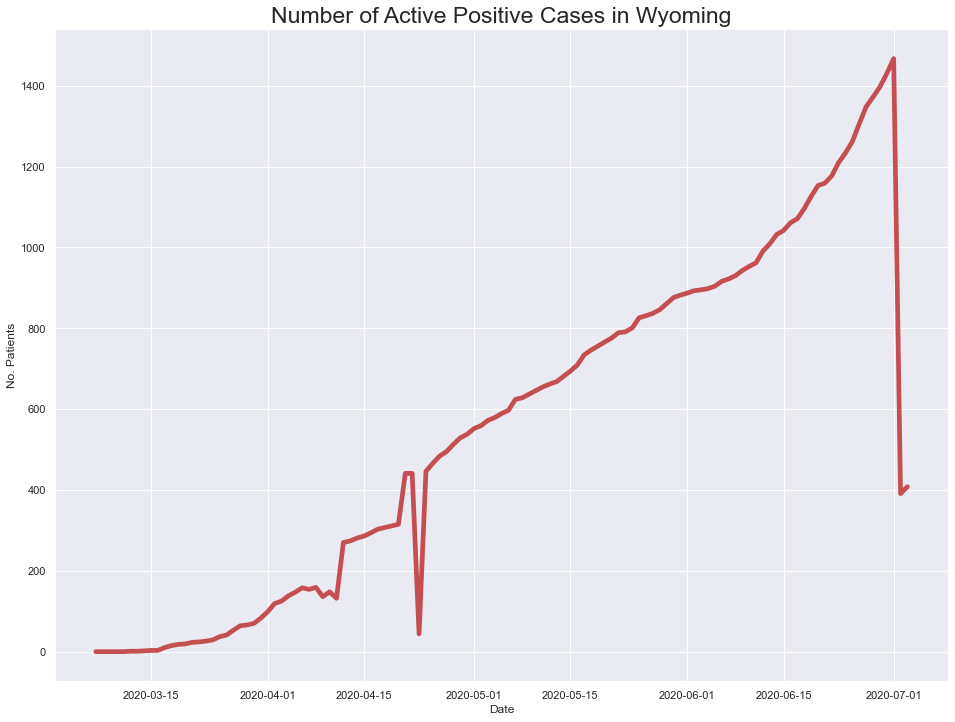

In [821]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wy.date, wy.active, linewidth=4.7, color='r')
plt.title('Number of Active Positive Cases in Wyoming', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Patients')

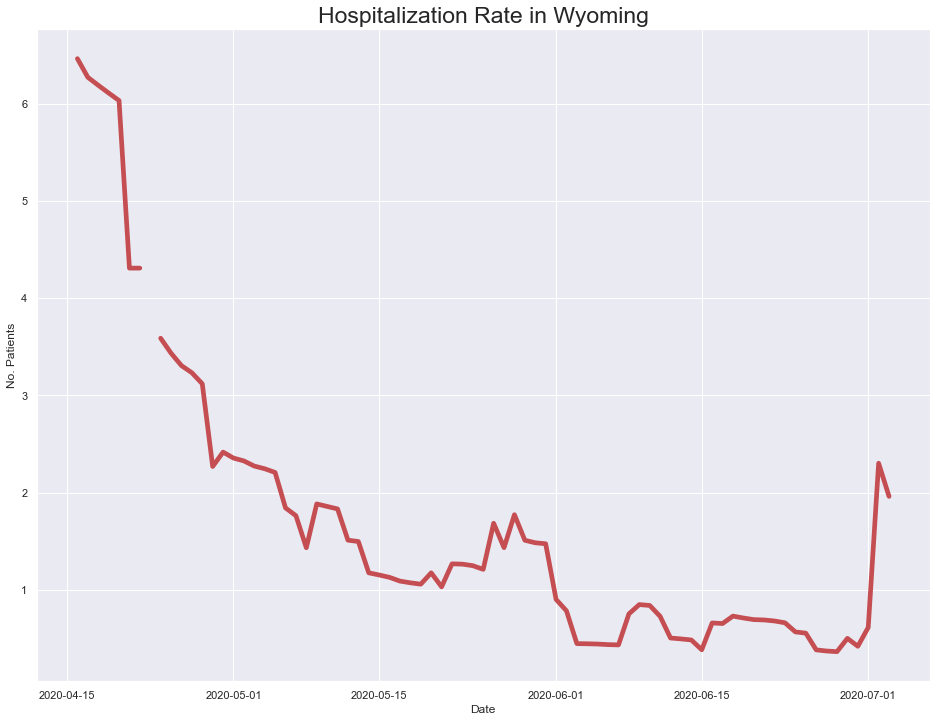

In [822]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wy.date, wy.hospitalizedCurrently/wy.active*100, linewidth=4.7, color='r')
plt.title('Hospitalization Rate in Wyoming', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Patients')

Text(0, 0.5, 'No. Killed')

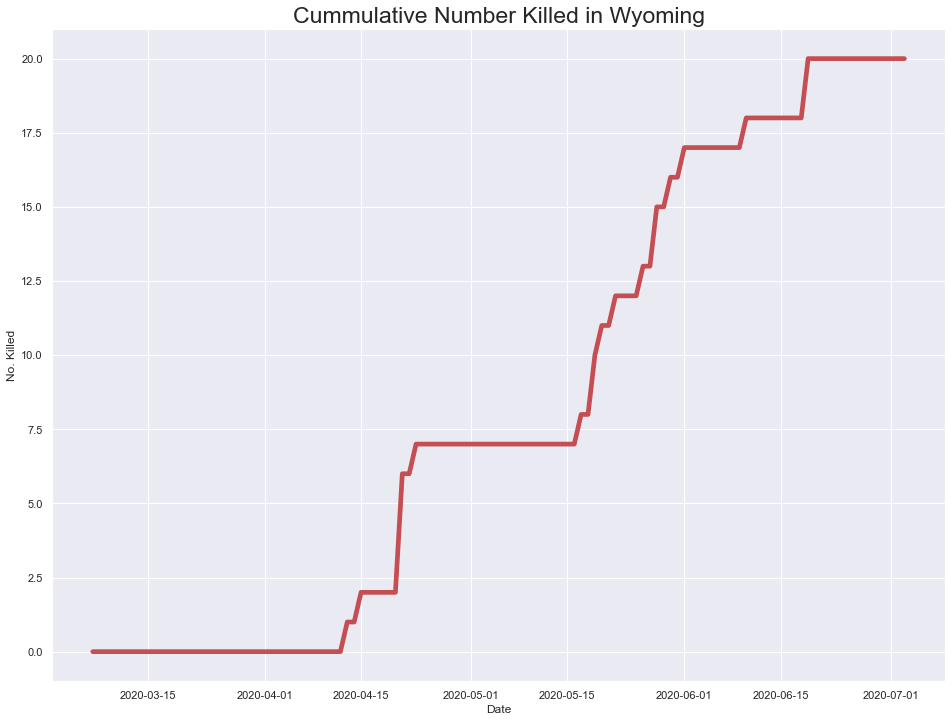

In [823]:
#hide_input
# TODO fix legend/axis/plot alltogether
# Timeseries plt
fig, ax = plt.subplots(figsize = (16, 12))
plt.plot(wy.date, wy.death, linewidth=4.7, color='r')
plt.title('Cummulative Number Killed in Wyoming', fontsize=23)
plt.xlabel('Date')
plt.ylabel('No. Killed')

In [824]:
#hide_input
# Checking which cols have NaN values
wy[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death', 'hospitalized']]
wy.head()

# Omit the NaN cols
wy = wy[['positive', 'active', 'hospitalizedCurrently', 'inIcuCurrently', 'recovered', 'death']]

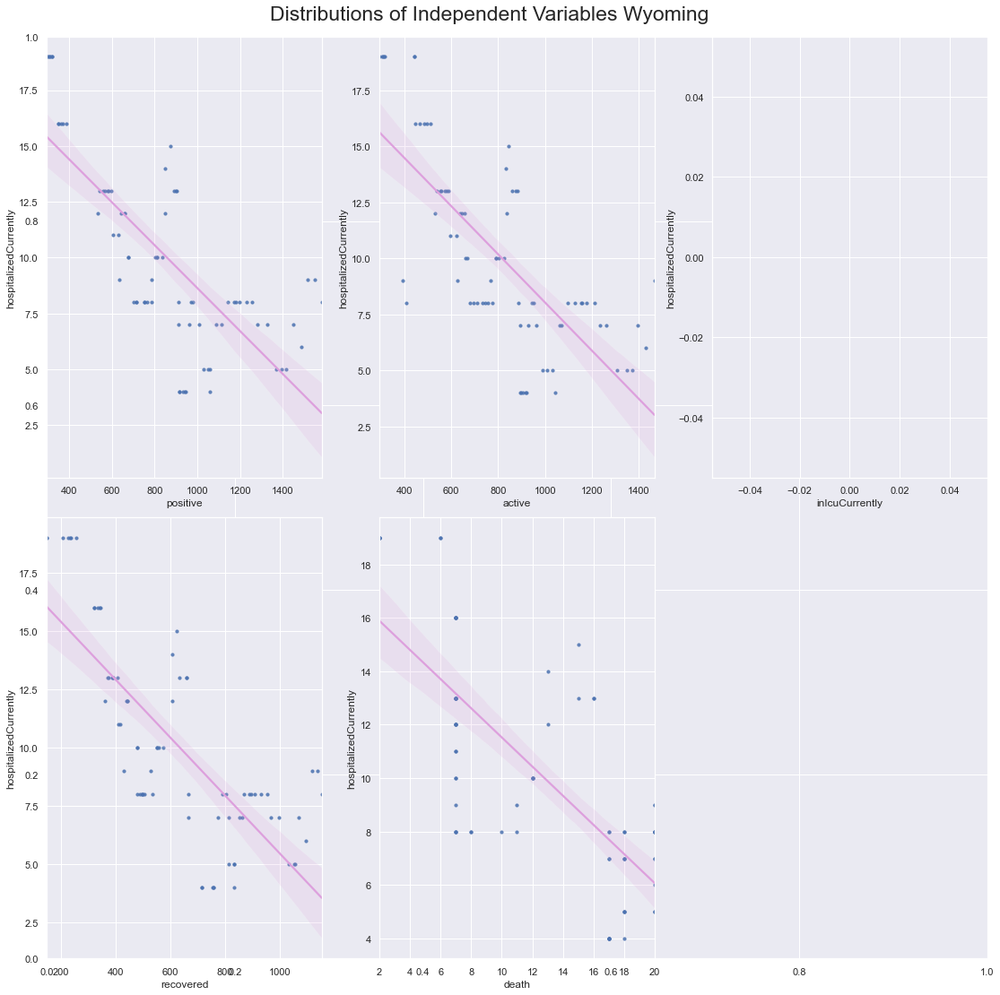

In [825]:
#hide_input
# Scatter plots AL
# Split dependent var from independent variables
target_wy = wy.hospitalizedCurrently
indep_var_wy = wy.drop(columns=['hospitalizedCurrently'])

fig, ax = plt.subplots(figsize = (16, 16))
for i, col in enumerate(indep_var_wy.columns):
    ax=fig.add_subplot(2, 3, i+1) 
    sns.regplot(x=indep_var_wy[col], y=target_wy, data=indep_var_wy, label=col, scatter_kws={'s':10}, line_kws={"color": "plum"})
    plt.suptitle('Distributions of Independent Variables Wyoming', fontsize=23)
plt.tight_layout()
fig.subplots_adjust(top=0.95)

In [826]:
#hide_input
###endwyoming

## Assessing Correlation of Independent Variables

In [827]:
# TODO add some explanation / look more into collinear variables

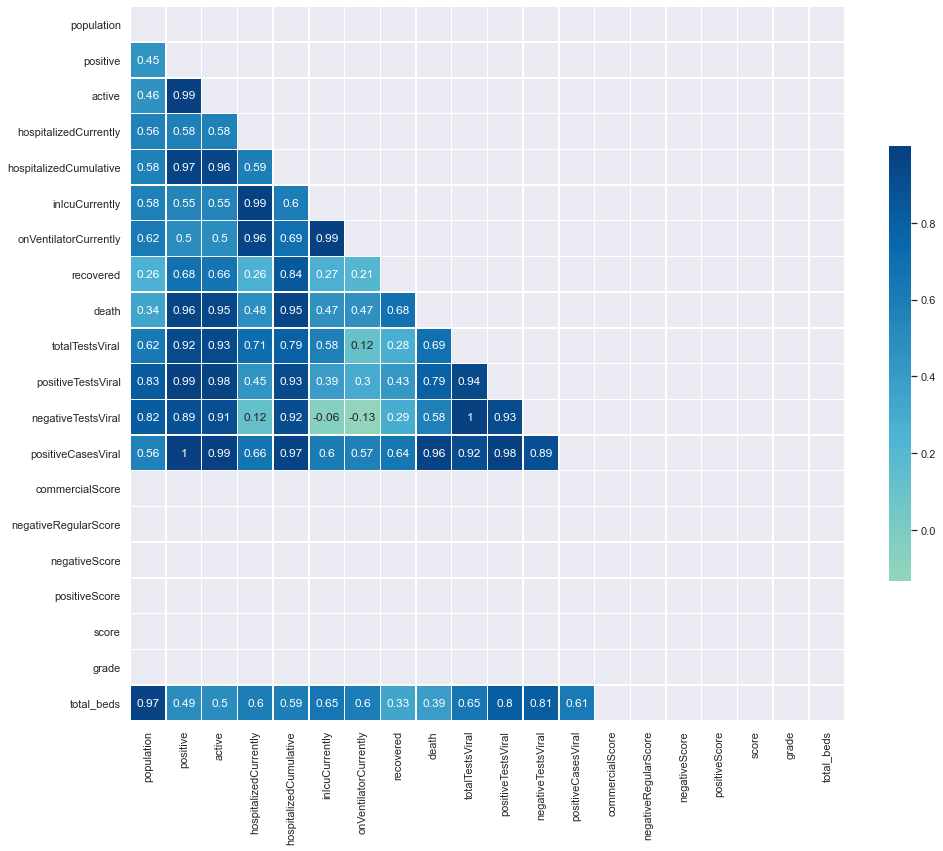

In [828]:
# Heatmap of correlations
# Save correlations to variable
corr = covid_cleaned.corr(method='pearson')
# We can create a mask to not show duplicate values
mask = np.triu(np.ones_like(corr, dtype=np.bool))
# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(16,16))

# Generate heatmap
sns.heatmap(corr, annot=True, mask=mask, cmap='GnBu', center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Build model for dependent Variable 
- To be used to predict current hospitalizations
- Having more complete variables for in ICU currently and on Ventilator Currently will allow us to predict these numbers as well.

In [829]:
# We compare three models:
# - Polynomial Regression
# - Linear Regression
# - ElasticNet

# Copy DFs to not mess up original one
# We will use model_df for our regression model
model_df = all_cases.copy()

# Delete redundant rows
for row in ['abbrev', 'bedsPerThousand', 'hospitalized', 
'state', 'hospitalizedCumulative', 'dataQualityGrade', 'lastUpdateEt']:
    del model_df[row]

# Drop NaN values for hospitalizedCurrently
model_df = model_df.dropna(subset=['hospitalizedCurrently'])

# Drop Values with abnormal active-hospitalised ratios (outside Conf. Interval)
model_df['ratio_hospital'] = model_df['hospitalizedCurrently'] / model_df['active']
model_df = model_df[~(model_df['ratio_hospital'] >= model_df.ratio_hospital.quantile(0.99))]

#model_df = model_df[~(model_df['ratio_hospital'] <= model_df['ratio_hospital'].median())]
del model_df['ratio_hospital']

# Get peek of model to use
model_df.describe()

,population,positive,active,hospitalizedCurrently,inIcuCurrently,onVentilatorCurrently,recovered,death,totalTestsViral,positiveTestsViral,negativeTestsViral,positiveCasesViral,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade,total_beds
count,4016.000,4016.000,4016.000,4016.000,2003.000,1742.000,4016.000,4016.000,1330.000,443.000,448.000,2865.000,4016.000,4016.000,4016.000,4016.000,4016.000,0.000,4016.000
mean,6599959.463,32056.054,29434.070,972.991,431.098,213.277,7421.054,1691.020,407045.865,26715.413,266489.357,36657.264,0.000,0.000,0.000,0.000,0.000,nan,15743.010
std,7580186.713,56930.101,52375.376,1867.806,705.513,322.794,13907.212,3589.041,578843.972,26788.099,249374.376,61167.272,0.000,0.000,0.000,0.000,0.000,nan,16214.148
min,567025.000,115.000,113.000,1.000,1.000,0.000,0.000,0.000,2857.000,407.000,8648.000,396.000,0.000,0.000,0.000,0.000,0.000,nan,1318.928
25%,1778070.000,3253.000,3050.000,103.000,75.000,32.000,35.000,89.000,72778.750,4150.000,66084.000,6277.000,0.000,0.000,0.000,0.000,0.000,nan,3773.952
50%,4499692.000,12498.500,11350.000,390.500,165.000,90.000,1513.000,459.000,213753.000,14498.000,186700.000,16661.000,0.000,0.000,0.000,0.000,0.000,nan,11557.920
75%,7797095.000,35407.250,32086.000,927.500,430.000,228.000,6783.750,1506.500,499122.500,46468.000,380138.250,40786.000,0.000,0.000,0.000,0.000,0.000,nan,19124.737
max,39937489.000,395872.000,553611.000,18825.000,5225.000,2425.000,93572.000,24885.000,4448176.000,89648.000,1036090.000,395872.000,0.000,0.000,0.000,0.000,0.000,nan,71887.480


In [830]:
###@rygomez